## Loading Env

In [1]:
%load_ext autoreload
%autoreload 2

import pandas as pd
import torch
import tabensemb
import tabensemb.utils
tabensemb.utils.global_palette = ["#f3b45f", "#b6dd95", "#a8cae0", "#eca3b5", "#5892C4"] + tabensemb.utils.global_palette

import os
tabensemb.setting["matplotlib_usetex"] = False
tabensemb._stream_filters = ["DeprecationWarning", "Deprecated"]

from src.trainer import FatigueTrainer
from tabensemb.trainer import load_trainer, save_trainer
import matplotlib.pyplot as plt
import matplotlib
import numpy as np

device = "cuda" if torch.cuda.is_available() else "cpu"

if not os.path.exists("output/analyse/paper_plots"):
    configfile = "composite_test"
    trainer = FatigueTrainer(device=device, project="analyse")
    trainer.load_config(
        configfile,
        manual_config={
            "data_splitter": "RandomSplitter",
        },
    )
    trainer.load_data()
    save_trainer(trainer)
    os.rename(trainer.project_root, "output/analyse/paper_plots")
    print(f"Create a new trainer at 'output/analyse/paper_plots'")
    trainer.set_path("output/analyse/paper_plots")
else:
    trainer = load_trainer("output/analyse/paper_plots/trainer.pkl")
    print(f"Previous one is loaded")

Previous one is loaded


In [2]:
matplotlib.rcParams['font.family'] = "sans-serif"
matplotlib.rcParams["font.sans-serif"] = "Arial"

In [3]:
feature_name_mapping = {
    "Fiber Volume Fraction": r"$V$",
    "Fiber Weight Fraction": r"$W_{\mathrm{all}}$",
    "Fiber Weight Fraction (0-deg)": r"$W_{0}$",
    "Fiber Weight Fraction (45-deg)": r"$W_{45}$",
    "Fiber Weight Fraction (90-deg)": r"$W_{90}$",
    "Fiber Weight Fraction (Other Dir.)": r"$W_{\mathrm{other}}$",
    "Thickness": r"$T_{\mathrm{load}}$",
    "Tab Thickness": r"$T_{\mathrm{tab}}$",
    "Width": r"$\omega$",
    "Length": r"$L_{\mathrm{total}}$",
    "Load Length": r"$L_{\mathrm{load}}$",
    "Area": r"$A$",
    "Maximum Stress": r"$\sigma_{\max}$",
    "Minimum Stress": r"$\sigma_{\min}$",
    "Maximum Strain": r"$\epsilon_{\max}$",
    "Minimum Strain": r"$\epsilon_{\min}$",
    "R-value": r"$R$",
    "Frequency": r"$f$",
    "Ultimate Tensile Stress": r"$\sigma_{\mathrm{UT}}$",
    "Ultimate Compressive Stress": r"$\sigma_{\mathrm{UC}}$",
    "Tensile Modulus": r"$E_{\mathrm{T}}$",
    "Compressive Modulus": r"$E_{\mathrm{C}}$",
    "Ultimate Tensile Strain": r"$\epsilon_{\mathrm{UT}}$",
    "Ultimate Compressive Strain": r"$\epsilon_{\mathrm{UC}}$",
    "Resin Type": r"$RT$",
    "log10(Cycles to Failure)": r"lg$N$",
    "Relative Stress Amplitude": r"$\sigma_a^r$",
    "Relative Maximum Stress": r"$\sigma_{\max}^r$",
    "Relative Mean Stress": r"$\sigma_{\mathrm{mean}}^r$",
}

def rep_func(x, mapping):
        if x in mapping.keys():
            x = mapping[x]
        else:
            for i in mapping.keys():
                x = x.replace(i, mapping[i])
        return x

def replace_feature_names(ax, process_x=True, process_y=True, set_title=False, special_mapping:dict=None):
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()
    feature_name_mapping_ = feature_name_mapping.copy()
    if special_mapping is not None:
        feature_name_mapping_.update(special_mapping)
    
    xticklabels = [rep_func(x.get_text(), feature_name_mapping_) for x in ax.get_xticklabels()]
    yticklabels = [rep_func(x.get_text(), feature_name_mapping_) for x in ax.get_yticklabels()]

    if process_x:
        ax.set_xticks(ax.get_xticks())
        ax.set_xticklabels(xticklabels)
        xlabel = str(ax.get_xlabel())
        ax.set_xlabel(rep_func(xlabel, feature_name_mapping_))
    if process_y:
        ax.set_yticks(ax.get_yticks())
        ax.set_yticklabels(yticklabels)
        ylabel = str(ax.get_ylabel())
        ax.set_ylabel(rep_func(ylabel, feature_name_mapping_))
    if set_title:
        title = ax.get_title()
        title = title if title not in feature_name_mapping_.keys() else feature_name_mapping_[title]
        ax.set_title(title)
    ax.set_xlim(*xlim)
    ax.set_ylim(*ylim)
    
def set_linewidth(ax, width=0.5):
    [i.set_linewidth(width) for i in ax.spines.values()]
    ax.xaxis.set_tick_params(width=width)
    ax.yaxis.set_tick_params(width=width)
    ax.xaxis.set_tick_params(width=width, which="minor")
    ax.yaxis.set_tick_params(width=width, which="minor")
    
    
def replace_legend_labels(ax, mapping, legend_kwargs):
    handles, labels = ax.get_legend().legendHandles, [x.get_text() for x in ax.get_legend().texts]
    labels = [rep_func(x, mapping) for x in labels]
    ax.legend(handles, labels, **legend_kwargs)
    
# https://stackoverflow.com/questions/37765197/darken-or-lighten-a-color-in-matplotlib
def lighten_color(color, amount=0.5):
    """
    Lightens the given color by multiplying (1-luminosity) by the given amount.
    Input can be matplotlib color string, hex string, or RGB tuple.

    Examples:
    >> lighten_color('g', 0.3)
    >> lighten_color('#F034A3', 0.6)
    >> lighten_color((.3,.55,.1), 0.5)
    """
    import matplotlib.colors as mc
    import colorsys
    try:
        c = mc.cnames[color]
    except:
        c = color
    c = colorsys.rgb_to_hls(*mc.to_rgb(c))
    return colorsys.hls_to_rgb(c[0], 1 - amount * (1 - c[1]), c[2])


def voronoi_1d(points):
    points = np.array(points).flatten()
    sorted_points = np.sort(points)
    edges = np.array(
        [
            (sorted_points[i] + sorted_points[i + 1]) / 2
            for i in range(len(sorted_points[:-1]))
        ]
    )
    return edges


def voronoi_plot_1d(edges, ax, direction, line_alpha, line_width, line_color):
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()
    for edge in edges:
        if direction == "v":
            ax.plot(
                [edge] * 2,
                ylim,
                color=line_color,
                linewidth=line_width,
                alpha=line_alpha,
            )
        elif direction == "h":
            ax.plot(
                xlim,
                [edge] * 2,
                color=line_color,
                linewidth=line_width,
                alpha=line_alpha,
            )

from functools import reduce
from tabensemb.utils import update_defaults_by_kwargs

def trim3d(x, y, z, ax3, xlim=None, ylim=None, zlim=None, step=0.1):
    n = max([int((np.max(x)-np.min(x))/step), int((np.max(y)-np.min(y))/step), int((np.max(z)-np.min(z))/step), 10000])
    x = np.linspace(x[0], x[-1], n)
    y = np.linspace(y[0], y[-1], n)
    z = np.linspace(z[0], z[-1], n)
    xlim = ax3.get_xlim() if xlim is None else xlim
    ylim = ax3.get_ylim() if ylim is None else ylim
    zlim = ax3.get_zlim() if zlim is None else zlim
    # lower limit
    x_lower_idx = np.where(x<xlim[0])[0]
    x_higher_idx = np.where(x>xlim[1])[0]
    y_lower_idx = np.where(y<ylim[0])[0]
    y_higher_idx = np.where(y>ylim[1])[0]
    z_lower_idx = np.where(z<zlim[0])[0]
    z_higher_idx = np.where(z>zlim[1])[0]
    removed_idx = reduce(lambda x, y: np.union1d(x, y), [x_lower_idx, x_higher_idx, y_lower_idx, y_higher_idx, z_lower_idx, z_higher_idx])
    if len(removed_idx) == 0:
        return [x[0], x[-1]], [y[0], y[-1]], [z[0], z[-1]]
    retained = np.setdiff1d(np.arange(len(x)), removed_idx)
    if len(retained) == 0:
        return [], [], []
    min_idx, max_idx = np.min(retained), np.max(retained)
    x = [x[min_idx], x[max_idx]]
    y = [y[min_idx], y[max_idx]]
    z = [z[min_idx], z[max_idx]]
    return x, y, z
    

def voronoi_plot_2d_to_3d(vor, ax3, z, plot_kwargs=None, surface_along_zdir=False, surface_kwargs=None):
    plot_kwargs = update_defaults_by_kwargs(dict(c="k"), plot_kwargs)
    center = vor.points.mean(axis=0)
    ptp_bound = vor.points.ptp(axis=0)
    for pointidx, simplex in zip(vor.ridge_points, vor.ridge_vertices):
        simplex = np.asarray(simplex)
        if np.all(simplex >= 0):
            _x, _y, _z = trim3d(vor.vertices[simplex][:, 0], vor.vertices[simplex][:, 1], np.ones(len(simplex))*z, ax3)
            ax3.plot(_x, _y, _z, **plot_kwargs)
        else:
            i = simplex[simplex >= 0][0]  # finite end Voronoi vertex
            t = vor.points[pointidx[1]] - vor.points[pointidx[0]]  # tangent
            t /= np.linalg.norm(t)
            n = np.array([-t[1], t[0]])  # normal
            midpoint = vor.points[pointidx].mean(axis=0)
            direction = np.sign(np.dot(midpoint - center, n)) * n
            if (vor.furthest_site):
                direction = -direction
            far_point = vor.vertices[i] + direction * ptp_bound.max()
            _x, _y, _z = trim3d([vor.vertices[i][0], far_point[0]], [vor.vertices[i][1], far_point[1]], [z, z], ax3)
            ax3.plot(_x, _y, _z, **plot_kwargs)
        if surface_along_zdir:
            zlim = ax3.get_zlim()
            ax3.plot_surface(np.array([_x, _x]), np.array([_y, _y]), np.array([[zlim[0], zlim[0]], [zlim[1], zlim[1]]]), **surface_kwargs)

def trim(x, y, xlim, ylim, step=0.1):
    n = max([int((np.max(x)-np.min(x))/step), int((np.max(y)-np.min(y))/step), 10000])
    x = np.linspace(x[0], x[-1], n)
    y = np.linspace(y[0], y[-1], n)
    # lower limit
    x_lower_idx = np.where(x<xlim[0])[0]
    x_higher_idx = np.where(x>xlim[1])[0]
    y_lower_idx = np.where(y<ylim[0])[0]
    y_higher_idx = np.where(y>ylim[1])[0]
    removed_idx = reduce(lambda x, y: np.union1d(x, y), [x_lower_idx, x_higher_idx, y_lower_idx, y_higher_idx])
    if len(removed_idx) == 0:
        return [x[0], x[-1]], [y[0], y[-1]]
    retained = np.setdiff1d(np.arange(n), removed_idx)
    if len(retained) == 0:
        return [], []
    min_idx, max_idx = np.min(retained), np.max(retained)
    x = [x[min_idx], x[max_idx]]
    y = [y[min_idx], y[max_idx]]
    return x, y

# voronoi_plot_2d with trim
def voronoi_plot_2d_trim(vor, ax, xlim, ylim, plot_kwargs=None):
    plot_kwargs = update_defaults_by_kwargs(dict(c="k"), plot_kwargs)
    center = vor.points.mean(axis=0)
    ptp_bound = vor.points.ptp(axis=0)
    for pointidx, simplex in zip(vor.ridge_points, vor.ridge_vertices):
        simplex = np.asarray(simplex)
        if np.all(simplex >= 0):
            ax.plot(*trim(vor.vertices[simplex][:, 0], vor.vertices[simplex][:, 1], xlim, ylim), **plot_kwargs)
        else:
            i = simplex[simplex >= 0][0]  # finite end Voronoi vertex
            t = vor.points[pointidx[1]] - vor.points[pointidx[0]]  # tangent
            t /= np.linalg.norm(t)
            n = np.array([-t[1], t[0]])  # normal
            midpoint = vor.points[pointidx].mean(axis=0)
            direction = np.sign(np.dot(midpoint - center, n)) * n
            if (vor.furthest_site):
                direction = -direction
            far_point = vor.vertices[i] + direction * ptp_bound.max()
            ax.plot(*trim([vor.vertices[i][0], far_point[0]], [vor.vertices[i][1], far_point[1]], xlim, ylim), **plot_kwargs)

def multiply_yticklabels(ax, times=100, decimal=0):
    ax.set_yticks(ax.get_yticks())
    yticklabels = [round(float(x.get_text().replace(u'\u2212','-'))*times, decimal) if decimal != 0 else int(float(x.get_text().replace(u'\u2212','-'))*times) for x in ax.get_yticklabels()]
    ax.set_yticklabels(yticklabels)

def multiply_xticklabels(ax, times=100, decimal=0):
    ax.set_xticks(ax.get_xticks())
    xticklabels = [round(float(x.get_text().replace(u'\u2212','-'))*times, decimal) if decimal != 0 else int(float(x.get_text().replace(u'\u2212','-'))*times) for x in ax.get_xticklabels()]
    ax.set_xticklabels(xticklabels)

def to_scientific_notation(x, fmt="%1.2e"):
    s = fmt % x
    decimal_point = '.'
    positive_sign = '+'
    tup = s.split('e')
    significand = tup[0].rstrip(decimal_point)
    sign = tup[1][0].replace(positive_sign, '')
    exponent = tup[1][1:].lstrip('0')
    if exponent:
        exponent = '10^{%s%s}' % (sign, exponent)
    if significand and exponent:
        s =  r'%s{\times}%s' % (significand, exponent)
    else:
        s =  r'%s%s' % (significand, exponent)
    return "${}$".format(s)

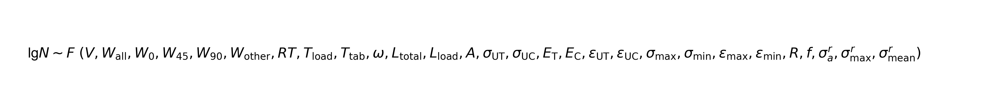

In [4]:
_features = [
    "log10(Cycles to Failure)",    "Fiber Volume Fraction",    "Fiber Weight Fraction",    "Fiber Weight Fraction (0-deg)",    "Fiber Weight Fraction (45-deg)",    "Fiber Weight Fraction (90-deg)",    "Fiber Weight Fraction (Other Dir.)",    "Resin Type",    "Thickness",    "Tab Thickness",    "Width",    "Length",    "Load Length",    "Area",    "Ultimate Tensile Stress",    "Ultimate Compressive Stress",    "Tensile Modulus",    "Compressive Modulus",    "Ultimate Tensile Strain",    "Ultimate Compressive Strain",    "Maximum Stress",    "Minimum Stress",     "Maximum Strain",    "Minimum Strain",    "R-value",    "Frequency",    "Relative Stress Amplitude",    "Relative Maximum Stress",    "Relative Mean Stress",
]
_features = [rep_func(x, feature_name_mapping) for x in _features]

fig = plt.figure(figsize=(10,1), dpi=500)
ax = fig.add_subplot(111, frameon=False)
ax.tick_params(
            labelcolor="none",
            which="both",
            top=False,
            bottom=False,
            left=False,
            right=False,
        )

ax.text(0, 0, _features[0] + r"$\sim \mathit{F}\ ( "+",".join(_features[1:]).replace("$", "")+r" )$")
plt.savefig(os.path.join(trainer.project_root, "symbols.pdf"), dpi=500)
plt.show()

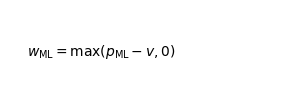

In [7]:
fig = plt.figure(figsize=(3,1), dpi=100)
ax = fig.add_subplot(111, frameon=False)
ax.tick_params(
            labelcolor="none",
            which="both",
            top=False,
            bottom=False,
            left=False,
            right=False,
        )

ax.text(0, 0, r"$w_{\mathrm{ML}}=\max (p_{\mathrm{ML}}-v,0)$")
plt.savefig(os.path.join(trainer.project_root, "symbols_ml_weight.pdf"), dpi=500)
plt.show()

# Analyse the dataset

## Statistics

In [15]:
desc = trainer.datamodule.describe()
desc

,Fiber Volume Fraction,Fiber Weight Fraction,Fiber Weight Fraction (0-deg),Fiber Weight Fraction (45-deg),Fiber Weight Fraction (90-deg),Fiber Weight Fraction (Other Dir.),Thickness,Tab Thickness,Width,Length,...,Ultimate Compressive Stress,Tensile Modulus,Compressive Modulus,Ultimate Tensile Strain,Ultimate Compressive Strain,Relative Maximum Stress,Relative Stress Amplitude,Relative Mean Stress,Resin Type,log10(Cycles to Failure)
count,6148.000000,702.000000,4931.000000,4931.000000,4931.000000,4931.000000,6239.000000,1110.000000,4448.000000,1805.000000,...,4121.000000,5790.000000,1521.000000,5088.000000,1693.000000,6440.000000,6440.000000,6440.000000,6770.000000,6770.000000
mean,46.445081,71.547448,57.567836,28.527479,8.258163,6.820929,3.614131,1.845000,26.276576,211.003224,...,-450.493284,29.030054,31.568244,2.794264,-1.787123,0.486882,0.252783,0.234100,0.795126,4.540933
std,11.236202,4.986627,35.651901,29.537740,21.901086,22.386288,1.800663,2.522020,11.724658,160.222516,...,234.148183,19.621953,15.811743,2.431719,0.434889,0.190632,0.120424,0.147278,1.112443,1.354869
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.300000,0.500000,4.000000,28.970000,...,-5274.270275,0.670408,8.960000,0.000000,-2.733333,0.006036,0.005069,0.000000,0.000000,0.280806
25%,38.000000,71.468684,28.000000,0.000000,0.000000,0.000000,2.760000,1.000000,22.000000,145.000000,...,-613.200000,16.900000,18.991667,2.092000,-2.074000,0.343759,0.172367,0.146176,0.000000,3.593840
50%,50.000000,71.985680,66.000000,26.000000,0.000000,0.000000,3.280000,2.000000,25.000000,150.000000,...,-438.333333,25.750000,29.795000,2.635000,-1.806667,0.472687,0.236271,0.245078,1.000000,4.586970
75%,54.600000,72.838361,92.000000,44.000000,2.000000,1.000000,4.235000,2.000000,25.014250,250.000000,...,-274.000000,35.810658,38.790000,2.933333,-1.550000,0.620380,0.307012,0.332308,1.000000,5.541102
max,70.900000,74.690000,100.000000,100.000000,100.000000,100.000000,29.500000,32.850000,139.900000,1980.000000,...,-78.541462,141.666667,131.750000,23.666667,-0.466667,1.000000,0.998647,0.939059,4.000000,9.628199
Skewness,-1.341580,-12.698385,-0.464690,0.964197,2.910921,3.680476,5.676036,11.732286,3.093481,6.310384,...,-2.734133,2.594326,2.758006,5.858117,0.287190,0.252547,1.632601,0.066145,1.915179,-0.132952
Gini Index,0.127706,0.016365,0.346759,0.556639,0.883997,0.916693,0.221907,0.234875,0.174153,0.265227,...,-0.275741,0.315997,0.237652,0.292484,-0.136792,0.222598,0.246756,0.353408,0.628600,0.168435


### Z-score, Mode, and Kurtosis

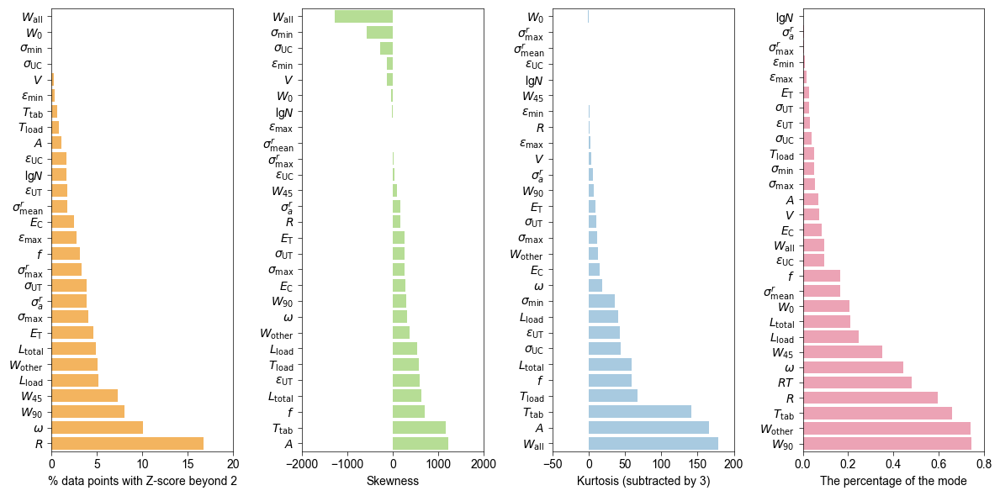

In [23]:
import os

plt.figure(figsize=(12, 6), dpi=100)
ax = plt.subplot(141)
features = [x for x in desc.columns if x not in trainer.cat_feature_names]
values = desc.loc["Percentage of points with Z-score beyond 2", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order]*100, color=tabensemb.utils.global_palette[0])
ax.set_xlabel(r"% data points with Z-score beyond 2")
replace_feature_names(ax)
ax.set_ylim([-0.5, len(features)-0.5])
set_linewidth(ax)

ax = plt.subplot(142)
features = [x for x in desc.columns if x not in trainer.cat_feature_names]
values = desc.loc["Skewness", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order]*100, color=tabensemb.utils.global_palette[1])
ax.set_xlabel(r"Skewness")
ax.set_ylim([-0.5, len(features)-0.5])
replace_feature_names(ax)
set_linewidth(ax)

ax = plt.subplot(143)
features = [x for x in desc.columns if x not in trainer.cat_feature_names]
values = desc.loc["Kurtosis", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order], color=tabensemb.utils.global_palette[2])
ax.set_xlabel("Kurtosis (subtracted by 3)")
replace_feature_names(ax)
ax.set_ylim([-0.5, len(features)-0.5])
set_linewidth(ax)

ax = plt.subplot(144)
features = list(desc.columns)
values = desc.loc["Mode percentage", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order], color=tabensemb.utils.global_palette[3])
ax.set_xlabel("The percentage of the mode")
replace_feature_names(ax)
ax.set_ylim([-0.5, len(features)-0.5])
set_linewidth(ax)


plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "statistics.pdf"), dpi=500, bbox_inches="tight")
plt.show()

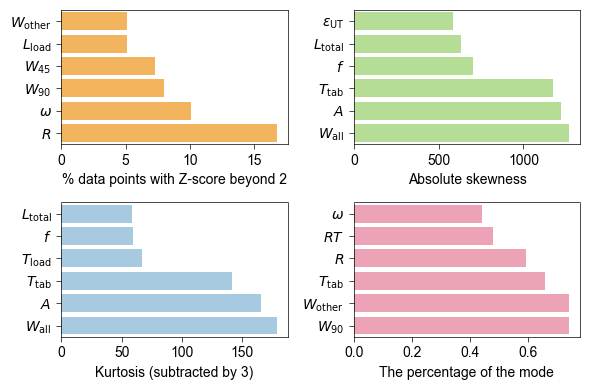

In [20]:
import os

top_k = 6

plt.figure(figsize=(6, 4), dpi=100)
ax = plt.subplot(221)
features = [x for x in desc.columns if x not in trainer.cat_feature_names]
values = desc.loc["Percentage of points with Z-score beyond 2", features].values
order = np.argsort(values)[::-1][:top_k]
ax.barh(y=np.array(features)[order], width=values[order]*100, color=tabensemb.utils.global_palette[0])
ax.set_xlabel(r"% data points with Z-score beyond 2")
replace_feature_names(ax)
ax.set_ylim([-0.5, top_k-0.5])
set_linewidth(ax)

ax = plt.subplot(222)
features = [x for x in desc.columns if x not in trainer.cat_feature_names]
values = np.abs(desc.loc["Skewness", features].values)
order = np.argsort(values)[::-1][:top_k]
ax.barh(y=np.array(features)[order], width=values[order]*100, color=tabensemb.utils.global_palette[1])
ax.set_xlabel(r"Absolute skewness")
ax.set_ylim([-0.5, top_k-0.5])
replace_feature_names(ax)
set_linewidth(ax)

ax = plt.subplot(223)
features = [x for x in desc.columns if x not in trainer.cat_feature_names]
values = desc.loc["Kurtosis", features].values
order = np.argsort(values)[::-1][:top_k]
ax.barh(y=np.array(features)[order], width=values[order], color=tabensemb.utils.global_palette[2])
ax.set_xlabel("Kurtosis (subtracted by 3)")
replace_feature_names(ax)
ax.set_ylim([-0.5, top_k-0.5])
set_linewidth(ax)

ax = plt.subplot(224)
features = list(desc.columns)
values = desc.loc["Mode percentage", features].values
order = np.argsort(values)[::-1][:top_k]
ax.barh(y=np.array(features)[order], width=values[order], color=tabensemb.utils.global_palette[3])
ax.set_xlabel("The percentage of the mode")
replace_feature_names(ax)
ax.set_ylim([-0.5, top_k-0.5])
set_linewidth(ax)

plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, f"statistics_top{top_k}.pdf"), dpi=500, bbox_inches="tight")
plt.show()

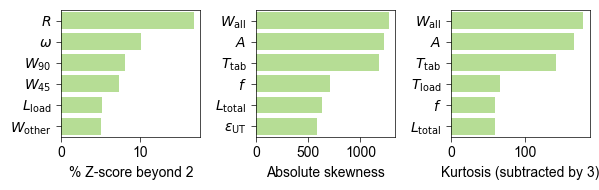

In [130]:
import os

top_k = 6

plt.figure(figsize=(6.1, 2.), dpi=100)
ax = plt.subplot(131)
features = [x for x in desc.columns if x not in trainer.cat_feature_names]
values = desc.loc["Percentage of points with Z-score beyond 2", features].values
order = np.argsort(values)[::-1][:top_k][::-1]
ax.barh(y=np.array(features)[order], width=values[order]*100, color=tabensemb.utils.global_palette[1])
ax.set_xlabel(r"% Z-score beyond 2")
replace_feature_names(ax)
ax.set_ylim([-0.5, top_k-0.5])
set_linewidth(ax)

ax = plt.subplot(132)
features = [x for x in desc.columns if x not in trainer.cat_feature_names]
values = np.abs(desc.loc["Skewness", features].values)
order = np.argsort(values)[::-1][:top_k][::-1]
ax.barh(y=np.array(features)[order], width=values[order]*100, color=tabensemb.utils.global_palette[1])
ax.set_xlabel(r"Absolute skewness")
ax.set_ylim([-0.5, top_k-0.5])
replace_feature_names(ax)
set_linewidth(ax)

ax = plt.subplot(133)
features = [x for x in desc.columns if x not in trainer.cat_feature_names]
values = desc.loc["Kurtosis", features].values
order = np.argsort(values)[::-1][:top_k][::-1]
ax.barh(y=np.array(features)[order], width=values[order], color=tabensemb.utils.global_palette[1])
ax.set_xlabel("Kurtosis (subtracted by 3)")
replace_feature_names(ax)
ax.set_ylim([-0.5, top_k-0.5])
set_linewidth(ax)

# ax = plt.subplot(414)
# features = list(desc.columns)
# values = desc.loc["Mode percentage", features].values
# order = np.argsort(values)[::-1][:top_k]
# ax.barh(y=np.array(features)[order], width=values[order], color=tabensemb.utils.global_palette[3])
# ax.set_xlabel("The percentage of the mode")
# replace_feature_names(ax)
# ax.set_ylim([-0.5, top_k-0.5])
# set_linewidth(ax)

plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, f"statistics_top{top_k}_h.pdf"), dpi=500, bbox_inches="tight")
plt.show()

### Source percentage

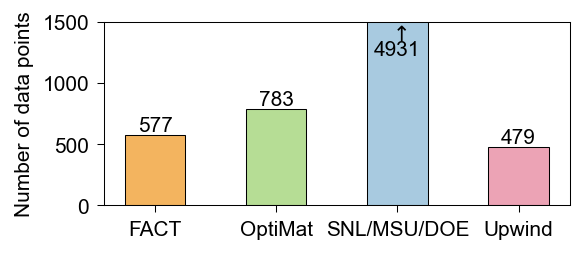

In [25]:
unique_values = np.unique(trainer.df["Data source"], return_counts=True)

plt.figure(figsize=(4, 1.8), dpi=150)
ax = plt.subplot(111)
ax.bar(
    list(range(len(unique_values[0]))),
    unique_values[1],
    tick_label=unique_values[0],
    **dict(color=tabensemb.utils.global_palette[0:4], width=0.5, edgecolor="k", linewidth=0.5),
)
ax.set_ylim([0, 1500])
for idx, count in enumerate(unique_values[1]):
    if count<1500:
        ax.text(idx, count, str(count), ha="center", va="bottom")
    else:
        ax.text(idx, 1480, r"$\uparrow$", ha="center", va="top")
        ax.text(idx, 1350, str(count), ha="center", va="top")
ax.set_ylabel("Number of data points")
set_linewidth(ax)
plt.savefig(fname=os.path.join(trainer.project_root, "data_source.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

### Filling rate

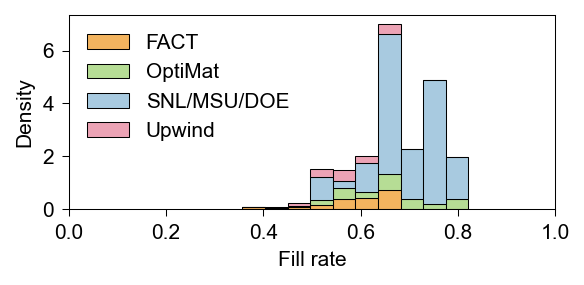

In [108]:
ax = trainer.plot_fill_rating(figure_kwargs=dict(figsize=(4,2.), dpi=150), hist_kwargs=dict(bins=10, linewidth=0.5), category="Data source", legend_kwargs=dict(frameon=False, loc="upper left"), save_show_close=False)
ax.set_xlim(right=1.0)
ax.set_xlabel("Fill rate")
set_linewidth(ax)
plt.savefig(fname=os.path.join(trainer.project_root, "fill_rating.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

/home/xlluo/hdd/tabular_ensemble/tabensemb/trainer/trainer.py:3866: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


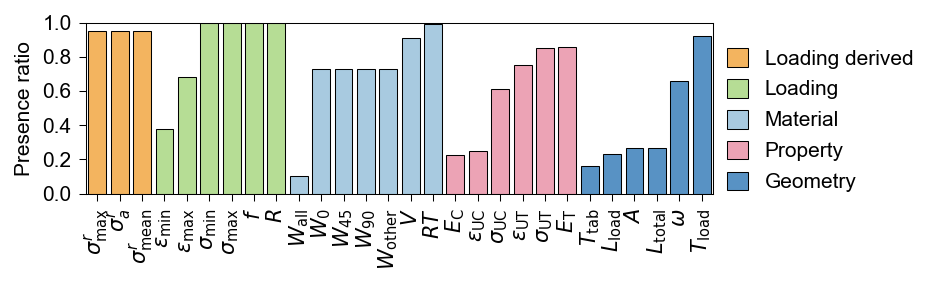

In [5]:
ax = trainer.plot_presence_ratio(order="type", clr=tabensemb.utils.global_palette[0: 5], barplot_kwargs=dict(linewidth=0.5, orient="v"), figure_kwargs=dict(figsize=(6.7,2), dpi=150), legend_kwargs=dict(loc="lower right", bbox_to_anchor=(2., -0.027), frameon=False, handleheight=1, handlelength=1.), save_show_close=False)
handles, labels = ax.get_legend().legendHandles, [x.get_text() for x in ax.get_legend().texts]
for handle in handles:
    handle.set(linewidth=0.5)
ax.legend(handles, labels, **dict(loc="lower right", bbox_to_anchor=(1.25, -0.1), frameon=False, handleheight=1, handlelength=1.))
replace_legend_labels(ax, {"Derived": "Loading derived", "Specimen": "Geometry"}, dict(loc="lower right", bbox_to_anchor=(1.35, -0.1), frameon=False, handleheight=1, handlelength=1.))
plt.setp(
    ax.get_xticklabels(),
    rotation=90,
    va="center",
    ha="right",
    rotation_mode="anchor",
)
replace_feature_names(ax)
set_linewidth(ax)
plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "presence_rate.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


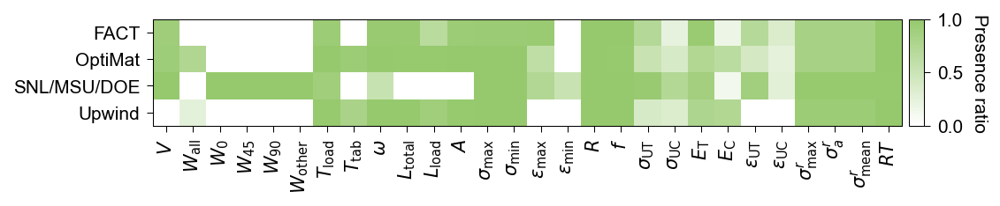

In [124]:
from matplotlib.colors import LinearSegmentedColormap
ax = trainer.plot_categorical_presence_ratio(category="Data source", orient="v", figure_kwargs=dict(figsize=(7,2), dpi=150), save_show_close=False, imshow_kwargs=dict(cmap=LinearSegmentedColormap.from_list("greens", [[1, 1, 1], [150/255, 201/255, 109/255]])), cbar_ax_linewidth=0.5, cbar_ax_kwargs=dict(width=f"2%",height=f"100%",bbox_to_anchor=(1.01, 0.0, 1, 1)))
replace_feature_names(ax)
plt.setp(
    ax.get_xticklabels(),
    rotation=90,
    va="center",
    ha="right",
    rotation_mode="anchor",
)
set_linewidth(ax)
plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "missing_rate_category.jpg"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

### Outliers

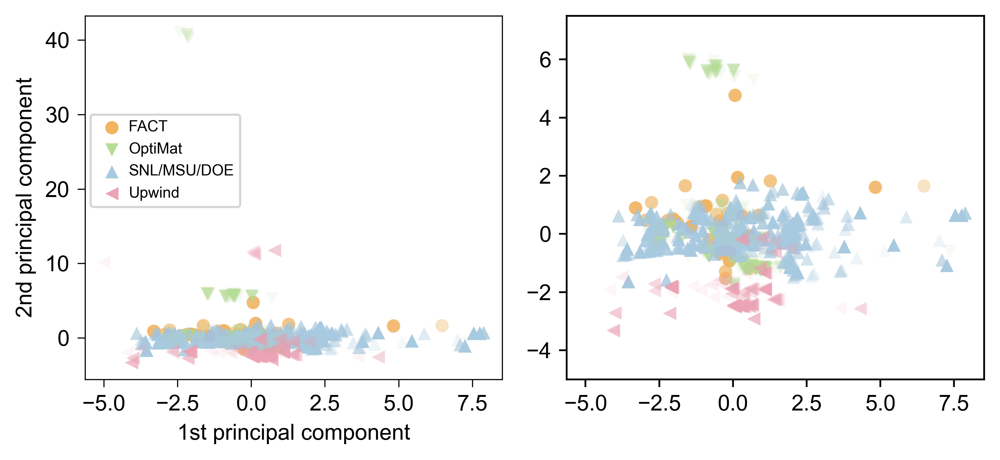

In [7]:
material_features = trainer.datamodule.get_feature_names_by_type("Material") + trainer.datamodule.get_feature_names_by_type("Specimen") + trainer.datamodule.get_feature_names_by_type("Property")
material_features.remove("Resin Type")
fig = plt.figure(figsize=(6.4,3.), dpi=500)
ax1 = plt.subplot(121)
trainer.plot_pca_2d_visual(ax=ax1, category="Data source", features=material_features, legend_kwargs=dict(bbox_to_anchor=(0.42, 0.75)), scatter_kwargs={"alpha": 0.1, "edgecolor": None, "rasterized": True, "linewidth": 0})
# ax1.get_legend().remove()

handles, labels = ax1.get_legend().legendHandles, [x.get_text() for x in ax1.get_legend().texts]
for handle in handles:
    handle.set(alpha=1)
ax1.legend(handles, labels, **dict(bbox_to_anchor=(0.39, 0.75), loc="upper right", fontsize="x-small", frameon=True, title=False, handletextpad=0.1, markerscale=1))

set_linewidth(ax1)
ax1.set_xlabel("1st principal component")
ax1.set_ylabel("2nd principal component")

ax2 = plt.subplot(122)
trainer.plot_pca_2d_visual(ax=ax2, category="Data source", features=material_features, scatter_kwargs={"alpha": 0.1, "edgecolor": None, "rasterized": True, "linewidth": 0})
ax2.get_legend().remove()
ax2.set_ylim([-5, 7.5])
# set_linewidth(ax)

# ax = fig.add_subplot(111, frameon=False)
# ax.tick_params(
#             labelcolor="none",
#             which="both",
#             top=False,
#             bottom=False,
#             left=False,
#             right=False,
#         )


plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "pca_mat.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

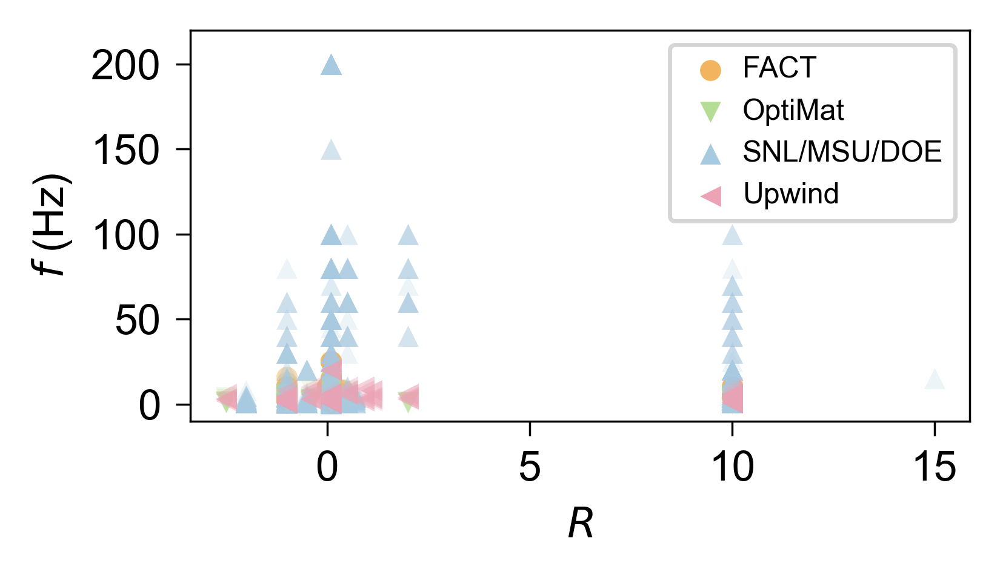

In [9]:
ax = trainer.plot_scatter(x_col="R-value", y_col="Frequency", category="Data source", legend_kwargs=dict(loc="upper right", fontsize="x-small", frameon=True), scatter_kwargs=dict(s=25, alpha=0.2, edgecolor=None, rasterized=True, linewidth=0), figure_kwargs=dict(figsize=(3.4,2.), dpi=500), save_show_close=False)
# ax.get_legend().remove()
handles, labels = ax.get_legend().legendHandles, [x.get_text() for x in ax.get_legend().texts]
for handle in handles:
    handle.set(alpha=1)
ax.legend(handles, labels, **dict(loc="upper right", fontsize="x-small", frameon=True, handletextpad=0.1))

ax.set_ylabel("Frequency (Hz)")
replace_feature_names(ax)
set_linewidth(ax)
ax.set_ylim([-10, 220])
plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "r_frequency.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

### Distribution of lgN

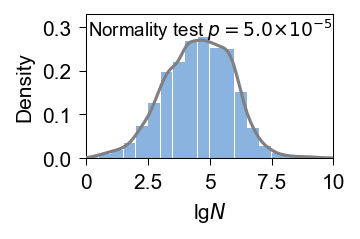

In [4]:
import scipy.stats as st
from matplotlib.colors import LinearSegmentedColormap

cmap = LinearSegmentedColormap.from_list("kde", [[233/255, 240/255, 247/255],[44/255, 119/255, 199/255]])
p_values = st.normaltest(trainer.datamodule.get_not_imputed_df()["log10(Cycles to Failure)"]).pvalue
rep = "<0.001" if p_values<0.001 else f"={round(p_values, 3)}"

ax = trainer.plot_hist(feature="log10(Cycles to Failure)", imputed=False, save_show_close=False, figure_kwargs=dict(figsize=(2.5,1.7), dpi=150), hist_kwargs=dict(color=cmap(128), bins=np.arange(0, 10, 0.5)))
trainer.plot_kde(x_col="log10(Cycles to Failure)", ax=ax, kdeplot_kwargs=dict(zorder=10, color="grey"))
ax.text(0.998, 0.985, f"Normality test $p=${to_scientific_notation(p_values, fmt='%1.1e')}", transform=ax.transAxes, ha="right", va="top", fontsize=plt.rcParams["font.size"]*0.9)
ax.set_xlim([0, 10])
ax.set_xticks([0, 2.5, 5, 7.5, 10])
ax.set_xticklabels(["0", "2.5", "5", "7.5", "10"])
ax.set_ylim([0, 0.33])
ax.set_ylabel("Density")
ax.set_xlabel("log10(Cycles to Failure)")
replace_feature_names(ax)
set_linewidth(ax)
plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "lgN_distribution.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

In [4]:
from scipy.stats import gaussian_kde
kde = gaussian_kde(trainer.df["log10(Cycles to Failure)"].values)
kde(np.linspace(0, 10, 1000))

array([9.34624276e-04, 9.98938521e-04, 1.06617638e-03, 1.13635685e-03,
       1.20949137e-03, 1.28558367e-03, 1.36462972e-03, 1.44661769e-03,
       1.53152802e-03, 1.61933353e-03, 1.70999959e-03, 1.80348438e-03,
       1.89973918e-03, 1.99870876e-03, 2.10033176e-03, 2.20454121e-03,
       2.31126502e-03, 2.42042657e-03, 2.53194528e-03, 2.64573726e-03,
       2.76171596e-03, 2.87979284e-03, 2.99987802e-03, 3.12188100e-03,
       3.24571129e-03, 3.37127909e-03, 3.49849590e-03, 3.62727516e-03,
       3.75753276e-03, 3.88918765e-03, 4.02216222e-03, 4.15638283e-03,
       4.29178010e-03, 4.42828928e-03, 4.56585045e-03, 4.70440874e-03,
       4.84391446e-03, 4.98432310e-03, 5.12559538e-03, 5.26769711e-03,
       5.41059913e-03, 5.55427701e-03, 5.69871090e-03, 5.84388516e-03,
       5.98978800e-03, 6.13641114e-03, 6.28374931e-03, 6.43179985e-03,
       6.58056219e-03, 6.73003733e-03, 6.88022737e-03, 7.03113497e-03,
       7.18276286e-03, 7.33511328e-03, 7.48818757e-03, 7.64198565e-03,
      

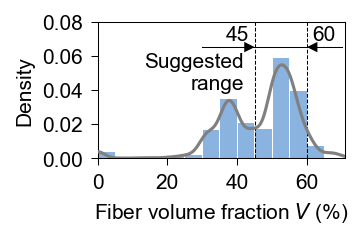

In [45]:
import scipy.stats as st
import matplotlib.patches as mpatches

# p_values = st.normaltest(trainer.datamodule.get_not_imputed_df()["log10(Cycles to Failure)"]).pvalue
# rep = "<0.001" if p_values<0.001 else f"={round(p_values, 3)}"

ax = trainer.plot_hist(feature="Fiber Volume Fraction", imputed=False, save_show_close=False, figure_kwargs=dict(figsize=(2.5, 1.7), dpi=150), hist_kwargs=dict(color=cmap(128), bins=np.arange(0, 70, 5)))
trainer.plot_kde(x_col="Fiber Volume Fraction", ax=ax, kdeplot_kwargs=dict(zorder=10, color="grey"))
# ax.text(0.98, 0.97, f"Normality test\n$p$-value{rep}", transform=ax.transAxes, ha="right", va="top")
ax.set_ylabel("Density")
ax.set_xlabel("Fiber volume fraction Fiber Volume Fraction (%)")
ax.plot([45, 45], [0, 0.08], color="k", linewidth=0.5, linestyle="--")
ax.plot([60, 60], [0, 0.08], color="k", linewidth=0.5, linestyle="--")
ax.plot([30, 70], [0.065, 0.065], color="k", linewidth=0.5)
ax.set_ylim([0, 0.08])

arrow = mpatches.FancyArrowPatch((44.9, 0.065), (45, 0.065), mutation_scale=10, linewidth=0, color="black", shrinkA=10, shrinkB=10)
ax.add_patch(arrow)
arrow = mpatches.FancyArrowPatch((60.1, 0.065), (60, 0.065), mutation_scale=10, linewidth=0, color="black", shrinkA=10, shrinkB=10)
ax.add_patch(arrow)

ax.text(42, 0.062, "Suggested\nrange", ha="right", va="top")
ax.text(43.5, 0.067, "45", ha="right", va="bottom")
ax.text(61.5, 0.067, "60", ha="left", va="bottom")

replace_feature_names(ax)
set_linewidth(ax)
plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "FVF_distribution.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

### UMAP

In [125]:
!pip install umap-learn

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple, https://pypi.ngc.nvidia.com
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 429.3 kB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.8/56.8 kB 556.1 kB/s eta 0:00:00a 0:00:01

[notice] A new release of pip is available: 23.3.1 -> 24.0
[notice] To update, run: pip install --upgrade pip


In [4]:
import umap
from tabensemb.data.utils import OrdinalEncoder
encoder = OrdinalEncoder()
material_features = trainer.datamodule.get_feature_names_by_type("Material") + trainer.datamodule.get_feature_names_by_type("Specimen") + trainer.datamodule.get_feature_names_by_type("Property")
# material_features.remove("Resin Type")
embedding = umap.UMAP(random_state=0, n_neighbors=15, min_dist=0.1).fit_transform(trainer.datamodule.scaled_df[material_features], encoder.fit(trainer.df[["Material_Code"]]).transform(trainer.df[["Material_Code"]]).values.flatten().astype(int))

/home/xlluo/anaconda3/envs/tabular_ensemble/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/home/xlluo/anaconda3/envs/tabular_ensemble/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


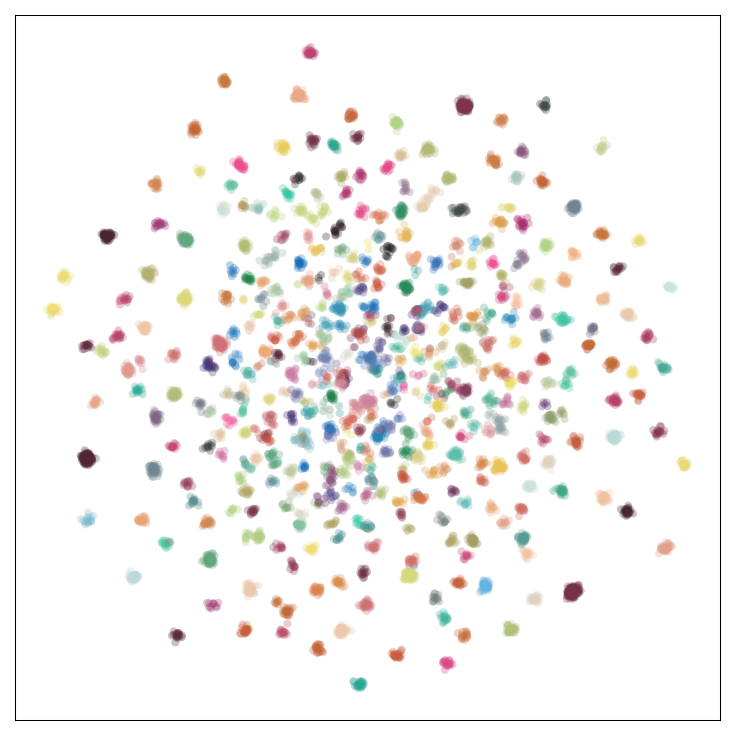

In [182]:
from tabensemb.data.utils import OrdinalEncoder
from matplotlib.colors import LinearSegmentedColormap, ListedColormap
import PIL.ImageColor
cmap = LinearSegmentedColormap.from_list("umap", [lighten_color(x, 0.9) for x in tabensemb.utils.global_palette[5:]])
encoder = OrdinalEncoder()
c = encoder.fit(trainer.df[["Material_Code"]]).transform(trainer.df[["Material_Code"]]).values.flatten()
# c = encoder.fit(trainer.df[["Data source"]]).transform(trainer.df[["Data source"]]).values.flatten().astype(int)
# c = trainer.df[["Frequency"]].values.flatten()
def rand_jitter(arr, factor=0.004):
    stdev = factor * (max(arr) - min(arr))
    return arr + np.random.randn(len(arr)) * stdev

plt.figure(dpi=500, figsize=(5, 5))
ax = plt.subplot(111)
np.random.seed(0)
sc = ax.scatter(rand_jitter(embedding[:, 0]), rand_jitter(embedding[:, 1]), c=c, cmap=cmap, s=15, alpha=0.3, linewidth=0., rasterized=True)
# plt.colorbar(mappable=sc)
ax.set_xticks([])
ax.set_yticks([])
set_linewidth(ax)
plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "umap.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

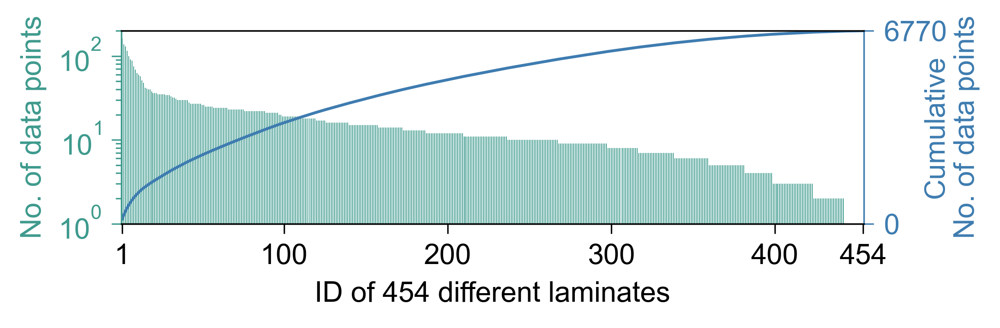

In [28]:
import seaborn as sns
plt.figure(dpi=500, figsize=(5, 1.7))
ax = plt.subplot(111)
c1 = lighten_color(tabensemb.utils.global_palette[6], 1.2)
c2 = lighten_color(tabensemb.utils.global_palette[4], 1.2)
codes, counts = np.unique(trainer.df["Material_Code"], return_counts=True)
sort_idx = np.argsort(counts)
sns.barplot(x=np.arange(len(codes)), y=counts[sort_idx[::-1]], color=c1, ax=ax, saturation=1, width=0.5, alpha=1)
# ax.bar(np.arange(len(codes)), counts[sort_idx[::-1]],)
set_linewidth(ax)
ax.set_yticks([0, 50, 100, 150])
ax.set_ylim([0, 200])
ax.set_ylabel("No. of data points")
ax.set_xlabel("ID of 454 different laminates")
ax.spines["left"].set_color(c1)
ax.spines["right"].set_color(c2)
ax.tick_params(axis="y", colors=c1, which="both")
ax.yaxis.label.set_color(c1)
ax.set_ylim(bottom=1)
ax.set_yscale("log")

ax = ax.twinx()

# sns.barplot(x=np.arange(len(codes)), y=np.cumsum(counts[sort_idx[::-1]])/len(trainer.df), color=tabensemb.utils.global_palette[1], ax=ax, saturation=1, width=1, alpha=0.5)
ax.plot(np.arange(len(codes)), np.cumsum(counts[sort_idx[::-1]]), color=c2, linewidth=1)
ax.set_xticks([0, 99, 199, 299, 399, 453])
ax.set_xticklabels([1, 100, 200, 300, 400, 454])
ax.set_xlim(left=-0.5, right=len(codes)-0.5)
ax.set_ylim([0, len(trainer.df)])
ax.set_yticks([0, len(trainer.df)])
ax.set_ylabel("Cumulative\nNo. of data points")
ax.spines["left"].set_color(c1)
ax.spines["right"].set_color(c2)
ax.tick_params(axis="y", colors=c2)
ax.yaxis.label.set_color(c2)
ax.yaxis.set_label_coords(1.08, 0.5)

set_linewidth(ax)
plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "n_data.pdf"), dpi=500, bbox_inches="tight")

plt.show()
plt.close()

In [ ]:
print(len(codes))

## Derived features

In [127]:
len(set(trainer.df["Sequence"]))

246

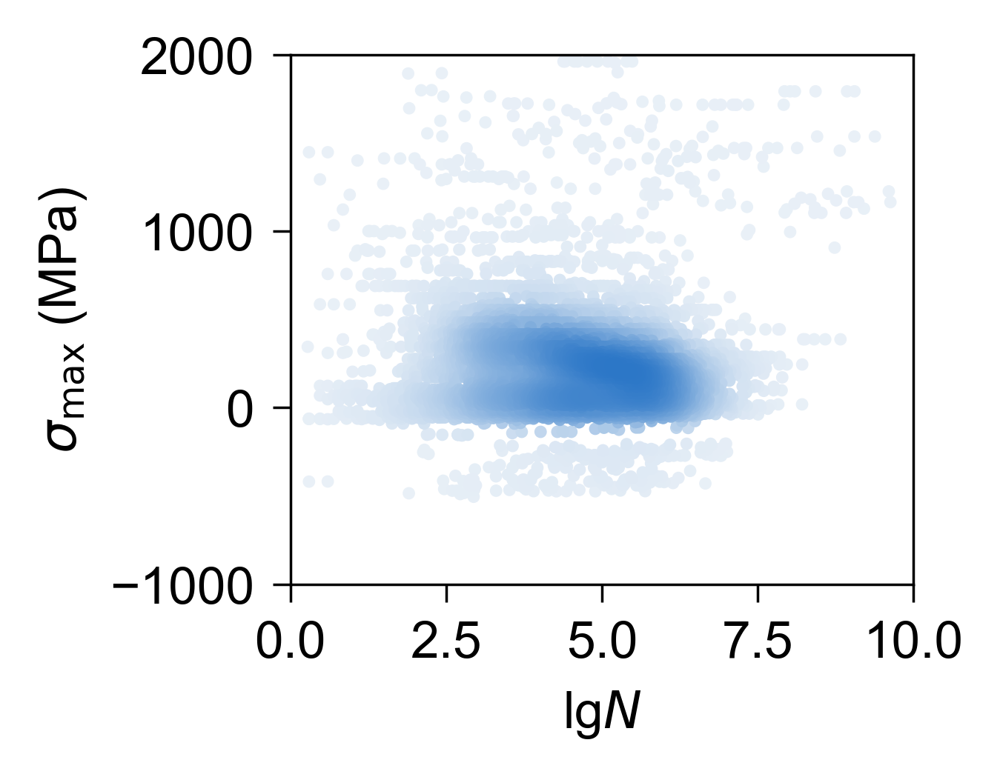

In [59]:
from matplotlib.colors import LinearSegmentedColormap
ax = trainer.plot_scatter(x_col="log10(Cycles to Failure)", y_col="Maximum Stress", kde_color=True, scatter_kwargs=dict(s=2, cmap=LinearSegmentedColormap.from_list("kde", [[233/255, 240/255, 247/255],[44/255, 119/255, 199/255]]), rasterized=True), save_show_close=False, figure_kwargs=dict(figsize=(2.8,2.2), dpi=500))
replace_feature_names(ax)
ax.set_ylabel(ax.get_ylabel()+" (MPa)")
set_linewidth(ax)
ax.set_xlim([0, 10])
ax.set_ylim([-1000, 2000])
plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "stress_cycle.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

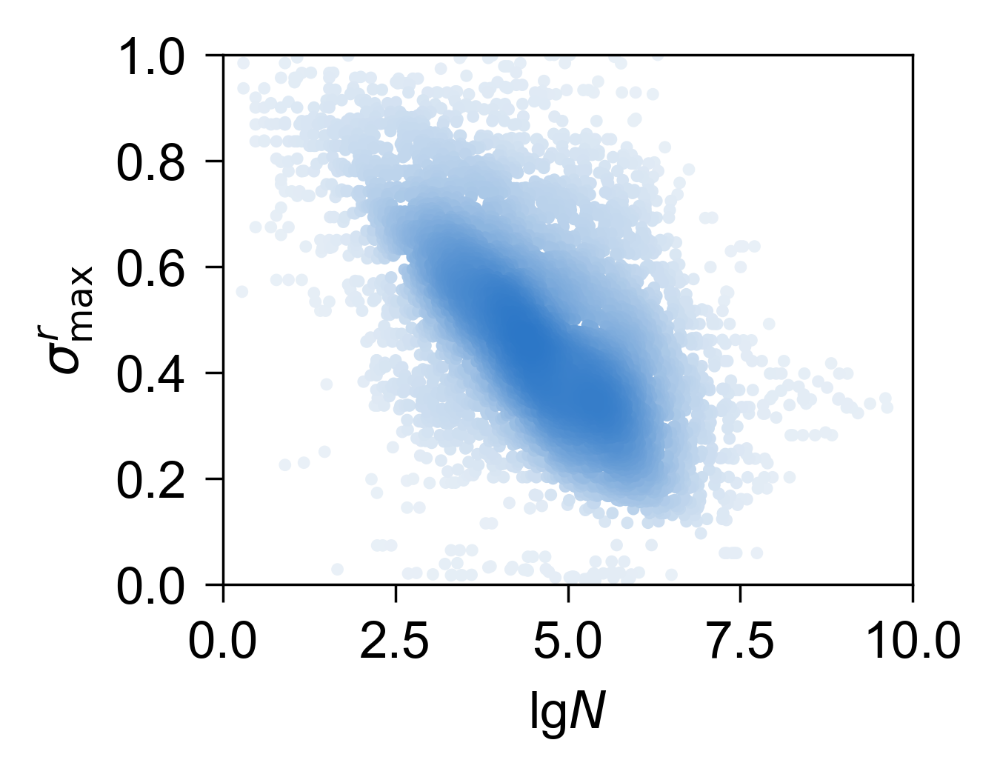

In [35]:
from matplotlib.colors import LinearSegmentedColormap
ax = trainer.plot_scatter(x_col="log10(Cycles to Failure)", y_col="Relative Maximum Stress", kde_color=True, scatter_kwargs=dict(s=2, cmap=LinearSegmentedColormap.from_list("kde", [[233/255, 240/255, 247/255],[44/255, 119/255, 199/255]]), rasterized=True), save_show_close=False, figure_kwargs=dict(figsize=(2.8,2.2), dpi=500))
replace_feature_names(ax)
set_linewidth(ax)
ax.set_xlim([0, 10])
ax.set_ylim([0, 1])
plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "max_stress_cycle.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

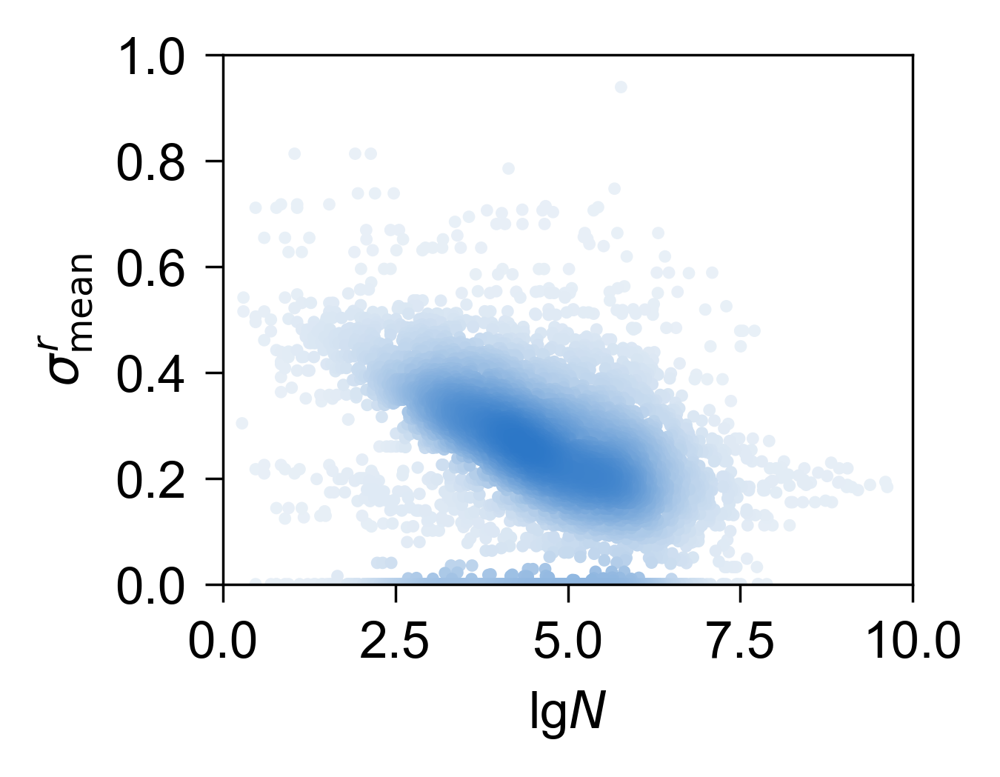

In [36]:
from matplotlib.colors import LinearSegmentedColormap
ax = trainer.plot_scatter(x_col="log10(Cycles to Failure)", y_col="Relative Mean Stress", kde_color=True, scatter_kwargs=dict(s=2, cmap=LinearSegmentedColormap.from_list("kde", [[233/255, 240/255, 247/255],[44/255, 119/255, 199/255]]), rasterized=True), save_show_close=False, figure_kwargs=dict(figsize=(2.8,2.2), dpi=500))
replace_feature_names(ax)
set_linewidth(ax)
ax.set_xlim([0, 10])
ax.set_ylim([0, 1])
plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "mean_stress_cycle.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

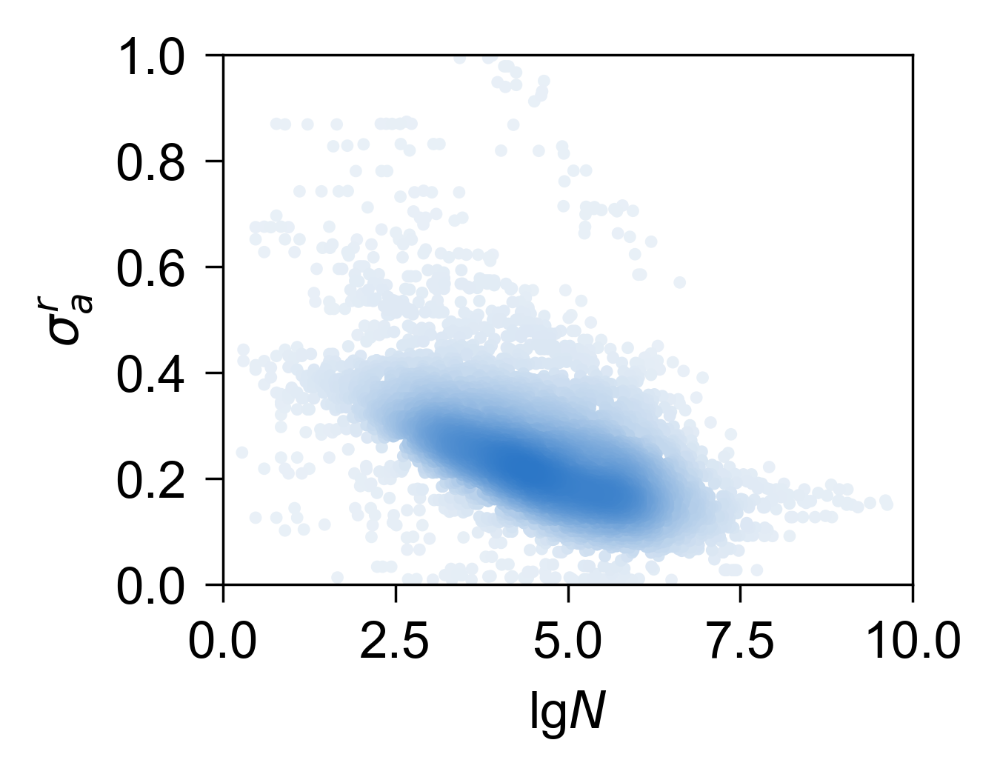

In [37]:
from matplotlib.colors import LinearSegmentedColormap
ax = trainer.plot_scatter(x_col="log10(Cycles to Failure)", y_col="Relative Stress Amplitude", kde_color=True, scatter_kwargs=dict(s=2, cmap=LinearSegmentedColormap.from_list("kde", [[233/255, 240/255, 247/255],[44/255, 119/255, 199/255]]), rasterized=True), save_show_close=False, figure_kwargs=dict(figsize=(2.8,2.2), dpi=500))
replace_feature_names(ax)
set_linewidth(ax)
ax.set_xlim([0, 10])
ax.set_ylim([0, 1])
plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "amp_stress_cycle.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

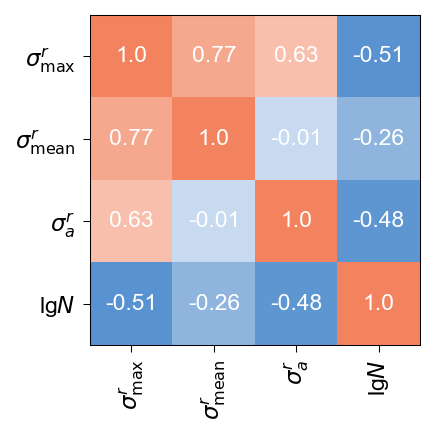

In [38]:
import numpy as np
from matplotlib.colors import LinearSegmentedColormap

ax = trainer.plot_corr(fontsize=11, features=["Relative Maximum Stress", "Relative Mean Stress", "Relative Stress Amplitude"], include_label=True, imputed=True, imshow_kwargs=dict(cmap=LinearSegmentedColormap.from_list("imshow_blru", [[88/255, 146/255, 208/255], [1, 1, 1], [243/255, 131/255, 95/255]])), figure_kwargs=dict(figsize=(3.,3.), dpi=150), save_show_close=False)
replace_feature_names(ax)
set_linewidth(ax)
plt.savefig(os.path.join(trainer.project_root, "derived_corr.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

/home/xlluo/hdd/tabular_ensemble/tabensemb/trainer/trainer.py:2924: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


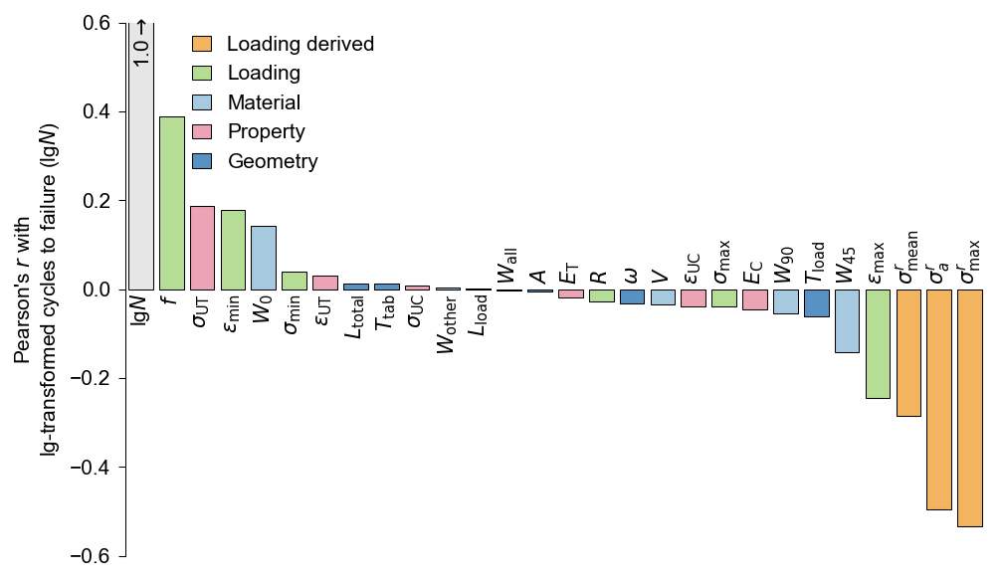

In [5]:
ax = trainer.plot_corr_with_label(features=trainer.cont_feature_names+trainer.label_name, imputed=False, order="descending", barplot_kwargs=dict(linewidth=0.5, orient="v"), legend_kwargs=dict(loc="lower right", handlelength=1, handleheight=1), save_show_close=False, figure_kwargs=dict(figsize=(6.8, 4), dpi=150), clr=tabensemb.utils.global_palette[:5]+[[0.9, 0.9, 0.9]])

ax.set_ylim([-0.6, 0.6])
handles, labels = ax.get_legend().legendHandles, [x.get_text() for x in ax.get_legend().texts]
for handle in handles:
    handle.set(linewidth=0.5)
ax.legend(handles, labels, **dict(loc="upper left", bbox_to_anchor=(0.056, 1.01), handlelength=0.9, handleheight=0.7, frameon=False))
replace_legend_labels(ax, {"Derived": "Loading derived", "Specimen": "Geometry"}, dict(loc="upper left", bbox_to_anchor=(0.056, 1.01), handlelength=0.9, handleheight=0.7, frameon=False))

set_linewidth(ax)
plt.setp(
    ax.get_xticklabels(),
    rotation=90,
    va="center",
    ha="right",
    rotation_mode="anchor",
)
replace_feature_names(ax)


ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["bottom"].set_visible(False)
plt.tick_params(
    axis='x',
    which='both',
    bottom=False,
)

corr = (
    trainer.datamodule.cal_corr(
        method="pearson",
        imputed=False,
        features_only=False,
    )
    .loc[trainer.cont_feature_names+trainer.label_name, trainer.label_name]
    .values.flatten()
)
df = pd.DataFrame(data={"feature": trainer.cont_feature_names+trainer.label_name, "correlation": corr})
df.sort_values(
    by="correlation",
    ascending=False,
    inplace=True,
)
for i,(g,t) in enumerate(zip(df["correlation"],ax.get_xticklabels())):
    if g<0:
        t.set_ha('left')
        t.set_va('center')
    else:
        t.set_ha('right')
        t.set_va('center')
    t.set_rotation_mode('anchor')
    t.set_rotation(90)
    t.set_transform(ax.transData)
    t.set_position((i,-0.01 if g>0 else 0.01))

ax.text(0.5/(len(trainer.cont_feature_names)+1)+0.004, 1.01, r"1.0$\rightarrow$", ha="center", va="top", transform=ax.transAxes, rotation=90, rotation_mode="default")
ax.set_ylabel("Pearson's $r$ with\nlg-transformed cycles to failure (log10(Cycles to Failure))")
replace_feature_names(ax)

plt.savefig(os.path.join(trainer.project_root, "corr_with_label.pdf"), dpi=500, bbox_inches="tight")
plt.tight_layout()
plt.show()
plt.close()

In [10]:
df

,feature,correlation
27,log10(Cycles to Failure),1.000000
17,Frequency,0.614556
2,Fiber Weight Fraction (0-deg),0.147130
18,Ultimate Tensile Stress,0.112991
22,Ultimate Tensile Strain,0.063313
20,Tensile Modulus,0.043633
10,Load Length,0.037713
16,R-value,0.027807
21,Compressive Modulus,0.022998
13,Minimum Stress,0.012564


/home/xlluo/hdd/tabular_ensemble/tabensemb/trainer/trainer.py:2924: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


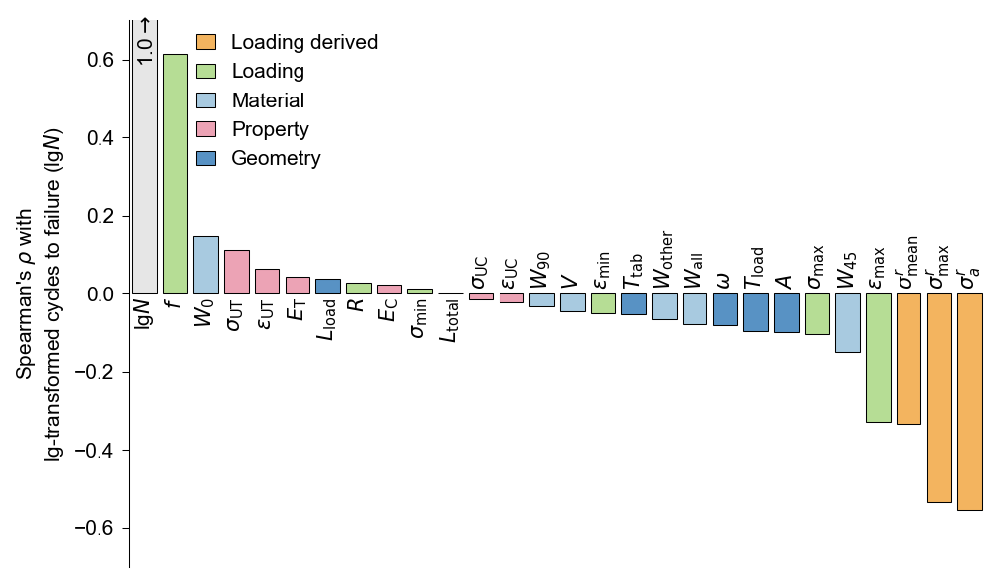

In [9]:
ax = trainer.plot_corr_with_label(features=trainer.cont_feature_names+trainer.label_name, imputed=False, order="descending", barplot_kwargs=dict(linewidth=0.5, orient="v"), legend_kwargs=dict(loc="lower right", handlelength=1, handleheight=1), save_show_close=False, figure_kwargs=dict(figsize=(6.8, 4), dpi=150), clr=tabensemb.utils.global_palette[:5]+[[0.9, 0.9, 0.9]], method="spearman")

ax.set_ylim([-0.7, 0.7])
handles, labels = ax.get_legend().legendHandles, [x.get_text() for x in ax.get_legend().texts]
for handle in handles:
    handle.set(linewidth=0.5)
ax.legend(handles, labels, **dict(loc="upper left", bbox_to_anchor=(0.056, 1.01), handlelength=0.9, handleheight=0.7, frameon=False))
replace_legend_labels(ax, {"Derived": "Loading derived", "Specimen": "Geometry"}, dict(loc="upper left", bbox_to_anchor=(0.056, 1.01), handlelength=0.9, handleheight=0.7, frameon=False))

set_linewidth(ax)
plt.setp(
    ax.get_xticklabels(),
    rotation=90,
    va="center",
    ha="right",
    rotation_mode="anchor",
)
replace_feature_names(ax)


ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["bottom"].set_visible(False)
plt.tick_params(
    axis='x',
    which='both',
    bottom=False,
)

corr = (
    trainer.datamodule.cal_corr(
        method="spearman",
        imputed=False,
        features_only=False,
    )
    .loc[trainer.cont_feature_names+trainer.label_name, trainer.label_name]
    .values.flatten()
)
df = pd.DataFrame(data={"feature": trainer.cont_feature_names+trainer.label_name, "correlation": corr})
df.sort_values(
    by="correlation",
    ascending=False,
    inplace=True,
)
for i,(g,t) in enumerate(zip(df["correlation"],ax.get_xticklabels())):
    if g<0:
        t.set_ha('left')
        t.set_va('center')
    else:
        t.set_ha('right')
        t.set_va('center')
    t.set_rotation_mode('anchor')
    t.set_rotation(90)
    t.set_transform(ax.transData)
    t.set_position((i,-0.01 if g>0 else 0.01))

ax.text(0.5/(len(trainer.cont_feature_names)+1)+0.004, 1.01, r"1.0$\rightarrow$", ha="center", va="top", transform=ax.transAxes, rotation=90, rotation_mode="default")
ax.set_ylabel(r"Spearman's $\rho$" +" with\nlg-transformed cycles to failure (log10(Cycles to Failure))")
replace_feature_names(ax)

plt.savefig(os.path.join(trainer.project_root, "spearman_corr_with_label.pdf"), dpi=500, bbox_inches="tight")
plt.tight_layout()
plt.show()
plt.close()

In [8]:
df

,feature,correlation
27,log10(Cycles to Failure),1.000000
17,Frequency,0.614556
2,Fiber Weight Fraction (0-deg),0.147130
18,Ultimate Tensile Stress,0.112991
22,Ultimate Tensile Strain,0.063313
20,Tensile Modulus,0.043633
10,Load Length,0.037713
16,R-value,0.027807
21,Compressive Modulus,0.022998
13,Minimum Stress,0.012564


In [36]:
not_imputed_df=trainer.datamodule.get_not_imputed_df()
not_imputed_df[pd.isna(not_imputed_df["R-value"])]

,Data source,Material_Code,Sequence,Resin Type,Waveform,Control,Fiber Volume Fraction,Fiber Weight Fraction,Fiber Weight Fraction (0-deg),Fiber Weight Fraction (45-deg),...,Ultimate Compressive Stress,Tensile Modulus,Compressive Modulus,Ultimate Tensile Strain,Ultimate Compressive Strain,Cycles to Failure,log10(Cycles to Failure),Relative Maximum Stress,Relative Stress Amplitude,Relative Mean Stress
5455,OptiMat,66R0300UD2,0/0/0/0,EP,UNK,Load,49.065223,71.136869,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,159671.0,5.203226,NaN,NaN,NaN
5456,OptiMat,66R0300UD2,0/0/0/0,EP,UNK,Load,49.065223,71.136869,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,621779.0,5.793636,NaN,NaN,NaN


In [42]:
low_correlation_features = df[df["correlation"].abs()<0.05]
low_correlation_features

,feature,correlation
13,Minimum Stress,0.039887
22,Ultimate Tensile Strain,0.031340
9,Length,0.012264
7,Tab Thickness,0.012100
19,Ultimate Compressive Stress,0.008035
5,Fiber Weight Fraction (Other Dir.),0.003148
10,Load Length,0.000225
1,Fiber Weight Fraction,-0.003756
11,Area,-0.004964
20,Tensile Modulus,-0.019612


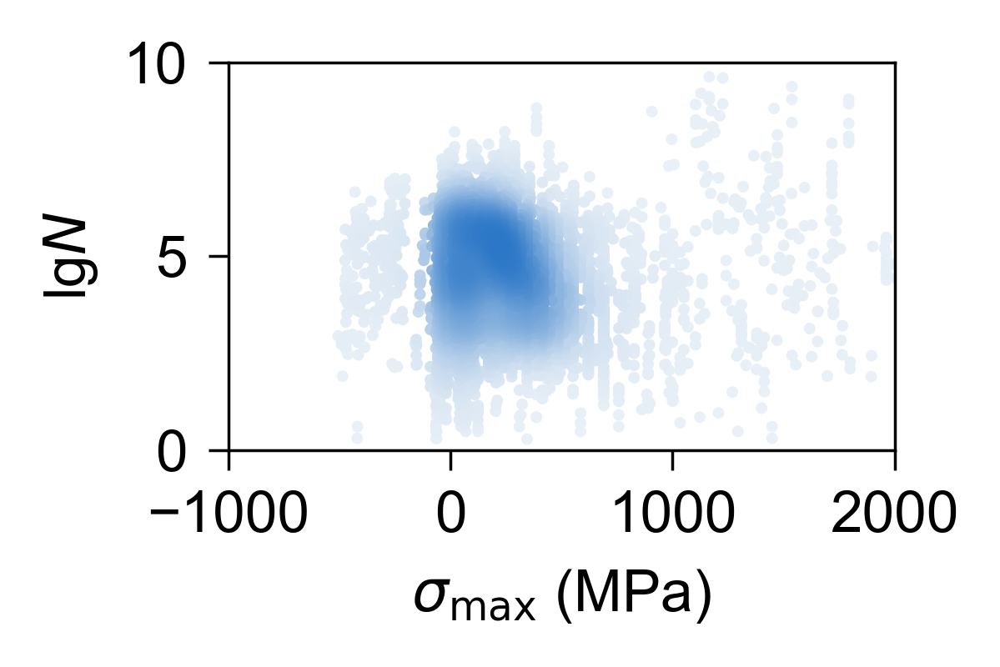

In [77]:
from matplotlib.colors import LinearSegmentedColormap
ax = trainer.plot_scatter(x_col="Maximum Stress", y_col="log10(Cycles to Failure)", kde_color=True, scatter_kwargs=dict(s=1, cmap=LinearSegmentedColormap.from_list("kde", [[233/255, 240/255, 247/255],[44/255, 119/255, 199/255]]), rasterized=True), save_show_close=False, figure_kwargs=dict(figsize=(2.5,1.7), dpi=500))
replace_feature_names(ax)
ax.set_xlabel(ax.get_xlabel()+" (MPa)")
set_linewidth(ax)
ax.set_ylim([0, 10])
ax.set_xlim([-1000, 2000])
plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "stress_cycle_subfig.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

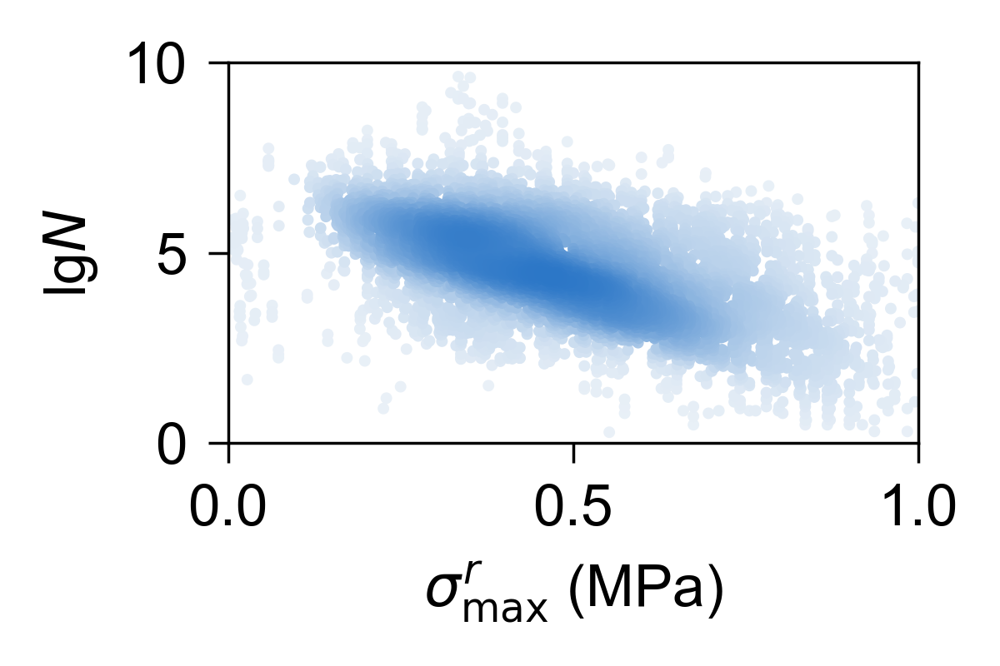

In [102]:
from matplotlib.colors import LinearSegmentedColormap
ax = trainer.plot_scatter(x_col="Relative Maximum Stress", y_col="log10(Cycles to Failure)", kde_color=True, scatter_kwargs=dict(s=1, cmap=LinearSegmentedColormap.from_list("kde", [[233/255, 240/255, 247/255],[44/255, 119/255, 199/255]]), rasterized=True), save_show_close=False, figure_kwargs=dict(figsize=(2.5,1.7), dpi=500))
replace_feature_names(ax)
ax.set_xlabel(ax.get_xlabel()+" (MPa)")
set_linewidth(ax)
ax.set_ylim([0, 10])
ax.set_xlim([0, 1])
plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "relative_stress_cycle_subfig.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

## Validate empirical conclusions

In [27]:
def plot_sliced_kde_scatter(trainer, ax, x, y, x_name, y_name, cm, intervals, inset_axes_bbox_to_anchor_kxb, inset_axes_bbox_to_anchor_kyb, inset_axes_width, inset_axes_height, xlim, ylim, density_lim, xlog, arrow_x, arrow_xlim, arrow_ylim, arrow_kAb, arrow_kBb):
    from mpl_toolkits.axes_grid1.inset_locator import inset_axes
    import matplotlib.patches as mpatches
    from scipy.stats import pearsonr

    indices = np.intersect1d(np.where(1-np.isnan(x))[0], np.where(1-np.isnan(y))[0])
    r = pearsonr(x[indices], y[indices])
    ax.text(.98, .02, s=f"$r={r[0]:.3f}$, $p=${to_scientific_notation(r.pvalue, fmt='%1.1e')}", ha='right', va='bottom', transform=ax.transAxes)

    for idx, intv in enumerate(intervals):
        inset_ax = inset_axes(ax, bbox_to_anchor=(inset_axes_bbox_to_anchor_kxb[0]*intv[0]+inset_axes_bbox_to_anchor_kxb[1], inset_axes_bbox_to_anchor_kyb[0]*intv[1]+inset_axes_bbox_to_anchor_kyb[1]), 
                              width=inset_axes_width, height=inset_axes_height, bbox_transform=ax.transData)
        # inset_ax.set_frame_on(False)
        inset_ax.tick_params(
                    labelcolor="none",
                    which="both",
                    top=False,
                    bottom=False,
                    left=False,
                    right=False,
                )
        set_linewidth(inset_ax, width=0.3)
        [i.set_linewidth(0) for i in [inset_ax.spines["left"], inset_ax.spines["right"], inset_ax.spines["top"]]]
        inset_ax.patch.set_alpha(0)
        inset_ax.set_xlim(xlim)
        inset_ax.set_ylim(density_lim)
        if xlog:
            inset_ax.set_xscale("log")
        trainer.plot_kde(x_col=x_name, ax=inset_ax, select_by_value_kwargs={"selection": {y_name: intv}}, clr=[(0., 0., 0.)], kdeplot_kwargs={"label": f"[{intv[0]}, {intv[1]})", "linewidth": 0.5})
        
        arrow = mpatches.FancyArrowPatch((arrow_x, arrow_kAb[0]*intv[0]+arrow_kAb[1]), (arrow_x, arrow_kBb[0]*intv[1]+arrow_kBb[1]), mutation_scale=7, 
                                         linewidth=0., arrowstyle=mpatches.ArrowStyle.CurveFilledAB(), color="black", zorder=10)
        ax.add_patch(arrow)
    ax.plot(arrow_xlim, arrow_ylim, linewidth=0.3, c="k", zorder=10)

    trainer.plot_scatter(x_col=x_name, y_col=y_name, kde_color=True, scatter_kwargs=dict(s=1, alpha=1, rasterized=True, cmap=cm), ax=ax, save_show_close=False)
    if xlog:
        ax.set_xscale("log")
    ax.set_ylabel(y_name)
    ax.set_xlabel(x_name)
    ax.set_ylim(ylim)
    ax.set_xlim(xlim)

/tmp/ipykernel_10023/885790323.py:33: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


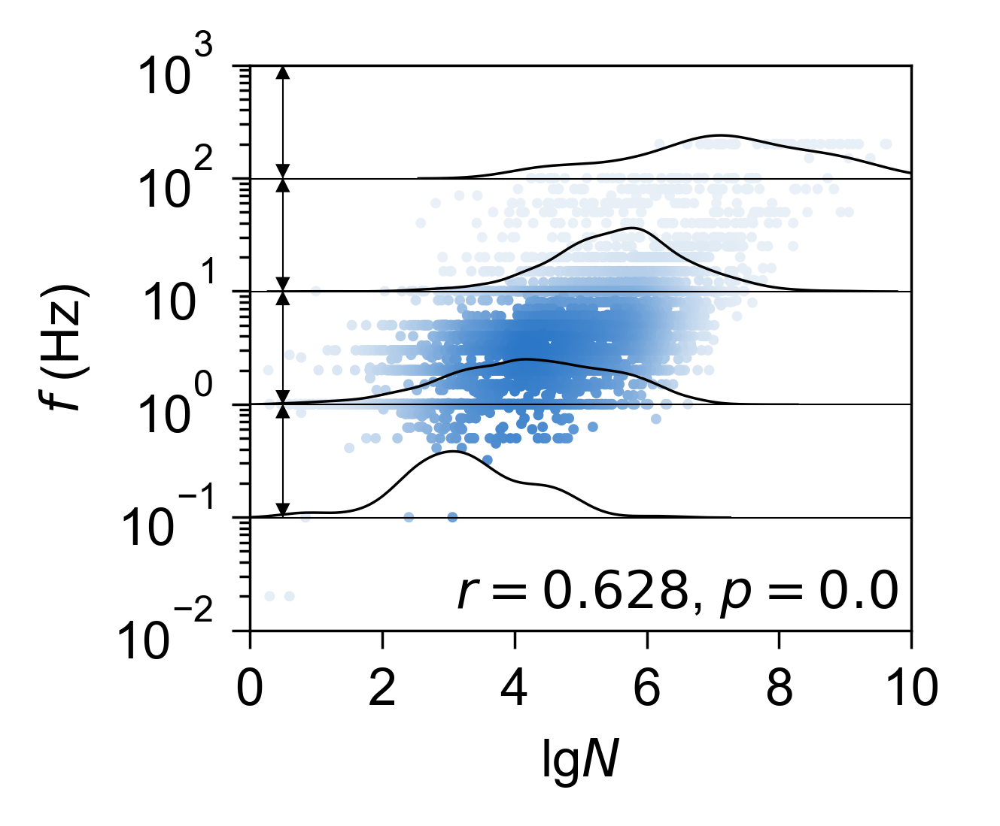

In [28]:
from matplotlib.colors import LinearSegmentedColormap

intervals = [(1e-1, 1e0), (1e0, 1e1), (1e1, 1e2), (1e2, 1e3)]
x = trainer.datamodule.get_not_imputed_df()["log10(Cycles to Failure)"].values.flatten()
y = np.log10(trainer.datamodule.get_not_imputed_df()["Frequency"])
x_name = "log10(Cycles to Failure)"
y_name = "Frequency"
inset_axes_bbox_to_anchor_kxb = (0, 10.4)
inset_axes_bbox_to_anchor_kyb = (0.78, 0)
inset_axes_width, inset_axes_height = 1.76, 0.2
xlim, ylim = [0, 10], [1e-2, 1e3]
density_lim = [0, 0.5]
arrow_x = 0.5
arrow_xlim = [0.5, 0.5]
arrow_ylim = [1e-1, 1e3]
arrow_kAb, arrow_kBb = (0.8, 0), (1.25, 0)
xlog=False
cm = LinearSegmentedColormap.from_list("kde", [[233/255, 240/255, 247/255],[44/255, 119/255, 199/255]])

fig = plt.figure(figsize=(2.7,2.3), dpi=500)
ax = plt.subplot(111)

plot_sliced_kde_scatter(trainer, ax, x, y, x_name, y_name, cm, intervals, inset_axes_bbox_to_anchor_kxb, inset_axes_bbox_to_anchor_kyb, inset_axes_width, inset_axes_height, xlim, ylim, density_lim, xlog, arrow_x, arrow_xlim, arrow_ylim, arrow_kAb, arrow_kBb)

ax.set_yscale("log")
ax.set_ylabel("Frequency (Hz)")
ax.set_xlabel("log10(Cycles to Failure)")
replace_feature_names(ax)
set_linewidth(ax)
ax.set_ylim([1e-2, 1e3])
ax.set_xlim([0, 10])

plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "freq_cycle.jpg"), dpi=1000, bbox_inches="tight")
plt.show()
plt.close()

The project will be saved to output/test/2024-04-21-13-45-35-0_modulus
Dataset size: 226 76 76
Data saved to output/test/2024-04-21-13-45-35-0_modulus (data.csv and tabular_data.csv).


/tmp/ipykernel_10023/2425594922.py:42: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


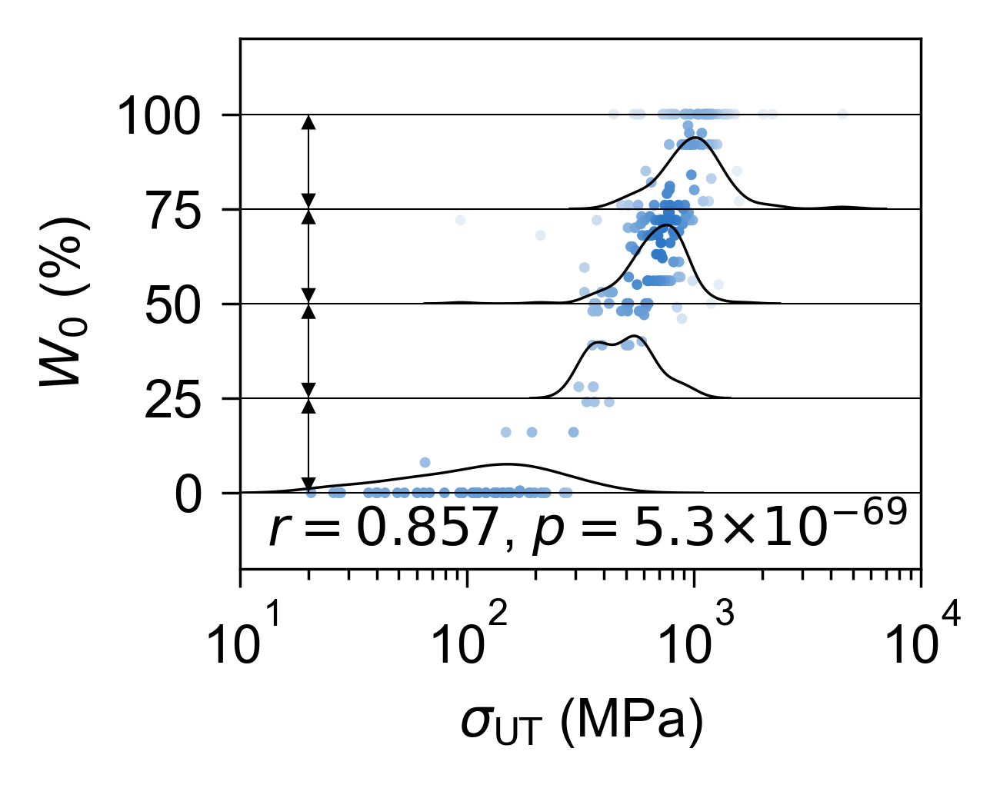

In [29]:
from matplotlib.colors import LinearSegmentedColormap

configfile = "modulus"
modulus_trainer = FatigueTrainer(device=device, project="test")
modulus_trainer.load_config(
        configfile
    )
modulus_trainer.load_data()

intervals = [(-0.01, 25), (25, 50), (50, 75), (75, 100.01)]
x = np.log10(modulus_trainer.datamodule.get_not_imputed_df()["Ultimate Tensile Stress"].values.flatten())
y = modulus_trainer.datamodule.get_not_imputed_df()["Fiber Weight Fraction (0-deg)"]
x_name = "Ultimate Tensile Stress"
y_name = "Fiber Weight Fraction (0-deg)"
inset_axes_bbox_to_anchor_kxb = (0, 1.31e4)
inset_axes_bbox_to_anchor_kyb = (1, 7.4)
inset_axes_width, inset_axes_height = 1.77, 0.25
xlim, ylim = [1e1, 1e4], [-20, 120]
density_lim = [0, 4]
arrow_x = 2e1
arrow_xlim = [2e1, 2e1]
arrow_ylim = [0, 100]
arrow_kAb, arrow_kBb = (1, -2.7), (1, 2.7)
xlog=True
cm = LinearSegmentedColormap.from_list("kde", [[233/255, 240/255, 247/255],[44/255, 119/255, 199/255]])

fig = plt.figure(figsize=(2.7,2.15), dpi=500)
ax = plt.subplot(111)

plot_sliced_kde_scatter(modulus_trainer, ax, x, y, x_name, y_name, cm, intervals, inset_axes_bbox_to_anchor_kxb, inset_axes_bbox_to_anchor_kyb, inset_axes_width, inset_axes_height, xlim, ylim, density_lim, xlog, arrow_x, arrow_xlim, arrow_ylim, arrow_kAb, arrow_kBb)
ax.plot(xlim, [100, 100], c="k", linewidth=0.3)
ax.set_ylabel("Fiber Weight Fraction (0-deg)")
ax.set_xlabel("Ultimate Tensile Stress (MPa)")
replace_feature_names(ax)
set_linewidth(ax)
ax.set_ylabel(ax.get_ylabel() + " (%)")
ax.set_ylim([-20, 120])
ax.set_xlim([1e1, 1e4])
ax.set_yticks([0, 25, 50, 75, 100])
ax.set_yticklabels([0, 25, 50, 75, 100])

plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "fiber_strength.jpg"), dpi=1000, bbox_inches="tight")
plt.show()
plt.close()

/tmp/ipykernel_10023/2220873899.py:42: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


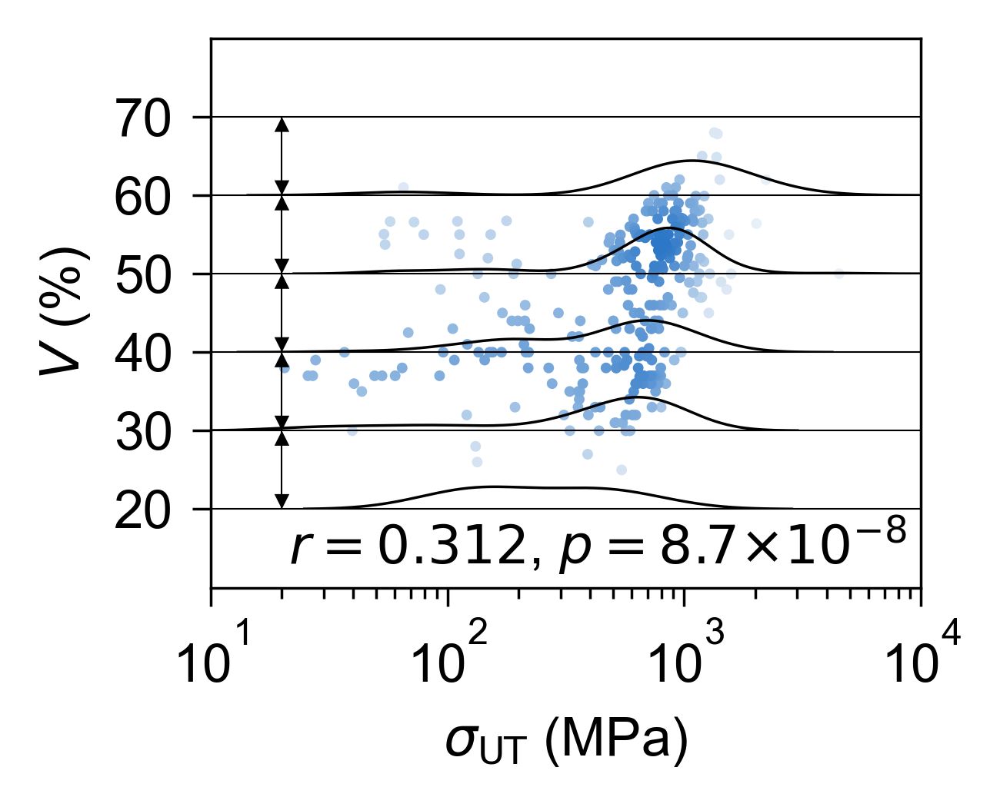

In [30]:
from matplotlib.colors import LinearSegmentedColormap

# configfile = "modulus"
# modulus_trainer = FatigueTrainer(device=device, project="test")
# modulus_trainer.load_config(
#         configfile
#     )
# modulus_trainer.load_data()

intervals = [(20, 30), (30, 40), (40, 50), (50, 60), (60, 70)]
x = np.log10(modulus_trainer.datamodule.get_not_imputed_df()["Ultimate Tensile Stress"].values.flatten())
y = modulus_trainer.datamodule.get_not_imputed_df()["Fiber Volume Fraction"]
x_name = "Ultimate Tensile Stress"
y_name = "Fiber Volume Fraction"
inset_axes_bbox_to_anchor_kxb = (0, 1.28e4)
inset_axes_bbox_to_anchor_kyb = (1, 5.65)
inset_axes_width, inset_axes_height = 1.843, 0.25
xlim, ylim = [1e1, 1e4], [10, 80]
density_lim = [0, 4]
arrow_x = 2e1
arrow_xlim = [2e1, 2e1]
arrow_ylim = [20, 70]
arrow_kAb, arrow_kBb = (1, -1.35), (1, 1.35)
xlog=True
cm = LinearSegmentedColormap.from_list("kde", [[233/255, 240/255, 247/255],[44/255, 119/255, 199/255]])

fig = plt.figure(figsize=(2.7,2.2), dpi=500)
ax = plt.subplot(111)

plot_sliced_kde_scatter(modulus_trainer, ax, x, y, x_name, y_name, cm, intervals, inset_axes_bbox_to_anchor_kxb, inset_axes_bbox_to_anchor_kyb, inset_axes_width, inset_axes_height, xlim, ylim, density_lim, xlog, arrow_x, arrow_xlim, arrow_ylim, arrow_kAb, arrow_kBb)
ax.plot(xlim, [70, 70], c="k", linewidth=0.3)
ax.set_ylabel("Fiber Volume Fraction")
ax.set_xlabel("Ultimate Tensile Stress (MPa)")
replace_feature_names(ax)
set_linewidth(ax)
ax.set_ylabel(ax.get_ylabel() + " (%)")
ax.set_ylim(ylim)
ax.set_xlim(xlim)
ax.set_yticks([20, 30, 40, 50, 60, 70])
ax.set_yticklabels([20, 30, 40, 50, 60, 70])

plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "FVF_strength.jpg"), dpi=1000, bbox_inches="tight")
plt.show()
plt.close()

The project will be saved to output/test/2024-03-31-13-39-08-0_modulus
Dataset size: 226 76 76
Data saved to output/test/2024-03-31-13-39-08-0_modulus (data.csv and tabular_data.csv).


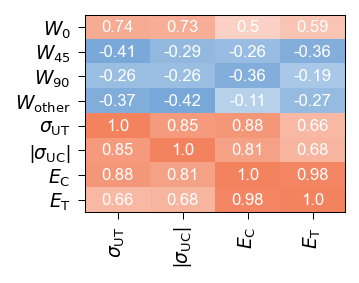

In [ ]:
import numpy as np
from tabensemb.data.utils import get_corr_sets

fiber_features = ["Fiber Weight Fraction (0-deg)", "Fiber Weight Fraction (45-deg)", "Fiber Weight Fraction (90-deg)", "Fiber Weight Fraction (Other Dir.)"]
property_features = ["Ultimate Tensile Stress", "Ultimate Compressive Stress", "Tensile Modulus", "Compressive Modulus"]
features = ["Fiber Weight Fraction (0-deg)", "Fiber Weight Fraction (45-deg)", "Fiber Weight Fraction (90-deg)", "Fiber Weight Fraction (Other Dir.)"] + ["Ultimate Tensile Stress", "Ultimate Compressive Stress", "Compressive Modulus"]
configfile = "modulus"
modulus_trainer = FatigueTrainer(device=device, project="test")
modulus_trainer.load_config(
        configfile,
        manual_config={"continuous_feature_names": features}
    )
modulus_trainer.load_data()
modulus_trainer.datamodule.df["Ultimate Compressive Stress"] = np.abs(modulus_trainer.datamodule.df["Ultimate Compressive Stress"])

# df = modulus_trainer.datamodule.get_not_imputed_df()[fiber_features+property_features]
# corr = df.corr().loc[property_features, fiber_features+property_features]
plt.figure(figsize=(2.5,2.5), dpi=150)
ax = plt.subplot(111)
modulus_trainer.plot_corr(fontsize=9, ax=ax, features=features, include_label=True, imputed=False, imshow_kwargs=dict(cmap=LinearSegmentedColormap.from_list("imshow_blru", [[88/255, 146/255, 208/255], [1, 1, 1], [243/255, 131/255, 95/255]])), save_show_close=False)
ax.set_aspect(0.38)
replace_feature_names(ax, special_mapping={"Ultimate Compressive Stress": r"|$\sigma_{\text{UC}}$|"})
for child in ax.get_children():
    # print(child)
    if isinstance(child, matplotlib.text.Text) and child.get_position()[0]<3.5:
        child.set_text(None)
    elif isinstance(child, matplotlib.text.Text):
        child.set(fontsize=8)
ax.set_xlim(3.5, 7.5)
set_linewidth(ax)
plt.savefig(os.path.join(trainer.project_root, "fiber_prop_corr.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

## Theoretical accuracy

Assuming Gaussian distribution

In [ ]:
res = trainer.cal_theoretical_pof50(max_stress_col="Maximum Stress", r_value_col="R-value", freq_col="Frequency")
from tabensemb.utils import auto_metric_sklearn
auto_metric_sklearn(trainer.df["log10(Cycles to Failure)"].values, res, metric="rmse", task="regression"), auto_metric_sklearn(trainer.df["log10(Cycles to Failure)"].values, res, metric="mape", task="regression"), auto_metric_sklearn(10**trainer.df["log10(Cycles to Failure)"].values, 10**res, metric="rmse", task="regression"), auto_metric_sklearn(10**trainer.df["log10(Cycles to Failure)"].values, 10**res, metric="mape", task="regression")

Theoretical accuracy at PoF=50% (gaussian distribution):
	 Training MSE 0.04718, RMSE 0.21721
	 Validation MSE 0.04072, RMSE 0.20179
	 Testing MSE 0.03923, RMSE 0.19807
	 Overall MSE 0.04430, RMSE 0.21047


(0.21047270724204545,
 0.03163695282209623,
 49468611.54569157,
 0.3597391938589892)

only repeated experiments

In [ ]:
unique_values, counts = np.unique(res, return_counts=True)
unique_values_rep = unique_values[counts>=2]
rep_idx = np.concatenate([np.where(res==val)[0] for val in unique_values_rep])
auto_metric_sklearn(trainer.df["log10(Cycles to Failure)"].values[rep_idx], res[rep_idx], metric="rmse", task="regression"), auto_metric_sklearn(trainer.df["log10(Cycles to Failure)"].values[rep_idx], res[rep_idx], metric="mape", task="regression"), auto_metric_sklearn(10**trainer.df["log10(Cycles to Failure)"].values[rep_idx], 10**res[rep_idx], metric="rmse", task="regression"), auto_metric_sklearn(10**trainer.df["log10(Cycles to Failure)"].values[rep_idx], 10**res[rep_idx], metric="mape", task="regression")

(0.2608666711882282,
 0.048600447153526544,
 61312994.88340587,
 0.5526286231961326)

In [ ]:
len(unique_values_rep), len(unique_values)

(1543, 3906)

Assuming Weibull distribution

In [ ]:
res = trainer.cal_theoretical_pof50(max_stress_col="Maximum Stress", r_value_col="R-value", freq_col="Frequency", distribution="weibull")
from tabensemb.utils import auto_metric_sklearn
auto_metric_sklearn(trainer.df["log10(Cycles to Failure)"].values, res, metric="rmse", task="regression"), auto_metric_sklearn(trainer.df["log10(Cycles to Failure)"].values, res, metric="mape", task="regression"), auto_metric_sklearn(10**trainer.df["log10(Cycles to Failure)"].values, 10**res, metric="rmse", task="regression"), auto_metric_sklearn(10**trainer.df["log10(Cycles to Failure)"].values, 10**res, metric="mape", task="regression")

  0%|          | 0/454 [00:00<?, ?it/s]

Theoretical accuracy at PoF=50% (weibull distribution):
	 Training MSE 0.09109, RMSE 0.30181
	 Validation MSE 0.07852, RMSE 0.28021
	 Testing MSE 0.09288, RMSE 0.30476
	 Overall MSE 0.08893, RMSE 0.29821


(0.29821479834700804,
 0.03899968857232207,
 59462730.365019895,
 0.6471538489496266)

In [ ]:
unique_values, counts = np.unique(res, return_counts=True)
unique_values_rep = unique_values[counts>=2]
rep_idx = np.concatenate([np.where(res==val)[0] for val in unique_values_rep])
auto_metric_sklearn(trainer.df["log10(Cycles to Failure)"].values[rep_idx], res[rep_idx], metric="rmse", task="regression"), auto_metric_sklearn(trainer.df["log10(Cycles to Failure)"].values[rep_idx], res[rep_idx], metric="mape", task="regression"), auto_metric_sklearn(10**trainer.df["log10(Cycles to Failure)"].values[rep_idx], 10**res[rep_idx], metric="rmse", task="regression"), auto_metric_sklearn(10**trainer.df["log10(Cycles to Failure)"].values[rep_idx], 10**res[rep_idx], metric="mape", task="regression")

(0.369658995152234,
 0.059924623612033684,
 73708391.66124842,
 0.9943784742144739)

## Histograms

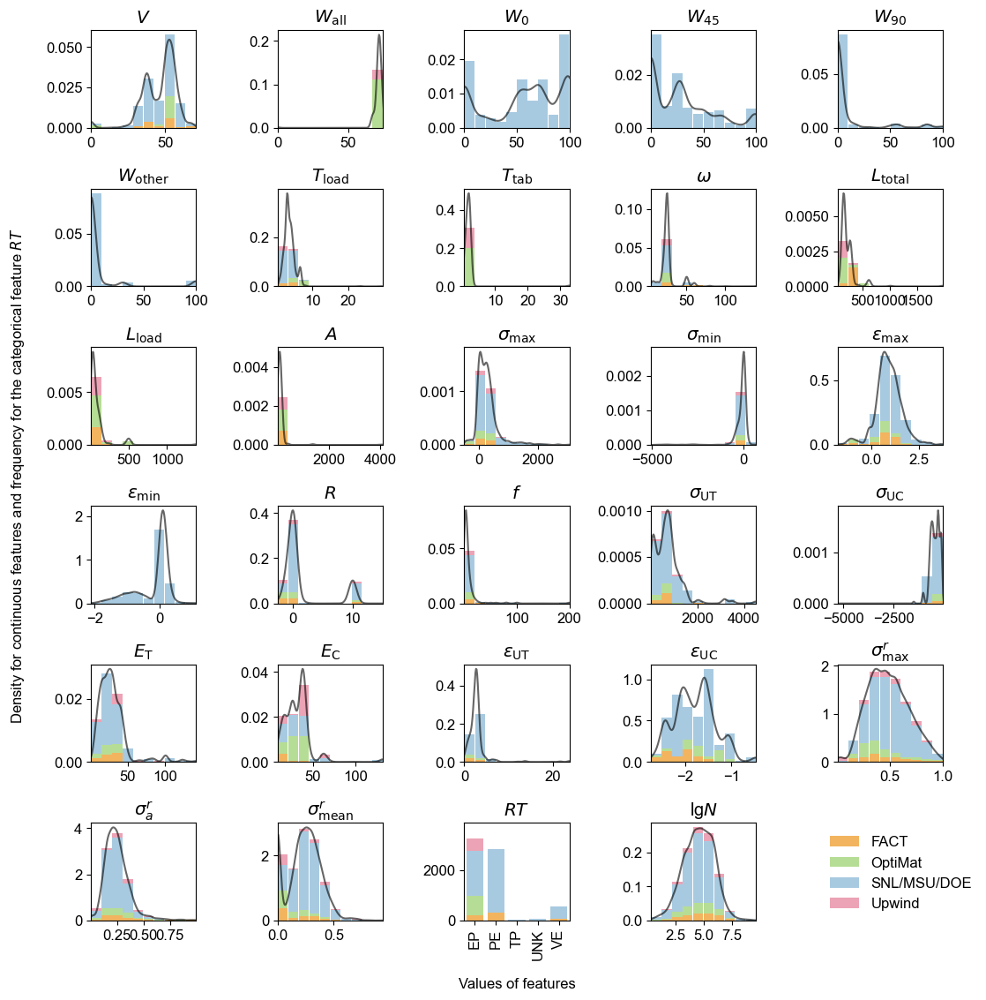

In [ ]:
from tabensemb.utils.utils import global_palette, global_marker

fig = trainer.plot_hist_all(imputed=False, get_figsize_kwargs=dict(max_width=12, height_per_item=2., max_col=5), kde=True, kde_kwargs=dict(kdeplot_kwargs=dict(color="k", alpha=0.6, zorder=10)), category="Data source", save_show_close=False)
for ax in fig.get_axes()[:-1]:
    handles, labels = ax.get_legend_handles_labels()
    ax.get_legend().remove()
    replace_feature_names(ax, set_title=True, process_x=False, process_y=False)
ax = fig.get_axes()[-1]
ax.legend(handles, labels, ncols=1, frameon=False, bbox_to_anchor=(1.05, 0.11))
ax.set_ylabel("Density for continuous features and frequency for the categorical feature $RT$\n\n")
ax.set_xlabel("\n\nValues of features")
plt.savefig(os.path.join(trainer.project_root, "all_hist.pdf"), dpi=500, bbox_inches="tight")
plt.tight_layout()
plt.show()
plt.close()

## Correlation

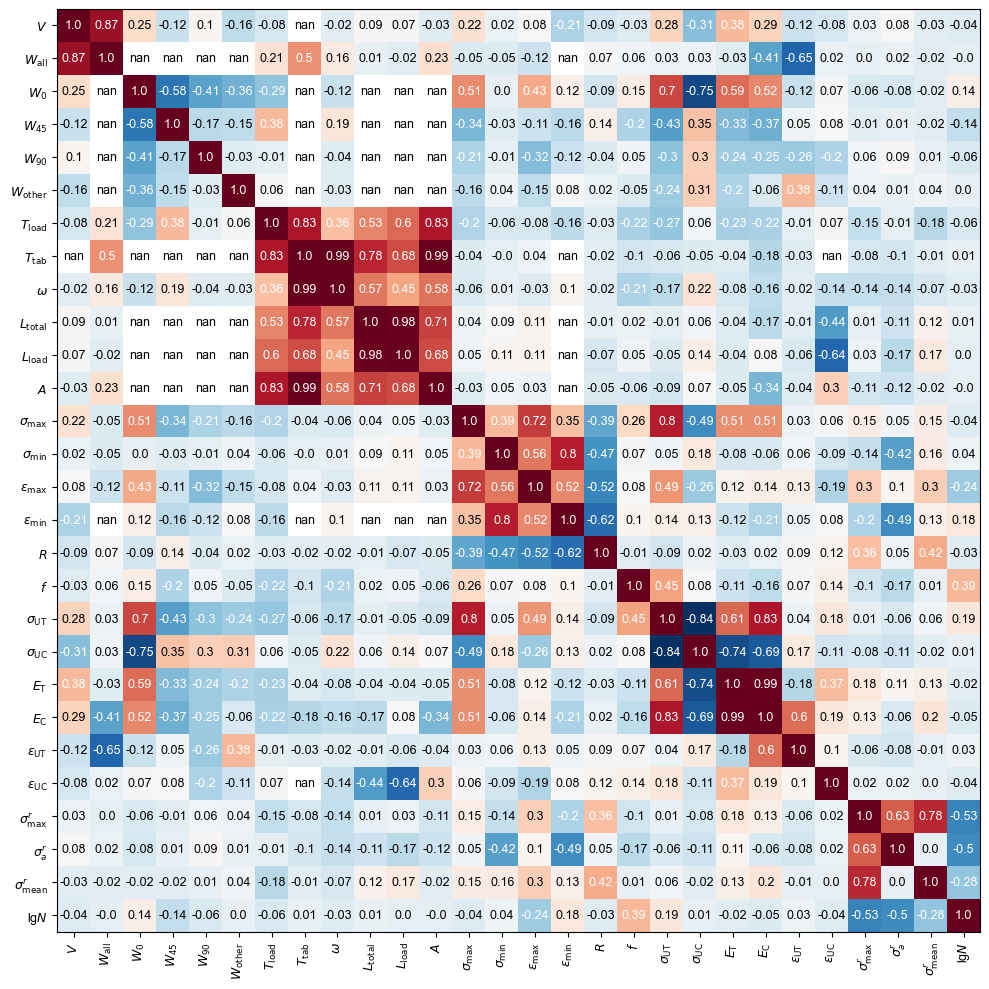

In [ ]:
ax = trainer.plot_corr(fontsize=9, imputed=False, imshow_kwargs=dict(cmap="RdBu_r"), save_show_close=False)
replace_feature_names(ax)
plt.savefig(os.path.join(trainer.project_root, "all_corr.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

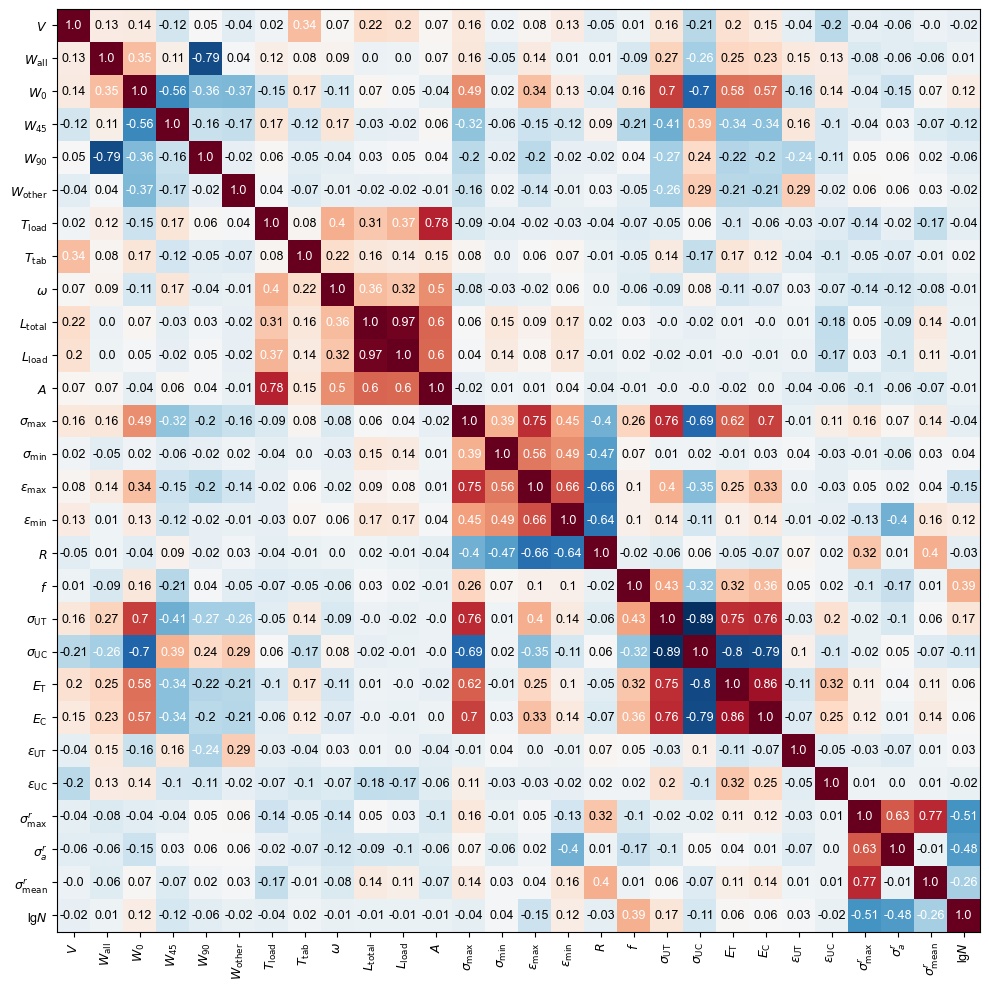

In [ ]:
ax = trainer.plot_corr(fontsize=9, imputed=True, imshow_kwargs=dict(cmap="RdBu_r"), save_show_close=False)
replace_feature_names(ax)
plt.savefig(os.path.join(trainer.project_root, "all_corr_imputed.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

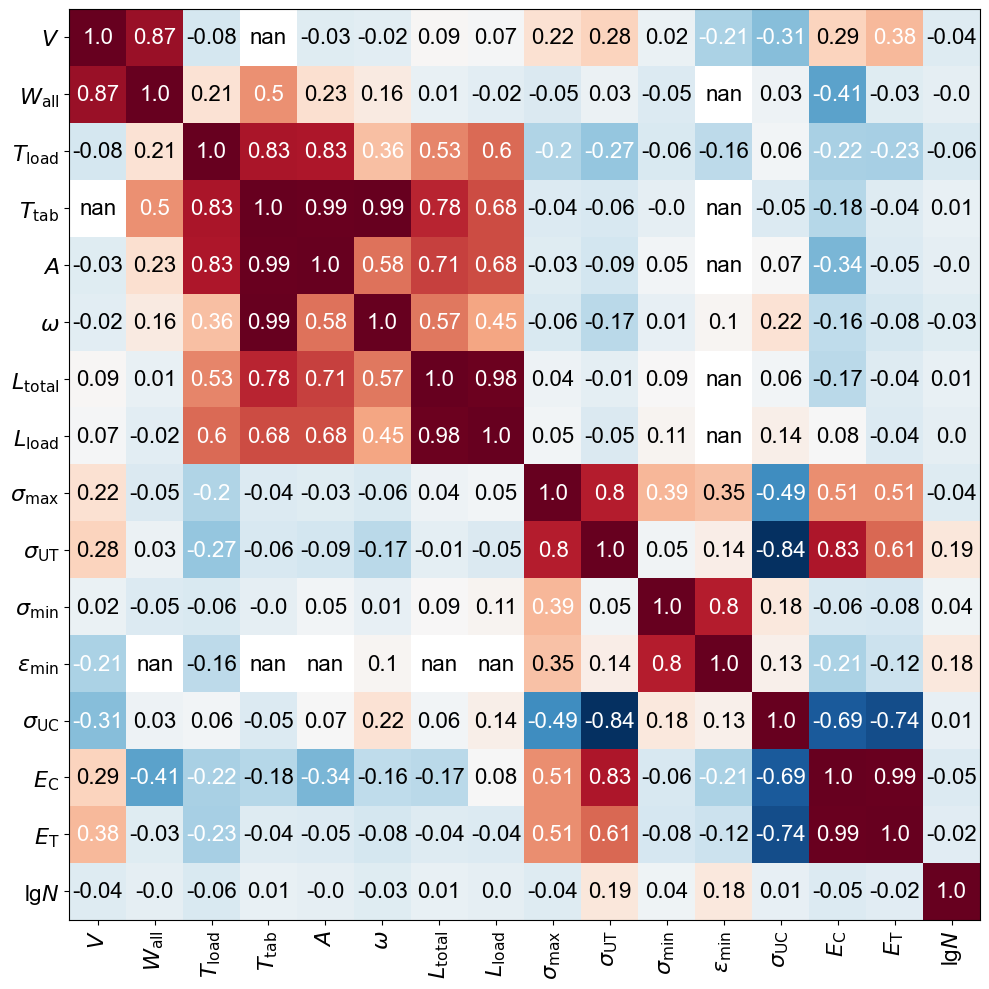

In [ ]:
import numpy as np
from tabensemb.data.utils import get_corr_sets

corr = trainer.datamodule.cal_corr(imputed=False, features_only=True).loc[trainer.cont_feature_names, trainer.cont_feature_names].abs()
corr_names = get_corr_sets(np.where(corr>0.8), trainer.cont_feature_names)[0]
ax = trainer.plot_corr(fontsize=16, features=corr_names, include_label=True, imputed=False, imshow_kwargs=dict(cmap="RdBu_r"), save_show_close=False)
replace_feature_names(ax)
plt.savefig(os.path.join(trainer.project_root, "high_corr.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

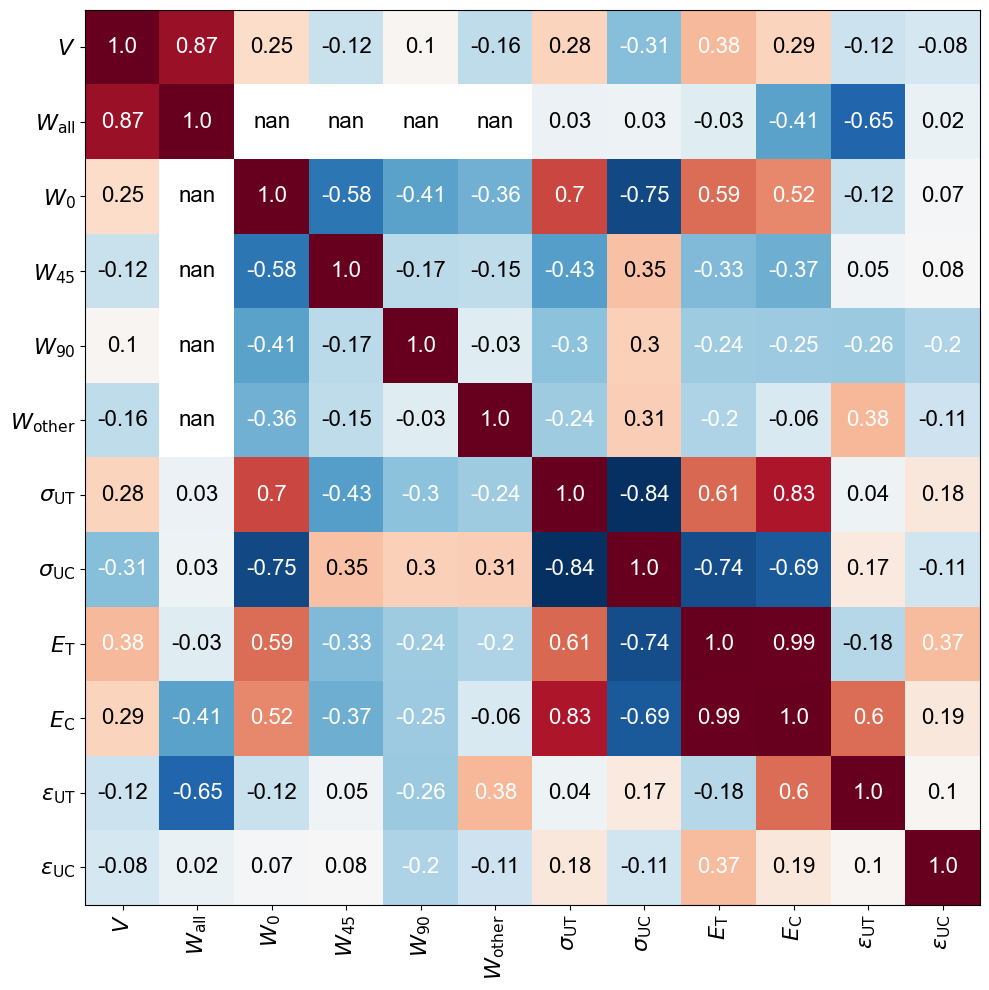

In [ ]:
import numpy as np
from tabensemb.data.utils import get_corr_sets

corr = trainer.datamodule.cal_corr(imputed=False, features_only=True).loc[trainer.cont_feature_names, trainer.cont_feature_names].abs()
corr_names = get_corr_sets(np.where(corr>0.3), trainer.cont_feature_names)[0]
corr_names = [x for x in trainer.datamodule.get_feature_names_by_type("Material") + trainer.datamodule.get_feature_names_by_type("Property") if x in corr_names]
ax = trainer.plot_corr(fontsize=16, features=corr_names, include_label=False, imputed=False, imshow_kwargs=dict(cmap="RdBu_r"), save_show_close=False)
replace_feature_names(ax)
plt.savefig(os.path.join(trainer.project_root, "high_corr_mat_prop.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

## Boxplot

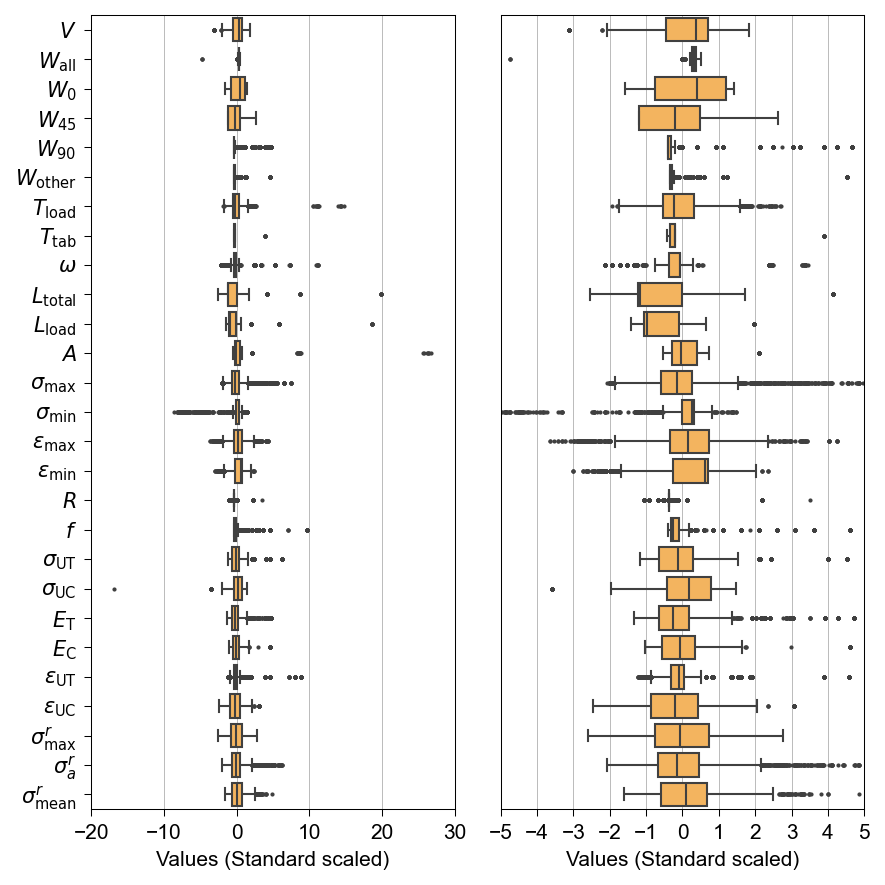

In [ ]:
plt.figure(figsize=(6, 6), dpi=150)
ax = plt.subplot(121)
ax = trainer.plot_feature_box(imputed=False, ax=ax, save_show_close=False, figure_kwargs=dict(figsize=(3, 6), dpi=150, saturation=1), boxplot_kwargs=dict(fliersize=1))
replace_feature_names(ax)
set_linewidth(ax)
ax.set_xlabel("Values (Standard scaled)")
ax = plt.subplot(122)
ax = trainer.plot_feature_box(imputed=False, ax=ax, save_show_close=False, figure_kwargs=dict(figsize=(3, 6), dpi=150, saturation=1), boxplot_kwargs=dict(fliersize=1))
ax.set_xlim([-5, 5])
ax.set_xticks(range(-5, 6))
ax.set_yticks([])
ax.set_yticklabels([])
# ax.grid(axis=x)
replace_feature_names(ax)
set_linewidth(ax)
ax.set_xlabel("Values (Standard scaled)")
plt.savefig(os.path.join(trainer.project_root, "boxplot.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

## Compare with other datasets

### Forest Cover
The Forest Cover Type dataset is downloaded from UCI database

In [81]:
cfg = tabensemb.config.UserConfig.from_uci(name="Covertype")

No file with suffix `.data` is found. The downloaded file is saved to data/Covertype.zip.


In [83]:
os.system("unzip data/Covertype.zip -d data/Covertype")

Archive:  data/Covertype.zip
  inflating: data/Covertype/covtype.data.gz  
  inflating: data/Covertype/covtype.info  
  inflating: data/Covertype/old_covtype.info  


0

In [85]:
os.system("gzip -d data/Covertype/covtype.data.gz")

0

In [24]:
df_covertype = pd.read_csv("data/Covertype/covtype.data", header=None)
df_covertype.columns = ["Elevation", "Aspect", "Slope", "Horizontal_Distance_To_Hydrology", "Vertical_Distance_To_Hydrology", "Horizontal_Distance_To_Roadways", "Hillshade_9am", "Hillshade_Noon", "Hillshade_3pm", "Horizontal_Distance_To_Fire_Points", ] + [f"Wilderness_Area_{i}" for i in range(4)] + [f"Soil_Type_{i}" for i in range(40)] + ["Cover_Type"]
df_covertype.to_csv("data/covtype.csv", index=False)

Categorical features are ignored in this analysis

In [27]:
cfg = tabensemb.config.UserConfig()
cfg.update({"database": "data/covtype.csv", "continuous_feature_names": ["Elevation", "Aspect", "Slope", "Horizontal_Distance_To_Hydrology", "Vertical_Distance_To_Hydrology", "Horizontal_Distance_To_Roadways", "Hillshade_9am", "Hillshade_Noon", "Hillshade_3pm", "Horizontal_Distance_To_Fire_Points", ],
    "categorical_feature_names": [], "label_name": ["Cover_Type"],})
data_covtype = tabensemb.data.DataModule(cfg)
data_covtype.load_data()

Dataset size: 348606 116203 116203


In [28]:
desc = data_covtype.describe()[data_covtype.cont_feature_names]

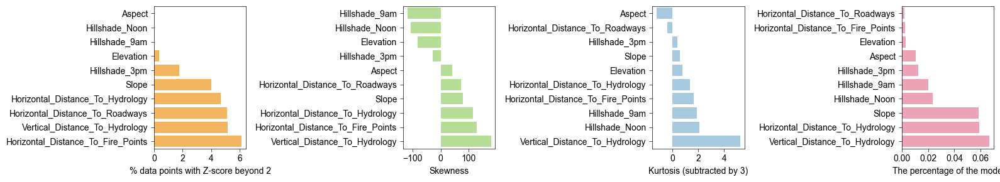

In [30]:
import os

plt.figure(figsize=(16, 3), dpi=100)
ax = plt.subplot(141)
features = [x for x in desc.columns if x not in trainer.cat_feature_names]
values = desc.loc["Percentage of points with Z-score beyond 2", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order]*100, color=tabensemb.utils.global_palette[0])
ax.set_xlabel(r"% data points with Z-score beyond 2")
replace_feature_names(ax)
ax.set_ylim([-0.5, len(features)-0.5])
set_linewidth(ax)

ax = plt.subplot(142)
features = [x for x in desc.columns if x not in trainer.cat_feature_names]
values = desc.loc["Skewness", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order]*100, color=tabensemb.utils.global_palette[1])
ax.set_xlabel(r"Skewness")
ax.set_ylim([-0.5, len(features)-0.5])
replace_feature_names(ax)
set_linewidth(ax)

ax = plt.subplot(143)
features = [x for x in desc.columns if x not in trainer.cat_feature_names]
values = desc.loc["Kurtosis", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order], color=tabensemb.utils.global_palette[2])
ax.set_xlabel("Kurtosis (subtracted by 3)")
replace_feature_names(ax)
ax.set_ylim([-0.5, len(features)-0.5])
set_linewidth(ax)

ax = plt.subplot(144)
features = list(desc.columns)
values = desc.loc["Mode percentage", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order], color=tabensemb.utils.global_palette[3])
ax.set_xlabel("The percentage of the mode")
replace_feature_names(ax)
ax.set_ylim([-0.5, len(features)-0.5])
set_linewidth(ax)


plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "statistics_covtype.pdf"), dpi=500, bbox_inches="tight")
plt.show()

### Poker Hand
The Poker Hand dataset is also from UCI dataset

In [73]:
cfg = tabensemb.config.UserConfig.from_uci(name="Poker Hand", datafile_name="poker-hand-training-true")

S1 is Integer and will be treated as a continuous feature.
C1 is Integer and will be treated as a continuous feature.
S2 is Integer and will be treated as a continuous feature.
C2 is Integer and will be treated as a continuous feature.
S3 is Integer and will be treated as a continuous feature.
C3 is Integer and will be treated as a continuous feature.
S4 is Integer and will be treated as a continuous feature.
C4 is Integer and will be treated as a continuous feature.
S5 is Integer and will be treated as a continuous feature.
C5 is Integer and will be treated as a continuous feature.


/home/xlluo/hdd/tabular_ensemble/tabensemb/config/user_config.py:292: UserWarning: There exists .test file(s) ['poker-hand-testing.data'] which should be used for final metrics. The .zip file is left for the user to process.
  warnings.warn(
/home/xlluo/hdd/tabular_ensemble/tabensemb/config/user_config.py:323: UserWarning: `column_names` is not given. The order of columns will be loaded from the website. It is highly recommended to manually set column names. The downloaded .zip is saved. Please check its .name file for the correct order.
  warnings.warn(


In [74]:
cfg.update({"continuous_feature_names": ["C1", "C2", "C3", "C4", "C5"], "categorical_feature_names": ["S1", "S2", "S3", "S4", "S5"]})

In [75]:
data_poker = tabensemb.data.DataModule(cfg)
data_poker.load_data()

desc = data_poker.describe()[data_poker.cont_feature_names]

Dataset size: 15006 5002 5002


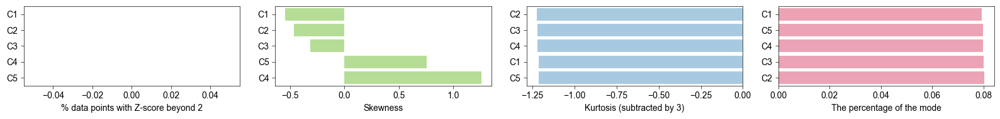

In [76]:
import os

plt.figure(figsize=(16, 2), dpi=100)
ax = plt.subplot(141)
features = [x for x in desc.columns if x not in trainer.cat_feature_names]
values = desc.loc["Percentage of points with Z-score beyond 2", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order]*100, color=tabensemb.utils.global_palette[0])
ax.set_xlabel(r"% data points with Z-score beyond 2")
replace_feature_names(ax)
ax.set_ylim([-0.5, len(features)-0.5])
set_linewidth(ax)

ax = plt.subplot(142)
features = [x for x in desc.columns if x not in trainer.cat_feature_names]
values = desc.loc["Skewness", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order]*100, color=tabensemb.utils.global_palette[1])
ax.set_xlabel(r"Skewness")
ax.set_ylim([-0.5, len(features)-0.5])
replace_feature_names(ax)
set_linewidth(ax)

ax = plt.subplot(143)
features = [x for x in desc.columns if x not in trainer.cat_feature_names]
values = desc.loc["Kurtosis", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order], color=tabensemb.utils.global_palette[2])
ax.set_xlabel("Kurtosis (subtracted by 3)")
replace_feature_names(ax)
ax.set_ylim([-0.5, len(features)-0.5])
set_linewidth(ax)

ax = plt.subplot(144)
features = list(desc.columns)
values = desc.loc["Mode percentage", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order], color=tabensemb.utils.global_palette[3])
ax.set_xlabel("The percentage of the mode")
replace_feature_names(ax)
ax.set_ylim([-0.5, len(features)-0.5])
set_linewidth(ax)


plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "statistics_pokerhand.pdf"), dpi=500, bbox_inches="tight")
plt.show()

### Iris

In [70]:
cfg = tabensemb.config.UserConfig.from_uci(name="Iris", datafile_name="iris")

/home/xlluo/hdd/tabular_ensemble/tabensemb/config/user_config.py:323: UserWarning: `column_names` is not given. The order of columns will be loaded from the website. It is highly recommended to manually set column names. The downloaded .zip is saved. Please check its .name file for the correct order.
  warnings.warn(


In [71]:
data_iris = tabensemb.data.DataModule(cfg)
data_iris.load_data()

desc = data_iris.describe()[data_iris.cont_feature_names]

Dataset size: 90 30 30


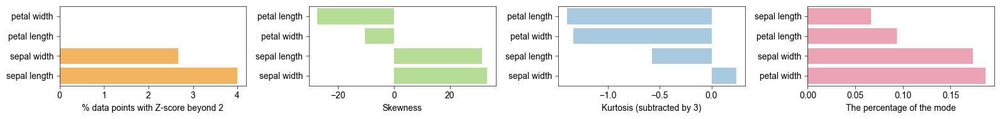

In [72]:
import os

plt.figure(figsize=(16, 2.), dpi=100)
ax = plt.subplot(141)
features = [x for x in desc.columns if x not in trainer.cat_feature_names]
values = desc.loc["Percentage of points with Z-score beyond 2", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order]*100, color=tabensemb.utils.global_palette[0])
ax.set_xlabel(r"% data points with Z-score beyond 2")
replace_feature_names(ax)
ax.set_ylim([-0.5, len(features)-0.5])
set_linewidth(ax)

ax = plt.subplot(142)
features = [x for x in desc.columns if x not in trainer.cat_feature_names]
values = desc.loc["Skewness", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order]*100, color=tabensemb.utils.global_palette[1])
ax.set_xlabel(r"Skewness")
ax.set_ylim([-0.5, len(features)-0.5])
replace_feature_names(ax)
set_linewidth(ax)

ax = plt.subplot(143)
features = [x for x in desc.columns if x not in trainer.cat_feature_names]
values = desc.loc["Kurtosis", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order], color=tabensemb.utils.global_palette[2])
ax.set_xlabel("Kurtosis (subtracted by 3)")
replace_feature_names(ax)
ax.set_ylim([-0.5, len(features)-0.5])
set_linewidth(ax)

ax = plt.subplot(144)
features = list(desc.columns)
values = desc.loc["Mode percentage", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order], color=tabensemb.utils.global_palette[3])
ax.set_xlabel("The percentage of the mode")
replace_feature_names(ax)
ax.set_ylim([-0.5, len(features)-0.5])
set_linewidth(ax)


plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "statistics_iris.pdf"), dpi=500, bbox_inches="tight")
plt.show()

### Heart Disease

In [46]:
cfg = tabensemb.config.UserConfig.from_uci(name="Heart Disease", datafile_name="processed.cleveland")

The dataset Heart Disease is not tabular. The downloaded file is saved to data/Heart Disease.zip.


In [48]:
os.system("unzip data/Heart\ Disease.zip -d data/Heart\ Disease")

Archive:  data/Heart Disease.zip
  inflating: data/Heart Disease/Index  
  inflating: data/Heart Disease/WARNING  
  inflating: data/Heart Disease/ask-detrano  
  inflating: data/Heart Disease/bak  
  inflating: data/Heart Disease/cleve.mod  
  inflating: data/Heart Disease/cleveland.data  
   creating: data/Heart Disease/costs/
  inflating: data/Heart Disease/costs/Index  
  inflating: data/Heart Disease/costs/heart-disease.README  
  inflating: data/Heart Disease/costs/heart-disease.cost  
  inflating: data/Heart Disease/costs/heart-disease.delay  
  inflating: data/Heart Disease/costs/heart-disease.expense  
  inflating: data/Heart Disease/costs/heart-disease.group  
  inflating: data/Heart Disease/heart-disease.names  
  inflating: data/Heart Disease/hungarian.data  
  inflating: data/Heart Disease/long-beach-va.data  
  inflating: data/Heart Disease/new.data  
  inflating: data/Heart Disease/processed.cleveland.data  
  inflating: data/Heart Disease/processed.hungarian.data  
  in

0

In [51]:
df_heart = pd.read_csv("data/Heart Disease/processed.cleveland.data", header=None)
df_heart.columns = ["age", "sex", "cp", "trestbps", "chol", "fbs", "restecg", "thalach", "exang", "oldpeak", "slope", "ca", "thal", "num"]

df_heart["ca"] = [x if x!="?" else np.nan for x in df_heart["ca"]]
df_heart["thal"] = [x if x!="?" else np.nan for x in df_heart["thal"]]
df_heart.to_csv("data/heart_disease.csv", index=False)

In [66]:
cfg = tabensemb.config.UserConfig()
cfg.update({"database": "data/heart_disease.csv", "continuous_feature_names": ["age", "trestbps", "chol", "thalach", "oldpeak", "ca"],
    "categorical_feature_names": ["sex", "cp", "fbs", "restecg", "exang", "slope", "thal"], "label_name": ["num"],})
data_heart = tabensemb.data.DataModule(cfg)
data_heart.load_data()

desc = data_heart.describe()[data_heart.cont_feature_names+data_heart.label_name]

Dataset size: 181 61 61


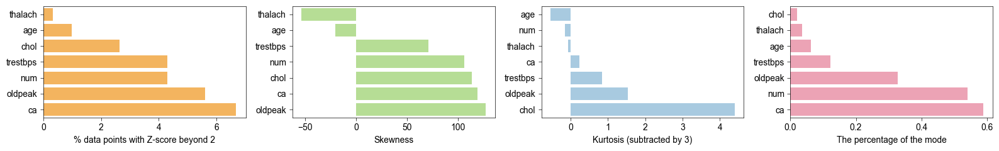

In [67]:
import os

plt.figure(figsize=(16, 2.5), dpi=100)
ax = plt.subplot(141)
features = [x for x in desc.columns if x not in trainer.cat_feature_names]
values = desc.loc["Percentage of points with Z-score beyond 2", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order]*100, color=tabensemb.utils.global_palette[0])
ax.set_xlabel(r"% data points with Z-score beyond 2")
replace_feature_names(ax)
ax.set_ylim([-0.5, len(features)-0.5])
set_linewidth(ax)

ax = plt.subplot(142)
features = [x for x in desc.columns if x not in trainer.cat_feature_names]
values = desc.loc["Skewness", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order]*100, color=tabensemb.utils.global_palette[1])
ax.set_xlabel(r"Skewness")
ax.set_ylim([-0.5, len(features)-0.5])
replace_feature_names(ax)
set_linewidth(ax)

ax = plt.subplot(143)
features = [x for x in desc.columns if x not in trainer.cat_feature_names]
values = desc.loc["Kurtosis", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order], color=tabensemb.utils.global_palette[2])
ax.set_xlabel("Kurtosis (subtracted by 3)")
replace_feature_names(ax)
ax.set_ylim([-0.5, len(features)-0.5])
set_linewidth(ax)

ax = plt.subplot(144)
features = list(desc.columns)
values = desc.loc["Mode percentage", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order], color=tabensemb.utils.global_palette[3])
ax.set_xlabel("The percentage of the mode")
replace_feature_names(ax)
ax.set_ylim([-0.5, len(features)-0.5])
set_linewidth(ax)


plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "statistics_heart.pdf"), dpi=500, bbox_inches="tight")
plt.show()

### Wine quality

In [58]:
cfg = tabensemb.config.UserConfig.from_uci(name="Wine Quality")

Task Classification, Regression is not supported. The downloaded file is saved to data/Wine Quality.zip.


In [59]:
os.system("unzip data/Wine\ Quality.zip -d data/Wine\ Quality")

Archive:  data/Wine Quality.zip
  inflating: data/Wine Quality/winequality-red.csv  
  inflating: data/Wine Quality/winequality-white.csv  
  inflating: data/Wine Quality/winequality.names  


0

In [61]:
df_wine_red = pd.read_csv("data/Wine Quality/winequality-red.csv", delimiter=";")
df_wine_red["target"] = "red"
df_wine_white = pd.read_csv("data/Wine Quality/winequality-white.csv", delimiter=";")
df_wine_white["target"] = "white"

df_wine = pd.concat([df_wine_red, df_wine_white])

df_wine.to_csv("data/wine.csv", index=False)

In [77]:
cfg = tabensemb.config.UserConfig()
cfg.update({"database": "data/wine.csv", "continuous_feature_names": ["fixed acidity", "volatile acidity", "citric acid", "residual sugar", "chlorides", "free sulfur dioxide", "total sulfur dioxide", "density", "pH", "sulphates", "alcohol"],
    "categorical_feature_names": [], "label_name": ["quality"],})
data_wine = tabensemb.data.DataModule(cfg)
data_wine.load_data()

desc = data_wine.describe()[data_wine.cont_feature_names+data_wine.label_name]

Dataset size: 3897 1300 1300


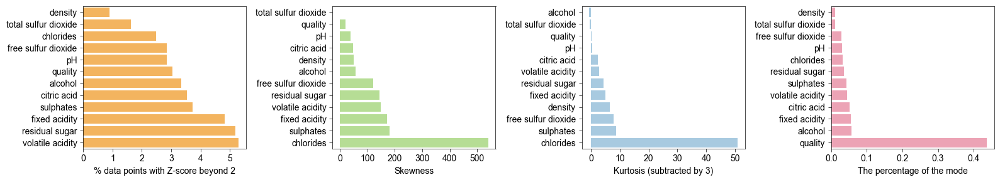

In [78]:
import os

plt.figure(figsize=(16, 3), dpi=100)
ax = plt.subplot(141)
features = [x for x in desc.columns if x not in trainer.cat_feature_names]
values = desc.loc["Percentage of points with Z-score beyond 2", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order]*100, color=tabensemb.utils.global_palette[0])
ax.set_xlabel(r"% data points with Z-score beyond 2")
replace_feature_names(ax)
ax.set_ylim([-0.5, len(features)-0.5])
set_linewidth(ax)

ax = plt.subplot(142)
features = [x for x in desc.columns if x not in trainer.cat_feature_names]
values = desc.loc["Skewness", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order]*100, color=tabensemb.utils.global_palette[1])
ax.set_xlabel(r"Skewness")
ax.set_ylim([-0.5, len(features)-0.5])
replace_feature_names(ax)
set_linewidth(ax)

ax = plt.subplot(143)
features = [x for x in desc.columns if x not in trainer.cat_feature_names]
values = desc.loc["Kurtosis", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order], color=tabensemb.utils.global_palette[2])
ax.set_xlabel("Kurtosis (subtracted by 3)")
replace_feature_names(ax)
ax.set_ylim([-0.5, len(features)-0.5])
set_linewidth(ax)

ax = plt.subplot(144)
features = list(desc.columns)
values = desc.loc["Mode percentage", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order], color=tabensemb.utils.global_palette[3])
ax.set_xlabel("The percentage of the mode")
replace_feature_names(ax)
ax.set_ylim([-0.5, len(features)-0.5])
set_linewidth(ax)


plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "statistics_wine.pdf"), dpi=500, bbox_inches="tight")
plt.show()

### HIGGS
The HIGGS dataset is pre-downloaded from https://archive.ics.uci.edu/dataset/280/higgs
and is extracted to the `data` folder

In [4]:
cont_feature_names = ["lepton  pT", "lepton  eta", "lepton  phi", "missing energy magnitude", "missing energy phi", "jet 1 pt", "jet 1 eta", "jet 1 phi", "jet 1 b-tag", "jet 2 pt", "jet 2 eta", "jet 2 phi", "jet 2 b-tag", "jet 3 pt", "jet 3 eta", "jet 3 phi", "jet 3 b-tag", "jet 4 pt", "jet 4 eta", "jet 4 phi", "jet 4 b-tag", "m_jj", "m_jjj", "m_lv", "m_jlv", "m_bb", "m_wbb", "m_wwbb"]
label_name = ["target"]
df_higgs = pd.read_csv("data/HIGGS.csv", names=label_name+cont_feature_names)

In [10]:
len(df_higgs)

11000000

In [5]:
tabular = df_higgs
desc = tabular.describe()

skew = tabular.skew()
desc = pd.concat(
    [
        desc,
        pd.DataFrame(
            data=skew.values.reshape(len(skew), 1).T,
            columns=skew.index,
            index=["Skewness"],
        ),
    ],
    axis=0,
)

g = tabensemb.data.DataModule._get_gini(tabular)
desc = pd.concat([desc, g], axis=0)

mode, cnt_mode, mode_percent = tabensemb.data.DataModule._get_mode(tabular)
desc = pd.concat([desc, mode, cnt_mode, mode_percent], axis=0)

kurtosis = tabensemb.data.DataModule._get_kurtosis(tabular)
# kurtosis[self.cat_feature_names] = np.nan
desc = pd.concat([desc, kurtosis], axis=0)

z_scores = {
    key: len(
        np.where(
            (tabular[key].values - tabular[key].mean()) / tabular[key].std() > 2
        )[0]
    )
         / len(tabular[key][pd.notna(tabular[key])])
    for key in tabular.columns
}
z_score_df = pd.DataFrame(
    data=z_scores, index=["Percentage of points with Z-score beyond 2"]
)
desc = pd.concat([desc, z_score_df], axis=0)

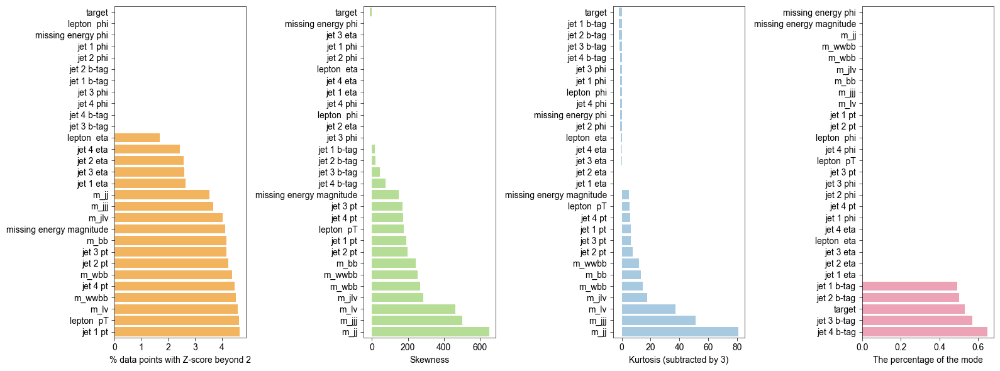

In [9]:
import os

plt.figure(figsize=(16, 6), dpi=100)
ax = plt.subplot(141)
features = [x for x in desc.columns if x not in trainer.cat_feature_names]
values = desc.loc["Percentage of points with Z-score beyond 2", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order]*100, color=tabensemb.utils.global_palette[0])
ax.set_xlabel(r"% data points with Z-score beyond 2")
replace_feature_names(ax)
ax.set_ylim([-0.5, len(features)-0.5])
set_linewidth(ax)

ax = plt.subplot(142)
features = [x for x in desc.columns if x not in trainer.cat_feature_names]
values = desc.loc["Skewness", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order]*100, color=tabensemb.utils.global_palette[1])
ax.set_xlabel(r"Skewness")
ax.set_ylim([-0.5, len(features)-0.5])
replace_feature_names(ax)
set_linewidth(ax)

ax = plt.subplot(143)
features = [x for x in desc.columns if x not in trainer.cat_feature_names]
values = desc.loc["Kurtosis", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order], color=tabensemb.utils.global_palette[2])
ax.set_xlabel("Kurtosis (subtracted by 3)")
replace_feature_names(ax)
ax.set_ylim([-0.5, len(features)-0.5])
set_linewidth(ax)

ax = plt.subplot(144)
features = list(desc.columns)
values = desc.loc["Mode percentage", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order], color=tabensemb.utils.global_palette[3])
ax.set_xlabel("The percentage of the mode")
replace_feature_names(ax)
ax.set_ylim([-0.5, len(features)-0.5])
set_linewidth(ax)


plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "statistics_higgs.pdf"), dpi=500, bbox_inches="tight")
plt.show()

### Automobile

In [4]:
names = ["symboling", "normalized-losses", "make", "fuel-type", "aspiration", "num-of-doors", "body-style", "drive-wheels", "engine-location", "wheel-base", "length", "width", "height", "curb-weight", "engine-type", "num-of-cylinders", "engine-size", "fuel-system", "bore", "stroke", "compression-ratio", "horsepower", "peak-rpm", "city-mpg", "highway-mpg", "price"]
cfg = tabensemb.config.UserConfig.from_uci(name="Automobile", column_names=names, save_zip=True)

num-of-cylinders is Integer and will be treated as a continuous feature.
num-of-doors is Integer and will be treated as a continuous feature.
Unknown values are detected in ['price', 'peak-rpm', 'horsepower', 'stroke', 'bore', 'num-of-cylinders', 'num-of-doors', 'normalized-losses']. They will be treated as np.nan.


In [5]:
os.system("unzip data/Automobile.zip -d data/Automobile")

Archive:  data/Automobile.zip
  inflating: data/Automobile/Index   
  inflating: data/Automobile/app.css  
  inflating: data/Automobile/imports-85.data  
  inflating: data/Automobile/imports-85.names  
  inflating: data/Automobile/misc    


0

In [6]:
df_automobile = pd.read_csv("data/Automobile/imports-85.data", names=names)

In [7]:
df_automobile_processed = pd.read_csv("data/imports-85.csv")
df_automobile_processed[["num-of-doors", "num-of-cylinders"]] = df_automobile[["num-of-doors", "num-of-cylinders"]]
df_automobile_processed["num-of-doors"] = [{"two": 2, "four": 4, "?": np.nan}[x] for x in df_automobile_processed["num-of-doors"]]
df_automobile_processed["num-of-cylinders"] = [{"eight": 8, "five": 5, "four": 4, "six": 6, "three": 3, "twelve": 12, "two": 2}[x] for x in df_automobile_processed["num-of-cylinders"]]
df_automobile_processed.to_csv("data/imports-85.csv", index=False)

In [8]:
data_automobile = tabensemb.data.DataModule(cfg)
data_automobile.load_data()

desc = data_automobile.describe()[data_automobile.cont_feature_names+data_automobile.label_name]

Dataset size: 123 41 41


/home/xlluo/hdd/tabular_ensemble/tabensemb/data/datamodule.py:579: UserWarning: The inferred task multiclass is not consistent with the selected task regression. Using the selected task.
  warnings.warn(


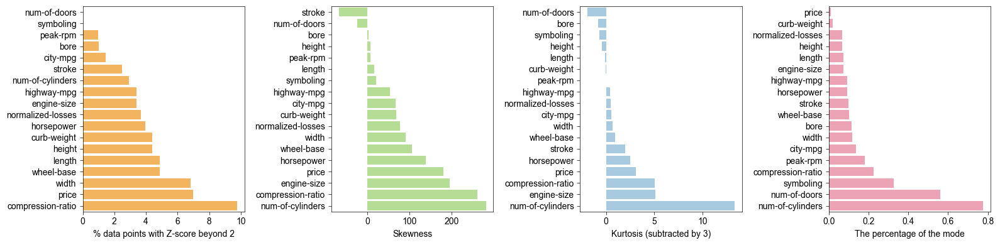

In [9]:
import os

plt.figure(figsize=(16, 4), dpi=100)
ax = plt.subplot(141)
features = [x for x in desc.columns if x not in trainer.cat_feature_names]
values = desc.loc["Percentage of points with Z-score beyond 2", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order]*100, color=tabensemb.utils.global_palette[0])
ax.set_xlabel(r"% data points with Z-score beyond 2")
replace_feature_names(ax)
ax.set_ylim([-0.5, len(features)-0.5])
set_linewidth(ax)

ax = plt.subplot(142)
features = [x for x in desc.columns if x not in trainer.cat_feature_names]
values = desc.loc["Skewness", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order]*100, color=tabensemb.utils.global_palette[1])
ax.set_xlabel(r"Skewness")
ax.set_ylim([-0.5, len(features)-0.5])
replace_feature_names(ax)
set_linewidth(ax)

ax = plt.subplot(143)
features = [x for x in desc.columns if x not in trainer.cat_feature_names]
values = desc.loc["Kurtosis", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order], color=tabensemb.utils.global_palette[2])
ax.set_xlabel("Kurtosis (subtracted by 3)")
replace_feature_names(ax)
ax.set_ylim([-0.5, len(features)-0.5])
set_linewidth(ax)

ax = plt.subplot(144)
features = list(desc.columns)
values = desc.loc["Mode percentage", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order], color=tabensemb.utils.global_palette[3])
ax.set_xlabel("The percentage of the mode")
replace_feature_names(ax)
ax.set_ylim([-0.5, len(features)-0.5])
set_linewidth(ax)


plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "statistics_automobile.pdf"), dpi=500, bbox_inches="tight")
plt.show()

### Air Quality

In [10]:
cfg = tabensemb.config.UserConfig.from_uci(name="Air Quality", save_zip=True)

No file with suffix `.data` is found. The downloaded file is saved to data/Air Quality.zip.


In [11]:
os.system("unzip data/Air\ Quality.zip -d data/AirQuality")

Archive:  data/Air Quality.zip
  inflating: data/AirQuality/AirQualityUCI.csv  
  inflating: data/AirQuality/AirQualityUCI.xlsx  


0

In [12]:
df_air = pd.read_excel("data/AirQuality/AirQualityUCI.xlsx", engine="openpyxl")

In [13]:
cont_feature_names = list(df_air.columns[2:])
for i in cont_feature_names:
    df_air.loc[df_air[i]==-200, i] = np.nan
df_air.to_csv("data/air_quality.csv", index=False)

In [14]:
cfg = tabensemb.config.UserConfig()
cfg.update({"database": "data/air_quality.csv", "continuous_feature_names": cont_feature_names,
    "categorical_feature_names": [], "label_name": ["Time"],})
data_air = tabensemb.data.DataModule(cfg)
data_air.load_data()

desc = data_air.describe()[data_air.cont_feature_names]

Dataset size: 5613 1872 1872


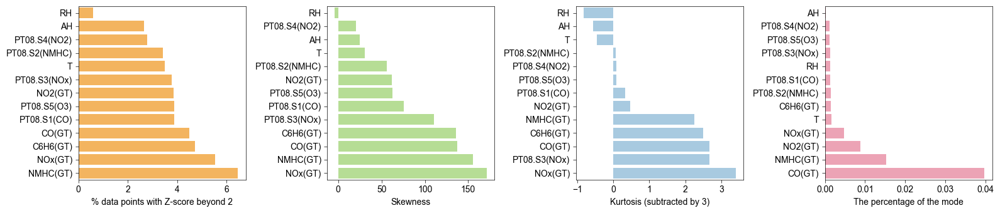

In [15]:
import os

plt.figure(figsize=(16, 3.5), dpi=100)
ax = plt.subplot(141)
features = [x for x in desc.columns if x not in trainer.cat_feature_names]
values = desc.loc["Percentage of points with Z-score beyond 2", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order]*100, color=tabensemb.utils.global_palette[0])
ax.set_xlabel(r"% data points with Z-score beyond 2")
replace_feature_names(ax)
ax.set_ylim([-0.5, len(features)-0.5])
set_linewidth(ax)

ax = plt.subplot(142)
features = [x for x in desc.columns if x not in trainer.cat_feature_names]
values = desc.loc["Skewness", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order]*100, color=tabensemb.utils.global_palette[1])
ax.set_xlabel(r"Skewness")
ax.set_ylim([-0.5, len(features)-0.5])
replace_feature_names(ax)
set_linewidth(ax)

ax = plt.subplot(143)
features = [x for x in desc.columns if x not in trainer.cat_feature_names]
values = desc.loc["Kurtosis", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order], color=tabensemb.utils.global_palette[2])
ax.set_xlabel("Kurtosis (subtracted by 3)")
replace_feature_names(ax)
ax.set_ylim([-0.5, len(features)-0.5])
set_linewidth(ax)

ax = plt.subplot(144)
features = list(desc.columns)
values = desc.loc["Mode percentage", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order], color=tabensemb.utils.global_palette[3])
ax.set_xlabel("The percentage of the mode")
replace_feature_names(ax)
ax.set_ylim([-0.5, len(features)-0.5])
set_linewidth(ax)


plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "statistics_airquality.pdf"), dpi=500, bbox_inches="tight")
plt.show()

### Bike Sharing

In [16]:
cfg = tabensemb.config.UserConfig.from_uci(name="Bike Sharing", save_zip=True)

The dataset Bike Sharing is not tabular. The downloaded file is saved to data/Bike Sharing.zip.


In [17]:
os.system("unzip data/Bike\ Sharing.zip -d data/BikeSharing")

Archive:  data/Bike Sharing.zip
  inflating: data/BikeSharing/Readme.txt  
  inflating: data/BikeSharing/day.csv  
  inflating: data/BikeSharing/hour.csv  


0

In [18]:
cfg = tabensemb.config.UserConfig()
cfg.update({"database": "data/BikeSharing/hour.csv", "continuous_feature_names": ["temp","atemp","hum","windspeed","casual","registered"],
    "categorical_feature_names": [], "label_name": ["cnt"],})
data_bike = tabensemb.data.DataModule(cfg)
data_bike.load_data()

desc = data_bike.describe()[data_bike.cont_feature_names+data_bike.label_name]

Dataset size: 10427 3476 3476


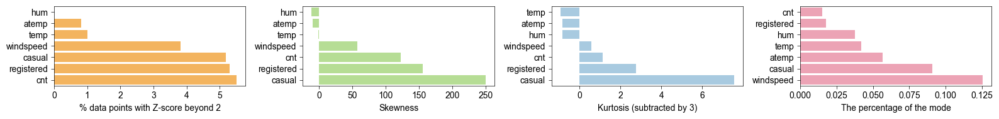

In [19]:
import os

plt.figure(figsize=(16, 2), dpi=100)
ax = plt.subplot(141)
features = [x for x in desc.columns if x not in trainer.cat_feature_names]
values = desc.loc["Percentage of points with Z-score beyond 2", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order]*100, color=tabensemb.utils.global_palette[0])
ax.set_xlabel(r"% data points with Z-score beyond 2")
replace_feature_names(ax)
ax.set_ylim([-0.5, len(features)-0.5])
set_linewidth(ax)

ax = plt.subplot(142)
features = [x for x in desc.columns if x not in trainer.cat_feature_names]
values = desc.loc["Skewness", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order]*100, color=tabensemb.utils.global_palette[1])
ax.set_xlabel(r"Skewness")
ax.set_ylim([-0.5, len(features)-0.5])
replace_feature_names(ax)
set_linewidth(ax)

ax = plt.subplot(143)
features = [x for x in desc.columns if x not in trainer.cat_feature_names]
values = desc.loc["Kurtosis", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order], color=tabensemb.utils.global_palette[2])
ax.set_xlabel("Kurtosis (subtracted by 3)")
replace_feature_names(ax)
ax.set_ylim([-0.5, len(features)-0.5])
set_linewidth(ax)

ax = plt.subplot(144)
features = list(desc.columns)
values = desc.loc["Mode percentage", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order], color=tabensemb.utils.global_palette[3])
ax.set_xlabel("The percentage of the mode")
replace_feature_names(ax)
ax.set_ylim([-0.5, len(features)-0.5])
set_linewidth(ax)


plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "statistics_bikesharing.pdf"), dpi=500, bbox_inches="tight")
plt.show()

### AutoMPG

In [20]:
mpg_columns = [
    "mpg",
    "cylinders",
    "displacement",
    "horsepower",
    "weight",
    "acceleration",
    "model_year",
    "origin",
    "car_name",
]
cfg = tabensemb.config.UserConfig.from_uci("Auto MPG", column_names=mpg_columns, sep=r"\s+")

cylinders is Integer and will be treated as a continuous feature.
model_year is Integer and will be treated as a continuous feature.
origin is Integer and will be treated as a continuous feature.
Unknown values are detected in ['horsepower']. They will be treated as np.nan.


In [21]:
data_mpg = tabensemb.data.DataModule(cfg)
data_mpg.load_data()

desc = data_mpg.describe()[data_mpg.cont_feature_names+data_mpg.label_name]

Dataset size: 238 80 80


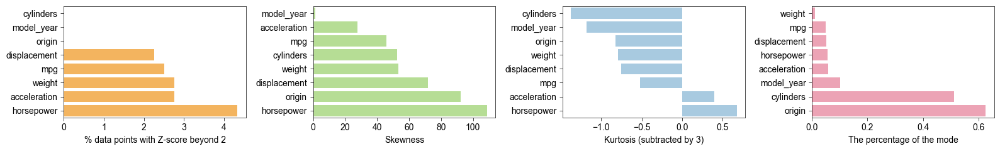

In [23]:
import os

plt.figure(figsize=(16, 2.5), dpi=100)
ax = plt.subplot(141)
features = [x for x in desc.columns if x not in trainer.cat_feature_names]
values = desc.loc["Percentage of points with Z-score beyond 2", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order]*100, color=tabensemb.utils.global_palette[0])
ax.set_xlabel(r"% data points with Z-score beyond 2")
replace_feature_names(ax)
ax.set_ylim([-0.5, len(features)-0.5])
set_linewidth(ax)

ax = plt.subplot(142)
features = [x for x in desc.columns if x not in trainer.cat_feature_names]
values = desc.loc["Skewness", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order]*100, color=tabensemb.utils.global_palette[1])
ax.set_xlabel(r"Skewness")
ax.set_ylim([-0.5, len(features)-0.5])
replace_feature_names(ax)
set_linewidth(ax)

ax = plt.subplot(143)
features = [x for x in desc.columns if x not in trainer.cat_feature_names]
values = desc.loc["Kurtosis", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order], color=tabensemb.utils.global_palette[2])
ax.set_xlabel("Kurtosis (subtracted by 3)")
replace_feature_names(ax)
ax.set_ylim([-0.5, len(features)-0.5])
set_linewidth(ax)

ax = plt.subplot(144)
features = list(desc.columns)
values = desc.loc["Mode percentage", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order], color=tabensemb.utils.global_palette[3])
ax.set_xlabel("The percentage of the mode")
replace_feature_names(ax)
ax.set_ylim([-0.5, len(features)-0.5])
set_linewidth(ax)


plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "statistics_autompg.pdf"), dpi=500, bbox_inches="tight")
plt.show()

### Forest Fires

In [24]:
cfg = tabensemb.config.UserConfig.from_uci("Forest Fires")

No file with suffix `.data` is found. The downloaded file is saved to data/Forest Fires.zip.


In [25]:
os.system("unzip data/Forest\ Fires.zip -d data/ForestFires")

Archive:  data/Forest Fires.zip
  inflating: data/ForestFires/forestfires.csv  
  inflating: data/ForestFires/forestfires.names  


0

In [27]:
cfg = tabensemb.config.UserConfig()
cfg.update({"database": "data/ForestFires/forestfires.csv", "continuous_feature_names": ["X","Y","FFMC","DMC","DC","ISI","temp","RH","wind","rain"
],
    "categorical_feature_names": ["month","day"], "label_name": ["area"],})
data_fire = tabensemb.data.DataModule(cfg)
data_fire.load_data()

desc = data_fire.describe()[data_fire.cont_feature_names+data_fire.label_name]

Dataset size: 309 104 104


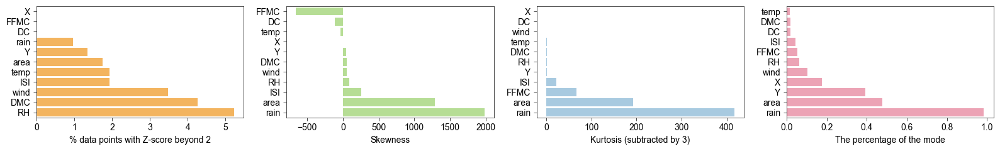

In [28]:
import os

plt.figure(figsize=(16, 2.5), dpi=100)
ax = plt.subplot(141)
features = [x for x in desc.columns if x not in trainer.cat_feature_names]
values = desc.loc["Percentage of points with Z-score beyond 2", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order]*100, color=tabensemb.utils.global_palette[0])
ax.set_xlabel(r"% data points with Z-score beyond 2")
replace_feature_names(ax)
ax.set_ylim([-0.5, len(features)-0.5])
set_linewidth(ax)

ax = plt.subplot(142)
features = [x for x in desc.columns if x not in trainer.cat_feature_names]
values = desc.loc["Skewness", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order]*100, color=tabensemb.utils.global_palette[1])
ax.set_xlabel(r"Skewness")
ax.set_ylim([-0.5, len(features)-0.5])
replace_feature_names(ax)
set_linewidth(ax)

ax = plt.subplot(143)
features = [x for x in desc.columns if x not in trainer.cat_feature_names]
values = desc.loc["Kurtosis", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order], color=tabensemb.utils.global_palette[2])
ax.set_xlabel("Kurtosis (subtracted by 3)")
replace_feature_names(ax)
ax.set_ylim([-0.5, len(features)-0.5])
set_linewidth(ax)

ax = plt.subplot(144)
features = list(desc.columns)
values = desc.loc["Mode percentage", features].values
order = np.argsort(values)[::-1]
ax.barh(y=np.array(features)[order], width=values[order], color=tabensemb.utils.global_palette[3])
ax.set_xlabel("The percentage of the mode")
replace_feature_names(ax)
ax.set_ylim([-0.5, len(features)-0.5])
set_linewidth(ax)


plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "statistics_forestfire.pdf"), dpi=500, bbox_inches="tight")
plt.show()

# Model illustration

18
20


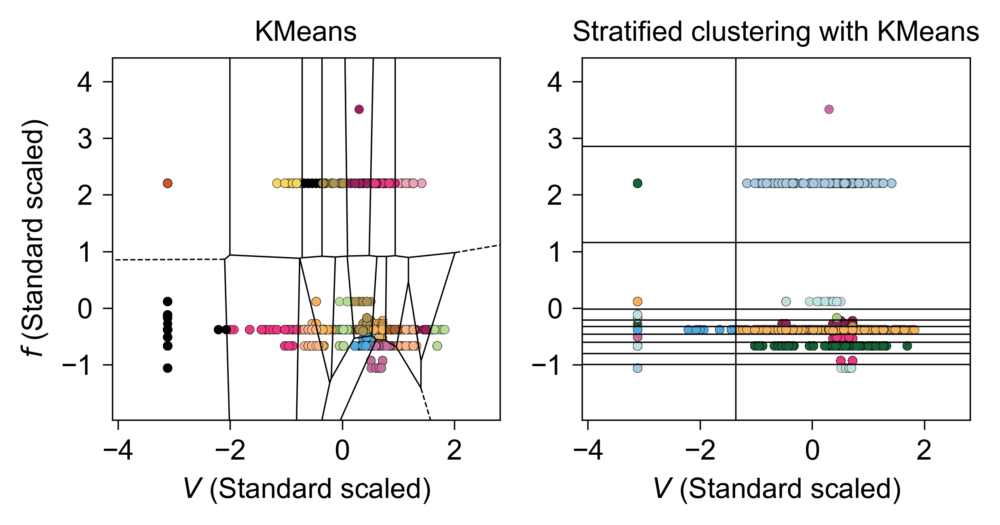

In [149]:
from src.model._thiswork.clustering.common.kmeans import KMeans, MultilayerKMeans
import numpy as np
from scipy.spatial import Voronoi, voronoi_plot_2d
from tabensemb.utils import set_random_seed
from matplotlib.colors import ListedColormap

data = trainer.datamodule.scaled_df[["Fiber Volume Fraction", "R-value"]].values


def plot_predict(data, label, ax, **scatter_kw):
    cmap = ListedColormap(tabensemb.utils.global_palette[::-1], N=len(tabensemb.utils.global_palette))
    label = label.cpu().numpy().copy()
    unique_values = np.unique(label)
    print(len(unique_values))
    shuffled_values = unique_values.copy()
    np.random.shuffle(shuffled_values)
    for idx, (val, mapped_val) in enumerate(zip(unique_values, shuffled_values)):
        label[label == val] = mapped_val
    ax.scatter(data[:, 0], data[:, 1], c=label, cmap=cmap, **scatter_kw)

scatter_kw = dict(s=10, edgecolor="k", lw=0.1, zorder=0, rasterized=True)


#### KMeans ####
device = "cpu"
n_clusters = 20
n_features = 2
seed = 3
precision = "32"
dt = torch.float64 if precision == "64" else torch.float32
torch.set_default_dtype(dt)

#### Multi-layer ####
n_input_1 = 1
n_input_2 = 1
n_clusters_1 = 2
n_clusters_2 = 10
seed = 8
n_features = n_input_1 + n_input_2
kmeans2l = MultilayerKMeans(
    n_clusters_ls=[n_clusters_1, n_clusters_2],
    input_idxs = [[0], [1]],
    kwargses = [{}, {}],
)
kmeans = KMeans(
    n_clusters=n_clusters_1 * n_clusters_2,
    n_input=n_features,
    # init_method="kmeans",
).to(device)
plt.figure(figsize=(5, 2.7), dpi=500)
ax1 = plt.subplot(121)
ax2 = plt.subplot(122)
x_tensor = torch.tensor(data, dtype=dt)
set_random_seed(seed)
if precision == "64":
    kmeans2l.double()
    kmeans.double()
else:
    kmeans2l.float()
    kmeans.float()
kmeans2l.fit(x_tensor, 100)
set_random_seed(seed)
kmeans.fit(x_tensor, 100)
labels = kmeans2l.predict(x_tensor)
labels_kmeans = kmeans.predict(x_tensor)

plot_predict(data, labels, ax2, **scatter_kw)
plot_predict(data, labels_kmeans, ax1, **scatter_kw)

x_range = np.max(data[:, 0]) - np.min(data[:, 0])
y_range = np.max(data[:, 1]) - np.min(data[:, 1])
xlims = [np.min(data[:, 0]) - x_range * 0.2, np.max(data[:, 0]) + x_range * 0.2]
ylims = [np.min(data[:, 1]) - y_range * 0.2, np.max(data[:, 1]) + y_range * 0.2]
# xlims = [-1, 1]
# ylims = [-1, 1]
ax1.set_xlim(xlims)
ax1.set_ylim(ylims)
ax1.set_title("KMeans", fontsize=10)
ax2.set_xlim(xlims)
ax2.set_ylim(ylims)
ax2.set_title("Stratified clustering with KMeans", fontsize=10)

centers = kmeans.centers.cpu().numpy()
vor = Voronoi(points=centers)
voronoi_plot_2d(vor, ax=ax1, line_colors="k", show_points=False, show_vertices=False, line_width=0.5)

centers_outer = kmeans2l.clusterings[0].centers.cpu().numpy().flatten()
vor = voronoi_1d(points=centers_outer)
voronoi_plot_1d(vor, ax2, direction="v", line_color="k", line_alpha=1, line_width=0.5)

centers_inner = kmeans2l.clusterings[1].centers.cpu().numpy().flatten()
vor = voronoi_1d(points=centers_inner)
voronoi_plot_1d(vor, ax2, direction="h", line_color="k", line_alpha=1, line_width=0.5)

ax1.set_xlim(xlims)
ax1.set_ylim(ylims)
ax2.set_xlim(xlims)
ax2.set_ylim(ylims)

ax1.set_xlabel("Fiber Volume Fraction (Standard scaled)", fontsize=10)
ax2.set_xlabel("Fiber Volume Fraction (Standard scaled)", fontsize=10)
ax1.set_ylabel("Frequency (Standard scaled)", fontsize=10)
# ax2.set_ylabel("Frequency (Standard scaled)", fontsize=10)

replace_feature_names(ax1)
replace_feature_names(ax2)
set_linewidth(ax1)
set_linewidth(ax2)

ax1.set_xlim(xlims)
ax1.set_ylim(ylims)
ax2.set_xlim(xlims)
ax2.set_ylim(ylims)


# ax.axis("equal")
plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "multilayer_kmeans.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()


[[0, 1], [1, 0], [1, 1], [2, 0], [3, 0], [3, 3], [4, 3], [5, 1]]


/home/xlluo/anaconda3/envs/tabular_ensemble/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xlluo/anaconda3/envs/tabular_ensemble/lib/python3.10/site-packages/sklearn/cluster/_birch.py:726: ConvergenceWarning: Number of subclusters found (6) by BIRCH is less than (8). Decrease the threshold.
  warnings.warn(


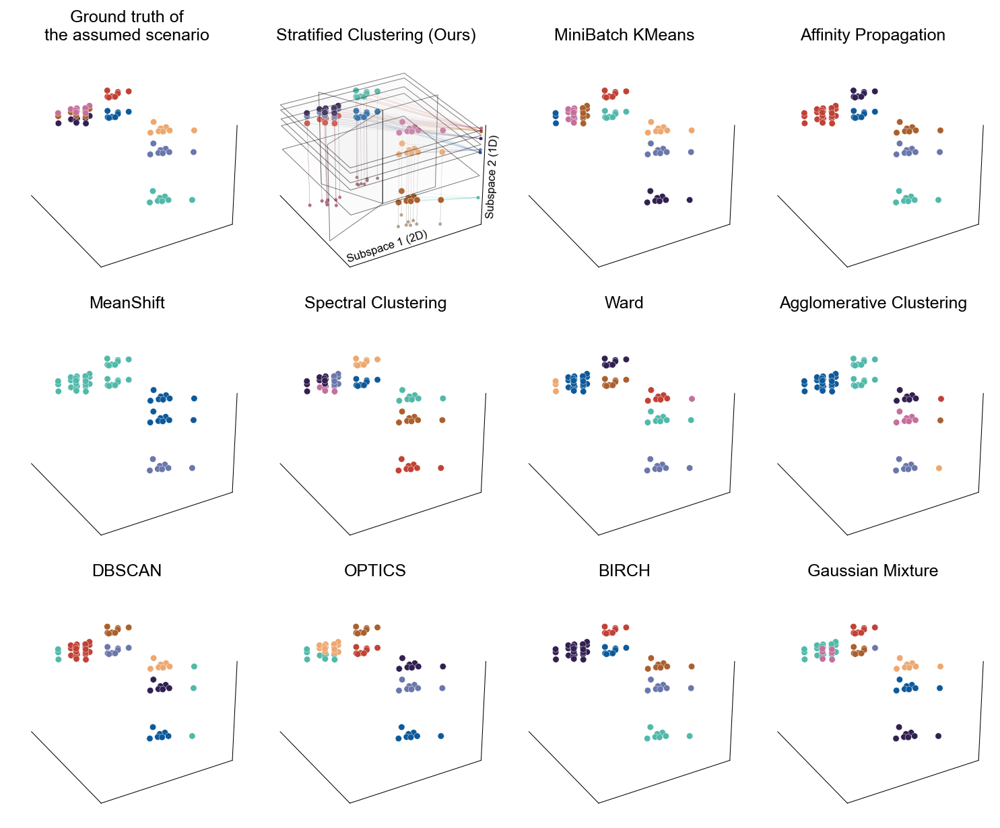

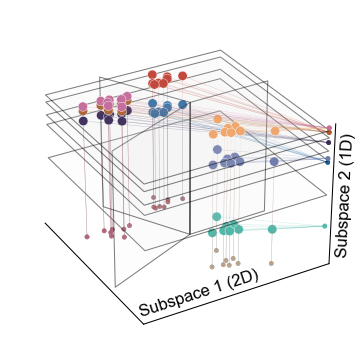

In [11]:
from scipy.spatial import Voronoi
from sklearn.cluster import KMeans

n_input_1 = 2
n_input_2 = 1

n_total_clusters = 8
n_clusters_1 = 4
n_clusters_2 = 6
data_per_cluster = 8

np.random.seed(8)
chosen_z_idx = np.random.choice(np.arange(n_clusters_2), size=n_total_clusters, replace=True)
chosen_data_idx = np.random.choice(np.arange(n_clusters_1), size=n_total_clusters, replace=True)
_res = [[int(j) for j in s.split(", ")] for s in np.unique([f"{x}, {y}" for x, y in zip(chosen_z_idx, chosen_data_idx)])]
chosen_z_idx = [x[0] for x in _res]
chosen_data_idx = [x[1] for x in _res]

print(_res)

# To make zorder reasonable
zs = np.random.normal(size=n_clusters_2)[chosen_z_idx]
zs_argsort = np.argsort(zs)
zs = zs[zs_argsort]
chosen_z_idx = np.array(chosen_z_idx)[zs_argsort]
chosen_data_idx = np.array(chosen_data_idx)[zs_argsort]

original_data = []
for i, z in zip(range(n_clusters_1), zs):
    v1 = np.eye(n_input_1) + np.random.rand(n_input_1, n_input_1)
    r1 = np.random.multivariate_normal(
        np.random.rand(n_input_1) * 25,
        v1 * v1.T,
        data_per_cluster,
    )
    # r1 = np.concatenate([r1, np.random.randn(r1.shape[0], 1)*0.05+z], axis=-1)
    original_data.append(r1)

chosen_data = [original_data[i] for i in chosen_data_idx]

data = [np.concatenate([r, np.ones((r.shape[0],1))*z], axis=-1) for r, z in zip(chosen_data, zs)]

n_clusters_1 = len(np.unique(chosen_data_idx))
n_clusters_2 = len(np.unique(chosen_z_idx))
n_total_clusters = len(_res)

# zlim = [-2.5, 2]
# xlim = [-5, 30]
# ylim = [-5, 30]

def _set_one(ax):
    ax.set_zlim(zlim)
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)

    ax.xaxis.pane.fill = False
    ax.yaxis.pane.fill = False
    ax.zaxis.pane.fill = False
    ax.xaxis.pane.set_edgecolor("w")
    ax.yaxis.pane.set_edgecolor("w")
    ax.zaxis.pane.set_edgecolor("w")
    ax.grid(False)
    # ax.set_xlabel("x")
    # ax.set_ylabel("y")
    # ax.set_zlabel("z")
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_zticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_zticklabels([])
    ax.view_init(azim=-30, roll=0)
    for axis in [ax.xaxis, ax.yaxis, ax.zaxis]:
        axis.line.set_linewidth(0.5)

zlim = [-4, 2.5]
xlim = [0, 32]
ylim = [0, 25]

from sklearn import cluster, datasets, mixture
from sklearn.neighbors import kneighbors_graph
from sklearn.preprocessing import StandardScaler
from src.model._thiswork.clustering.common.kmeans import MultilayerKMeans
params = {
    # "quantile": 0.3,
    # "eps": 0.5,
    # "damping": 0.9,
    # "preference": -10,
    "n_neighbors": 2,
    "n_clusters": n_total_clusters,
    # "min_samples": 7,
    # "xi": 0.1,
    # "min_cluster_size": 0.2,
    # "allow_single_cluster": True,
    # "hdbscan_min_cluster_size": 15,
    # "hdbscan_min_samples": 3,
    "random_state": 0,
}
scaler = StandardScaler()
X = scaler.fit_transform(np.concatenate(data))

# estimate bandwidth for mean shift
bandwidth = cluster.estimate_bandwidth(
    X, 
    # quantile=params["quantile"]
    )

# connectivity matrix for structured Ward
connectivity = kneighbors_graph(
        X, 
        n_neighbors=params["n_neighbors"], 
        include_self=False
    )
# make connectivity symmetric
connectivity = 0.5 * (connectivity + connectivity.T)

ms = cluster.MeanShift(bandwidth=bandwidth, bin_seeding=True)
two_means = cluster.MiniBatchKMeans(
        n_clusters=params["n_clusters"],
        random_state=params["random_state"],
    )
ward = cluster.AgglomerativeClustering(
        n_clusters=params["n_clusters"], linkage="ward", connectivity=connectivity
    )
spectral = cluster.SpectralClustering(
        n_clusters=params["n_clusters"],
        eigen_solver="arpack",
        affinity="nearest_neighbors",
        random_state=params["random_state"],
    )
dbscan = cluster.DBSCAN(
    # eps=params["eps"]
    )
# Not exist in this older version of sklearn
# hdbscan = cluster.HDBSCAN(
#         min_samples=params["hdbscan_min_samples"],
#         min_cluster_size=params["hdbscan_min_cluster_size"],
#         allow_single_cluster=params["allow_single_cluster"],
#     )
optics = cluster.OPTICS(
        # min_samples=params["min_samples"],
        # xi=params["xi"],
        # min_cluster_size=params["min_cluster_size"],
    )
affinity_propagation = cluster.AffinityPropagation(
        # damping=params["damping"],
        # preference=params["preference"],
        random_state=params["random_state"],
    )
average_linkage = cluster.AgglomerativeClustering(
        linkage="average",
        metric="cityblock",
        n_clusters=params["n_clusters"],
        connectivity=connectivity,
    )
birch = cluster.Birch(n_clusters=params["n_clusters"])
gmm = mixture.GaussianMixture(
        n_components=params["n_clusters"],
        covariance_type="full",
        random_state=params["random_state"],
    )
multikmeans = MultilayerKMeans(n_clusters_ls = [n_clusters_1, n_clusters_2], input_idxs=[[0, 1], [2]], kwargses=[{}, {}])

clustering_algorithms = (
        ("Stratified Clustering (Ours)", multikmeans),
        ("MiniBatch KMeans", two_means),
        ("Affinity Propagation", affinity_propagation),
        ("MeanShift", ms),
        ("Spectral Clustering", spectral),
        ("Ward", ward),
        ("Agglomerative Clustering", average_linkage),
        ("DBSCAN", dbscan),
        # ("HDBSCAN", hdbscan),
        ("OPTICS", optics),
        ("BIRCH", birch),
        ("Gaussian Mixture", gmm),
    )

import warnings
from tabensemb.utils import set_random_seed

plt.figure(figsize=(2.5*4,2.8*3),dpi=150)

ax = plt.subplot(3, 4, 1, projection="3d")
for i, r in enumerate(data):
    ax.scatter(r[:, 0], r[:, 1], r[:, 2], linewidth=0.2, edgecolor="w", color=tabensemb.utils.global_palette[i+6], alpha=1)
ax.set_title("Ground truth of\nthe assumed scenario")
_set_one(ax)

for idx, (name, algorithm) in enumerate(clustering_algorithms):
    # catch warnings related to kneighbors_graph
    with warnings.catch_warnings():
        warnings.filterwarnings(
                "ignore",
                message="the number of connected components of the "
                + "connectivity matrix is [0-9]{1,2}"
                + " > 1. Completing it to avoid stopping the tree early.",
                category=UserWarning,
            )
        warnings.filterwarnings(
                "ignore",
                message="Graph is not fully connected, spectral embedding"
                + " may not work as expected.",
                category=UserWarning,
            )
        if name != "Stratified Clustering (Ours)":
            algorithm.fit(X)
        else:
            set_random_seed(0)
            algorithm.fit(torch.tensor(X, dtype=torch.float32))

    if hasattr(algorithm, "labels_"):
        y_pred = algorithm.labels_.astype(int)
    else:
        if name != "Stratified Clustering (Ours)":
            y_pred = algorithm.predict(X)
        else:
            y_pred = algorithm.predict(torch.tensor(X, dtype=torch.float32)).numpy()

    ax = plt.subplot(3, 4, idx+2, projection="3d")
    for i, x in enumerate(np.unique(y_pred)):
        ax.scatter(np.concatenate(data)[y_pred==x, 0], np.concatenate(data)[y_pred==x, 1], np.concatenate(data)[y_pred==x, 2], linewidth=0.2, edgecolor="w", color=tabensemb.utils.global_palette[i+6], alpha=1)

    if name == "Stratified Clustering (Ours)":
        for i, r in enumerate(data):
            ax.scatter(r[:, 0], r[:, 1], np.ones(r.shape[0])*zlim[0], linewidth=0, color=tabensemb.utils.global_palette[i+6], s=5, alpha=0.6, zorder=zlim[0])
            ax.scatter(np.ones(r.shape[0])*xlim[1], np.ones(r.shape[0])*ylim[1], r[:, 2], linewidth=0, color=tabensemb.utils.global_palette[i+6], s=5, alpha=0.3, zorder=zs[i])
            for j in range(r.shape[0]):
                ax.plot([r[j, 0], r[j, 0]], [r[j, 1], r[j, 1]], [r[j, 2], zlim[0]], linewidth=0.2, color=tabensemb.utils.global_palette[i+6], alpha=0.3, ls="-", zorder=0)
                ax.plot([r[j, 0], xlim[1]], [r[j, 1], ylim[1]], [r[j, 2], r[j, 2]], linewidth=0.2, color=tabensemb.utils.global_palette[i+6], alpha=0.3, ls="-", zorder=zs[i])

        _set_one(ax)
        vor = Voronoi(algorithm.clusterings[0].centers.cpu().numpy()*scaler.scale_[:2]+scaler.mean_[:2])
        voronoi_plot_2d_to_3d(vor, z=zlim[0], ax3=ax, plot_kwargs=dict(linewidth=0., alpha=1), surface_along_zdir=True, surface_kwargs=dict(facecolor=(0.9, 0.9, 0.9, 0.05), edgecolor=(0, 0, 0, 0.5), linewidth=0.5))

        for i, z in enumerate(voronoi_1d(algorithm.clusterings[1].centers.cpu().numpy()*scaler.scale_[-1]+scaler.mean_[-1])):
            _X, _Y = np.meshgrid(ax.get_xlim(), ax.get_ylim())
            # ax.plot_surface(_X, _Y, np.ones_like(_X)*z, alpha=0.04, facecolor="grey", zorder=z)
            ax.plot_surface(_X, _Y, np.ones_like(_X)*z, facecolor=(0.9, 0.9, 0.9, 0.05), zorder=z, edgecolor=(0, 0, 0, 0.5), linewidth=0.5)
        ax.text(xlim[1]*1., ylim[0]-1., zlim[0], "Subspace 1 (2D)", ha="left", va="bottom", zdir="y", fontsize=8)
        ax.text(xlim[1]*1.03, ylim[1]*1.03, np.mean(zlim), "Subspace 2 (1D)", ha="left", va="center", zdir="z", fontsize=8)

    _set_one(ax)
    ax.set_title(name)
plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "clustering_compare.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()


plt.figure(figsize=(2.5,2.5),dpi=150)

ax = plt.subplot(111, projection="3d", computed_zorder=False)
for i, r in enumerate(data):
    ax.scatter(r[:, 0], r[:, 1], r[:, 2], linewidth=0.2, edgecolor="w", color=tabensemb.utils.global_palette[i+6], alpha=1, zorder=zs[i])
    ax.scatter(r[:, 0], r[:, 1], np.ones(r.shape[0])*zlim[0], linewidth=0, color=tabensemb.utils.global_palette[i+6], s=5, alpha=0.6, zorder=zlim[0])
    ax.scatter(np.ones(r.shape[0])*xlim[1], np.ones(r.shape[0])*ylim[1], r[:, 2], linewidth=0, color=tabensemb.utils.global_palette[i+6], s=5, alpha=0.3, zorder=zs[i])
    for j in range(r.shape[0]):
        ax.plot([r[j, 0], r[j, 0]], [r[j, 1], r[j, 1]], [r[j, 2], zlim[0]], linewidth=0.2, color=tabensemb.utils.global_palette[i+6], alpha=0.3, ls="-", zorder=0)
        ax.plot([r[j, 0], xlim[1]], [r[j, 1], ylim[1]], [r[j, 2], r[j, 2]], linewidth=0.2, color=tabensemb.utils.global_palette[i+6], alpha=0.3, ls="-", zorder=zs[i])

_set_one(ax)

vor = Voronoi(multikmeans.clusterings[0].centers.cpu().numpy()*scaler.scale_[:2]+scaler.mean_[:2])
voronoi_plot_2d_to_3d(vor, z=zlim[0], ax3=ax, plot_kwargs=dict(linewidth=0., alpha=1), surface_along_zdir=True, surface_kwargs=dict(facecolor=(0.9, 0.9, 0.9, 0.05), edgecolor=(0, 0, 0, 0.5), linewidth=0.5))

for i, z in enumerate(voronoi_1d(multikmeans.clusterings[1].centers.cpu().numpy()*scaler.scale_[-1]+scaler.mean_[-1])):
    _X, _Y = np.meshgrid(ax.get_xlim(), ax.get_ylim())
    # ax.plot_surface(_X, _Y, np.ones_like(_X)*z, alpha=0.04, facecolor="grey", zorder=z)
    ax.plot_surface(_X, _Y, np.ones_like(_X)*z, facecolor=(0.9, 0.9, 0.9, 0.05), zorder=z, edgecolor=(0, 0, 0, 0.5), linewidth=0.5)

ax.text(xlim[1]*1., ylim[0]-1., zlim[0], "Subspace 1 (2D)", ha="left", va="bottom", zdir="y", fontsize=8)
# ax.text(xlim[1]*1., ylim[0]-3, zlim[0], "Subspace 1", ha="right", va="bottom", zdir="x")
ax.text(xlim[1]*1.03, ylim[1]*1.03, np.mean(zlim), "Subspace 2 (1D)", ha="left", va="center", zdir="z", fontsize=8)
plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "clustering_illu.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

  0%|          | 0/78 [00:00<?, ?it/s]

/tmp/ipykernel_31751/3675588956.py:110: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


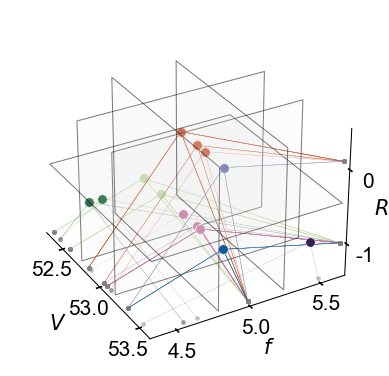

In [4]:
from scipy.spatial import Voronoi
from sklearn.cluster import KMeans


n_clusters_1 = 3
n_clusters_2 = 3
n_clusters_3 = 2
n_total_clusters = n_clusters_1*n_clusters_2*n_clusters_3

np.random.seed(8)

data = trainer.datamodule.df[["Fiber Volume Fraction", "Frequency", "R-value"]].values
# data[:, 1] = np.log10(data[:, 1])
data = data[data[:, 0]>52, :]
data = data[data[:, 0]<53.5, :]
data = data[data[:, 1]<=5.5, :]
data = data[data[:, 1]>=4.5, :]
data = data[data[:, 2]<0.2, :]
data = data[data[:, 2]>-1.1, :]

xlim = (52.3, 53.6)
ylim = (4.35, 5.65)
zlim = (-1.4, 0.5)

def _set_one(ax):
    ax.set_zlim(zlim)
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    ax.set_xlabel(r"$V$", labelpad=-4)
    ax.set_ylabel(r"$f$", labelpad=-7)
    ax.set_zlabel(r"$R$", labelpad=-12)

    ax.xaxis.pane.fill = False
    ax.yaxis.pane.fill = False
    ax.zaxis.pane.fill = False
    ax.xaxis.pane.set_edgecolor("w")
    ax.yaxis.pane.set_edgecolor("w")
    ax.zaxis.pane.set_edgecolor("w")
    ax.grid(False)
    ax.view_init(azim=-30, roll=0)
    for axis in [ax.xaxis, ax.yaxis, ax.zaxis]:
        axis.line.set_linewidth(0.5)


from tabensemb.utils import set_random_seed

from src.model._thiswork.clustering.common.kmeans import MultilayerKMeans

multikmeans = MultilayerKMeans(n_clusters_ls = [n_clusters_1, n_clusters_2, n_clusters_3], input_idxs=[[0], [1], [2]], kwargses=[{}, {}, {}])

set_random_seed(0)
multikmeans.fit(torch.tensor(data, dtype=torch.float32))
y_pred = multikmeans.predict(torch.tensor(data, dtype=torch.float32)).numpy()
import warnings
from tabensemb.utils import set_random_seed
from tqdm.auto import tqdm

plt.figure(figsize=(3,3),dpi=150)

ax = plt.subplot(111, projection="3d", computed_zorder=False)
unique_r = list(np.sort(np.unique(data[:, 2])))
for i in tqdm(range(data.shape[0]), total=data.shape[0]):
    c = tabensemb.utils.global_palette[y_pred[i]+1]
    zorder = data[i, 0]
    ax.scatter(data[i, 0], data[i, 1], data[i, 2], linewidth=0.2, edgecolor="w", color=c, alpha=1, zorder=zorder)

    ax.scatter([xlim[1]], [ylim[1]], [data[i, 2]], linewidth=0, color="grey", s=5, alpha=0.5, zorder=zorder)
    ax.plot([data[i, 0], xlim[1]], [data[i, 1], ylim[1]], [data[i, 2], data[i, 2]], linewidth=0.2, color=c, alpha=0.3, ls="-", zorder=zorder)

    ax.scatter([xlim[1]], [data[i,1]], [zlim[0]], linewidth=0, color="grey", s=5, alpha=0.5, zorder=zorder)
    ax.plot([data[i, 0], xlim[1]], [data[i, 1], data[i, 1]], [data[i, 2], zlim[0]], linewidth=0.2, color=c, alpha=0.3, ls="-", zorder=zorder)

    ax.scatter([data[i,0]], [ylim[0]], [zlim[0]], linewidth=0, color="grey", s=5, alpha=0.5, zorder=zorder)
    ax.plot([data[i, 0], data[i,0]], [data[i, 1], ylim[0]], [data[i, 2], zlim[0]], linewidth=0.2, color=c, alpha=0.3, ls="-", zorder=zorder)

_set_one(ax)

xlim = ax.get_xlim()
ylim = ax.get_ylim()
zlim = ax.get_zlim()

for i, z in enumerate(voronoi_1d(multikmeans.clusterings[2].centers.cpu().numpy())):
    _X, _Y = np.meshgrid(xlim, ylim)
    ax.plot_surface(_X, _Y, np.ones_like(_X)*z, facecolor=(0.9, 0.9, 0.9, 0.1), zorder=100, edgecolor=(0, 0, 0, 0.5), linewidth=0.5)
for i, y in enumerate(voronoi_1d(multikmeans.clusterings[1].centers.cpu().numpy())):
    _X, _Z = np.meshgrid(xlim, zlim)
    ax.plot_surface(_X, np.ones_like(_X)*y, _Z, facecolor=(0.9, 0.9, 0.9, 0.1), zorder=100, edgecolor=(0, 0, 0, 0.5), linewidth=0.5)
for i, x in enumerate(voronoi_1d(multikmeans.clusterings[0].centers.cpu().numpy())):
    _Y, _Z = np.meshgrid(ylim, zlim)
    ax.plot_surface(np.ones_like(_Y)*x, _Y, _Z, facecolor=(0.9, 0.9, 0.9, 0.1), zorder=x, edgecolor=(0, 0, 0, 0.5), linewidth=0.5)

ax.tick_params(axis="x", which="major", pad=-3)
ax.tick_params(axis="y", which="major", pad=-4)
ax.tick_params(axis="z", which="major", pad=-3)

ax.set_xticks([52.5, 53.0, 53.5])
ax.set_xticklabels(["52.5", "53.0", "53.5"])
ax.set_yticks([4.5,5.0,5.5])
ax.set_yticklabels(["4.5", "5.0", "5.5"])
ax.set_zticks([-1.0, 0.0])
ax.set_zticklabels(["-1", "0"])

ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_zlim(zlim)

# ax.text(xlim[1]*1., ylim[0]-1., zlim[0], "Subspace 1 (2D)", ha="left", va="bottom", zdir="y", fontsize=8)
# ax.text(xlim[1]*1., ylim[0]-3, zlim[0], "Subspace 1", ha="right", va="bottom", zdir="x")
# ax.text(xlim[1]*1.03, ylim[1]*1.03, np.mean(zlim), "Subspace 2 (1D)", ha="left", va="center", zdir="z", fontsize=8)
plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "clustering_illu_3spaces.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

[[0, 1], [0, 2], [0, 3], [1, 2], [2, 1], [3, 3], [5, 1]]


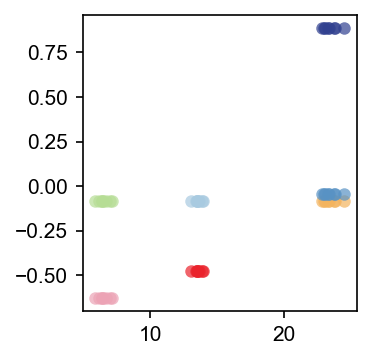

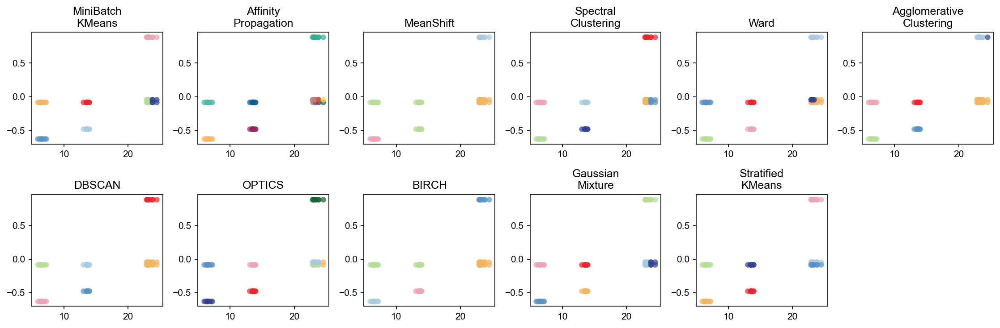

In [9]:
from scipy.spatial import Voronoi
from sklearn.cluster import KMeans

n_input_1 = 1
n_input_2 = 1

n_total_clusters = 8
n_clusters_1 = 4
n_clusters_2 = 6
data_per_cluster = 8

np.random.seed(3)
chosen_z_idx = np.random.choice(np.arange(n_clusters_2), size=n_total_clusters, replace=True)
chosen_data_idx = np.random.choice(np.arange(n_clusters_1), size=n_total_clusters, replace=True)
_res = [[int(j) for j in s.split(", ")] for s in np.unique([f"{x}, {y}" for x, y in zip(chosen_z_idx, chosen_data_idx)])]
chosen_z_idx = [x[0] for x in _res]
chosen_data_idx = [x[1] for x in _res]

print(_res)

zs = np.random.normal(size=n_clusters_2)[chosen_z_idx]
original_data = []
for i, z in zip(range(n_clusters_1), zs):
    v1 = np.random.rand(n_input_1)
    r1 = np.random.normal(
        np.random.rand(n_input_1) * 30,
        v1,
        data_per_cluster,
    )
    # r1 = np.concatenate([r1, np.random.randn(r1.shape[0], 1)*0.05+z], axis=-1)
    original_data.append(r1)

chosen_data = [original_data[i] for i in chosen_data_idx]

data = [np.concatenate([r.reshape(-1, 1), np.ones((r.shape[0],1))*z], axis=-1) for r, z in zip(chosen_data, zs)]

n_clusters_1 = len(np.unique(chosen_data_idx))
n_clusters_2 = len(np.unique(chosen_z_idx))
n_total_clusters = len(_res)

# zlim = [-2.5, 2]
# xlim = [-5, 30]
# ylim = [-5, 30]

def _set_one(ax):
    # ax.set_xlim(xlim)
    # ax.set_ylim(ylim)
    pass

    # ax.xaxis.pane.fill = False
    # ax.yaxis.pane.fill = False
    # ax.zaxis.pane.fill = False
    # ax.xaxis.pane.set_edgecolor("w")
    # ax.yaxis.pane.set_edgecolor("w")
    # ax.zaxis.pane.set_edgecolor("w")
    # ax.grid(False)
    # # ax.set_xlabel("x")
    # # ax.set_ylabel("y")
    # # ax.set_zlabel("z")
    # ax.set_xticks([])
    # ax.set_yticks([])
    # ax.set_zticks([])
    # ax.set_xticklabels([])
    # ax.set_yticklabels([])
    # ax.set_zticklabels([])
    # for axis in [ax.xaxis, ax.yaxis, ax.zaxis]:
    #     axis.line.set_linewidth(0.5)


plt.figure(figsize=(2.5,2.5),dpi=150)

ax = plt.subplot(111)
for i, r in enumerate(data):
    ax.scatter(r[:, 0], r[:, 1], linewidth=0, color=tabensemb.utils.global_palette[i], alpha=0.7)
    # ax.scatter(r[:, 0], r[:, 1], np.ones(r.shape[0])*zlim[0], linewidth=0, color=tabensemb.utils.global_palette[i+4], s=5, alpha=0.3)
    # ax.scatter(np.ones(r.shape[0])*xlim[1], np.ones(r.shape[0])*xlim[1], r[:, 2], linewidth=0, color=tabensemb.utils.global_palette[i+4], s=5, alpha=0.3)
    # for j in range(r.shape[0]):
    #     ax.plot([r[j, 0], r[j, 0]], [r[j, 1], r[j, 1]], [r[j, 2], zlim[0]], linewidth=0.5, color=tabensemb.utils.global_palette[i+4], alpha=0.05, ls="-")
    #     ax.plot([r[j, 0], xlim[1]], [r[j, 1], ylim[1]], [r[j, 2], r[j, 2]], linewidth=0.5, color=tabensemb.utils.global_palette[i+4], alpha=0.05, ls="-")

_set_one(ax)

# kmeans = KMeans(n_clusters=n_clusters_1, random_state=0, n_init="auto")
# kmeans.fit(np.concatenate(data)[:, :2])
# vor = Voronoi(kmeans.cluster_centers_)
# voronoi_plot_2d_to_3d(vor, z=zlim[0], ax3=ax, plot_kwargs=dict(linewidth=0.5, alpha=0.3))

plt.show()
plt.close()


from sklearn import cluster, datasets, mixture
from sklearn.neighbors import kneighbors_graph
from sklearn.preprocessing import StandardScaler
from src.model._thiswork.clustering.common.kmeans import MultilayerKMeans
params = {
    # "quantile": 0.3,
    # "eps": 0.5,
    # "damping": 0.9,
    # "preference": -10,
    "n_neighbors": 2,
    "n_clusters": n_total_clusters,
    # "min_samples": 7,
    # "xi": 0.1,
    # "min_cluster_size": 0.2,
    # "allow_single_cluster": True,
    # "hdbscan_min_cluster_size": 15,
    # "hdbscan_min_samples": 3,
    "random_state": 0,
}
X = StandardScaler().fit_transform(np.concatenate(data))

# estimate bandwidth for mean shift
bandwidth = cluster.estimate_bandwidth(
    X, 
    # quantile=params["quantile"]
    )

# connectivity matrix for structured Ward
connectivity = kneighbors_graph(
        X, 
        n_neighbors=params["n_neighbors"], 
        include_self=False
    )
# make connectivity symmetric
connectivity = 0.5 * (connectivity + connectivity.T)

ms = cluster.MeanShift(bandwidth=bandwidth, bin_seeding=True)
two_means = cluster.MiniBatchKMeans(
        n_clusters=params["n_clusters"],
        random_state=params["random_state"],
    )
ward = cluster.AgglomerativeClustering(
        n_clusters=params["n_clusters"], linkage="ward", connectivity=connectivity
    )
spectral = cluster.SpectralClustering(
        n_clusters=params["n_clusters"],
        eigen_solver="arpack",
        affinity="nearest_neighbors",
        random_state=params["random_state"],
    )
dbscan = cluster.DBSCAN(
    # eps=params["eps"]
    )
# hdbscan = cluster.HDBSCAN(
#         min_samples=params["hdbscan_min_samples"],
#         min_cluster_size=params["hdbscan_min_cluster_size"],
#         allow_single_cluster=params["allow_single_cluster"],
#     )
optics = cluster.OPTICS(
        # min_samples=params["min_samples"],
        # xi=params["xi"],
        # min_cluster_size=params["min_cluster_size"],
    )
affinity_propagation = cluster.AffinityPropagation(
        # damping=params["damping"],
        # preference=params["preference"],
        random_state=params["random_state"],
    )
average_linkage = cluster.AgglomerativeClustering(
        linkage="average",
        metric="cityblock",
        n_clusters=params["n_clusters"],
        connectivity=connectivity,
    )
birch = cluster.Birch(n_clusters=params["n_clusters"])
gmm = mixture.GaussianMixture(
        n_components=params["n_clusters"],
        covariance_type="full",
        random_state=params["random_state"],
    )
multikmeans = MultilayerKMeans(n_clusters_ls = [n_clusters_1, n_clusters_2], input_idxs=[[0], [1]], kwargses=[{}, {}])

clustering_algorithms = (
        ("MiniBatch\nKMeans", two_means),
        ("Affinity\nPropagation", affinity_propagation),
        ("MeanShift", ms),
        ("Spectral\nClustering", spectral),
        ("Ward", ward),
        ("Agglomerative\nClustering", average_linkage),
        ("DBSCAN", dbscan),
        # ("HDBSCAN", hdbscan),
        ("OPTICS", optics),
        ("BIRCH", birch),
        ("Gaussian\nMixture", gmm),
        ("Stratified\nKMeans", multikmeans)
    )

import warnings

plt.figure(figsize=(2.5*6,2.5*2),dpi=150)
for idx, (name, algorithm) in enumerate(clustering_algorithms):
    # catch warnings related to kneighbors_graph
    with warnings.catch_warnings():
        warnings.filterwarnings(
                "ignore",
                message="the number of connected components of the "
                + "connectivity matrix is [0-9]{1,2}"
                + " > 1. Completing it to avoid stopping the tree early.",
                category=UserWarning,
            )
        warnings.filterwarnings(
                "ignore",
                message="Graph is not fully connected, spectral embedding"
                + " may not work as expected.",
                category=UserWarning,
            )
        if name != "Stratified\nKMeans":
            algorithm.fit(X)
        else:
            algorithm.fit(torch.tensor(X, dtype=torch.float32))

    if hasattr(algorithm, "labels_"):
        y_pred = algorithm.labels_.astype(int)
    else:
        if name != "Stratified\nKMeans":
            y_pred = algorithm.predict(X)
        else:
            y_pred = algorithm.predict(torch.tensor(X, dtype=torch.float32)).numpy()

    ax = plt.subplot(2, 6, idx+1)
    for i, x in enumerate(np.unique(y_pred)):
        ax.scatter(np.concatenate(data)[y_pred==x, 0], np.concatenate(data)[y_pred==x, 1], linewidth=0, color=tabensemb.utils.global_palette[i], alpha=0.7)

    _set_one(ax)
    ax.set_title(name)
plt.show()
plt.close()

In [8]:
device = "cuda"
import torch
from src.model._thiswork.bayes_nn.bbp import MCDropout

torch.manual_seed(2)

# X = torch.tensor([[-2.5, -1.5, -0.5, 0.5, 1.5, 2.5]], dtype=torch.float32)
# y = torch.tensor([[1, 0, 1, 0, 1, 0]], dtype=torch.int16)
X = (torch.tensor([[-3, -1, 0, 1, 3]], dtype=torch.float32))/3
y = torch.tensor([[1, 0, 1, 0, 1]], dtype=torch.int16)


net = MCDropout(
    n_inputs=1,
    n_outputs=1,
    layers=[512, 512, 512],
    on_cpu=False,
    type="homo",
    task="classification",
    train_dropout=0.0,
    sample_dropout=0.3,
    lr=0.001,
)

X = X.to(device)
y = y.to(device)
net.to(device)
net.fit(X, y, n_epoch=500, batch_size=None)


Epoch:     1/  500, Fit loss =   0.680
Epoch:   101/  500, Fit loss =   0.000
Epoch:   201/  500, Fit loss =   0.000
Epoch:   301/  500, Fit loss =   0.000
Epoch:   401/  500, Fit loss =   0.000
Epoch:   500/  500, Fit loss =   0.000


In [ ]:
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter

grid = torch.linspace(-1.2, 1.2, 1000).view(-1, 1)
mu, al_var, ep_var = net.predict(grid.to(device), n_samples=1000, return_separate_var=True)
torch.cuda.empty_cache()

plt.figure(figsize=(2.3, 2.5), dpi=300)
ax = plt.subplot(111)

_X = X.cpu().numpy().flatten()
_y = y.cpu().numpy().flatten()
_grid = grid.cpu().numpy().flatten()
# _mu = mu.cpu().numpy().flatten()
# _ep_std = torch.sqrt(ep_var).cpu().numpy().flatten()
# _al_std = torch.sqrt(al_var).cpu().numpy().flatten()
_mu = savgol_filter(mu.cpu().numpy().flatten(), window_length=70, polyorder=1)
_ep_std = savgol_filter(torch.sqrt(ep_var).cpu().numpy().flatten(), window_length=70, polyorder=1)
_al_std = savgol_filter(torch.sqrt(al_var).cpu().numpy().flatten(), window_length=70, polyorder=1)

# ax.scatter(_X[_y==1], _y[_y==1], color=[84/255, 130/255, 53/255], zorder=10, s=20)
# ax.scatter(_X[_y==0], _y[_y==0], color=[68/255, 114/255, 196/255], zorder=10, s=20)
ax.scatter(_X[_y==1], _y[_y==1], color="k", zorder=10, s=20)
ax.scatter(_X[_y==0], _y[_y==0], color="k", zorder=10, s=20)
ax.scatter([100], [100], color="k", label="Training points", s=20)
ax.fill_between(_grid, _mu-_ep_std, _mu+_ep_std, alpha=0.2, color="grey", linewidth=0, label="Epistemic SD")
ax.plot(_grid, _mu, linewidth=1.5, color="grey", zorder=5, linestyle="-", label="Probability")

ax.plot(_grid, np.maximum(_mu-_ep_std, np.zeros_like(_mu)), linewidth=1.5, color=[76/255, 122/255, 125/255], zorder=6, label="ML weight")

# ax.fill_between(_grid, _mu-_al_std, _mu+_al_std, alpha=0.2)
# ax.fill_between(grid.cpu().numpy().flatten(), mu.cpu().numpy().flatten()-torch.sqrt(al_var).cpu().numpy().flatten(), mu.cpu().numpy().flatten()+torch.sqrt(al_var).cpu().numpy().flatten(), alpha=0.2)
ax.set_ylim([-0.2, 1.2])
set_linewidth(ax)
ax.set_yticks([0, 0.2, 0.4, 0.6, 0.8, 1.0])
ax.set_xticks([])

ax.set_xlim([-1.2, 1.2])
ax.plot([-1.2, 1.2], [0.5, 0.5], linewidth=0.5, color="k", zorder=-1)
ax.text(1.25, 0.5, "Input", ha="left", va="center")
ax.scatter([1.15], [0.5], marker=">", color="k", linewidth=0)

ax.plot([-1.2, 1.2], [1, 1], linewidth=0.5, color="k", zorder=-1, linestyle="--")
ax.text(1.25, 1, "Practicism\nis better", ha="left", va="center")

ax.plot([-1.2, 1.2], [0, 0], linewidth=0.5, color="k", zorder=-1, linestyle="--")
ax.text(1.25, 0, "Empiricism\nis better", ha="left", va="center")

ax.spines["top"].set_linewidth(0)
ax.spines["right"].set_linewidth(0)
ax.spines["bottom"].set_linewidth(0)
ax.set_ylabel("Output")
ax.legend(bbox_to_anchor=(1.3, 0.), frameon=False, ncols=2)
plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "bnn_illus.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

In [4]:
import seaborn as sns

configfile = "composite"
sc_trainer = FatigueTrainer(device=device, project="test")
sc_trainer.load_config(
        configfile,
        manual_config={
            "data_splitter": "StressCycleSplitter",
        },
    )
rd_trainer = FatigueTrainer(device=device, project="test")
rd_trainer.load_config(
        configfile,
        manual_config={
            "data_splitter": "RandomSplitter",
        },
    )
et_trainer = FatigueTrainer(device=device, project="test")
et_trainer.load_config(
        configfile,
        manual_config={
            "data_splitter": "ExtremeCycleSplitter",
        },
    )

def accumulate_target_dist(trainer: FatigueTrainer):
    train_target = []
    val_target = []
    test_target = []
    for i in range(tabensemb.setting["random_seed"], tabensemb.setting["random_seed"]+10):
        tabensemb.utils.set_random_seed(i)
        trainer.load_data()
        train_target.append(trainer.datamodule.y_train)
        val_target.append(trainer.datamodule.y_val)
        test_target.append(trainer.datamodule.y_test)
    train_target = np.concatenate(train_target)
    val_target = np.concatenate(val_target)
    test_target = np.concatenate(test_target)
    return train_target, val_target, test_target

rd_train, rd_val, rd_test = accumulate_target_dist(rd_trainer)
sc_train, sc_val, sc_test = accumulate_target_dist(sc_trainer)
et_train, et_val, et_test = accumulate_target_dist(et_trainer)

The project will be saved to output/test/2024-12-02-11-00-41-0_composite
The project will be saved to output/test/2024-12-02-11-00-41-0_composite-I1
The project will be saved to output/test/2024-12-02-11-00-41-0_composite-I2
Dataset size: 4062 1354 1354
Data saved to output/test/2024-12-02-11-00-41-0_composite-I1 (data.csv and tabular_data.csv).
Using previously used data path data/composite_database_03222024.csv
Dataset size: 4062 1354 1354
Data saved to output/test/2024-12-02-11-00-41-0_composite-I1 (data.csv and tabular_data.csv).
Using previously used data path data/composite_database_03222024.csv
Dataset size: 4062 1354 1354
Data saved to output/test/2024-12-02-11-00-41-0_composite-I1 (data.csv and tabular_data.csv).
Using previously used data path data/composite_database_03222024.csv
Dataset size: 4062 1354 1354
Data saved to output/test/2024-12-02-11-00-41-0_composite-I1 (data.csv and tabular_data.csv).
Using previously used data path data/composite_database_03222024.csv
Dataset

/tmp/ipykernel_23313/418031307.py:75: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.savefig(fname=os.path.join(trainer.project_root, "split_compare_illustrative.pdf"), dpi=500)
/tmp/ipykernel_23313/418031307.py:75: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.savefig(fname=os.path.join(trainer.project_root, "split_compare_illustrative.pdf"), dpi=500)
/home/xlluo/anaconda3/envs/tabular_ensemble/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fig.canvas.print_figure(bytes_io, **kw)


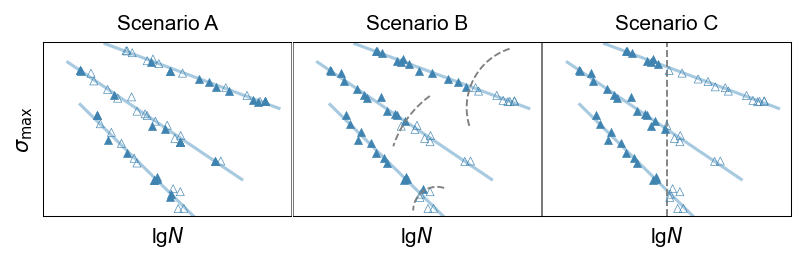

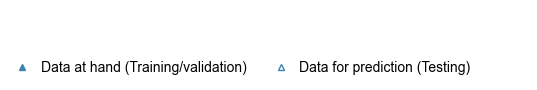

In [151]:
fig = plt.figure(figsize=(6.5, 2.4), dpi=150)

coefs = [(-1.5, 9), (-1, 10), (-0.5, 11)]
ranges = [(2, 8), (1.5, 7.5), (3, 9)]
n_sample = 20
aspect = 0.7

def plot_once(ax, train_indices_func):
    for idx, ((a, b), (x1, x2)) in enumerate(zip(coefs, ranges)):
        np.random.seed(idx+2)
        rd_x = (x2-x1)*np.random.sample(n_sample)+x1
        rd_y = a*rd_x+b
        rd_x = np.random.randn(n_sample)*0.2+rd_x
        sort_arg = np.argsort(rd_x)
        rd_x = rd_x[sort_arg]
        rd_y = rd_y[sort_arg]*aspect
        
        train_indices = train_indices_func(rd_x, rd_y)
        val_indices = np.setdiff1d(np.arange(n_sample), train_indices)
        
        ax.scatter(rd_x[train_indices], rd_y[train_indices], zorder=10, s=15, linewidth=0.3, facecolor=lighten_color(tabensemb.utils.global_palette[2], 2.3), marker="^")
        ax.scatter(rd_x[val_indices], rd_y[val_indices], zorder=10, s=15, linewidth=0.3, edgecolor=lighten_color(tabensemb.utils.global_palette[2], 2.3), facecolors="none", marker="^")
        pfit = np.polyfit(rd_x, rd_y, 1)
        k, b = pfit[0], pfit[1]
        plt.plot(np.linspace(x1-0.5, x2+0.5, 3), k*np.linspace(x1-0.5, x2+0.5, 3)+b, alpha=1, color=tabensemb.utils.global_palette[2], zorder=0)
    
    ax.set_xlabel("log10(Cycles to Failure)", fontsize=plt.rcParams["font.size"])
    ax.set_ylabel("Maximum Stress", fontsize=plt.rcParams["font.size"])
    replace_feature_names(ax)
    set_linewidth(ax)
    ax.set_ylim([0, 10*aspect])
    ax.set_xlim([0, 10])
    ax.set_xticks([])
    ax.set_yticks([])
    # ax.spines["top"].set_linewidth(0)
    # ax.spines["right"].set_linewidth(0)
    ax.set_aspect("equal")
    # ax.set_box_aspect(1)

from matplotlib.gridspec import GridSpec

gs = GridSpec(100, 100, figure=fig)
ax = fig.add_subplot(gs[:, 0:33])

plot_once(ax, lambda x, y: np.random.choice(np.arange(n_sample), size=int(n_sample*0.6)))
ax.spines["right"].set_linewidth(0.25)
ax.set_title("Scenario A", fontsize=plt.rcParams["font.size"])
ax = fig.add_subplot(gs[:, 33:66])
plot_once(ax, lambda x, y: np.where(y>np.percentile(y, 40))[0])
ax.set_ylabel(None)
centers = [(5.8, 0.3*aspect), (7.9, 2.2*aspect), (9.5, 6.2*aspect)]
radius = [0.95, 4.05, 2.5]
angles = [0.7*np.pi, 0.8*np.pi, 0.85*np.pi]
spans = [0.6*np.pi, 0.2*np.pi, 0.5*np.pi]
for idx, (center, r, ang, sp) in enumerate(zip(centers, radius, angles, spans)):
    theta = np.linspace(ang-sp/2, ang+sp/2, 100)
    x = center[0] + np.cos(theta)*r
    y = center[1] + np.sin(theta)*r
    # ax.scatter([center[0]], [center[1]], color=tabensemb.utils.global_palette[idx], s=4)
    ax.plot(x, y, color="grey", zorder=15, linewidth=0.9, linestyle="--")
ax.set_title("Scenario B", fontsize=plt.rcParams["font.size"])

ax.spines["left"].set_linewidth(0.25)
ax.spines["right"].set_linewidth(0.25)
ax = fig.add_subplot(gs[:, 66:99])
plot_once(ax, lambda x, y: np.where(x<5)[0])
ax.set_ylabel(None)
ax.plot([5, 5], [0, 10], color="grey", linewidth=0.9, linestyle="--", )
ax.set_title("Scenario C", fontsize=plt.rcParams["font.size"])
ax.spines["left"].set_linewidth(0.25)

# plt.subplots_adjust(wspace=-5)


plt.savefig(fname=os.path.join(trainer.project_root, "split_compare_illustrative.pdf"), dpi=500)
plt.show()
plt.close()

fig = plt.figure(figsize=(5,1))
from matplotlib.lines import Line2D

ax = plt.subplot(111)
ax.set_frame_on(False)
ax.tick_params(
            labelcolor="none",
            which="both",
            top=False,
            bottom=False,
            left=False,
            right=False,
        )
ax.legend(handles=[Line2D([0], [0], marker='^', color='w', markerfacecolor=lighten_color(tabensemb.utils.global_palette[2], 2.3), markeredgecolor=lighten_color(tabensemb.utils.global_palette[2], 2.3), label="Data at hand (Training/validation)", markersize=5),
                   Line2D([0], [0], marker='^', color='w', markerfacecolor=None, markeredgecolor=lighten_color(tabensemb.utils.global_palette[2], 2.3), label="Data for prediction (Testing)", markersize=5)],
          frameon=False, handlelength=1, ncols=2, bbox_to_anchor=(0.85, 0.12), fontsize=plt.rcParams["font.size"])
plt.savefig(fname=os.path.join(trainer.project_root, "split_compare_illustrative_legend.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

/tmp/ipykernel_8971/4033819310.py:105: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.savefig(fname=os.path.join(trainer.project_root, "split_compare.pdf"), dpi=500, bbox_inches="tight")
/tmp/ipykernel_8971/4033819310.py:105: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.savefig(fname=os.path.join(trainer.project_root, "split_compare.pdf"), dpi=500, bbox_inches="tight")
/tmp/ipykernel_8971/4033819310.py:106: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout()


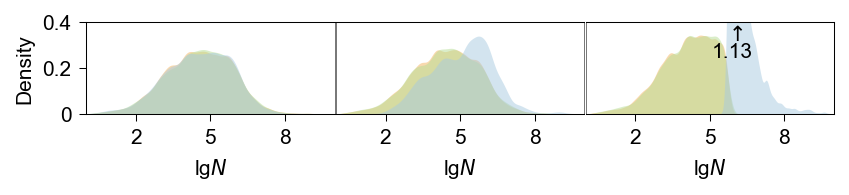

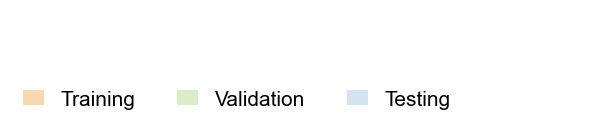

In [17]:
import seaborn as sns

fig = plt.figure(figsize=(6.5, 0.8), dpi=150)

kde_kwargs = dict(fill=True, legend=False, alpha=.5, linewidth=0)

from matplotlib.gridspec import GridSpec

gs = GridSpec(100, 100, figure=fig)
ax = fig.add_subplot(gs[:, 0:33])
sns.kdeplot(rd_train, palette=[tabensemb.utils.global_palette[0]], ax=ax, label="Training", **kde_kwargs)
sns.kdeplot(rd_val, palette=[tabensemb.utils.global_palette[1]], ax=ax, label="Validation", **kde_kwargs)
sns.kdeplot(rd_test, palette=[tabensemb.utils.global_palette[2]], ax=ax, label="Testing", **kde_kwargs)

ax.set_ylim([0, 0.4])
ax.set_xlim([0, 10])
ax.set_ylabel("Density")
ax.set_xlabel("log10(Cycles to Failure)")
replace_feature_names(ax)
set_linewidth(ax)
# ax.set_ylabel(None)
ax.set_xticks([2,5,8])
ax.set_xticklabels([2,5,8])
ax.set_yticks([0, 0.2, 0.4])
ax.set_yticklabels([0, 0.2, 0.4])
ax.spines["right"].set_linewidth(0.25)
# ax.text(0.03, 0.97, "Scenario A", ha="left", va="top", transform=ax.transAxes)
# ax.set_box_aspect(1)
# ax.set_title("Scenario A", fontsize=10)
# ax.spines["top"].set_linewidth(0)
# ax.spines["right"].set_linewidth(0)

ax = fig.add_subplot(gs[:, 33:66])
sns.kdeplot(sc_train, palette=[tabensemb.utils.global_palette[0]], ax=ax, label="Training", **kde_kwargs)
sns.kdeplot(sc_val, palette=[tabensemb.utils.global_palette[1]], ax=ax, label="Validation", **kde_kwargs)
sns.kdeplot(sc_test, palette=[tabensemb.utils.global_palette[2]], ax=ax, label="Testing", **kde_kwargs)
# ax.set_xlabel("log10(Cycles to Failure)")
ax.set_ylim([0, 0.4])
ax.set_xlim([0, 10])
ax.set_xlabel("log10(Cycles to Failure)")
replace_feature_names(ax)
set_linewidth(ax)
ax.set_ylabel(None)
ax.set_xticks([2,5,8])
ax.set_xticklabels([2,5,8])
ax.set_yticks([])
ax.set_yticklabels([])
ax.spines["left"].set_linewidth(0.25)
ax.spines["right"].set_linewidth(0.25)
# ax.set_title("Scenario B", fontsize=10)

# ax.set_yticklabels([])
# ax.text(0.03, 0.97, "Scenario B", ha="left", va="top", transform=ax.transAxes)
# ax.set_box_aspect(1)
# ax.legend(frameon=False, bbox_to_anchor=(1.8, 0.5), handlelength=1)
# ax.spines["top"].set_linewidth(0)
# ax.spines["right"].set_linewidth(0)

ax = fig.add_subplot(gs[:, 66:99])
sns.kdeplot(et_train, palette=[tabensemb.utils.global_palette[0]], ax=ax, label="Training", **kde_kwargs)
sns.kdeplot(et_val, palette=[tabensemb.utils.global_palette[1]], ax=ax, label="Validation", **kde_kwargs)
sns.kdeplot(et_test, palette=[tabensemb.utils.global_palette[2]], ax=ax, label="Testing", **kde_kwargs)
# ax.set_xlabel("log10(Cycles to Failure)")
ax.set_ylim([0, 0.4])
ax.set_xlim([0, 10])
ax.set_xlabel("log10(Cycles to Failure)")
# ax.set_title("Scenario C", fontsize=10)
replace_feature_names(ax)
set_linewidth(ax)
ax.set_xticks([2,5,8])
ax.set_xticklabels([2,5,8])
ax.set_ylabel(None)
ax.set_yticks([])
ax.set_yticklabels([])
ax.spines["left"].set_linewidth(0.25)
# ax.set_yticklabels([])
# ax.text(0.03, 0.97, "Scenario C", ha="left", va="top", transform=ax.transAxes)
ax.legend(frameon=False, bbox_to_anchor=(1.8, 0.5), handlelength=1)
handles, labels = ax.get_legend().legendHandles, [x.get_text() for x in ax.get_legend().texts]
ax.get_legend().remove()

from scipy.stats import gaussian_kde
kernel = gaussian_kde(et_test.reshape(1, -1))
agm = np.linspace(1, 10, 10000)[np.argmax(kernel(np.linspace(1, 10, 10000)))]
maxima = kernel(agm)
ax.text(agm+0.05, 0.39, r"$\uparrow$", ha="center", va="top")
ax.text(agm, 0.31, f"{maxima[0]:.2f}", ha="center", va="top")
# ax.set_box_aspect(1)
# ax.spines["top"].set_linewidth(0)
# ax.spines["right"].set_linewidth(0)

# ax = plt.subplot(111)
# ax.set_frame_on(False)
# ax.tick_params(
#             labelcolor="none",
#             which="both",
#             top=False,
#             bottom=False,
#             left=False,
#             right=False,
#         )
# ax.set_ylabel("Density")
# ax.set_xlabel("log10(Cycles to Failure)")
# replace_feature_names(ax)
plt.savefig(fname=os.path.join(trainer.project_root, "split_compare.pdf"), dpi=500, bbox_inches="tight")
plt.tight_layout()
plt.show()
plt.close()

plt.figure(figsize=(4,1),dpi=150)
ax = plt.subplot(111)
ax.set_frame_on(False)
ax.tick_params(
            labelcolor="none",
            which="both",
            top=False,
            bottom=False,
            left=False,
            right=False,
        )
ax.legend(handles=handles, labels=labels, 
          frameon=False, handlelength=1, ncols=3, bbox_to_anchor=(0.79, -0.28))
plt.savefig(fname=os.path.join(trainer.project_root, "split_compare_legend.pdf"), dpi=500, bbox_inches="tight")
plt.tight_layout()
plt.show()
plt.close()

/tmp/ipykernel_25303/243111360.py:236: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout()


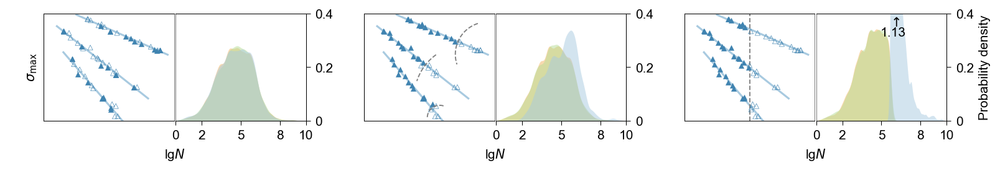

In [9]:
coefs = [(-1.5, 9), (-1, 10), (-0.5, 11)]
ranges = [(2, 8), (1.5, 7.5), (3, 9)]
n_sample = 20
aspect = 0.827

kde_kwargs = dict(fill=True, legend=False, alpha=.5, linewidth=0)

def plot_once(ax, train_indices_func):
    for idx, ((a, b), (x1, x2)) in enumerate(zip(coefs, ranges)):
        np.random.seed(idx+2)
        rd_x = (x2-x1)*np.random.sample(n_sample)+x1
        rd_y = a*rd_x+b
        rd_x = np.random.randn(n_sample)*0.2+rd_x
        sort_arg = np.argsort(rd_x)
        rd_x = rd_x[sort_arg]
        rd_y = rd_y[sort_arg]*aspect

        train_indices = train_indices_func(rd_x, rd_y)
        val_indices = np.setdiff1d(np.arange(n_sample), train_indices)

        ax.scatter(rd_x[train_indices], rd_y[train_indices], zorder=10, s=15, linewidth=0.3, facecolor=lighten_color(tabensemb.utils.global_palette[2], 2.3), marker="^")
        ax.scatter(rd_x[val_indices], rd_y[val_indices], zorder=10, s=15, linewidth=0.3, edgecolor=lighten_color(tabensemb.utils.global_palette[2], 2.3), facecolors="none", marker="^")
        pfit = np.polyfit(rd_x, rd_y, 1)
        k, b = pfit[0], pfit[1]
        plt.plot(np.linspace(x1-0.5, x2+0.5, 3), k*np.linspace(x1-0.5, x2+0.5, 3)+b, alpha=1, color=tabensemb.utils.global_palette[2], zorder=0)

    # ax.set_xlabel("log10(Cycles to Failure)", fontsize=plt.rcParams["font.size"])
    ax.set_ylabel("Maximum Stress", fontsize=plt.rcParams["font.size"])
    replace_feature_names(ax)
    set_linewidth(ax)
    ax.set_ylim([0, 10*aspect])
    ax.set_xlim([0, 10])
    ax.set_xticks([])
    ax.set_yticks([])
    # ax.spines["top"].set_linewidth(0)
    # ax.spines["right"].set_linewidth(0)
    ax.set_aspect("equal")
    # ax.set_box_aspect(1)

fig = plt.figure(figsize=(13,1.5), dpi=150)

width=14
gap = min([int(np.floor((100 - 6*width)/2)), 6])

from matplotlib.gridspec import GridSpec

gs = GridSpec(100, 100, figure=fig)
ax = fig.add_subplot(gs[:, 0:width])

plot_once(ax, lambda x, y: np.random.choice(np.arange(n_sample), size=int(n_sample*0.6)))
ax.spines["right"].set_linewidth(0.25)
# ax.set_title("Scenario A", fontsize=plt.rcParams["font.size"])

ax = fig.add_subplot(gs[:, width:2*width])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.set_yticks([])
set_linewidth(ax)
# ax.set_axis_off()
# ax.set_xlabel("log10(Cycles to Failure)")
# replace_feature_names(ax)
ax = ax.twinx()

sns.kdeplot(rd_train, palette=[tabensemb.utils.global_palette[0]], ax=ax, label="Training", **kde_kwargs)
sns.kdeplot(rd_val, palette=[tabensemb.utils.global_palette[1]], ax=ax, label="Validation", **kde_kwargs)
sns.kdeplot(rd_test, palette=[tabensemb.utils.global_palette[2]], ax=ax, label="Testing", **kde_kwargs)

ax.set_ylim([0, 0.4])
ax.set_xlim([0, 10])
# ax.set_ylabel("Density")

# replace_feature_names(ax)
set_linewidth(ax)
ax.set_ylabel(None)
ax.set_xticks([0, 2,5,8, 10])
ax.set_xticklabels([0, 2,5,8, 10])
ax.set_yticks([0, 0.2, 0.4])
ax.set_yticklabels([0, 0.2, 0.4])
ax.spines["left"].set_linewidth(0.25)

ax = fig.add_subplot(gs[:, 0:2*width])
ax.set_frame_on(False)
ax.tick_params(
    labelcolor="none",
    which="both",
    top=False,
    bottom=False,
    left=False,
    right=False,
)
ax.set_xlabel("log10(Cycles to Failure)")
replace_feature_names(ax)

ax = fig.add_subplot(gs[:, (2*width+gap):(3*width+gap)])

plot_once(ax, lambda x, y: np.where(y>np.percentile(y, 40))[0])
ax.set_ylabel(None)
centers = [(5.8, 0.3*aspect), (7.9, 2.2*aspect), (9.5, 6.2*aspect)]
radius = [0.95, 4.05, 2.5]
angles = [0.7*np.pi, 0.8*np.pi, 0.85*np.pi]
spans = [0.6*np.pi, 0.2*np.pi, 0.5*np.pi]
for idx, (center, r, ang, sp) in enumerate(zip(centers, radius, angles, spans)):
    theta = np.linspace(ang-sp/2, ang+sp/2, 100)
    x = center[0] + np.cos(theta)*r
    y = center[1] + np.sin(theta)*r
    # ax.scatter([center[0]], [center[1]], color=tabensemb.utils.global_palette[idx], s=4)
    ax.plot(x, y, color="grey", zorder=15, linewidth=0.9, linestyle="--")
# ax.set_title("Scenario B", fontsize=plt.rcParams["font.size"])

# ax.spines["left"].set_linewidth(0.25)
ax.spines["right"].set_linewidth(0.25)

ax = fig.add_subplot(gs[:, (3*width+gap):(4*width+gap)])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.set_yticks([])
set_linewidth(ax)
# ax.set_xlabel("log10(Cycles to Failure)")
# replace_feature_names(ax)
# ax.set_axis_off()
ax = ax.twinx()

sns.kdeplot(sc_train, palette=[tabensemb.utils.global_palette[0]], ax=ax, label="Training", **kde_kwargs)
sns.kdeplot(sc_val, palette=[tabensemb.utils.global_palette[1]], ax=ax, label="Validation", **kde_kwargs)
sns.kdeplot(sc_test, palette=[tabensemb.utils.global_palette[2]], ax=ax, label="Testing", **kde_kwargs)
# ax.set_xlabel("log10(Cycles to Failure)")
ax.set_ylim([0, 0.4])
ax.set_xlim([0, 10])
set_linewidth(ax)
ax.set_ylabel(None)
ax.set_xticks([0, 2,5,8, 10])
ax.set_xticklabels([0, 2,5,8, 10])
ax.set_yticks([0, 0.2, 0.4])
ax.set_yticklabels([0, 0.2, 0.4])
# ax.set_yticks([])
# ax.set_yticklabels([])
ax.spines["left"].set_linewidth(0.25)
# ax.spines["right"].set_linewidth(0.25)

ax = fig.add_subplot(gs[:, (2*width+gap):(4*width+gap)])
ax.set_frame_on(False)
ax.tick_params(
    labelcolor="none",
    which="both",
    top=False,
    bottom=False,
    left=False,
    right=False,
)
ax.set_xlabel("log10(Cycles to Failure)")
replace_feature_names(ax)

ax = fig.add_subplot(gs[:, (4*width+2*gap):(5*width+2*gap)])

plot_once(ax, lambda x, y: np.where(x<5)[0])
ax.set_ylabel(None)
ax.plot([5, 5], [0, 10], color="grey", linewidth=0.9, linestyle="--", )
# ax.set_title("Scenario C", fontsize=plt.rcParams["font.size"])
ax.spines["right"].set_linewidth(0.25)


ax = fig.add_subplot(gs[:, (5*width+2*gap):(6*width+2*gap)])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.set_yticks([])
set_linewidth(ax)
# ax.set_xlabel("log10(Cycles to Failure)")
# replace_feature_names(ax)
# ax.set_axis_off()
ax = ax.twinx()

sns.kdeplot(et_train, palette=[tabensemb.utils.global_palette[0]], ax=ax, label="Training", **kde_kwargs)
sns.kdeplot(et_val, palette=[tabensemb.utils.global_palette[1]], ax=ax, label="Validation", **kde_kwargs)
sns.kdeplot(et_test, palette=[tabensemb.utils.global_palette[2]], ax=ax, label="Testing", **kde_kwargs)
# ax.set_xlabel("log10(Cycles to Failure)")
ax.set_ylim([0, 0.4])
ax.set_xlim([0, 10])
ax.set_xlabel("log10(Cycles to Failure)")
# ax.set_title("Scenario C", fontsize=10)
replace_feature_names(ax)
set_linewidth(ax)
ax.set_xticks([0, 2,5,8, 10])
ax.set_xticklabels([0, 2,5,8, 10])
ax.set_ylabel("Probability density")
ax.set_yticks([0, 0.2, 0.4])
ax.set_yticklabels([0, 0.2, 0.4])
# ax.set_yticks([])
# ax.set_yticklabels([])
ax.spines["left"].set_linewidth(0.25)
# ax.set_yticklabels([])
# ax.text(0.03, 0.97, "Scenario C", ha="left", va="top", transform=ax.transAxes)
ax.legend(frameon=False, bbox_to_anchor=(1.8, 0.5), handlelength=1)
handles, labels = ax.get_legend().legendHandles, [x.get_text() for x in ax.get_legend().texts]
ax.get_legend().remove()

from scipy.stats import gaussian_kde
kernel = gaussian_kde(et_test.reshape(1, -1))
agm = np.linspace(1, 10, 10000)[np.argmax(kernel(np.linspace(1, 10, 10000)))]
maxima = kernel(agm)
ax.text(agm+0.05, 0.39, r"$\uparrow$", ha="center", va="top")
ax.text(agm, 0.35, f"{maxima[0]:.2f}", ha="center", va="top")

ax = fig.add_subplot(gs[:, (4*width+2*gap):(6*width+2*gap)])
ax.set_frame_on(False)
ax.tick_params(
    labelcolor="none",
    which="both",
    top=False,
    bottom=False,
    left=False,
    right=False,
)
ax.set_xlabel("log10(Cycles to Failure)")
replace_feature_names(ax)


# ax = plt.subplot(111)
# ax.set_frame_on(False)
# ax.tick_params(
#     labelcolor="none",
#     which="both",
#     top=False,
#     bottom=False,
#     left=False,
#     right=False,
# )
# ax.set_ylabel("Testing MAPE % reduction")

# ax.legend(handles, labels, title=False, bbox_to_anchor=(0.88, -0.05), ncols=3, frameon=False, handlelength=1)
plt.tight_layout()
plt.savefig(fname=os.path.join(trainer.project_root, "split_combined.pdf"), dpi=500, bbox_inches="tight")

plt.show()
plt.close()

In [79]:
agm = np.linspace(1, 10, 10000)[np.argmax(kernel(np.linspace(1, 10, 10000)))]
maxima = kernel(agm)
agm, maxima

(5.900990099009901, array([1.12750086]))

/home/xlluo/hdd/ML-fracture/src/trainer/trainer.py:158: RuntimeWarning: divide by zero encountered in divide
  return res / np.max(res)
/tmp/ipykernel_8971/1172464297.py:6: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.savefig(fname=os.path.join(trainer.project_root, "stresscycle_split.pdf"), dpi=500)
/tmp/ipykernel_8971/1172464297.py:6: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.savefig(fname=os.path.join(trainer.project_root, "stresscycle_split.pdf"), dpi=500)
/home/xlluo/anaconda3/envs/tabular_ensemble/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fig.canvas.print_figure(bytes_io, **kw)


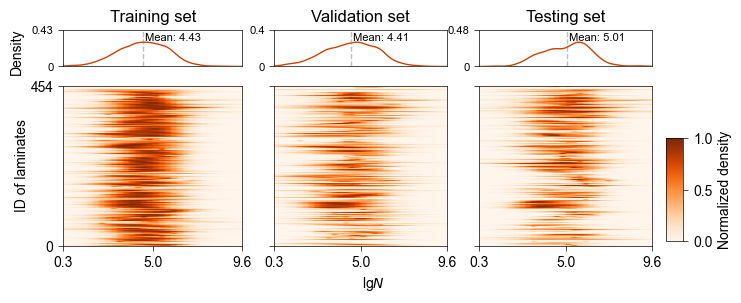

In [18]:
fig = sc_trainer.plot_data_split(bins=30, save_show_close=False, figure_kwargs=dict(figsize=(8, 2.8)))
for child in fig.get_children():
    if isinstance(child, matplotlib.axes.Axes):
        set_linewidth(child)
        replace_feature_names(child)
plt.savefig(fname=os.path.join(trainer.project_root, "stresscycle_split.pdf"), dpi=500)
plt.show()
plt.close()

/home/xlluo/hdd/ML-fracture/src/trainer/trainer.py:158: RuntimeWarning: divide by zero encountered in divide
  return res / np.max(res)
/tmp/ipykernel_23340/307979996.py:6: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.savefig(fname=os.path.join(trainer.project_root, "random_split.pdf"), dpi=500)
/tmp/ipykernel_23340/307979996.py:6: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.savefig(fname=os.path.join(trainer.project_root, "random_split.pdf"), dpi=500)
/home/xlluo/anaconda3/envs/tabular_ensemble/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fig.canvas.print_figure(bytes_io, **kw)


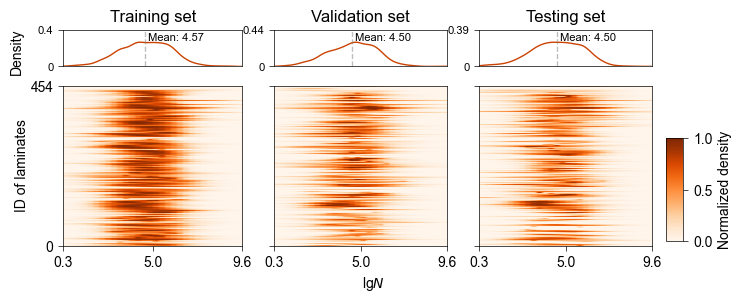

In [6]:
fig = rd_trainer.plot_data_split(bins=30, save_show_close=False, figure_kwargs=dict(figsize=(8, 2.8)))
for child in fig.get_children():
    if isinstance(child, matplotlib.axes.Axes):
        set_linewidth(child)
        replace_feature_names(child)
plt.savefig(fname=os.path.join(trainer.project_root, "random_split.pdf"), dpi=500)
plt.show()
plt.close()

/home/xlluo/hdd/ML-fracture/src/trainer/trainer.py:158: RuntimeWarning: divide by zero encountered in divide
  return res / np.max(res)
/tmp/ipykernel_23340/711438933.py:6: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.savefig(fname=os.path.join(trainer.project_root, "extreme_split.pdf"), dpi=500)
/tmp/ipykernel_23340/711438933.py:6: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.savefig(fname=os.path.join(trainer.project_root, "extreme_split.pdf"), dpi=500)
/home/xlluo/anaconda3/envs/tabular_ensemble/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fig.canvas.print_figure(bytes_io, **kw)


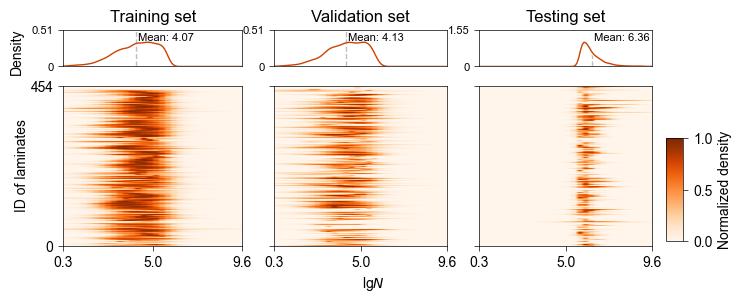

In [7]:
fig = et_trainer.plot_data_split(bins=30, save_show_close=False, figure_kwargs=dict(figsize=(8, 2.8)))
for child in fig.get_children():
    if isinstance(child, matplotlib.axes.Axes):
        set_linewidth(child)
        replace_feature_names(child)
plt.savefig(fname=os.path.join(trainer.project_root, "extreme_split.pdf"), dpi=500)
plt.show()
plt.close()

# Analyse results

In [8]:
from src.trainer import FatigueTrainer
from src.model.thiswork import ThisWork
trainer_rd_622: FatigueTrainer = load_trainer("output/composite_database_03222024/2024-04-12-19-02-45-0_composite A622 mcd/trainer.pkl")
trainer_rd_316: FatigueTrainer = load_trainer("output/composite_database_03222024/2024-04-12-19-04-14-0_composite A316 mcd/trainer.pkl")
trainer_sc_622: FatigueTrainer = load_trainer("output/composite_database_03222024/2024-07-14-00-05-14-0_composite B622 mcd/trainer.pkl")
trainer_sc_316: FatigueTrainer = load_trainer("output/composite_database_03222024/2024-07-16-07-50-38-0_composite B316 mcd/trainer.pkl")
trainer_et_622: FatigueTrainer = load_trainer("output/composite_database_03222024/2024-04-12-21-32-11-0_composite C622 mcd/trainer.pkl")
trainer_et_316: FatigueTrainer = load_trainer("output/composite_database_03222024/2024-04-12-09-34-02-0_composite C316 mcd/trainer.pkl")

In [9]:
modelbase_name_mapping = {
    "AutoGluon": "AG",
    "PytorchTabular": "PT",
    "WideDeep": "WD",
    # "ThisWork": "PE",
}
model_name_mapping = {
"CatBoost": "CatBoost",
"Neural Network with PyTorch": "ANN-torch",
"LightGBM": "LightGBM",
"Neural Network with FastAI": "ANN-fastai",
"XGBoost": "XGB",
"Extremely Randomized Trees": "ExtraTrees",
"TabFastFormer": "FastFormer",
"TabResnet": "ResNet",
"Category Embedding": "ANN",
"FTTransformer": "FTT",
"Random Forest": "RF",
"SelfAttentionMLP": "SelfAttn",
"NODE": "NODE",
"TabPerceiver": "Perceiver",
"TabMlp": "MLP",
"ContextAttentionMLP": "ContextAttn",
"TabNet": "TabNet",
"SAINT": "SAINT",
"Linear Regression": "Ridge",
"TabTransformer": "TabTrans",
"K-Nearest Neighbors": "KNN",
"AutoInt": "AutoInt"}

## Compute more metrics

In [ ]:
import pickle
from tabensemb.utils import auto_metric_sklearn
import scipy.stats as st
for path in ["output/composite_database_03222024/2024-04-12-19-02-45-0_composite A622 mcd", "output/composite_database_03222024/2024-07-14-00-05-14-0_composite B622 mcd", "output/composite_database_03222024/2024-04-12-21-32-11-0_composite C622 mcd"]:
    with open(os.path.join(path, "cv", "cv_state.pkl"), "rb") as file:
        cv_state = pickle.load(file)
    os.makedirs(os.path.join(path, "cv_supp"), exist_ok=True)
    df_cvs = [pd.read_csv(os.path.join(path, "cv", f"leaderboard_cv_{i}.csv"), index_col=[0]) for i in range(10)]
    df_cv_mean = pd.read_csv(os.path.join(path, "leaderboard_approx_mean.csv"))
    df_cv_std = pd.read_csv(os.path.join(path, "leaderboard_approx_std.csv"))
    for idx, (program, model) in enumerate(zip(df_cv_mean["Program"], df_cv_mean["Model"])):
        preds = cv_state["programs_predictions"][program][model]["Testing"][0]
        trues = cv_state["programs_predictions"][program][model]["Testing"][1]
        intervals = [np.array(range(int(np.floor(i*len(preds)/10)), int(np.floor((i+1)*len(preds)/10)))) for i in range(10)]

        cvs = []
        for i, interval in enumerate(intervals):
            val = np.mean(trues[interval]-preds[interval])
            cvs.append(val)
            df_cvs[i].loc[idx, "Testing MBE"] = val
        df_cv_mean.loc[idx, "Testing MBE"] = np.mean(cvs)
        df_cv_std.loc[idx, "Testing MBE"] = np.std(cvs)

        # cvs = []
        # for interval in intervals:
        #     cvs.append(np.max(trues[interval]-preds[interval]))
        # df_cv_mean.loc[idx, "Testing MaxBE"] = np.mean(cvs)
        # df_cv_std.loc[idx, "Testing MaxBE"] = np.std(cvs)
        #
        # cvs = []
        # for interval in intervals:
        #     cvs.append(np.min(trues[interval]-preds[interval]))
        # df_cv_mean.loc[idx, "Testing MinBE"] = np.mean(cvs)
        # df_cv_std.loc[idx, "Testing MinBE"] = np.std(cvs)

        cvs = []
        for i, interval in enumerate(intervals):
            cvs.append(st.norm.interval(confidence=0.95, loc=np.mean(trues[interval]-preds[interval]), scale=np.std(trues[interval]-preds[interval]))[0])
        df_cv_mean.loc[idx, "Testing 95%CIBE(L)"] = np.mean(cvs)
        df_cv_std.loc[idx, "Testing 95%CIBE(L)"] = np.std(cvs)

        cvs = []
        for i, interval in enumerate(intervals):
            cvs.append(st.norm.interval(confidence=0.95, loc=np.mean(trues[interval]-preds[interval]), scale=np.std(trues[interval]-preds[interval]))[1])
        df_cv_mean.loc[idx, "Testing 95%CIBE(R)"] = np.mean(cvs)
        df_cv_std.loc[idx, "Testing 95%CIBE(R)"] = np.std(cvs)
    df_cv_mean.to_csv(os.path.join(path, "leaderboard_approx_mean_supp.csv"), index=False)
    df_cv_std.to_csv(os.path.join(path, "leaderboard_approx_std_supp.csv"), index=False)
    for i in range(10):
        df_cvs[i].to_csv(os.path.join(path, "cv_supp", f"leaderboard_cv_{i}.csv"))

## Improvement

In [62]:
def plot_compare_improv(trainer, arrow_on_left=True, ylim1=None, ylim2=None, p_kwargs=None, p_legend_kwargs=None, emp=True, emp_text_kwargs=None, emp_line_lim=None, emp_text_y=None, emp_in_improv=True, emp_line_lim_in_improv=None, emp_text_kwargs_in_improv=None, emp_text_y_in_improv=None, figsize=(6., 4.), legend_kwargs = None):
    from tabensemb.utils.utils import update_defaults_by_kwargs
    p_kwargs_ = update_defaults_by_kwargs(dict(p_cap_height=0.02,p_cap_width=0.4,p_text_kwargs=dict(fontsize=5),), p_kwargs)
    p_legend_kwargs_ = update_defaults_by_kwargs(dict(x=0, y=1, s="+++  $p<$0.01   ++  $p<$0.05\n  +    $p<$0.10    o   $p\geq$0.10", ha="left", va="top"), p_legend_kwargs)
    emp_text_kwargs_ = update_defaults_by_kwargs(dict(), emp_text_kwargs)
    emp_text_kwargs_in_improv_ = update_defaults_by_kwargs(dict(), emp_text_kwargs_in_improv)
    legend_kwargs_ = update_defaults_by_kwargs(dict(loc="upper left", ncols=2, frameon=False), legend_kwargs)
    leaderboard_ = trainer.leaderboard.copy()
    leaderboard_.sort_values(by="Testing MAPE", inplace=True)
    leaderboard = leaderboard_.drop(
        leaderboard_[leaderboard_["Model"].str.contains("PHYSICS")].index
    ).reset_index(drop=True)
    physics_names = [x for x in trainer.leaderboard["Model"] if "PHYSICS" in x]
    improved_measure, test_res = trainer.get_modelbase("ThisWork").improvement(
        leaderboard,
        cv_path=os.path.join(trainer.project_root, "cv"),
        exclude=physics_names,
    )
    true_ranks = {}
    for phy_name in physics_names:
        rank_phy = list(leaderboard_["Model"]).index(phy_name)
        ahead_thiswork = len([x for x in list(leaderboard_["Program"])[:rank_phy] if x == "ThisWork"])
        true_rank_phy = rank_phy - ahead_thiswork
        true_ranks[phy_name] = true_rank_phy
    thiswork: ThisWork = trainer.get_modelbase("ThisWork")
    
    def get_star(p):
        if p<0.01:
            return "+++"
        elif p<0.05:
            return "++"
        elif p<0.1:
            return "+"
        else:
            return "o"

    plt.figure(figsize=figsize, dpi=150)
    ax1 = plt.subplot(211)
    ax2 = plt.subplot(212)
    thiswork.plot_compare(
        leaderboard,
        improved_measure,
        test_res,
        metric="Testing MAPE",
        clr=tabensemb.utils.global_palette[:2],
        # save_to=os.path.join(trainer.project_root, "compare.jpg"),
        p_symbol_map_func=get_star,
        ax=ax1,
        save_show_close=False,
        boxplot_kwargs=dict(orient="v", linewidth=0.5, flierprops=dict(linewidth=0.5), fliersize=1),
        legend_kwargs=legend_kwargs_,
        **p_kwargs_,
    )
    replace_legend_labels(ax1, {"Base model": "ML (Practicism)", "Proposed": "ENSEMBLE"}, legend_kwargs_)
    ax1.set_xlim([-0.5, 24.5])
    if ylim1 is not None:
        ax1.set_ylim(ylim1)
    replace_feature_names(ax1, special_mapping=modelbase_name_mapping)
    replace_feature_names(ax1, special_mapping=model_name_mapping)
    set_linewidth(ax1)
    # ax1.spines["right"].set_linewidth(0)
    # ax1.spines["top"].set_linewidth(0)
    ax1.set_xlim([-0.5, 24.5])
    if ylim1 is not None:
        ax1.set_ylim(ylim1)

    plt.setp(
        ax1.get_xticklabels(),
        rotation=90,
        va="center",
        ha="right",
        rotation_mode="anchor",
    )
    if emp:
        for phy_name, rank in true_ranks.items():
            ax1.plot([rank-0.5, rank-0.5], ax1.get_ylim() if emp_line_lim is None else emp_line_lim, c="k", linewidth=0.5, )
            if arrow_on_left:
                ax1.text(rank-0.5-0.1, ax1.get_ylim()[1]*0.95 if emp_text_y is None else emp_text_y, r"Empiricism$\rightarrow$", ha="right", va="top", **emp_text_kwargs_)
            else:
                ax1.text(rank-0.5+0.1, ax1.get_ylim()[1]*0.95 if emp_text_y is None else emp_text_y, r"$\leftarrow$Empiricism", ha="left", va="top", **emp_text_kwargs_)
    ax1.text(**p_legend_kwargs_)
    ax1.set_xlabel(None)
    ax1.set_ylabel("Testing MAPE (%)")
    multiply_yticklabels(ax1)
    ax1.set_xticklabels([])
    
    thiswork.plot_improvement(
        leaderboard,
        improved_measure,
        test_res,
        metric=["Validation MAPE", "Testing MAPE"],
        clr=tabensemb.utils.global_palette[2:4],
        save_show_close=False,
        ax=ax2,
        # save_to=os.path.join(trainer.project_root, "improvement.jpg"),
        legend_kwargs=update_defaults_by_kwargs(legend_kwargs_, dict(ncols=1)),
        barplot_kwargs=dict(orient="v", linewidth=0, err_kws=dict(linewidth=0.5), capsize=0.5),
    )
    ax2.set_xlim([-0.5, 24.5])
    if ylim2 is not None:
        ax2.set_ylim(ylim2)
    replace_feature_names(ax2, special_mapping=modelbase_name_mapping)
    replace_feature_names(ax2, special_mapping=model_name_mapping)
    set_linewidth(ax2)
    # ax2.spines["right"].set_linewidth(0)
    # ax2.spines["top"].set_linewidth(0)
    # replace_legend_labels(ax2, mapping={"Validation RMSE": "Validation", "Testing RMSE": "Testing"}, legend_kwargs=dict(loc="upper left", frameon=False))
    ax2.set_xlim([-0.5, 24.5])
    if ylim2 is not None:
        ax2.set_ylim(ylim2)
    plt.setp(
        ax2.get_xticklabels(),
        rotation=90,
        va="center",
        ha="right",
        rotation_mode="anchor",
    )
    if emp_in_improv:
        for phy_name, rank in true_ranks.items():
            ax2.plot([rank-0.5, rank-0.5], ax2.get_ylim() if emp_line_lim_in_improv is None else emp_line_lim_in_improv, c="k", linewidth=0.5, )
            if arrow_on_left:
                ax2.text(rank-0.5-0.1, ax2.get_ylim()[1]*0.95 if emp_text_y_in_improv is None else emp_text_y_in_improv, r"Empiricism$\rightarrow$", ha="right", va="top", **emp_text_kwargs_in_improv_)
            else:
                ax2.text(rank-0.5+0.1, ax2.get_ylim()[1]*0.95 if emp_text_y_in_improv is None else emp_text_y_in_improv, r"$\leftarrow$Empiricism", ha="left", va="top", **emp_text_kwargs_in_improv_)
    ax2.set_xlabel(None)
    ax2.set_ylabel("% reduction")
    return improved_measure

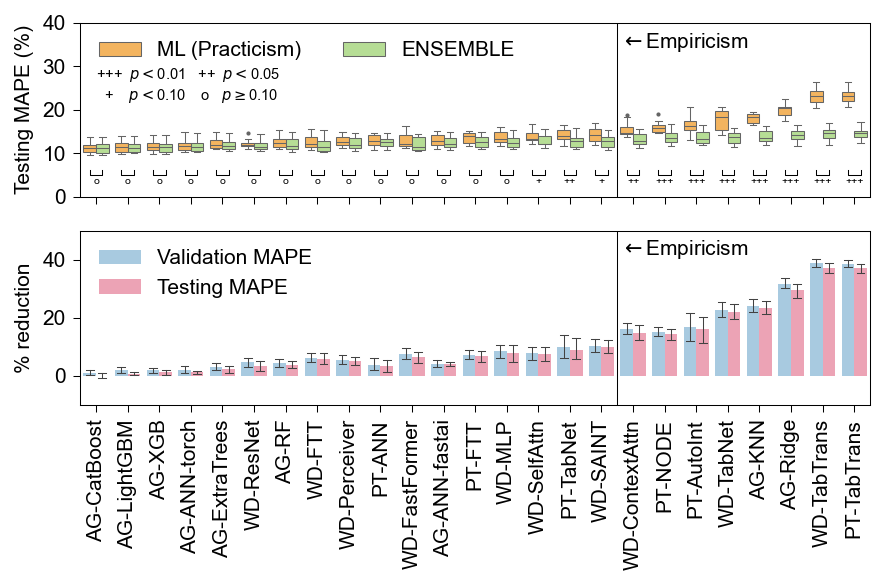

In [8]:
improvement_measure = plot_compare_improv(trainer_rd_622, ylim1=[0.0, 0.4], ylim2=[-10, 50], p_kwargs=dict(p_pos_y=0.05, p_text_up_pos_y=0.045, p_cap_height=0.01,p_cap_width=0.4,p_text_kwargs=dict(fontsize=5)), p_legend_kwargs=dict(fontsize=7, y=0.3), arrow_on_left=False)
# ax.axis("equal")
plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "rd622.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

In [9]:
improvement_measure.sort_values(by="Testing MAPE % Improvement")["Testing MAPE % Improvement"]

24    -0.076514
23     0.634284
22     1.042973
21     1.075167
20     2.120265
18     3.224315
15     3.397103
16     3.627978
19     4.013289
14     4.809056
13     5.541213
17     6.462249
11     6.804371
12     7.498833
9      7.679199
10     9.093561
8     10.121010
7     14.093440
6     14.738284
5     16.415828
4     22.475380
3     23.197377
2     29.363555
0     36.852397
1     37.081274
Name: Testing MAPE % Improvement, dtype: float64

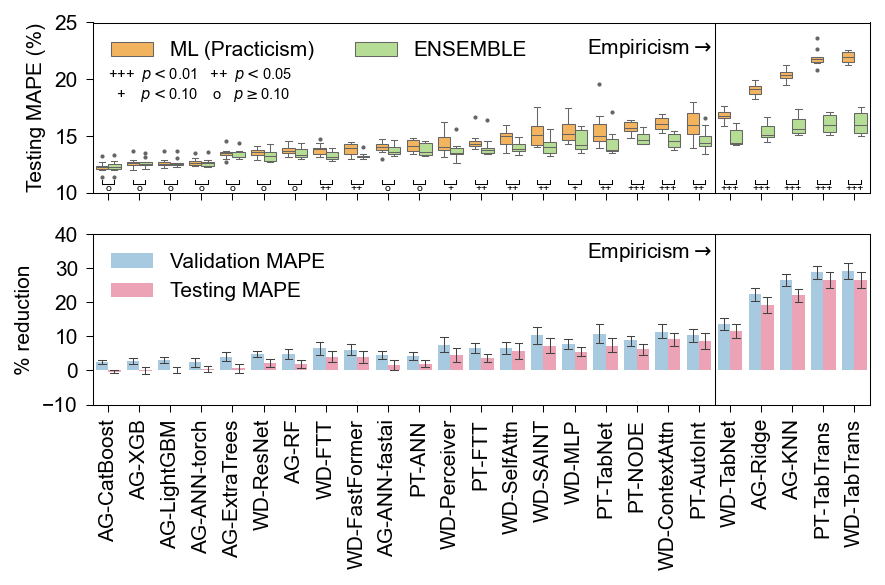

In [10]:
plot_compare_improv(trainer_rd_316, ylim1=[0.1, 0.25], ylim2=[-10, 40], p_kwargs=dict(p_pos_y=0.108, p_text_up_pos_y=0.1075, p_cap_height=0.003,p_cap_width=0.4,p_text_kwargs=dict(fontsize=5)), p_legend_kwargs=dict(fontsize=7, x=0, y=0.212))
# ax.axis("equal")
plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "rd316.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

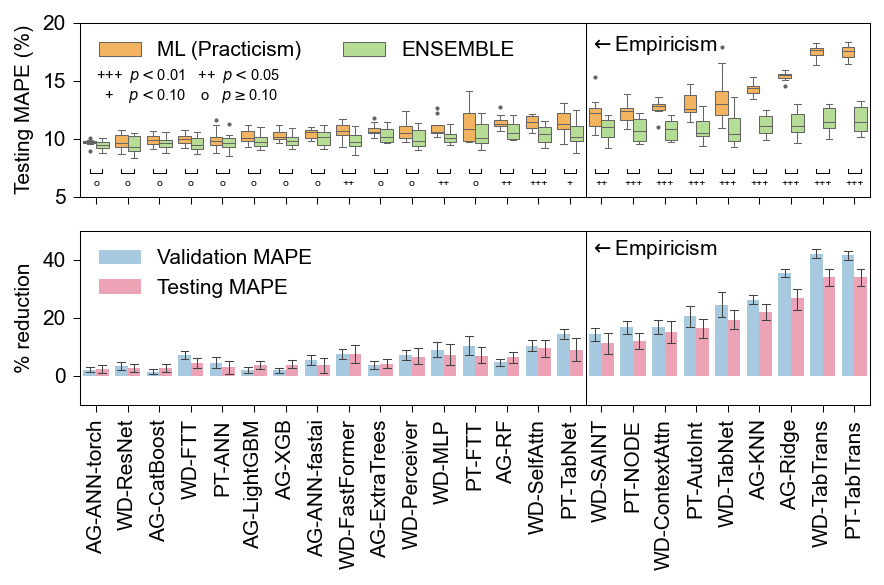

In [7]:
plot_compare_improv(trainer_sc_622, ylim1=[0.05, 0.2], ylim2=[-10, 50], p_kwargs=dict(p_pos_y=0.07, p_text_up_pos_y=0.065, p_cap_height=0.004,p_cap_width=0.4,p_text_kwargs=dict(fontsize=5)), p_legend_kwargs=dict(fontsize=7, x=0, y=0.162), arrow_on_left=False)
# ax.axis("equal")
plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "sc622.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

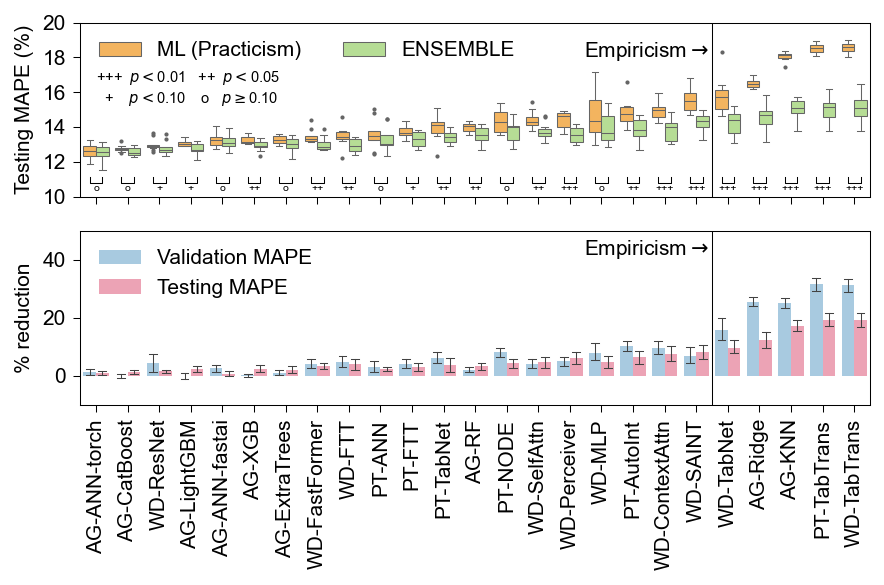

In [8]:
plot_compare_improv(trainer_sc_316, ylim1=[0.1, 0.2], ylim2=[-10, 50], p_kwargs=dict(p_pos_y=0.108, p_text_up_pos_y=0.107, p_cap_height=0.003,p_cap_width=0.4,p_text_kwargs=dict(fontsize=5)), p_legend_kwargs=dict(fontsize=7, x=0, y=0.173))
# ax.axis("equal")
plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "sc316.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

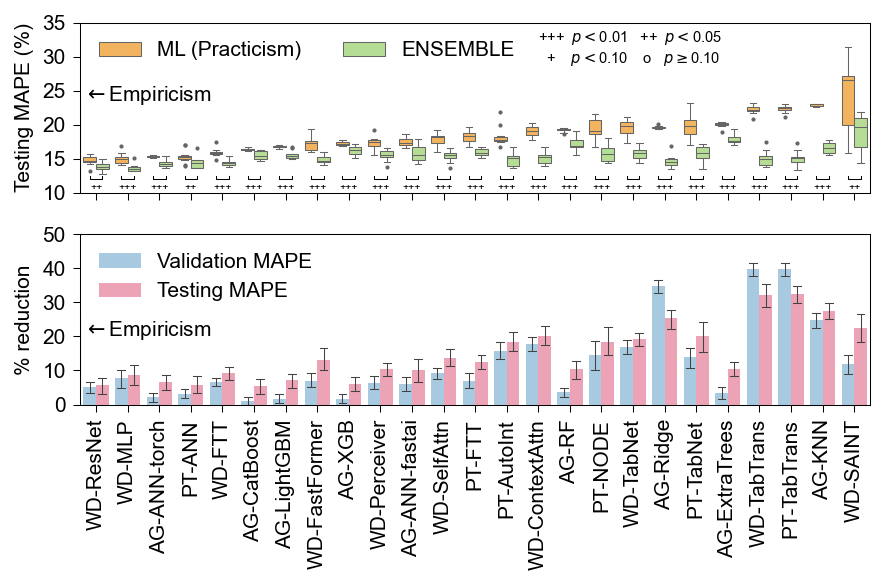

In [13]:
plot_compare_improv(trainer_et_622, arrow_on_left=False, ylim1=[0.10, 0.35], ylim2=[0, 50], p_kwargs=dict(p_pos_y=0.12, p_text_up_pos_y=0.115, p_cap_height=0.004,p_cap_width=0.4,p_text_kwargs=dict(fontsize=5)), p_legend_kwargs=dict(fontsize=7, x=14, y=0.34), emp_line_lim=[0.1, 0.24], emp_text_y=0.26, emp_in_improv=True, emp_line_lim_in_improv=[0., 25], emp_text_y_in_improv=25)
# ax.axis("equal")
plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "et622.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

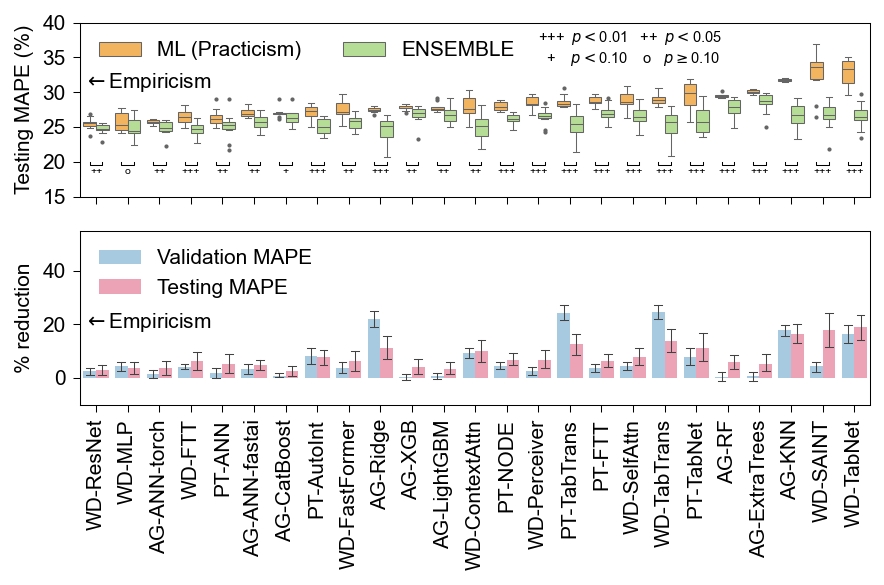

In [14]:
plot_compare_improv(trainer_et_316, arrow_on_left=False, ylim1=[0.18, 0.4], ylim2=[-10, 55], p_kwargs=dict(p_pos_y=0.195, p_text_up_pos_y=0.193, p_cap_height=0.004,p_cap_width=0.4,p_text_kwargs=dict(fontsize=5)), p_legend_kwargs=dict(fontsize=7, x=14, y=0.39), emp_text_y=0.33, emp_text_y_in_improv=25)
# ax.axis("equal")
plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "et316.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

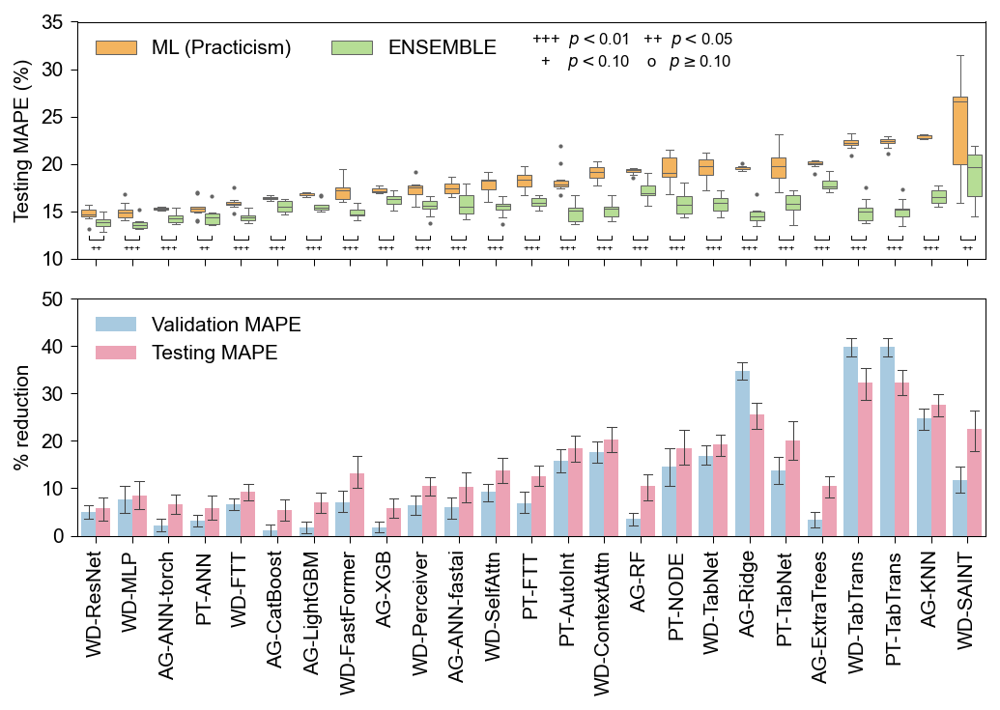

In [76]:
improvement_measure = plot_compare_improv(trainer_et_622, arrow_on_left=False, ylim1=[0.10, 0.35], ylim2=[0, 50], p_kwargs=dict(p_pos_y=0.12, p_text_up_pos_y=0.115, p_cap_height=0.004,p_cap_width=0.4,p_text_kwargs=dict(fontsize=5)), p_legend_kwargs=dict(fontsize=8, x=12, y=0.34), emp_line_lim=[0.1, 0.24], emp_text_y=0.26, emp_in_improv=False, emp_line_lim_in_improv=[0., 25], emp_text_y_in_improv=25, figsize=(7., 5), emp=False)
# ax.axis("equal")
plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "et622_large.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

In [92]:
improvement_measure.sort_values(by="Testing MAPE % Improvement")["Testing MAPE % Improvement"]

24     5.371120
22     5.807653
23     5.918820
20     5.923157
21     6.556762
19     7.079062
17     8.744124
16     9.342604
18    10.167717
13    10.476967
14    10.541849
15    10.587497
12    12.727279
10    13.453012
11    13.806455
0     18.591232
9     18.671577
6     19.333649
7     20.277442
8     20.452151
4     23.627538
5     25.522646
3     27.581158
1     32.310450
2     32.372873
Name: Testing MAPE % Improvement, dtype: float64

## Compare deep learning and non deep learning

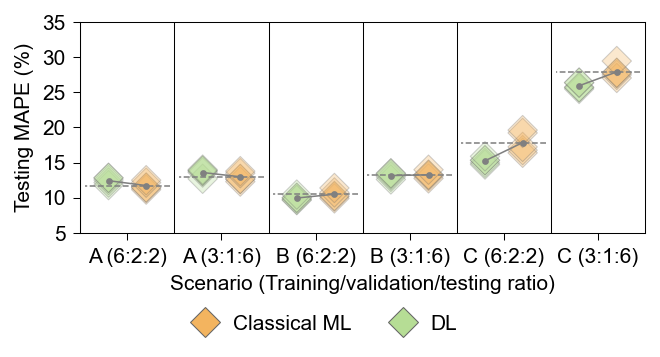

In [9]:
import seaborn as sns
is_dl = lambda x: False if any([i in x for i in ["CatBoost", "LightGBM", "XGBoost", "Extremely Randomized Trees", "Random Forest", "K-Nearest Neighbors", "Linear Regression"]]) else True

def get_top5(trainer):
    leaderboard = trainer.leaderboard.copy()
    leaderboard.sort_values(by="Testing MAPE", inplace=True)
    leaderboard = leaderboard.drop(
            leaderboard[leaderboard["Model"].str.contains("PHYSICS")].index
        ).reset_index(drop=True)

    rmse = leaderboard[leaderboard["Program"]!="ThisWork"][["Program", "Model", "Testing MAPE"]]
    rmse["Is deep learning"] = ["DL" if is_dl(i) else "Classical ML" for i in rmse["Model"]]
    top5_not_dl = rmse[rmse["Is deep learning"]=="Classical ML"][:5]
    top5_is_dl = rmse[rmse["Is deep learning"]=="DL"][:5]
    top5 = pd.concat([top5_not_dl, top5_is_dl])[["Testing MAPE", "Is deep learning"]]
    return top5
rd_top5 = get_top5(trainer_rd_622)
rd_top5_316 = get_top5(trainer_rd_316)
sc_top5 = get_top5(trainer_sc_622)
sc_top5_316 = get_top5(trainer_sc_316)
et_top5 = get_top5(trainer_et_622)
et_top5_316 = get_top5(trainer_et_316)
rd_top5["class"] = "A (6:2:2)"
sc_top5["class"] = "B (6:2:2)"
et_top5["class"] = "C (6:2:2)"
rd_top5_316["class"] = "A (3:1:6)"
sc_top5_316["class"] = "B (3:1:6)"
et_top5_316["class"] = "C (3:1:6)"
top5 = pd.concat([rd_top5, rd_top5_316, sc_top5, sc_top5_316, et_top5, et_top5_316][::-1])
plt.figure(figsize=(4.5, 2.5), dpi=150)
ax = plt.subplot(111)
# sns.violinplot(top5, x="Testing MAPE", y="class", ax=ax, orient="h", hue="Is deep learning", hue_order=["Classical ML", "DL"], palette=tabensemb.utils.global_palette[:2], inner="point", split=True, gap=.2, linewidth=0.5, saturation=1, width=0.8, density_norm="width")
sns.stripplot(top5, y="Testing MAPE", x="class", ax=ax, orient="v", hue="Is deep learning", hue_order=["Classical ML", "DL"], palette=tabensemb.utils.global_palette[:2], jitter=False, dodge=True, marker="D", s=10, linewidth=0.5, alpha=0.3)

# Mean compare
width = 0.8
each_width = width / 2
offsets = np.linspace(0, width - each_width, 2)
offsets -= offsets.mean()
for idx, df in enumerate([rd_top5, rd_top5_316, sc_top5, sc_top5_316, et_top5, et_top5_316][::-1]):
    mean_ndl = df[df["Is deep learning"]=="Classical ML"]["Testing MAPE"].mean()
    mean_ydl = df[df["Is deep learning"]=="DL"]["Testing MAPE"].mean()
    ax.scatter([idx+offsets[0]], [mean_ndl], zorder=5, c="grey", s=5, marker="o")
    ax.scatter([idx-offsets[0]], [mean_ydl],  zorder=5, c="grey", s=5, marker="o")
    ax.plot([idx+0.5, idx+0.5], [0, 10], lw=0.5, linestyle="-", color="k")
    ax.plot([idx+offsets[0], idx-offsets[0]], [mean_ndl, mean_ydl], lw=0.75, color="grey", zorder=5)
    ax.plot([idx+offsets[0]-0.25, idx-offsets[0]+0.25], [mean_ndl, mean_ndl], lw=0.75, color="grey", linestyle="--", zorder=5)

set_linewidth(ax)

ax.set_ylabel("Testing MAPE (%)")
# ax.spines["top"].set_linewidth(0)
# ax.spines["right"].set_linewidth(0)
# plt.setp(
#     ax.get_yticklabels(),
#     rotation=90,
#     va="bottom",
#     ha="center",
#     rotation_mode="anchor",
# )
handles, labels = ax.get_legend_handles_labels()
ax.get_legend().remove()
for handle in handles:
    handle.set(alpha=1)
ax.legend(handles=handles, labels=labels, title=False, loc="upper right", bbox_to_anchor=(.7, -0.3), ncols=2, frameon=False, handlelength=1, markerscale=1)
# ax.get_legend().set(title=False, ncols=2, loc="lower right",)
ax.set_xlabel("Scenario (Training/validation/testing ratio)")
ax.set_ylim([0.05, 0.35])
ax.set_xlim([5.5, -0.5])

multiply_yticklabels(ax)
plt.savefig(os.path.join(trainer.project_root, "compare_dl.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()


## Compare improvement under different scenarios

In [7]:
def plot_improv_hist(trainer, ax, metric="Testing MAPE", percent=True):
    from tabensemb.utils.utils import update_defaults_by_kwargs

    leaderboard_ = trainer.leaderboard.copy()
    leaderboard_.sort_values(by="Testing MAPE", inplace=True)
    leaderboard = leaderboard_.drop(
        leaderboard_[leaderboard_["Model"].str.contains("PHYSICS")].index
    ).reset_index(drop=True)
    physics_names = [x for x in trainer.leaderboard["Model"] if "PHYSICS" in x]
    improved_measure, test_res = trainer.get_modelbase("ThisWork").improvement(
        leaderboard,
        cv_path=os.path.join(trainer.project_root, "cv"),
        exclude=physics_names,
    )
    improv = improved_measure[["Model", f"{metric} {'% ' if percent else ''}Improvement"]].copy()
    improv = improv.sort_values(by=f"{metric} {'% ' if percent else ''}Improvement", ascending=True).reset_index(drop=True)
    improv["Use latent representation"] = ["Y" if "_Wrap" in i else "N" for i in improv["Model"]]
    improv["Is deep learning"] = ["DL" if is_dl(i) else "Classical ML" for i in improv["Model"]]
    ax.scatter(improv.loc[improv["Is deep learning"] == "Classical ML", :].index, improv.loc[improv["Is deep learning"] == "Classical ML", :][f"{metric} {'% ' if percent else ''}Improvement"], c=tabensemb.utils.global_palette[0], label="Classical ML", s=10)
    ax.scatter(improv.loc[improv["Is deep learning"] == "DL", :].index, improv.loc[improv["Is deep learning"] == "DL", :][f"{metric} {'% ' if percent else ''}Improvement"], c=tabensemb.utils.global_palette[1], label="DL", s=10)
    ax.set_xlim([-0.5, 24.5])
    replace_feature_names(ax, special_mapping=modelbase_name_mapping)
    replace_feature_names(ax, special_mapping=model_name_mapping)
    set_linewidth(ax)
    ax.set_xlim([-0.5, 24.5])
    ax.set_xticks(range(len(improv)))
    ax.set_xticklabels(range(1, len(improv)+1), fontsize=plt.rcParams["font.size"]*0.6)
    # plt.setp(
    #     ax.get_xticklabels(),
    #     rotation=90,
    #     va="center",
    #     ha="right",
    #     rotation_mode="anchor",
    # )
    ax.legend(title=False, loc="upper right", ncols=1, frameon=False, handlelength=1)
    return improved_measure


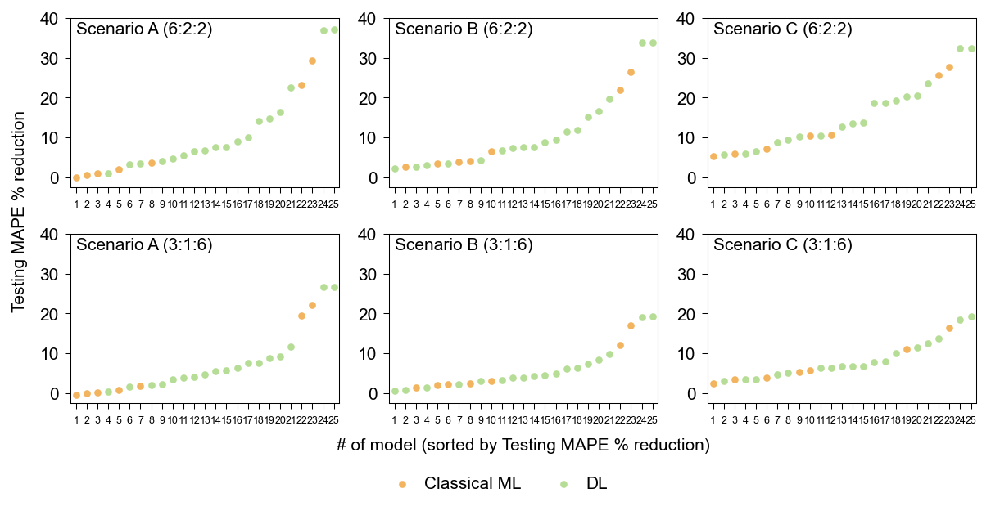

In [10]:
plt.figure(figsize=(8.5,4.5), dpi=150)
ax = plt.subplot(231)
plot_improv_hist(trainer_rd_622, ax)
ax.set_xlabel(None)
ax.set_ylabel(None)
ax.text(0.02, 0.98, "Scenario A (6:2:2)", transform=ax.transAxes, ha="left", va="top", fontsize=plt.rcParams["font.size"])
handles, labels = ax.get_legend().legendHandles, [x.get_text() for x in ax.get_legend().texts]
ax.get_legend().remove()
# ax.set_ylim([0, 5])
ax.set_ylim([-2.5, 40])
ax.set_yticks([0, 10, 20,30,40])
ax.set_yticklabels([0, 10, 20,30,40])

ax = plt.subplot(234)
plot_improv_hist(trainer_rd_316, ax)
ax.set_xlabel(None)
ax.set_ylabel(None)
ax.text(0.02, 0.98, "Scenario A (3:1:6)", transform=ax.transAxes, ha="left", va="top", fontsize=plt.rcParams["font.size"])
handles, labels = ax.get_legend().legendHandles, [x.get_text() for x in ax.get_legend().texts]
ax.get_legend().remove()
# ax.set_ylim([0, 6])
ax.set_ylim([-2.5, 40])
ax.set_yticks([0, 10, 20,30,40])
ax.set_yticklabels([0, 10, 20,30,40])

ax = plt.subplot(232)
plot_improv_hist(trainer_sc_622, ax)
ax.set_xlabel(None)
ax.set_ylabel(None)
ax.text(0.02, 0.98, "Scenario B (6:2:2)", transform=ax.transAxes, ha="left", va="top", fontsize=plt.rcParams["font.size"])
ax.get_legend().remove()
# ax.set_ylim([0, 8])
ax.set_ylim([-2.5, 40])
ax.set_yticks([0, 10, 20,30,40])
ax.set_yticklabels([0, 10, 20,30,40])

ax = plt.subplot(235)
plot_improv_hist(trainer_sc_316, ax)
ax.set_xlabel(None)
ax.set_ylabel(None)
ax.text(0.02, 0.98, "Scenario B (3:1:6)", transform=ax.transAxes, ha="left", va="top", fontsize=plt.rcParams["font.size"])
ax.get_legend().remove()
# ax.set_ylim([0, 12])
ax.set_ylim([-2.5, 40])
ax.set_yticks([0, 10, 20,30,40])
ax.set_yticklabels([0, 10, 20,30,40])

ax = plt.subplot(233)
plot_improv_hist(trainer_et_622, ax)
ax.set_xlabel(None)
ax.set_ylabel(None)
ax.text(0.02, 0.98, "Scenario C (6:2:2)", transform=ax.transAxes, ha="left", va="top", fontsize=plt.rcParams["font.size"])
ax.get_legend().remove()
# ax.set_ylim([0, 6])
ax.set_ylim([-2.5, 40])
ax.set_yticks([0, 10, 20,30,40])
ax.set_yticklabels([0, 10, 20,30,40])

ax = plt.subplot(236)
plot_improv_hist(trainer_et_316, ax)
ax.set_xlabel(None)
ax.set_ylabel(None)
ax.text(0.02, 0.98, "Scenario C (3:1:6)", transform=ax.transAxes, ha="left", va="top", fontsize=plt.rcParams["font.size"])
ax.get_legend().remove()
# ax.set_ylim([0, 8])
ax.set_ylim([-2.5, 40])
ax.set_yticks([0, 10, 20,30,40])
ax.set_yticklabels([0, 10, 20,30,40])

ax = plt.subplot(111)
ax.set_frame_on(False)
ax.tick_params(
    labelcolor="none",
    which="both",
    top=False,
    bottom=False,
    left=False,
    right=False,
)
ax.set_ylabel("Testing MAPE % reduction")
ax.set_xlabel("# of model (sorted by Testing MAPE % reduction)")
ax.legend(handles, labels, title=False, bbox_to_anchor=(0.61, -0.15), ncols=2, frameon=False, handlelength=1)
plt.savefig(os.path.join(trainer.project_root, "compare_dl_hist_6.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

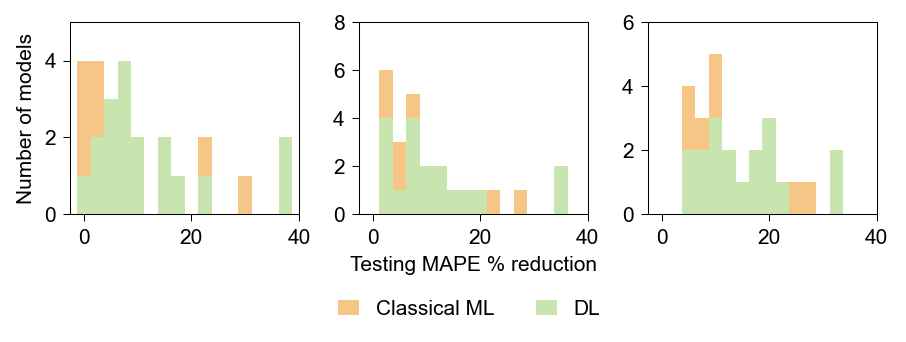

In [12]:
plt.figure(figsize=(6.5,2.7), dpi=150)
ax = plt.subplot(131)
plot_improv_hist(trainer_rd_622, ax)
ax.set_xlabel(None)
ax.set_ylabel(None)
# ax.text(0.99, 0.98, "Scenario A", transform=ax.transAxes, ha="right", va="top", fontsize=plt.rcParams["font.size"])
handles, labels = ax.get_legend().legendHandles, [x.get_text() for x in ax.get_legend().texts]
ax.get_legend().remove()
ax.set_ylim([0, 5])
ax.set_xlim([-2.5, 40])
ax.set_ylabel("Number of models")

ax = plt.subplot(132)
plot_improv_hist(trainer_sc_622, ax)
ax.set_xlabel(None)
ax.set_ylabel(None)
# ax.text(0.99, 0.98, "Scenario B", transform=ax.transAxes, ha="right", va="top", fontsize=plt.rcParams["font.size"])
ax.get_legend().remove()
ax.set_ylim([0, 8])
ax.set_xlim([-2.5, 40])

ax = plt.subplot(133)
plot_improv_hist(trainer_et_622, ax)
ax.set_xlabel(None)
ax.set_ylabel(None)
# ax.text(0.99, 0.98, "Scenario C", transform=ax.transAxes, ha="right", va="top", fontsize=plt.rcParams["font.size"])
ax.get_legend().remove()
ax.set_ylim([0, 6])
ax.set_xlim([-2.5, 40])

ax = plt.subplot(111)
ax.set_frame_on(False)
ax.tick_params(
    labelcolor="none",
    which="both",
    top=False,
    bottom=False,
    left=False,
    right=False,
)
ax.set_xlabel("Testing MAPE % reduction")

ax.legend(handles, labels, title=False, bbox_to_anchor=(0.68, -0.35), ncols=2, frameon=False, handlelength=1)
plt.savefig(os.path.join(trainer.project_root, "compare_dl_hist_3.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

In [ ]:
is_dl = lambda x: False if any([i in x for i in ["CatBoost", "LightGBM", "XGBoost", "Extremely Randomized Trees", "Random Forest", "K-Nearest Neighbors", "Linear Regression"]]) else True

import seaborn as sns
def plot_improv_strip(trainer, ax, metric="Testing MAPE", percent=True):
    # leaderboard = pd.read_csv(os.path.join(trainer.project_root, "leaderboard_approx_mean_supp.csv"))
    # print(leaderboard)
    leaderboard = trainer.leaderboard.copy()
    leaderboard.sort_values(by="Testing MAPE", inplace=True)
    leaderboard = leaderboard.drop(
                leaderboard[leaderboard["Model"].str.contains("PHYSICS")].index
            ).reset_index(drop=True)
    physics_names = [x for x in trainer.leaderboard["Model"] if "PHYSICS" in x]
    improved_measure = trainer.get_modelbase("ThisWork").improvement(
        leaderboard,
        # cv_path=os.path.join(trainer.project_root, "cv_supp"),
        exclude=physics_names,
    )
    # print(improved_measure[["Program", "Model", f"{metric} % Improvement"]])
    improv = improved_measure[["Model", f"{metric} {'% ' if percent else ''}Improvement"]].copy()
    improv["Use latent representation"] = ["Y" if "_Wrap" in i else "N" for i in improv["Model"]]
    improv["Is deep learning"] = ["ENSEMBLE embedded with DL models" if is_dl(i) else "ENSEMBLE embedded with classical ML models" for i in improv["Model"]]
    sns.swarmplot(improv, y=f"{metric} {'% ' if percent else ''}Improvement", hue="Is deep learning", ax=ax, hue_order=["ENSEMBLE embedded with classical ML models", "ENSEMBLE embedded with DL models"], palette=[lighten_color(x, 0.7) for x in [tabensemb.utils.global_palette[7], tabensemb.utils.global_palette[11]]], zorder=10)
    sns.violinplot(improv, y=f"{metric} {'% ' if percent else ''}Improvement", ax=ax, color=[0.95, 0.95, 0.95], legend="full", zorder=0, inner=None, linewidth=0, label="KDE distribution")
    # sns.histplot(improv, x="Testing MAPE % Improvement", hue="Is deep learning", ax=ax, bins=np.linspace(-3.75, 41.25, 19), hue_order=["Classical ML", "DL"], common_bins=True, multiple="stack", palette=tabensemb.utils.global_palette[:2], linewidth=0)

    handles, labels = ax.get_legend().legendHandles, [x.get_text() for x in ax.get_legend().texts]
    ax.get_legend().remove()
    ax.legend(handles=handles, labels=labels, title=False, loc="upper right", ncols=1, frameon=False, handlelength=1)
    set_linewidth(ax)
    ax.set_ylabel(f"{metric if 'R2' not in metric else metric.replace('R2', r'$R^2$')} {'% ' if percent else ''}{'reduction' if 'R2' not in metric else 'increase'}")

/home/xlluo/anaconda3/envs/tabular_ensemble/lib/python3.10/site-packages/seaborn/utils.py:84: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fig.canvas.draw()
/home/xlluo/anaconda3/envs/tabular_ensemble/lib/python3.10/site-packages/seaborn/utils.py:84: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fig.canvas.draw()
/home/xlluo/anaconda3/envs/tabular_ensemble/lib/python3.10/site-packages/seaborn/utils.py:84: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fig.canvas.draw()
/tmp/ipykernel_1009/2824369262.py:75: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.savefig(os.path.join(trainer.project_root, "compare_dl_strip_mape.pdf"), dpi=500, bbox_inches="tight")
/tmp/ipykernel_

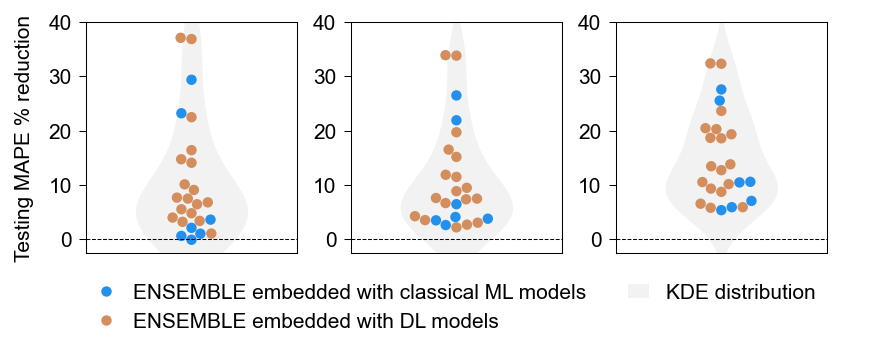

In [16]:
fig = plt.figure(figsize=(6.5,2.), dpi=150)

from matplotlib.gridspec import GridSpec

gs = GridSpec(100, 100, figure=fig)
ax = fig.add_subplot(gs[:, 0:28])

plot_improv_strip(trainer_rd_622, ax, metric="Testing MAPE")
ax.set_xlabel(None)
ax.set_ylabel(None)
# ax.text(0.99, 0.98, "Scenario A", transform=ax.transAxes, ha="right", va="top", fontsize=plt.rcParams["font.size"])
handles, labels = ax.get_legend().legendHandles, [x.get_text() for x in ax.get_legend().texts]
ax.get_legend().remove()
ax.set_xticks([])
ax.set_xticklabels([])
# ax.set_ylim([0, 5])
ax.set_ylim([-2.5, 40])
# ax.spines["right"].set_linewidth(0.25)
ax.set_xlim([-0.75, 0.75])
xlim = ax.get_xlim()
ax.plot(xlim, [0, 0], linewidth=0.5, color="k", ls="--", zorder=10)
ax.set_xlim(xlim)
# ax.set_ylabel("Number of models")

ax = fig.add_subplot(gs[:, 35:63])
plot_improv_strip(trainer_sc_622, ax, metric="Testing MAPE")
# ax.set_xlabel(None)
ax.set_xticks([])
ax.set_xticklabels([])
ax.set_ylabel(None)
# ax.text(0.99, 0.98, "Scenario B", transform=ax.transAxes, ha="right", va="top", fontsize=plt.rcParams["font.size"])
ax.get_legend().remove()
# ax.set_ylim([0, 8])
ax.set_ylim([-2.5, 40])
# ax.set_yticks([])
# ax.set_yticklabels([])
# ax.spines["left"].set_linewidth(0.25)
# ax.spines["right"].set_linewidth(0.25)
ax.set_xlim([-0.75, 0.75])
xlim = ax.get_xlim()
ax.plot(xlim, [0, 0], linewidth=0.5, color="k", ls="--", zorder=10)
ax.set_xlim(xlim)

ax = fig.add_subplot(gs[:, 70:98])
plot_improv_strip(trainer_et_622, ax, metric="Testing MAPE")
# ax.set_xlabel(None)
ax.set_xticks([])
ax.set_xticklabels([])
ax.set_ylabel(None)
# ax.text(0.99, 0.98, "Scenario C", transform=ax.transAxes, ha="right", va="top", fontsize=plt.rcParams["font.size"])
ax.get_legend().remove()
# ax.set_ylim([0, 6])
ax.set_ylim([-2.5, 40])
# ax.set_yticks([])
# ax.set_yticklabels([])
# ax.spines["left"].set_linewidth(0.25)
ax.set_xlim([-0.75, 0.75])
xlim = ax.get_xlim()
ax.plot(xlim, [0, 0], linewidth=0.5, color="k", ls="--", zorder=10)
ax.set_xlim(xlim)

ax = plt.subplot(111)
ax.set_frame_on(False)
ax.tick_params(
    labelcolor="none",
    which="both",
    top=False,
    bottom=False,
    left=False,
    right=False,
)
ax.set_ylabel("Testing MAPE % reduction")

ax.legend(handles, labels, title=False, bbox_to_anchor=(0.99, -0.05), ncols=2, frameon=False, handlelength=1)
plt.savefig(os.path.join(trainer.project_root, "compare_dl_strip_mape.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

/home/xlluo/anaconda3/envs/tabular_ensemble/lib/python3.10/site-packages/seaborn/utils.py:84: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fig.canvas.draw()
/home/xlluo/anaconda3/envs/tabular_ensemble/lib/python3.10/site-packages/seaborn/utils.py:84: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fig.canvas.draw()
/home/xlluo/anaconda3/envs/tabular_ensemble/lib/python3.10/site-packages/seaborn/utils.py:84: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fig.canvas.draw()
/tmp/ipykernel_1009/2627670351.py:76: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.savefig(os.path.join(trainer.project_root, "compare_dl_strip_r2.pdf"), dpi=500, bbox_inches="tight")
/tmp/ipykernel_10

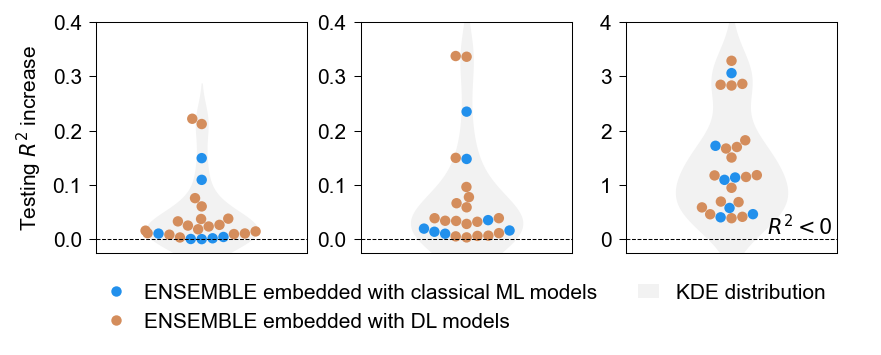

In [15]:
fig = plt.figure(figsize=(6.5,2.), dpi=150)

from matplotlib.gridspec import GridSpec

gs = GridSpec(100, 100, figure=fig)
ax = fig.add_subplot(gs[:, 0:28])

plot_improv_strip(trainer_rd_622, ax, metric="Testing R2", percent=False)
ax.set_xlabel(None)
ax.set_ylabel(None)
# ax.text(0.99, 0.98, "Scenario A", transform=ax.transAxes, ha="right", va="top", fontsize=plt.rcParams["font.size"])
handles, labels = ax.get_legend().legendHandles, [x.get_text() for x in ax.get_legend().texts]
ax.get_legend().remove()
ax.set_xticks([])
ax.set_xticklabels([])
# ax.set_ylim([0, 5])
ax.set_ylim([-2.5/100, 40/100])
# ax.spines["right"].set_linewidth(0.25)
ax.set_xlim([-0.75, 0.75])
xlim = ax.get_xlim()
ax.plot(xlim, [0, 0], linewidth=0.5, color="k", ls="--", zorder=10)
ax.set_xlim(xlim)
# ax.set_ylabel("Number of models")

ax = fig.add_subplot(gs[:, 35:63])
plot_improv_strip(trainer_sc_622, ax, metric="Testing R2", percent=False)
# ax.set_xlabel(None)
ax.set_xticks([])
ax.set_xticklabels([])
ax.set_ylabel(None)
# ax.text(0.99, 0.98, "Scenario B", transform=ax.transAxes, ha="right", va="top", fontsize=plt.rcParams["font.size"])
ax.get_legend().remove()
# ax.set_ylim([0, 8])
ax.set_ylim([-2.5/100, 40/100])
# ax.set_yticks([])
# ax.set_yticklabels([])
# ax.spines["left"].set_linewidth(0.25)
# ax.spines["right"].set_linewidth(0.25)
ax.set_xlim([-0.75, 0.75])
xlim = ax.get_xlim()
ax.plot(xlim, [0, 0], linewidth=0.5, color="k", ls="--", zorder=10)
ax.set_xlim(xlim)

ax = fig.add_subplot(gs[:, 70:98])
plot_improv_strip(trainer_et_622, ax, metric="Testing R2", percent=False)
# ax.set_xlabel(None)
ax.set_xticks([])
ax.set_xticklabels([])
ax.set_ylabel(None)
# ax.text(0.99, 0.98, "Scenario C", transform=ax.transAxes, ha="right", va="top", fontsize=plt.rcParams["font.size"])
ax.get_legend().remove()
# ax.set_ylim([0, 6])
ax.set_ylim([-2.5/10, 40/10])
# ax.set_yticks([])
# ax.set_yticklabels([])
# ax.spines["left"].set_linewidth(0.25)
ax.set_xlim([-0.75, 0.75])
xlim = ax.get_xlim()
ax.plot(xlim, [0, 0], linewidth=0.5, color="k", ls="--", zorder=10)
ax.set_xlim(xlim)
ax.text(0.98,0.17, r"$R^2<0$", transform=ax.transAxes, ha="right", va="top")

ax = plt.subplot(111)
ax.set_frame_on(False)
ax.tick_params(
    labelcolor="none",
    which="both",
    top=False,
    bottom=False,
    left=False,
    right=False,
)
ax.set_ylabel(r"Testing $R^2$ increase")

ax.legend(handles, labels, title=False, bbox_to_anchor=(0.99, -0.05), ncols=2, frameon=False, handlelength=1)
plt.savefig(os.path.join(trainer.project_root, "compare_dl_strip_r2.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

## Truth against prediction

In [6]:
trainer_et_622.leaderboard.sort_values(by="Testing MAPE")

,Program,Model,Training RMSE,Training MSE,Training MAE,Training MAPE,Training R2,Training MEDIAN_ABSOLUTE_ERROR,Training EXPLAINED_VARIANCE_SCORE,Testing RMSE,...,Testing R2,Testing MEDIAN_ABSOLUTE_ERROR,Testing EXPLAINED_VARIANCE_SCORE,Validation RMSE,Validation MSE,Validation MAE,Validation MAPE,Validation R2,Validation MEDIAN_ABSOLUTE_ERROR,Validation EXPLAINED_VARIANCE_SCORE
0,ThisWork,WideDeep_TabMlp_Wrap_NoPCA_3L_KMeans,0.369947,0.136861,0.253775,0.081295,0.883119,0.173458,0.883121,1.088625,...,-2.283237,0.750071,-0.297813,0.495618,0.245637,0.346019,0.109172,0.792495,0.247005,0.792509
1,ThisWork,WideDeep_TabResnet_Wrap_NoPCA_3L_KMeans,0.336906,0.113506,0.224365,0.072982,0.903064,0.148537,0.903078,1.117422,...,-2.459234,0.753992,-0.338235,0.479321,0.229749,0.328575,0.104518,0.805917,0.230249,0.805998
2,ThisWork,AutoGluon_Neural Network with PyTorch_NoWrap_N...,0.336349,0.113131,0.213003,0.070589,0.903385,0.130403,0.903408,1.123950,...,-2.499773,0.793734,-0.128680,0.469784,0.220697,0.321393,0.102701,0.813564,0.221293,0.813665
3,ThisWork,WideDeep_FTTransformer_Wrap_NoPCA_3L_KMeans,0.309950,0.096069,0.207507,0.066472,0.917956,0.139836,0.917964,1.132788,...,-2.555025,0.799503,-0.191150,0.469640,0.220561,0.325070,0.102738,0.813678,0.228294,0.813678
4,ThisWork,PytorchTabular_Category Embedding_Wrap_NoPCA_3...,0.346873,0.120321,0.238449,0.076178,0.897244,0.165226,0.897246,1.137711,...,-2.585995,0.799294,-0.243574,0.483697,0.233963,0.334613,0.107235,0.802357,0.234687,0.802400
15,ThisWork,PHYSICS_NoPCA_3L_KMeans,0.501432,0.251434,0.351401,0.111613,0.785271,0.242895,0.785356,1.196819,...,-2.968285,0.752330,-1.154834,0.613714,0.376645,0.427862,0.134504,0.681825,0.305903,0.681838
5,ThisWork,AutoGluon_Linear Regression_NoWrap_NoPCA_3L_KM...,0.468556,0.219545,0.322116,0.106093,0.812505,0.215257,0.812540,1.146121,...,-2.639207,0.820767,-0.454406,0.565896,0.320238,0.398963,0.129318,0.729475,0.282960,0.729500
9,WideDeep,TabResnet,0.360995,0.130317,0.249987,0.079421,0.888707,0.176328,0.888819,1.178630,...,-2.848577,0.809896,-0.353957,0.505924,0.255959,0.349124,0.110121,0.783776,0.245694,0.783878
8,ThisWork,WideDeep_TabFastFormer_Wrap_NoPCA_3L_KMeans,0.335507,0.112565,0.229202,0.073209,0.903868,0.157233,0.903974,1.177325,...,-2.840064,0.820366,-0.377223,0.475841,0.226425,0.330281,0.104853,0.808725,0.233696,0.808742
6,ThisWork,PytorchTabular_AutoInt_Wrap_NoPCA_3L_KMeans,0.416665,0.173609,0.285840,0.092232,0.851735,0.192399,0.851747,1.172582,...,-2.809188,0.836965,-0.435674,0.517811,0.268128,0.367496,0.116454,0.773495,0.265540,0.773518


In [6]:
pred = trainer_et_622.get_modelbase("ThisWork").predict(df=trainer_et_622.datamodule.X_test, derived_data=trainer_et_622.datamodule.D_test, model_name="WideDeep_TabMlp_Wrap_NoPCA_3L_KMeans")
len(pred[pred<np.percentile(trainer_et_622.df[trainer.label_name], 80)]),len(pred[pred>=np.percentile(trainer_et_622.df[trainer.label_name], 80)])

(901, 453)

In [7]:
pred = trainer_et_622.get_modelbase("WideDeep").predict(df=trainer_et_622.datamodule.X_test, derived_data=trainer_et_622.datamodule.D_test, model_name="TabResnet")
len(pred[pred<np.percentile(trainer_et_622.df[trainer.label_name], 80)]),len(pred[pred>=np.percentile(trainer_et_622.df[trainer.label_name], 80)])

(1024, 330)

The following results come from the last cv loop, so they are different from the leaderboard shown above.

In [14]:
pred_1 = trainer_et_622.get_modelbase("ThisWork").predict(df=trainer_et_622.datamodule.X_test, derived_data=trainer_et_622.datamodule.D_test, model_name="WideDeep_TabMlp_Wrap_NoPCA_3L_KMeans")
pred_2 = trainer_et_622.get_modelbase("ThisWork").predict(df=trainer_et_622.datamodule.X_test, derived_data=trainer_et_622.datamodule.D_test, model_name="PHYSICS_NoPCA_3L_KMeans")
pred_3 = trainer_et_622.get_modelbase("WideDeep").predict(df=trainer_et_622.datamodule.X_test, derived_data=trainer_et_622.datamodule.D_test, model_name="TabMlp")
pred_4 = trainer_et_622.get_modelbase("AutoGluon").predict(df=trainer_et_622.datamodule.X_test, derived_data=trainer_et_622.datamodule.D_test, model_name="CatBoost")
truth = trainer_et_622.datamodule.y_test
from tabensemb.utils import auto_metric_sklearn
from scipy.stats import pearsonr

mape_results = {name: auto_metric_sklearn(truth, pred, metric="mape", task="regression") for name, pred in zip(["AG-CatBoost", "WD-TabMlp", "Empiricism", "ENSEMBLE"], [pred_4, pred_3, pred_2, pred_1])}
rmse_results = {name: auto_metric_sklearn(truth, pred, metric="rmse", task="regression") for name, pred in zip(["AG-CatBoost", "WD-TabMlp", "Empiricism", "ENSEMBLE"], [pred_4, pred_3, pred_2, pred_1])}
pearsonr_results = {name: pearsonr(truth.flatten(), pred.flatten()) for name, pred in zip(["AG-CatBoost", "WD-TabMlp", "Empiricism", "ENSEMBLE"], [pred_4, pred_3, pred_2, pred_1])}

In [9]:
mape_results, rmse_results, pearsonr_results

({'AG-CatBoost': 0.16355828763806854,
  'WD-TabMlp': 0.14264617954891282,
  'Empiricism': 0.1343126250080565,
  'ENSEMBLE': 0.13129221246847814},
 {'AG-CatBoost': 1.2583884977267172,
  'WD-TabMlp': 1.1610210944144224,
  'Empiricism': 1.1165399014200015,
  'ENSEMBLE': 1.082325151649156},
 {'AG-CatBoost': PearsonRResult(statistic=0.20473746285525732, pvalue=2.795864751572348e-14),
  'WD-TabMlp': PearsonRResult(statistic=0.4081442027590826, pvalue=1.688032861073668e-55),
  'Empiricism': PearsonRResult(statistic=0.4569981882265127, pvalue=7.928783131416782e-71),
  'ENSEMBLE': PearsonRResult(statistic=0.4136834745885216, pvalue=4.1073449522226577e-57)})

In [171]:
np.percentile(trainer.df[trainer.label_name], 80)

5.725781434565372

In [24]:
def plot_truth_pred(trainer, program, model_name, ax, max_pos=9.2):
    from matplotlib.colors import LinearSegmentedColormap
    from tabensemb.utils import auto_metric_sklearn
    from scipy.stats import pearsonr
    
    cm_kw = LinearSegmentedColormap.from_list("kde", [[0.8, 0.8, 0.8],[0.5, 0.5, 0.5]])
    cm = LinearSegmentedColormap.from_list("kde", [[193/255, 222/255, 247/255],[7/255, 71/255, 140/255]])

    kwargs = dict(program=program, model_name=model_name, log_trans=False, save_show_close=False, kde_color=True, ax=ax, central_line=False)
    trainer.plot_truth_pred(scatter_kwargs=dict(alpha=0.7, s=7, linewidth=0, cmap=cm, rasterized=True), select_by_value_kwargs=dict(partition="all"), **kwargs)
    trainer.plot_truth_pred(scatter_kwargs=dict(alpha=0.7, s=7, linewidth=0, cmap=cm_kw, rasterized=True), train_val_test="Training", **kwargs)
    trainer.plot_truth_pred(scatter_kwargs=dict(alpha=0.7, s=7, linewidth=0, cmap=cm_kw, rasterized=True), train_val_test="Validation", **kwargs)
    # trainer.plot_truth_pred(scatter_kwargs=dict(alpha=0.7, s=10, linewidth=0, cmap=cm), train_val_test="Testing", **kwargs)
    ax.get_legend().remove()
    ax.set_xlim([4, 10])
    ax.set_ylim([4, 10])
    ax.set_xticks([4,6,8,10])
    ax.set_yticks([4,6,8,10])
    thres = np.percentile(trainer.df[trainer.label_name], 80)
    ax.plot([thres, 10], [thres, thres], color=[0.7, 0.7, 0.7], lw=1)
    ax.plot([thres, max_pos], [thres, max_pos], color=[0.7, 0.7, 0.7], linestyle="--", lw=1)
    ax.fill_betweenx([0, 10], [thres, thres], [0, 0], color=[0.97, 0.97, 0.97], alpha=0.5, edgecolor=[0.5, 0.5, 0.5], linewidth=1)
    ax.text((4+thres)/2, 14/2, "Training range", rotation=90, ha="center", va="center", color=[0.05, 0.05, 0.05], fontsize=10, alpha=0.4, weight="bold", zorder=10)
    
    # x = trainer.datamodule.y_test.flatten()
    # y = trainer.get_modelbase(program).predict(trainer.datamodule.X_test, model_name=model_name).flatten()
    # k, b = np.polyfit(x, y, 1)
    # x_plot = np.array([thres, 9.2])
    # y_plot = k*x_plot+b
    # ax.plot(x_plot, y_plot)
    # y_fit_pred = k*x+b
    # pearsonr(y, y_fit_pred), auto_metric_sklearn(y, y_fit_pred, metric="r2", task="regression")
    
    ax.set_xlabel("Ground truth $\lg N_{\mathrm{true}}$")
    ax.set_ylabel("Prediction $\lg N_{\mathrm{pred}}$")
    set_linewidth(ax)


User MSE Loss: 0.3847, R2: 0.7904
Training MSE Loss: 0.0477, R2: 0.9599
Validation MSE Loss: 0.1968, R2: 0.8252


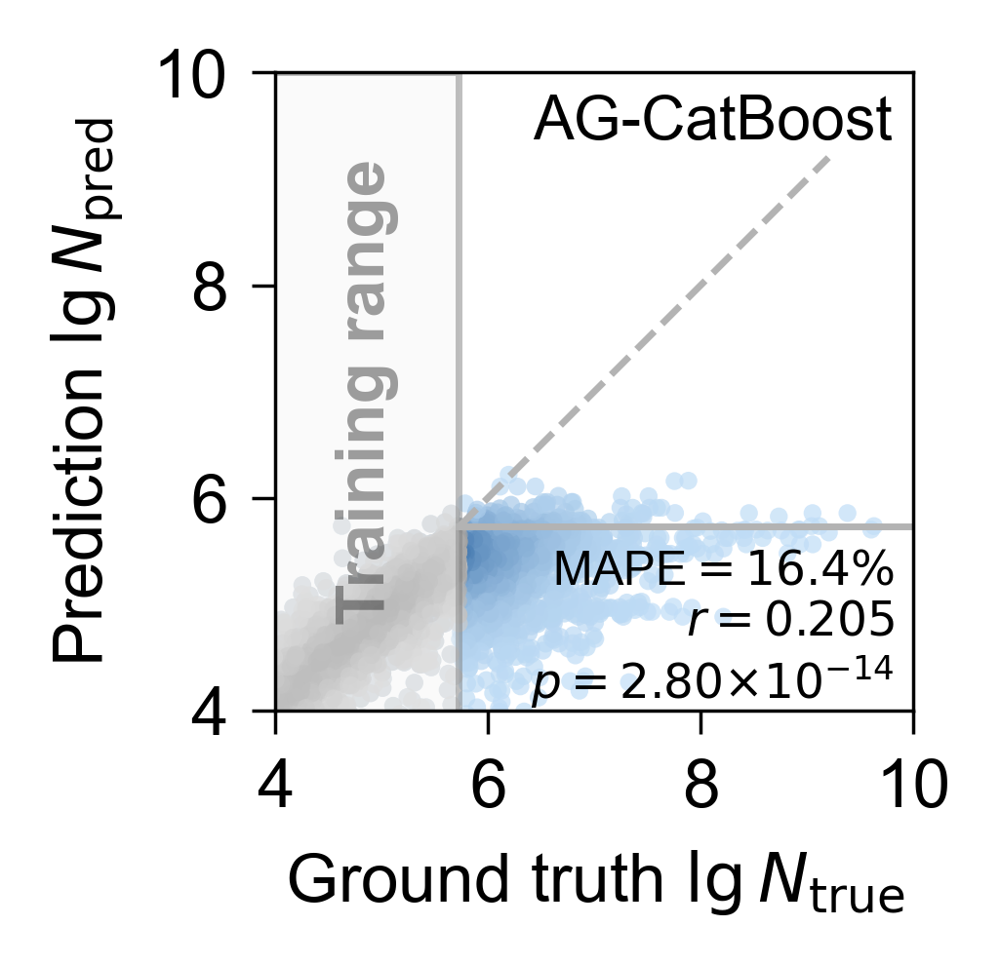

In [36]:
plt.figure(figsize=(2.15, 2.15), dpi=500)
ax = plt.subplot(111)
plot_truth_pred(trainer_et_622, program="AutoGluon", model_name="CatBoost", ax=ax)
t = ax.text(9.8, 9.8, "AG-CatBoost", ha="right", va="top", fontsize=plt.rcParams["font.size"]*0.9, )
# ax.text(0.97, 0.19, f"", transform=ax.transAxes, ha="right", va="bottom", fontsize=plt.rcParams["font.size"]*0.7)
ax.text(0.97, 0.0, f"MAPE$={mape_results['AG-CatBoost']*100:.1f}\%$\n$r={pearsonr_results['AG-CatBoost'].statistic:.3f}$\n$p=${to_scientific_notation(pearsonr_results['AG-CatBoost'].pvalue)}", transform=ax.transAxes, ha="right", va="bottom", fontsize=plt.rcParams["font.size"]*0.7)
plt.savefig(os.path.join(trainer.project_root, "truth_pred_catboost.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

User MSE Loss: 0.4085, R2: 0.7774
Training MSE Loss: 0.1459, R2: 0.8774
Validation MSE Loss: 0.2568, R2: 0.7719


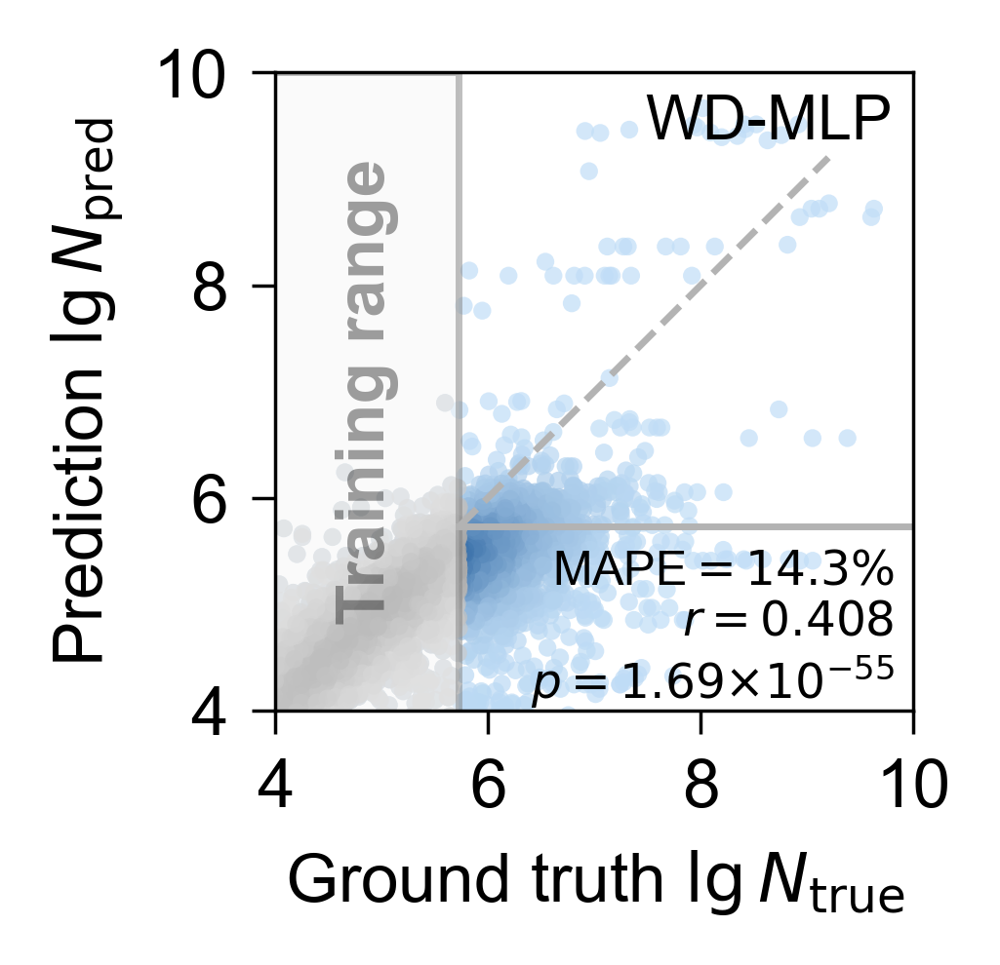

In [32]:
plt.figure(figsize=(2.15, 2.15), dpi=500)
ax = plt.subplot(111)
plot_truth_pred(trainer_et_622, program="WideDeep", model_name="TabMlp", ax=ax)
t = ax.text(9.8, 9.8, "WD-MLP", ha="right", va="top", fontsize=plt.rcParams["font.size"]*0.9, )
ax.text(0.97, 0.0, f"MAPE$={mape_results['WD-TabMlp']*100:.1f}\%$\n$r={pearsonr_results['WD-TabMlp'].statistic:.3f}$\n$p=${to_scientific_notation(pearsonr_results['WD-TabMlp'].pvalue)}", transform=ax.transAxes, ha="right", va="bottom", fontsize=plt.rcParams["font.size"]*0.7)
plt.savefig(os.path.join(trainer.project_root, "truth_pred_tabmlp.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

User MSE Loss: 0.4429, R2: 0.7587
Training MSE Loss: 0.2278, R2: 0.8085
Validation MSE Loss: 0.2848, R2: 0.7470


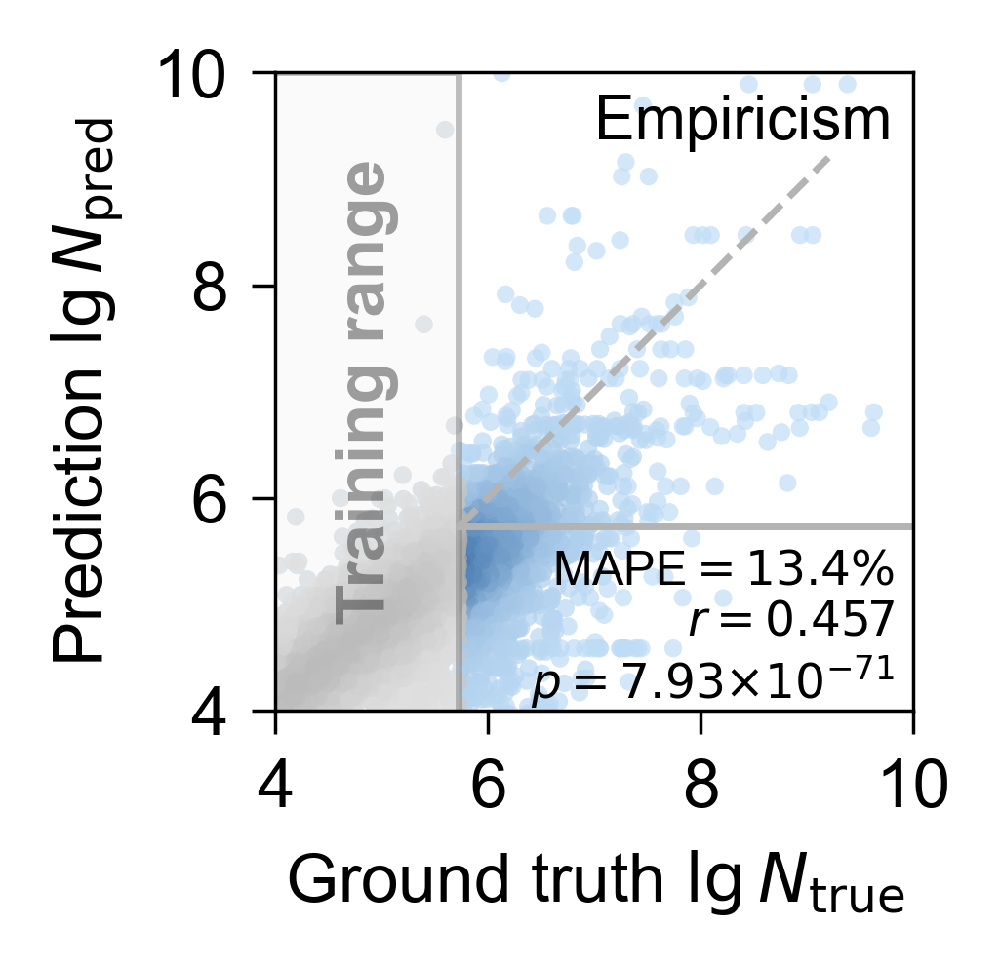

In [33]:
plt.figure(figsize=(2.15, 2.15), dpi=500)
ax = plt.subplot(111)
plot_truth_pred(trainer_et_622, program="ThisWork", model_name="PHYSICS_NoPCA_3L_KMeans", ax=ax)
t = ax.text(9.8, 9.8, "Empiricism", ha="right", va="top", fontsize=plt.rcParams["font.size"]*0.9, )
ax.text(0.97, 0.0, f"MAPE$={mape_results['Empiricism']*100:.1f}\%$\n$r={pearsonr_results['Empiricism'].statistic:.3f}$\n$p=${to_scientific_notation(pearsonr_results['Empiricism'].pvalue)}", transform=ax.transAxes, ha="right", va="bottom", fontsize=plt.rcParams["font.size"]*0.7)
plt.savefig(os.path.join(trainer.project_root, "truth_pred_empiricism.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

User MSE Loss: 0.3548, R2: 0.8067
Training MSE Loss: 0.1294, R2: 0.8913
Validation MSE Loss: 0.2148, R2: 0.8091


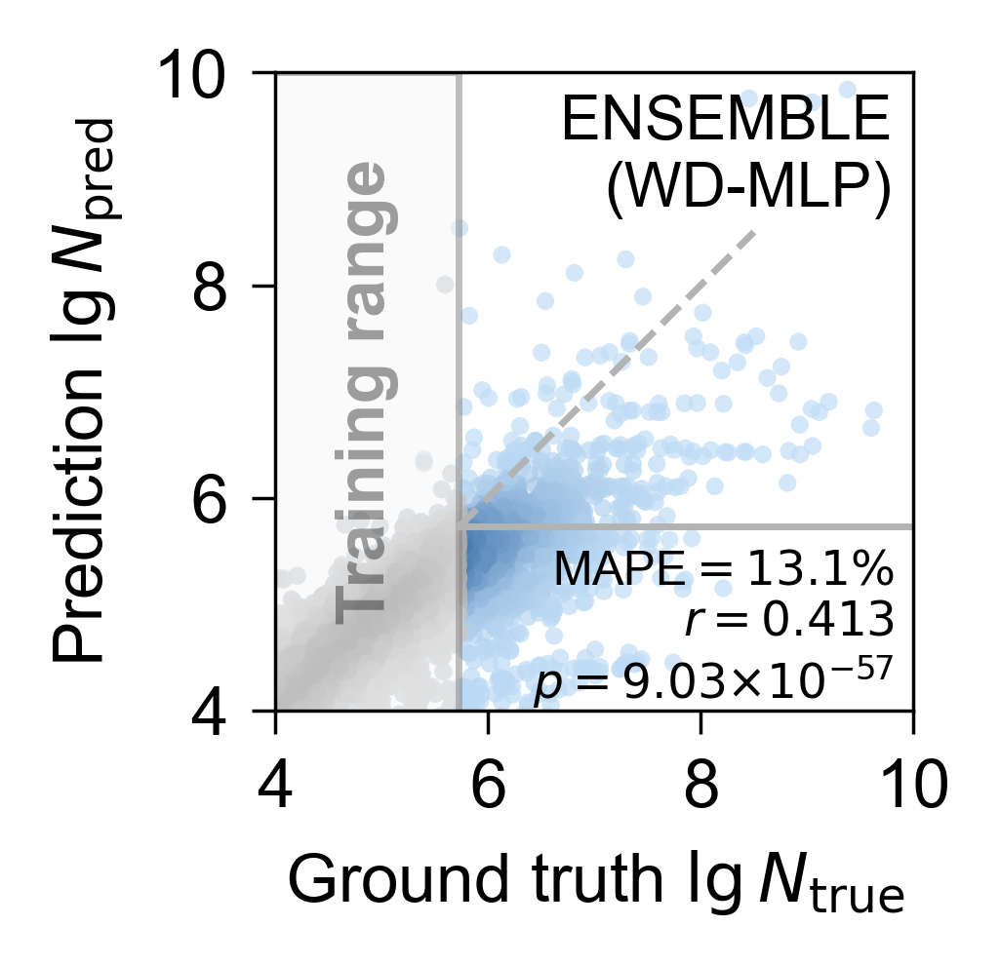

In [34]:
plt.figure(figsize=(2.15, 2.15), dpi=500)
ax = plt.subplot(111)
plot_truth_pred(trainer_et_622, program="ThisWork", model_name="WideDeep_TabMlp_Wrap_NoPCA_3L_KMeans", ax=ax, max_pos=8.5)
t = ax.text(9.8, 9.8, "ENSEMBLE\n(WD-MLP)", ha="right", va="top", fontsize=plt.rcParams["font.size"]*0.9, )
ax.text(0.97, 0.0, f"MAPE$={mape_results['ENSEMBLE']*100:.1f}\%$\n$r={pearsonr_results['ENSEMBLE'].statistic:.3f}$\n$p=${to_scientific_notation(pearsonr_results['ENSEMBLE'].pvalue)}", transform=ax.transAxes, ha="right", va="bottom", fontsize=plt.rcParams["font.size"]*0.7)
plt.savefig(os.path.join(trainer.project_root, "truth_pred_thiswork.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

## SN curves

GP[[0(400),90(400)WR],[(100CSM)]SB]5, R: -1.0, f: 3.0, train 28, val 8, test 4
Training points in: [562  44  44  44 562 562  44 562 562  44 562  44 562  44  44 562 562 562
  44 562 562 562 562  44  44 562 562 562]
Validation points in: [562  44 562  44 562 562  44 562]
Testing points in: [562 562 562 562]
Train: 28, val: 8, test: 4


<frozen importlib._bootstrap>:241: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 216 from C header, got 232 from PyObject


Train: 28, val: 8, test: 4
Train: 28, val: 8, test: 4
Train: 28, val: 8, test: 4
(-16.195440000000012, 308.06784)
[0, 280]
[0, 280]
(0.0, 280.0)
N training points already plotted: 28


/tmp/ipykernel_3692/477231303.py:122: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.savefig(os.path.join(trainer.project_root, f"{m_code.replace('/', '_')}_{abundant_r}_{abundant_f}.pdf"), dpi=500, bbox_inches="tight")
/tmp/ipykernel_3692/477231303.py:122: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.savefig(os.path.join(trainer.project_root, f"{m_code.replace('/', '_')}_{abundant_r}_{abundant_f}.pdf"), dpi=500, bbox_inches="tight")
/home/xlluo/anaconda3/envs/tabular_ensemble/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fig.canvas.print_figure(bytes_io, **kw)


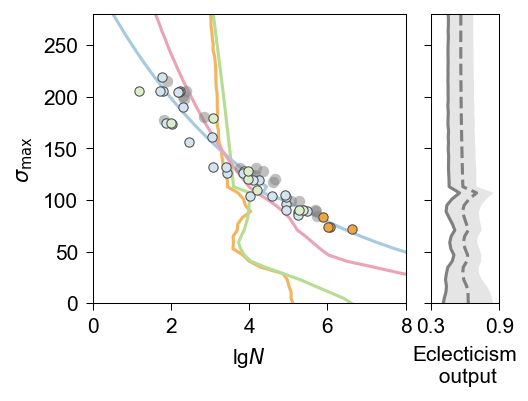

GE[+30(),-30()FW], R: 0.0, f: 10.0, train 18, val 5, test 10
Training points in: [476 476 476 476 476 476 476 476 476 476 476 476 476 476 476 476 476 476]
Validation points in: [476 476 476 476 476]
Testing points in: [476 476 476 476 476 476 476 476 476 476]
Train: 18, val: 5, test: 10
Train: 18, val: 5, test: 10
Train: 18, val: 5, test: 10
Train: 18, val: 5, test: 10
(-16.93999999999999, 286.44)
[0, 250]
[0, 250]
(0.0, 250.0)
N training points already plotted: 18


/tmp/ipykernel_3692/477231303.py:122: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.savefig(os.path.join(trainer.project_root, f"{m_code.replace('/', '_')}_{abundant_r}_{abundant_f}.pdf"), dpi=500, bbox_inches="tight")
/tmp/ipykernel_3692/477231303.py:122: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.savefig(os.path.join(trainer.project_root, f"{m_code.replace('/', '_')}_{abundant_r}_{abundant_f}.pdf"), dpi=500, bbox_inches="tight")
/home/xlluo/anaconda3/envs/tabular_ensemble/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fig.canvas.print_figure(bytes_io, **kw)


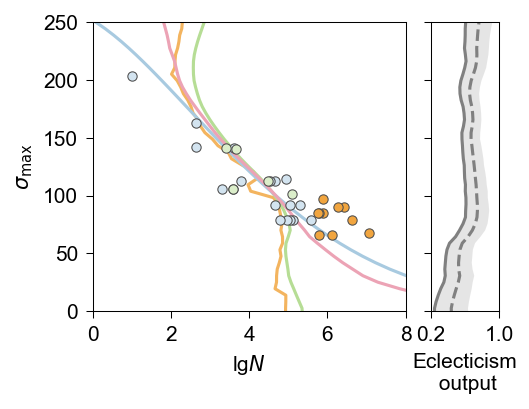

UNI-D155-EP3[0], R: 0.1, f: 4.0, train 7, val 3, test 6
Training points in: [ 546  546  546  546 1687 1687 1687]
Validation points in: [546 546 546]
Testing points in: [ 546  546  546 1687 1687 1687]
Train: 7, val: 3, test: 6
Train: 7, val: 3, test: 6
Train: 7, val: 3, test: 6
Train: 7, val: 3, test: 6
(1.1999999999999886, 1800.8)
[400, 1350]
[400, 1350]
(400.0, 1350.0)
N training points already plotted: 7


/tmp/ipykernel_3692/477231303.py:122: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.savefig(os.path.join(trainer.project_root, f"{m_code.replace('/', '_')}_{abundant_r}_{abundant_f}.pdf"), dpi=500, bbox_inches="tight")
/tmp/ipykernel_3692/477231303.py:122: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.savefig(os.path.join(trainer.project_root, f"{m_code.replace('/', '_')}_{abundant_r}_{abundant_f}.pdf"), dpi=500, bbox_inches="tight")
/home/xlluo/anaconda3/envs/tabular_ensemble/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fig.canvas.print_figure(bytes_io, **kw)


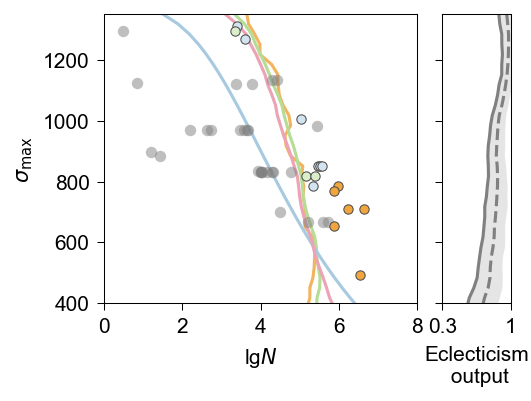

In [15]:
import seaborn as sns
from functools import reduce

program_model = [("AutoGluon", "CatBoost"), ("WideDeep", "TabMlp"), ("ThisWork", "PHYSICS_NoPCA_3L_KMeans"), ("ThisWork", "WideDeep_TabMlp_Wrap_NoPCA_3L_KMeans")]
used_trainer = trainer_et_622
cnt = 0
n_plots = 10

thiswork = used_trainer.get_modelbase(program="ThisWork")
x_cluster = thiswork.inspect_attr(
    model_name="PHYSICS_NoPCA_3L_KMeans", attributes=["x_cluster", "clustering"], df=used_trainer.df, derived_data=used_trainer.derived_data
)["USER_INPUT"]["x_cluster"]

mat_df = used_trainer.df
rf_comb = [f"{c}__{r}__{f}" for c, r, f in zip(mat_df["Material_Code"], mat_df["R-value"], mat_df["Frequency"])]
rf_comb_unique = np.unique(rf_comb, return_counts=True)

def plot_one_rf_comb_sn(rf_s, ylim=None, xlim=None):
    # rf_s = rf_comb_unique[0][list(rf_comb_unique[1]).index(max(rf_comb_unique[1]))]
    m_code, abundant_r, abundant_f = rf_s.split("__")
    abundant_r = float(abundant_r)
    abundant_f = float(abundant_f)
    train_indices = used_trainer.select_by_material_code(m_code, partition="train", select_by_value_kwargs=dict(selection={"R-value": abundant_r, "Frequency": abundant_f}))
    val_indices = used_trainer.select_by_material_code(m_code, partition="val", select_by_value_kwargs=dict(selection={"R-value": abundant_r, "Frequency": abundant_f}))
    test_indices = used_trainer.select_by_material_code(m_code, partition="test", select_by_value_kwargs=dict(selection={"R-value": abundant_r, "Frequency": abundant_f}))
    print(f"{m_code}, R: {abundant_r}, f: {abundant_f}, train {len(train_indices)}, val {len(val_indices)}, test {len(test_indices)}")
    if len(train_indices) + len(val_indices) >= len(test_indices) >= 1:
        print(f"Training points in: {x_cluster[train_indices]}")
        print(f"Validation points in: {x_cluster[val_indices]}")
        print(f"Testing points in: {x_cluster[test_indices]}")

        unique_clusters = np.unique(x_cluster[train_indices])
        points_in_clusters = reduce(lambda x, y: list(x)+list(y), [np.where(x_cluster==i)[0] for i in unique_clusters])
        training_points_in_clusters = np.setdiff1d(np.intersect1d(used_trainer.train_indices, points_in_clusters), train_indices)

        from matplotlib.gridspec import GridSpec
        fig = plt.figure(dpi=150, figsize=(3.5, 2.5))
        gs = GridSpec(100, 100, figure=fig)
        ax = fig.add_subplot(gs[:, 0:77])
        for idx, (program, model_name) in enumerate(program_model):
            _, inspects = used_trainer.plot_S_N(
                    m_code=m_code,
                    s_col="Maximum Stress",
                    n_col="log10(Cycles to Failure)",
                    n_bootstrap=1,
                    program=program,
                    model_name=model_name,
                    refit=False,
                    resample=False,
                    log_stress=False,
                    save_show_close=False,
                    grid_size=50,
                    select_by_value_kwargs=dict(selection={"Frequency": abundant_f, "R-value": abundant_r}),
                    ax=ax,
                    plot_kwargs=dict(color=tabensemb.utils.global_palette[idx], label=f"{program}-{model_name}", zorder=-1),
                    plot_pof_area=False,
                    plot_scatter=idx==0,
                    inspect_attr_kwargs=dict(attributes=["dl_weight", "std"] if idx==len(program_model)-1 else []),
                train_val_test_color=[list(lighten_color(x, 0.5 if k!=2 else 1.2))+[1 if k != 2 else 1] for k, x in enumerate(tabensemb.utils.global_palette[0:3][::-1])],
                scatter_kwargs=dict(zorder=20, linewidth=0.5, edgecolors=(0.3, 0.3, 0.3))
                )
        # ax.relim()
        # ax.autoscale()

        # if abundant_r<-1 or abundant_r>1:
        #     ax.set_ylim(top=min(ax.get_ylim()[1], 0))
        # else:
        #     ax.set_ylim(bottom=max(ax.get_ylim()[0], 0))
        ax.set_xlim(left=max(ax.get_xlim()[0], 0.5), right=min(ax.get_xlim()[1], 8))
        print(ax.get_ylim())
        print(ylim)
        if ylim is not None:
            print(ylim)
            ax.set_ylim(ylim)
        if xlim is not None:
            ax.set_xlim(xlim)
        print(ax.get_ylim())

        print(f"N training points already plotted: {len(np.intersect1d(np.intersect1d(used_trainer.train_indices, points_in_clusters), train_indices))}")
        ax.scatter(used_trainer.df.loc[training_points_in_clusters, "log10(Cycles to Failure)"], used_trainer.df.loc[training_points_in_clusters, "Maximum Stress"], s=30, color="grey", alpha=0.5, linewidth=0, label="Other points in the same clusters")

        legend_kwargs = dict(fontsize=7, loc="upper right", frameon=False, handlelength=1.)
        ax.legend(**legend_kwargs)
        replace_legend_labels(ax, mapping={"ThisWork-PHYSICS_NoPCA_3L_KMeans": "Empiricism", "ThisWork-WideDeep_TabMlp_Wrap_NoPCA_3L_KMeans": "ENSEMBLE(WideDeep-TabMlp)"}, legend_kwargs=dict(fontsize=5, loc="upper right"))
        replace_legend_labels(ax, mapping=model_name_mapping, legend_kwargs=legend_kwargs)
        replace_legend_labels(ax, mapping=modelbase_name_mapping, legend_kwargs=legend_kwargs)
        handles1, labels1 = ax.get_legend().legendHandles, [x.get_text() for x in ax.get_legend().texts]
        ax.get_legend().remove()

        ylim = ax.get_ylim()
        ax.set_xlabel("log10(Cycles to Failure)")
        ax.set_ylabel("Maximum Stress")
        replace_feature_names(ax)
        set_linewidth(ax)
        # ax.spines["right"].set_linewidth(0)
        # ax.spines["top"].set_linewidth(0)
        ax.set_title(None)
        ax = fig.add_subplot(gs[:, 83:])
        x_values = [x[0] for x in inspects[0]]
        dl_weights_mean = np.array([np.mean(x[1]["dl_weight"]) for x in inspects[0]])
        dl_uncertainty_std = np.array([np.mean(x[1]["std"]) for x in inspects[0]])
        # dl_weights_ci = [sns.utils.ci(sns.algorithms.bootstrap(x[1]["dl_weight"].flatten())) for x in inspects[0]]
        ax.plot(dl_weights_mean+dl_uncertainty_std, x_values, color="grey", linestyle="--", label="Probability")
        ax.fill_betweenx(x_values, dl_weights_mean, dl_weights_mean+2*dl_uncertainty_std, color="grey", alpha=0.2, edgecolor=None, label="Epistemic SD")
        # ax.fill_betweenx(x_values, [x[0] for x in dl_weights_ci], [x[1] for x in dl_weights_ci], color="grey", alpha=0.2, edgecolor=None)
        ax.plot(dl_weights_mean, x_values, color="grey", label="ML weight")
        ax.set_ylim(*ylim)
        xlim = [max([np.floor(ax.get_xlim()[0]*10)/10, 0]), min([np.ceil(ax.get_xlim()[1]*10)/10, 1])]
        ax.set_xlim(xlim)
        ax.set_xticks(xlim)
        ax.set_xticklabels(xlim)
        ax.set_yticklabels([])
        ax.set_xlabel("Eclecticism\n output")
        set_linewidth(ax)
        # ax.spines["right"].set_linewidth(0)
        # ax.spines["top"].set_linewidth(0)
        ax.legend()
        handles, labels = ax.get_legend().legendHandles, [x.get_text() for x in ax.get_legend().texts]
        handles = handles1+handles
        labels = labels1+labels
        ax.get_legend().remove()
        plt.savefig(os.path.join(trainer.project_root, f"{m_code.replace('/', '_')}_{abundant_r}_{abundant_f}.pdf"), dpi=500, bbox_inches="tight")
        plt.show()
        plt.close()
        return handles, labels
    else:
        return None, None
for rf_s in list(rf_comb_unique[0][np.argsort(rf_comb_unique[1])[::-1]][:2]) + ["UNI-D155-EP3[0]__0.1__4.0"]:
    if rf_s == "UNI-D155-EP3[0]__0.1__4.0":
        res = plot_one_rf_comb_sn(rf_s, ylim=[400, 1350], xlim=[0, 8])
    elif rf_s == "GP[[0(400),90(400)WR],[(100CSM)]SB]5__-1.0__3.0":
        res = plot_one_rf_comb_sn(rf_s, ylim=[0, 280], xlim=[0, 8])
    elif rf_s == "GE[+30(),-30()FW]__0.0__10.0":
        res = plot_one_rf_comb_sn(rf_s, ylim=[0, 250], xlim=[0, 8])
    else:
        res = plot_one_rf_comb_sn(rf_s)
    cnt += int(res[0] is not None)
    handles, labels = res
    if cnt == n_plots:
        break

In [170]:
len(np.unique(rf_comb))

2236

In [8]:
rf_s

'UNI-D155-EP3[0]__0.1__4.0'

/tmp/ipykernel_28484/3811202793.py:13: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.savefig(os.path.join(trainer.project_root, "sn_legend.pdf"), dpi=500, bbox_inches="tight")
/home/xlluo/anaconda3/envs/tabular_ensemble/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  fig.canvas.print_figure(bytes_io, **kw)


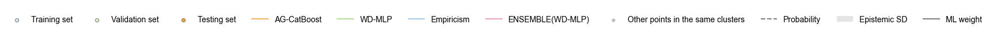

In [25]:
plt.figure(figsize=(12, 1))
ax = plt.subplot(111)
ax.set_frame_on(False)
ax.tick_params(
    labelcolor="none",
    which="both",
    top=False,
    bottom=False,
    left=False,
    right=False,
)
ax.legend(handles, labels, frameon=False, ncols=11)
plt.savefig(os.path.join(trainer.project_root, "sn_legend.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

## Inspect

In [10]:
trainer_analysis = load_trainer("output/composite_database_03222024/2024-04-16-23-10-09-0_composite A811 mcd analysis/trainer.pkl")

In [55]:
trainer_analysis.leaderboard.sort_values(by="Testing MAPE")

,Program,Model,Training RMSE,Training MSE,Training MAE,Training MAPE,Training R2,Training MEDIAN_ABSOLUTE_ERROR,Training EXPLAINED_VARIANCE_SCORE,Testing RMSE,...,Testing R2,Testing MEDIAN_ABSOLUTE_ERROR,Testing EXPLAINED_VARIANCE_SCORE,Validation RMSE,Validation MSE,Validation MAE,Validation MAPE,Validation R2,Validation MEDIAN_ABSOLUTE_ERROR,Validation EXPLAINED_VARIANCE_SCORE
1,AutoGluon,CatBoost,0.232214,0.053923,0.168069,0.046854,0.970315,0.126001,0.970315,0.494058,...,0.873096,0.241823,0.873265,0.534887,0.286104,0.359362,0.100269,0.848630,0.241813,0.848845
0,ThisWork,AutoGluon_CatBoost_NoWrap_NoPCA_3L_KMeans,0.250338,0.062669,0.179418,0.049919,0.965501,0.131056,0.965501,0.492073,...,0.874114,0.242193,0.874200,0.515922,0.266176,0.343388,0.095326,0.859173,0.221701,0.859579
2,ThisWork,AutoGluon_XGBoost_NoWrap_NoPCA_3L_KMeans,0.231257,0.053480,0.162386,0.045345,0.970559,0.115230,0.970559,0.499239,...,0.870421,0.254698,0.870577,0.525005,0.275630,0.347525,0.098038,0.854171,0.227751,0.854337
4,AutoGluon,LightGBM,0.249503,0.062252,0.174914,0.049816,0.965730,0.126152,0.965730,0.503656,...,0.868118,0.239065,0.868274,0.546586,0.298757,0.366694,0.102277,0.841935,0.242489,0.842118
3,AutoGluon,XGBoost,0.221200,0.048929,0.157999,0.043788,0.973064,0.116307,0.973064,0.501922,...,0.869024,0.254262,0.869320,0.547675,0.299948,0.365984,0.102298,0.841305,0.251290,0.841473
5,ThisWork,AutoGluon_LightGBM_NoWrap_NoPCA_3L_KMeans,0.283797,0.080541,0.198509,0.056677,0.955662,0.141081,0.955667,0.505778,...,0.867004,0.243595,0.867092,0.531321,0.282302,0.357646,0.100334,0.850641,0.237528,0.851123
7,AutoGluon,Neural Network with PyTorch,0.387066,0.149820,0.241700,0.072186,0.917524,0.144195,0.917546,0.523971,...,0.857264,0.243689,0.857292,0.555677,0.308776,0.377538,0.102668,0.836634,0.246162,0.836996
8,ThisWork,AutoGluon_Neural Network with PyTorch_NoWrap_N...,0.368759,0.135984,0.233691,0.069219,0.925141,0.142240,0.925143,0.524297,...,0.857086,0.251936,0.857107,0.530999,0.281960,0.359700,0.097542,0.850822,0.237959,0.851369
6,ThisWork,WideDeep_FTTransformer_Wrap_NoPCA_3L_KMeans,0.361825,0.130917,0.247701,0.070836,0.927930,0.168003,0.927952,0.506717,...,0.866510,0.255892,0.866626,0.551167,0.303785,0.377402,0.104128,0.839275,0.258708,0.839497
10,ThisWork,AutoGluon_Random Forest_NoWrap_NoPCA_3L_KMeans,0.257585,0.066350,0.178119,0.051751,0.963475,0.121022,0.963475,0.535795,...,0.850749,0.252935,0.851033,0.573596,0.329012,0.378282,0.108781,0.825928,0.252073,0.826054


In [11]:
import os
import numpy as np
from tqdm.auto import tqdm
from scipy.stats import pearsonr
from tabensemb.utils import metric_sklearn, auto_metric_sklearn

def inspect_all_models(trainer, phy_model_name, partition="train"):
    thiswork = trainer.get_modelbase(program="ThisWork")
    train_weights = pd.DataFrame(columns=[x for x in thiswork.get_model_names() if "PHYSICS" not in x], index=trainer.train_indices)
    val_weights = pd.DataFrame(columns=[x for x in thiswork.get_model_names() if "PHYSICS" not in x], index=trainer.val_indices)
    test_weights = pd.DataFrame(columns=[x for x in thiswork.get_model_names() if "PHYSICS" not in x], index=trainer.test_indices)
    train_prediction = train_weights.copy()
    val_prediction = val_weights.copy()
    test_prediction = test_weights.copy()
    train_phy_prediction = train_weights.copy()
    val_phy_prediction = val_weights.copy()
    test_phy_prediction = test_weights.copy()
    train_ml_prediction = train_weights.copy()
    val_ml_prediction = val_weights.copy()
    test_ml_prediction = test_weights.copy()
    train_weight_std = train_weights.copy()
    val_weight_std = val_weights.copy()
    test_weight_std = test_weights.copy()
    train_weight_mu = train_weights.copy()
    val_weight_mu = val_weights.copy()
    test_weight_mu = test_weights.copy()
    model_names = [x for x in trainer.leaderboard[trainer.leaderboard["Program"]=="ThisWork"]["Model"] if "PHYSICS" not in x]
    for idx, model_name in tqdm(enumerate(model_names), total=len(model_names)):
        res = thiswork.inspect_weighted_predictions(model_name=model_name)
        train_weights[model_name] = res["train"]["dl_weight"]
        val_weights[model_name] = res["val"]["dl_weight"]
        test_weights[model_name] = res["test"]["dl_weight"]
        train_prediction[model_name] = res["train"]["prediction"]
        val_prediction[model_name] = res["val"]["prediction"]
        test_prediction[model_name] = res["test"]["prediction"]
        train_ml_prediction[model_name] = res["train"]["dl_pred"]
        val_ml_prediction[model_name] = res["val"]["dl_pred"]
        test_ml_prediction[model_name] = res["test"]["dl_pred"]
        train_phy_prediction[model_name] = res["train"]["phy_pred"]
        val_phy_prediction[model_name] = res["val"]["phy_pred"]
        test_phy_prediction[model_name] = res["test"]["phy_pred"]
        train_weight_std[model_name] = res["train"]["std"]
        val_weight_std[model_name] = res["val"]["std"]
        test_weight_std[model_name] = res["test"]["std"]
        train_weight_mu[model_name] = res["train"]["mu"]
        val_weight_mu[model_name] = res["val"]["mu"]
        test_weight_mu[model_name] = res["test"]["mu"]
    x_cluster = thiswork.inspect_attr(
        model_name=phy_model_name, attributes=["x_cluster", "clustering"]
    )

    partition_vals = {
        "indices": {"train": trainer.train_indices, "val": trainer.val_indices, "test": trainer.test_indices}[partition],
        "df": {"train": trainer.datamodule.X_train, "val": trainer.datamodule.X_val, "test": trainer.datamodule.X_test}[partition],
        "derived_data": {"train": trainer.datamodule.D_train, "val": trainer.datamodule.D_val, "test": trainer.datamodule.D_test}[partition],
        "target": {"train": trainer.datamodule.y_train, "val": trainer.datamodule.y_val, "test": trainer.datamodule.y_test}[partition],
        "x_cluster": {"train": x_cluster["train"]["x_cluster"], "val": x_cluster["val"]["x_cluster"], "test": x_cluster["test"]["x_cluster"]}[partition],
        "x_cluster_each_layer": {"train": x_cluster["train"]["clustering"].res_each_layer, "val": x_cluster["val"]["clustering"].res_each_layer, "test": x_cluster["test"]["clustering"].res_each_layer}[partition],
        "ml_pred": {"train": train_ml_prediction, "val": val_ml_prediction, "test": test_ml_prediction}[partition],
        "phy_pred": {"train": train_phy_prediction, "val": val_phy_prediction, "test": test_phy_prediction}[partition],
        "all_pred": {"train": train_prediction, "val": val_prediction, "test": test_prediction}[partition],
        "weights": {"train": train_weights, "val": val_weights, "test": test_weights}[partition],
        "std": {"train": train_weight_std, "val": val_weight_std, "test": test_weight_std}[partition],
        "mu": {"train": train_weight_mu, "val": val_weight_mu, "test": test_weight_mu}[partition],
    }


    cluster_lengths = []
    cluster_distances = []
    cluster_average_weights = []
    cluster_average_weight_std = []
    cluster_average_weight_mu = []
    cluster_ml_err = []
    cluster_phy_err = []
    cluster_improv = []
    cluster_feature_center = []
    cluster_theoretical_acc = []
    cluster_lasso_weights = []
    cluster_phy_resp_err = []
    cluster_cons_strs = []
    cluster_n_cons = []

    model = thiswork.model[phy_model_name]

    first_centroids = model.clustering.clusterings[0].centers.numpy()
    second_centroids = model.clustering.clusterings[1].centers.numpy()
    third_centroids = model.clustering.clusterings[2].centers.numpy()

    # all_clustering_features_idx = model.basic_clustering_features_idx(trainer.datamodule)
    # first_clustering_features_idx = model.first_clustering_features_idx(trainer.datamodule)
    # second_clustering_features_idx = model.second_clustering_features_idx(trainer.datamodule)
    # third_clustering_features_idx = model.third_clustering_features_idx(trainer.datamodule)
    # outer_features = list(np.array(trainer.cont_feature_names)[outer_clustering_features_idx])
    # inner_features = list(np.array(trainer.cont_feature_names)[inner_clustering_features_idx])
    # train_pca = trainer.datamodule.pca(indices=trainer.train_indices, feature_names=outer_features+inner_features)
    # train_pca_res = train_pca.transform(trainer.datamodule.scaled_df.loc[trainer.train_indices, outer_features+inner_features])
    theoretical = trainer.cal_theoretical_pof50(max_stress_col="Maximum Stress", r_value_col="R-value", freq_col="Frequency")
    emp_names = [x.__class__.__name__ for x in model.phys]
    res = thiswork.inspect_attr(model_name=phy_model_name, attributes=["weight_input", "weight"], df=partition_vals["df"], derived_data=partition_vals["derived_data"])
    original_phy_weights = res["USER_INPUT"]["weight"]
    original_phy_predictions = res["USER_INPUT"]["weight_input"]

    for i in np.unique(partition_vals["x_cluster"]):
        is_this_cluster = np.where(partition_vals["x_cluster"]==i)[0]
        if len(is_this_cluster) == 0:
            continue
        
        ml_err = metric_sklearn(partition_vals["target"][is_this_cluster], partition_vals["ml_pred"].mean(axis=1).values[is_this_cluster], metric="mape")
        phy_err = metric_sklearn(partition_vals["target"][is_this_cluster], partition_vals["phy_pred"].mean(axis=1).values[is_this_cluster], metric="mape")
        all_err = metric_sklearn(partition_vals["target"][is_this_cluster], partition_vals["all_pred"].mean(axis=1).values[is_this_cluster], metric="mape")

        conditions = partition_vals["df"].loc[partition_vals["df"].index[is_this_cluster], ["Material_Code", "Frequency", "R-value"]]
        conditions_strs = [f"{conditions['Material_Code'].values[i]}--{conditions['Frequency'].values[i]:.2f}--{conditions['R-value'].values[i]:.2f}" for i in range(len(conditions))]
        cluster_n_cons.append(len(np.unique(conditions_strs)))
        cluster_cons_strs.append(conditions_strs)

        first_idx = partition_vals["x_cluster_each_layer"][0][is_this_cluster]
        second_idx = partition_vals["x_cluster_each_layer"][1][is_this_cluster]
        third_idx = partition_vals["x_cluster_each_layer"][2][is_this_cluster]
        assert len(np.unique(first_idx))==1
        assert len(np.unique(second_idx))==1
        assert len(np.unique(third_idx))==1
        first_center = first_centroids[first_idx[0]]
        second_center = second_centroids[second_idx[0]]
        third_center = third_centroids[third_idx[0]]

        cluster_theoretical_acc.append(auto_metric_sklearn(partition_vals["target"][is_this_cluster], theoretical[partition_vals["indices"]][is_this_cluster], metric="mape", task="regression"))
        cluster_lengths.append(len(is_this_cluster))
        cluster_distances.append(np.sqrt(np.sum(np.power(first_center, 2))+np.sqrt(np.sum(np.power(second_center, 2))))+np.sqrt(np.sum(np.power(third_center, 2))))
        cluster_average_weights.append(np.mean(partition_vals["weights"].mean(axis=1).values[is_this_cluster]))
        cluster_average_weight_std.append(np.mean(partition_vals["std"].mean(axis=1).values[is_this_cluster]))
        cluster_average_weight_mu.append(np.mean(partition_vals["mu"].mean(axis=1).values[is_this_cluster]))
        cluster_ml_err.append(ml_err)
        cluster_phy_err.append(phy_err)
        cluster_improv.append((ml_err-all_err)/ml_err*100)
        cluster_feature_center.append(np.concatenate([first_center, second_center, third_center]))
        cluster_lasso_weights.append(original_phy_weights[i])
        cluster_phy_resp_err.append([auto_metric_sklearn(partition_vals["target"][is_this_cluster], original_phy_predictions[is_this_cluster, j], metric="mape", task="regression") for j in range(len(emp_names))])

    return {
        "train_weights": train_weights,
        "val_weights": val_weights,
        "test_weights": test_weights,
        "train_prediction": train_prediction,
        "val_prediction": val_prediction,
        "test_prediction": test_prediction,
        "train_ml_prediction": train_ml_prediction,
        "val_ml_prediction": val_ml_prediction,
        "test_ml_prediction": test_ml_prediction,
        "train_phy_prediction": train_phy_prediction,
        "val_phy_prediction": val_phy_prediction,
        "test_phy_prediction": test_phy_prediction,
        "x_cluster": x_cluster,
        "cluster_lengths": cluster_lengths,
        "cluster_distances": cluster_distances,
        "cluster_average_weights": cluster_average_weights,
        "cluster_average_weight_std": cluster_average_weight_std,
        "cluster_average_weight_mu": cluster_average_weight_mu,
        "cluster_ml_err": cluster_ml_err,
        "cluster_phy_err": cluster_phy_err,
        "cluster_improv": cluster_improv,
        "cluster_feature_center": cluster_feature_center,
        "cluster_theoretical_acc": cluster_theoretical_acc,
        "cluster_lasso_weights": cluster_lasso_weights,
        "cluster_phy_resp_err": cluster_phy_resp_err,
        "cluster_n_cons": cluster_n_cons,
        "cluster_cons_strs": cluster_cons_strs,
    }

### Correlation of metrics per cluster considering ML and Empiricism

In [12]:
rd_inspects = inspect_all_models(trainer_analysis, "PHYSICS_NoPCA_3L_KMeans")
cluster_lengths=rd_inspects["cluster_lengths"]
cluster_distances=rd_inspects["cluster_distances"]
cluster_average_weights=rd_inspects["cluster_average_weights"]
cluster_average_weight_std=rd_inspects["cluster_average_weight_std"]
cluster_average_weight_mu=rd_inspects["cluster_average_weight_mu"]
cluster_ml_err=rd_inspects["cluster_ml_err"]
cluster_phy_err=rd_inspects["cluster_phy_err"]
cluster_improv=rd_inspects["cluster_improv"]
cluster_feature_center=rd_inspects["cluster_feature_center"]
cluster_theoretical_acc=rd_inspects["cluster_theoretical_acc"]
cluster_lasso_weights=rd_inspects["cluster_lasso_weights"]
cluster_phy_resp_err=rd_inspects["cluster_phy_resp_err"]
cluster_n_cons=rd_inspects["cluster_n_cons"]

  0%|          | 0/25 [00:00<?, ?it/s]

<frozen importlib._bootstrap>:241: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 216 from C header, got 232 from PyObject
/home/xlluo/anaconda3/envs/tabular_ensemble/lib/python3.10/site-packages/pytorch_tabular/models/mixture_density/mdn.py:25: UserWarning: Wandb not installed. WandbLogger will not work.
  warnings.warn("Wandb not installed. WandbLogger will not work.")


Theoretical accuracy at PoF=50% (gaussian distribution):
	 Training MSE 0.04503, RMSE 0.21220
	 Validation MSE 0.05294, RMSE 0.23008
	 Testing MSE 0.03751, RMSE 0.19368
	 Overall MSE 0.04507, RMSE 0.21229


In [139]:
len(cluster_lengths)

426

In [31]:
pd.DataFrame({"Size": cluster_lengths, "Distance": cluster_distances, "ML weight": cluster_average_weights, "ML weight mu": cluster_average_weight_mu, "ML weight std": cluster_average_weight_std, "ML err": cluster_ml_err, "Phy err": cluster_phy_err, "Improvement": cluster_improv, "theoretical err": cluster_theoretical_acc, "n_cons": cluster_n_cons}).corr()

,Size,Distance,ML weight,ML weight mu,ML weight std,ML err,Phy err,Improvement,theoretical err,n_cons
Size,1.000000,-0.124034,0.443496,0.436498,-0.242579,-0.023236,0.136111,-0.464952,0.096820,0.772066
Distance,-0.124034,1.000000,-0.015708,-0.041558,-0.085191,0.044727,0.036259,-0.058884,0.023362,-0.159613
ML weight,0.443496,-0.015708,1.000000,0.989854,-0.483595,0.115810,0.405699,-0.815967,0.069772,0.433881
ML weight mu,0.436498,-0.041558,0.989854,1.000000,-0.385392,0.104130,0.390140,-0.809369,0.056419,0.431345
ML weight std,-0.242579,-0.085191,-0.483595,-0.385392,1.000000,-0.159459,-0.295286,0.358793,-0.146852,-0.189133
ML err,-0.023236,0.044727,0.115810,0.104130,-0.159459,1.000000,0.899026,-0.047898,0.575739,-0.060336
Phy err,0.136111,0.036259,0.405699,0.390140,-0.295286,0.899026,1.000000,-0.341597,0.594637,0.090166
Improvement,-0.464952,-0.058884,-0.815967,-0.809369,0.358793,-0.047898,-0.341597,1.000000,-0.138206,-0.409221
theoretical err,0.096820,0.023362,0.069772,0.056419,-0.146852,0.575739,0.594637,-0.138206,1.000000,-0.078010
n_cons,0.772066,-0.159613,0.433881,0.431345,-0.189133,-0.060336,0.090166,-0.409221,-0.078010,1.000000


In [32]:
from scipy.stats import pearsonr
pearsonr(cluster_lengths, cluster_n_cons)

PearsonRResult(statistic=0.7720656860112431, pvalue=1.7101660905560384e-85)

### Metrics of three modules

PearsonRResult(statistic=0.43388089536383423, pvalue=5.540751179959971e-21)
PearsonRResult(statistic=-0.4092210457571219, pvalue=1.2496573587992248e-18)
PearsonRResult(statistic=0.3587930004510247, pvalue=2.1809238736598065e-14)


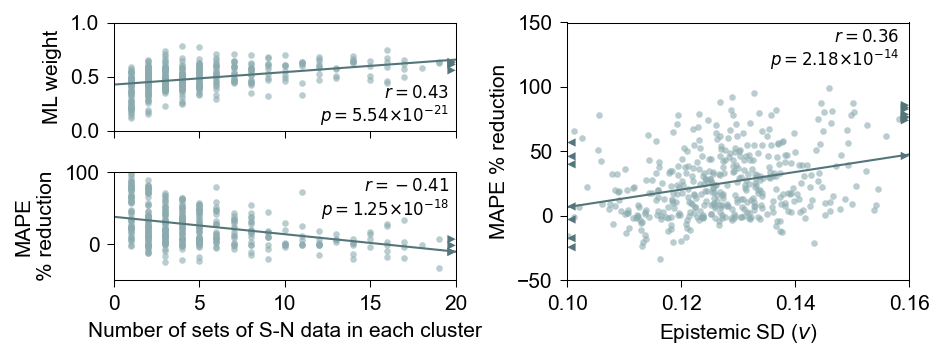

PearsonRResult(statistic=-0.060336336103033614, pvalue=0.21394102931730785)
PearsonRResult(statistic=0.09016615723245704, pvalue=0.06298048706828457)
PearsonRResult(statistic=0.11581031093124243, pvalue=0.016787642959507645)
PearsonRResult(statistic=0.40569937543108764, pvalue=2.6138379897029954e-18)


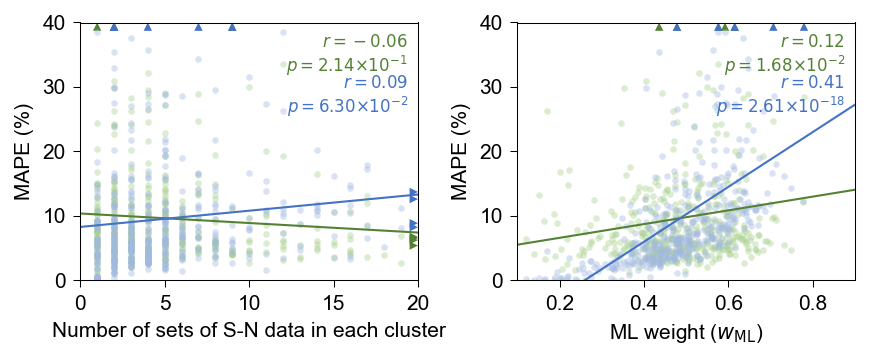

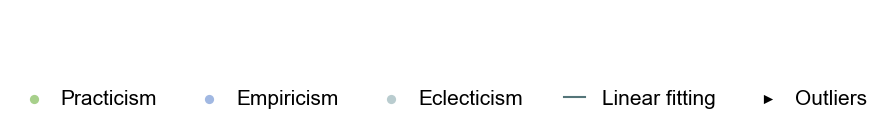

In [14]:
import matplotlib.patches as mpatches
def plot_outliers(x, y, ax, right=None, left=None, top=None, bottom=None, arrow_kwargs=None):
    arrow_kwargs_ = update_defaults_by_kwargs(dict(mutation_scale=8, linewidth=0, color="black", shrinkA=10, shrinkB=10), arrow_kwargs)
    if "label" in arrow_kwargs_.keys():
        label = arrow_kwargs_["label"]
        del arrow_kwargs_["label"]
    else:
        label = None
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()
    if right is not None:
        where_exceed = np.array(x) > right
        for j in np.array(y)[where_exceed].flatten():
            arrow = mpatches.FancyArrowPatch((right-1e-5, j), (right, j), **arrow_kwargs_)
            ax.add_patch(arrow)
        # outliers = ax.scatter(np.ones(len(np.where(where_exceed)[0]))*right*right_top_ratio, np.array(y)[where_exceed].flatten(), marker=">", **scatter_kwargs_)
    if top is not None:
        where_exceed = np.array(y) > top
        for j in np.array(x)[where_exceed].flatten():
            arrow = mpatches.FancyArrowPatch((j, top-1e-5), (j, top), **arrow_kwargs_)
            ax.add_patch(arrow)
        # outliers = ax.scatter(np.array(x)[where_exceed].flatten(), np.ones(len(np.where(where_exceed)[0]))*top*right_top_ratio, marker="^", **scatter_kwargs_)
    if left is not None:
        where_exceed = np.array(x) < left
        for j in np.array(y)[where_exceed].flatten():
            arrow = mpatches.FancyArrowPatch((left+1e-5, j), (left, j), **arrow_kwargs_)
            ax.add_patch(arrow)
        # outliers = ax.scatter(np.ones(len(np.where(where_exceed)[0]))*left*left_bottom_ratio, np.array(y)[where_exceed].flatten(), marker="<", **scatter_kwargs_)
    if bottom is not None:
        where_exceed = np.array(y) < bottom
        for j in np.array(x)[where_exceed].flatten():
            arrow = mpatches.FancyArrowPatch((j, bottom+1e-5), (j, bottom), **arrow_kwargs_)
            ax.add_patch(arrow)
        # outliers = ax.scatter(np.array(x)[where_exceed].flatten(), np.ones(len(np.where(where_exceed)[0]))*bottom*left_bottom_ratio, marker="v", **scatter_kwargs_)
    ax.scatter([-1000, -1000], [-1000, -1000], marker=">", s=10, color="k", label=label, linewidth=0)
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)

ml_clr = "#548235"
phy_clr = "#4472C4"
elec_clr = "#7ea2a6"


plt.figure(figsize=(6.4, 2.5), dpi=150)
ax = plt.subplot(221)
x = cluster_n_cons
y = cluster_average_weights
ax.scatter(x, y, alpha=0.6, s=10, linewidth=0, color=lighten_color(elec_clr, 0.9), label="Eclecticism")
ax.set_xlabel("Number of sets of S-N data in each cluster")
ax.set_ylabel("ML weight")
r = pearsonr(x, y)
print(r)
pfit = np.polyfit(x, y, 1)
k, b = pfit[0], pfit[1]
ax.plot(np.linspace(0, 60, 3), k*np.linspace(0, 60, 3)+b, color=lighten_color(elec_clr, 1.4), label="Linear fitting", linewidth=1)
ax.text(0.98, 0.02, f"$r={r.statistic:.2f}$\n$p=${to_scientific_notation(r.pvalue)}", ha="right", va="bottom", transform=ax.transAxes, fontsize=plt.rcParams["font.size"]*0.8)

right = 20

plot_outliers(x, y, ax, right=right, arrow_kwargs=dict(label="Outliers", color=lighten_color(elec_clr, 1.4)))

ax.set_xlim([0, right])
ax.set_ylim([0,1])
ax.legend(bbox_to_anchor=(1.02, -0.28), frameon=False, handlelength=0.5, ncols=2)
handles_lf_ot, labels_lf_ot = ax.get_legend().legendHandles, [x.get_text() for x in ax.get_legend().texts]
ax.get_legend().remove()
ax.set_xticklabels([])
ax.set_xlabel(None)
set_linewidth(ax)

ax = plt.subplot(223)
x = cluster_n_cons
y = cluster_improv
ax.scatter(x, y, alpha=0.6, s=10, linewidth=0, color=lighten_color(elec_clr, 0.9))
ax.set_xlabel("Number of sets of S-N data in each cluster")
ax.set_ylabel("MAPE\n% reduction")
r = pearsonr(x, y)
print(r)
pfit = np.polyfit(x, y, 1)
k, b = pfit[0], pfit[1]
ax.plot(np.linspace(0, 60, 3), k*np.linspace(0, 60, 3)+b, color=lighten_color(elec_clr, 1.4), label="Linear fitting", linewidth=1)
ax.text(0.98, 0.95, f"$r={r.statistic:.2f}$\n$p=${to_scientific_notation(r.pvalue)}", ha="right", va="top", transform=ax.transAxes, fontsize=plt.rcParams["font.size"]*0.8)

right = 20

plot_outliers(x, y, ax, right=right, arrow_kwargs=dict(label="Outliers", color=lighten_color(elec_clr, 1.4)))

ax.set_xlim([0, right])
ax.set_ylim([-50, 100])
set_linewidth(ax)

from scipy.stats import gaussian_kde

ax = plt.subplot(122)
x = cluster_average_weight_std
y = cluster_improv
xy = np.vstack([x, y])
z = gaussian_kde(xy)(xy)
ax.scatter(x, y, alpha=0.6, s=10, linewidth=0, color=lighten_color(elec_clr, 0.9))
ax.set_xlabel(r"Epistemic SD ($v$)")
ax.set_ylabel(r"MAPE % reduction")
r = pearsonr(x, y)
print(r)
pfit = np.polyfit(x, y, 1)
k, b = pfit[0], pfit[1]
ax.plot(np.linspace(0, 0.4, 3), k*np.linspace(0, 0.4, 3)+b, color=lighten_color(elec_clr, 1.4), label="Linear fitting", linewidth=1)
ax.text(0.97, 0.98, f"$r={r.statistic:.2f}$\n$p=${to_scientific_notation(r.pvalue)}", ha="right", va="top", transform=ax.transAxes, fontsize=plt.rcParams["font.size"]*0.8)

plot_outliers(x, y, ax, right=0.16, left=0.1, bottom=-50, top=150, arrow_kwargs=dict(label="Outliers", color=lighten_color(elec_clr, 1.4)))

ax.set_xlim([0.1, 0.16])
ax.set_ylim([-50, 150])
set_linewidth(ax)

# ax = plt.subplot(111)
# ax.set_frame_on(False)
# ax.tick_params(
#     labelcolor="none",
#     which="both",
#     top=False,
#     bottom=False,
#     left=False,
#     right=False,
# )
# ax.legend(handles_lf_ot, labels_lf_ot, bbox_to_anchor=(0.7, -0.28), frameon=False, handlelength=0.5, ncols=2)

plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "npoints_vs_weight.pdf"), dpi=500)
plt.show()
plt.close()

plt.figure(figsize=(5.9, 2.5), dpi=150)
ax = plt.subplot(121)
x = cluster_n_cons
y = cluster_ml_err
ax.scatter(x, y, alpha=0.4, s=10, linewidth=0, color=lighten_color(ml_clr, 0.5), label="Practicism")
ax.set_xlabel("Number of sets of S-N data in each cluster")
ax.set_ylabel("MAPE (%)")
r_ml = pearsonr(x, y)
print(r_ml)
pfit = np.polyfit(x, y, 1)
k, b = pfit[0], pfit[1]
ax.plot(np.linspace(0, 60, 3), k*np.linspace(0, 60, 3)+b, color=lighten_color(ml_clr, 1.), linewidth=1)
top = 0.4
plot_outliers(x, y, ax, right=right, top=top, arrow_kwargs=dict(color=lighten_color(ml_clr, 1.)))

x = cluster_n_cons
y = cluster_phy_err
ax.scatter(x, y, alpha=0.4, s=10, linewidth=0, color=lighten_color(phy_clr, 0.5), label="Empiricism")
r_ep = pearsonr(x, y)
print(r_ep)
pfit = np.polyfit(x, y, 1)
k, b = pfit[0], pfit[1]
ax.plot(np.linspace(0, 60, 3), k*np.linspace(0, 60, 3)+b, color=lighten_color(phy_clr, 1.), linewidth=1)

plot_outliers(x, y, ax, right=right, top=top, arrow_kwargs=dict(color=lighten_color(phy_clr, 1.)))

ax.text(0.97, 0.96, f"$r={r_ml.statistic:.2f}$\n$p=${to_scientific_notation(r_ml.pvalue)}", ha="right", va="top", transform=ax.transAxes, fontsize=plt.rcParams["font.size"]*0.8, color=lighten_color(ml_clr, 1.))
ax.text(0.97, 0.8, f"$r={r_ep.statistic:.2f}$\n$p=${to_scientific_notation(r_ep.pvalue)}", ha="right", va="top", transform=ax.transAxes, fontsize=plt.rcParams["font.size"]*0.8, color=lighten_color(phy_clr, 1.))

ax.set_xlim([0, right])
ax.set_ylim([0, top])
ax.set_yticks([0, 0.1, 0.2, 0.3, 0.4])
multiply_yticklabels(ax)
set_linewidth(ax)

ax.legend()
handles, labels = ax.get_legend().legendHandles, [x.get_text() for x in ax.get_legend().texts]
ax.get_legend().remove()

ax = plt.subplot(122)
x = cluster_average_weights
y = cluster_ml_err
ax.scatter(x, y, alpha=0.4, s=10, linewidth=0, color=lighten_color(ml_clr, 0.5), label="Practicism")
ax.set_xlabel("ML weight ($w_{\mathrm{ML}}$)")
ax.set_ylabel("MAPE (%)")
r_ml = pearsonr(x, y)
print(r_ml)
pfit = np.polyfit(x, y, 1)
k, b = pfit[0], pfit[1]
ax.plot(np.linspace(0, 1, 3), k*np.linspace(0, 1, 3)+b, color=lighten_color(ml_clr, 1.), linewidth=1)

plot_outliers(x, y, ax, top=top, arrow_kwargs=dict(color=lighten_color(ml_clr, 1.)))

x = cluster_average_weights
y = cluster_phy_err
ax.scatter(x, y, alpha=0.4, s=10, linewidth=0, color=lighten_color(phy_clr, 0.5), label="Empiricism")
r_ep = pearsonr(x, y)
print(r_ep)
pfit = np.polyfit(x, y, 1)
k, b = pfit[0], pfit[1]
ax.plot(np.linspace(0, 1, 3), k*np.linspace(0, 1, 3)+b, color=lighten_color(phy_clr, 1.), linewidth=1)

plot_outliers(x, y, ax, top=top, arrow_kwargs=dict(color=lighten_color(phy_clr, 1.)))
plot_outliers(x, y, ax, left=0.1, right=0.9, arrow_kwargs=dict(color=lighten_color(phy_clr, 1.)))


ax.text(0.97, 0.96, f"$r={r_ml.statistic:.2f}$\n$p=${to_scientific_notation(r_ml.pvalue)}", ha="right", va="top", transform=ax.transAxes, fontsize=plt.rcParams["font.size"]*0.8, color=lighten_color(ml_clr, 1.))
ax.text(0.97, 0.8, f"$r={r_ep.statistic:.2f}$\n$p=${to_scientific_notation(r_ep.pvalue)}", ha="right", va="top", transform=ax.transAxes, fontsize=plt.rcParams["font.size"]*0.8, color=lighten_color(phy_clr, 1.))

ax.set_xlim([0.1, 0.9])
ax.set_ylim([0, top])
multiply_yticklabels(ax)
set_linewidth(ax)
# ax.set_ylabel(None)


# ax = plt.subplot(133)
# x = cluster_theoretical_acc
# y = cluster_ml_err
# ax.scatter(x, y, alpha=0.4, s=10, linewidth=0, c=tabensemb.utils.global_palette[0], label="ML (Average)")
# ax.set_xlabel("Theoretical MAPE")
# ax.set_ylabel("Average MAPE")
# r_ml = pearsonr(x, y)
# print(r_ml)
# pfit = np.polyfit(x, y, 1)
# k, b = pfit[0], pfit[1]
# ax.plot(np.linspace(0, 1, 3), k*np.linspace(0, 1, 3)+b, color=lighten_color(tabensemb.utils.global_palette[0], 1.6), linewidth=1)

# right = 0.2
# plot_outliers(x, y, ax, top=top, right=right, scatter_kwargs=dict(color=lighten_color(tabensemb.utils.global_palette[0], 1.6), s=12, linewidth=0))

# x = cluster_theoretical_acc
# y = cluster_phy_err
# ax.scatter(x, y, alpha=0.4, s=10, linewidth=0, c=tabensemb.utils.global_palette[1], label="Empiricism")
# r_ep = pearsonr(x, y)
# print(r_ep)
# pfit = np.polyfit(x, y, 1)
# k, b = pfit[0], pfit[1]
# ax.plot(np.linspace(0, 1, 3), k*np.linspace(0, 1, 3)+b, color=lighten_color(tabensemb.utils.global_palette[1], 1.6), linewidth=1)

# plot_outliers(x, y, ax, top=top, right=right, scatter_kwargs=dict(color=lighten_color(tabensemb.utils.global_palette[1], 1.6), s=12, linewidth=0))

# ax.text(0.95, 0.96, f"Pearson's $r={r_ml.statistic:.2f}$\n$p$-value$={r_ml.pvalue:.2e}$", ha="right", va="top", transform=ax.transAxes, fontsize=plt.rcParams["font.size"]*0.8, color=lighten_color(tabensemb.utils.global_palette[0], 1.8))
# ax.text(0.95, 0.76, f"Pearson's $r={r_ep.statistic:.2f}$\n$p$-value$={r_ep.pvalue:.2e}$", ha="right", va="top", transform=ax.transAxes, fontsize=plt.rcParams["font.size"]*0.8, color=lighten_color(tabensemb.utils.global_palette[1], 1.8))

# set_linewidth(ax)
# ax.set_ylim([0, top])
# ax.set_xlim([0, right])
# ax.set_ylabel(None)
# ax.set_yticklabels([])

plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "npoints_weight_vs_mape.pdf"), dpi=500)
plt.show()
plt.close()

plt.figure(figsize=(6, 1), dpi=150)
ax = plt.subplot(111)
ax.set_frame_on(False)
ax.tick_params(
    labelcolor="none",
    which="both",
    top=False,
    bottom=False,
    left=False,
    right=False,
)
for handle in handles:
    handle.set(alpha=1)
# ax.legend(handles=handles, labels=labels, title=False, loc="upper right", bbox_to_anchor=(1.2, -0.1), ncols=2, frameon=False, handlelength=1)
handles = list(handles) + list(handles_lf_ot)
labels = list(labels) + list(labels_lf_ot)
ax.legend(handles=handles, labels=labels, bbox_to_anchor=(1.08, -0.28), frameon=False, handlelength=1, ncols=5, markerscale=1.4)
plt.savefig(os.path.join(trainer.project_root, "npoints_weight_vs_mape_legend.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()


PearsonRResult(statistic=-0.06035076066431076, pvalue=0.2138313355736792)
PearsonRResult(statistic=0.09016615723245704, pvalue=0.06298048706828457)


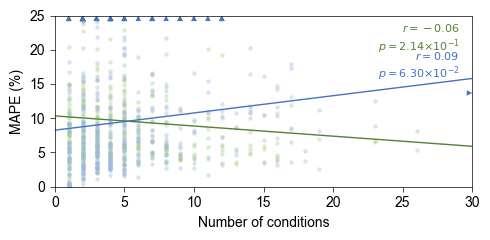

In [69]:
top=0.25
right = 30
plt.figure(figsize=(5,2.5))
ax = plt.subplot(111)
x = cluster_n_cons
y = cluster_ml_err
ax.scatter(x, y, alpha=0.4, s=10, linewidth=0, color=lighten_color(ml_clr, 0.5), label="Practicism")
ax.set_xlabel("Number of conditions")
ax.set_ylabel("MAPE (%)")
r_ml = pearsonr(x, y)
print(r_ml)
pfit = np.polyfit(x, y, 1)
k, b = pfit[0], pfit[1]
ax.plot(np.linspace(0, 35, 3), k*np.linspace(0, 35, 3)+b, color=lighten_color(ml_clr, 1.), linewidth=1)

plot_outliers(x, y, ax, top=top, arrow_kwargs=dict(color=lighten_color(ml_clr, 1.)))

x = np.array(cluster_n_cons)
y = cluster_phy_err
ax.scatter(x, y, alpha=0.4, s=10, linewidth=0, color=lighten_color(phy_clr, 0.5), label="Empiricism")
r_ep = pearsonr(x, y)
print(r_ep)
pfit = np.polyfit(x, y, 1)
k, b = pfit[0], pfit[1]
ax.plot(np.linspace(0, 35, 3), k*np.linspace(0, 35, 3)+b, color=lighten_color(phy_clr, 1.), linewidth=1)

plot_outliers(x, y, ax, top=top, arrow_kwargs=dict(color=lighten_color(phy_clr, 1.)))
plot_outliers(x, y, ax, left=0., right=right, arrow_kwargs=dict(color=lighten_color(phy_clr, 1.)))

ax.text(0.97, 0.96, f"$r={r_ml.statistic:.2f}$\n$p=${to_scientific_notation(r_ml.pvalue)}", ha="right", va="top", transform=ax.transAxes, fontsize=plt.rcParams["font.size"]*0.8, color=lighten_color(ml_clr, 1.))
ax.text(0.97, 0.8, f"$r={r_ep.statistic:.2f}$\n$p=${to_scientific_notation(r_ep.pvalue)}", ha="right", va="top", transform=ax.transAxes, fontsize=plt.rcParams["font.size"]*0.8, color=lighten_color(phy_clr, 1.))

ax.set_xlim([0., right])
ax.set_ylim([0, top])
multiply_yticklabels(ax)
set_linewidth(ax)
plt.show()
plt.close()

PearsonRResult(statistic=0.43388089536383423, pvalue=5.540751179959971e-21)
PearsonRResult(statistic=-0.4092210457571219, pvalue=1.2496573587992248e-18)


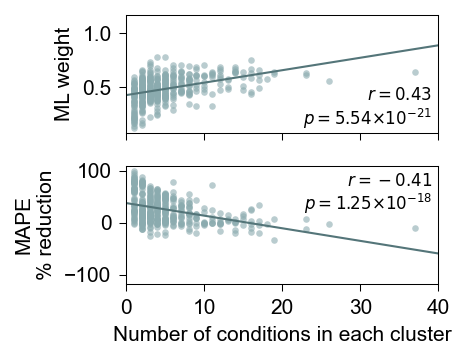

In [26]:
plt.figure(figsize=(3.2, 2.5), dpi=150)
ax = plt.subplot(211)
x = np.array(cluster_n_cons)
y = cluster_average_weights
ax.scatter(x, y, alpha=0.6, s=10, linewidth=0, color=lighten_color(elec_clr, 0.9), label="Eclecticism")
ax.set_xlabel("Number of conditions in each cluster")
ax.set_ylabel("ML weight")
r = pearsonr(x, y)
print(r)
pfit = np.polyfit(x, y, 1)
k, b = pfit[0], pfit[1]
ax.plot(np.linspace(0, 60, 3), k*np.linspace(0, 60, 3)+b, color=lighten_color(elec_clr, 1.4), label="Linear fitting", linewidth=1)
ax.text(0.98, 0.02, f"$r={r.statistic:.2f}$\n$p=${to_scientific_notation(r.pvalue)}", ha="right", va="bottom", transform=ax.transAxes, fontsize=plt.rcParams["font.size"]*0.8)

right = 40

plot_outliers(x, y, ax, right=right, arrow_kwargs=dict(label="Outliers", color=lighten_color(elec_clr, 1.4)))

ax.set_xlim([0, right])
ax.legend(bbox_to_anchor=(1.02, -0.28), frameon=False, handlelength=0.5, ncols=2)
handles_lf_ot, labels_lf_ot = ax.get_legend().legendHandles, [x.get_text() for x in ax.get_legend().texts]
ax.get_legend().remove()
ax.set_xticklabels([])
ax.set_xlabel(None)
set_linewidth(ax)

ax = plt.subplot(212)
x = np.array(cluster_n_cons)
y = cluster_improv
ax.scatter(x, y, alpha=0.6, s=10, linewidth=0, color=lighten_color(elec_clr, 0.9))
ax.set_xlabel("Number of conditions in each cluster")
ax.set_ylabel("MAPE\n% reduction")
r = pearsonr(x, y)
print(r)
pfit = np.polyfit(x, y, 1)
k, b = pfit[0], pfit[1]
ax.plot(np.linspace(0, 60, 3), k*np.linspace(0, 60, 3)+b, color=lighten_color(elec_clr, 1.4), label="Linear fitting", linewidth=1)
ax.text(0.98, 0.95, f"$r={r.statistic:.2f}$\n$p=${to_scientific_notation(r.pvalue)}", ha="right", va="top", transform=ax.transAxes, fontsize=plt.rcParams["font.size"]*0.8)

right = 40

plot_outliers(x, y, ax, right=right, arrow_kwargs=dict(label="Outliers", color=lighten_color(elec_clr, 1.4)))

ax.set_xlim([0, right])

set_linewidth(ax)


### How LASSO works

Here only MAPE is calculated, but LASSO is trained using RMSE in this study.

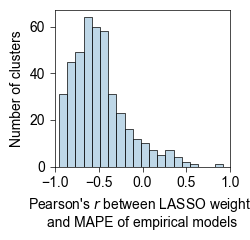

In [125]:
import seaborn as sns
plt.figure(figsize=(2.6, 2.5))
ax = plt.subplot(111)
sns.histplot([pearsonr(w, e).statistic for w, e in zip(cluster_lasso_weights, cluster_phy_resp_err)], ax=ax, color=tabensemb.utils.global_palette[2], linewidth=0.5)
ax.set_xlabel("Pearson's $r$ between LASSO weights\nand MAPE of empirical models")
ax.set_ylabel("Number of clusters")
ax.set_xlim([-1,1])
set_linewidth(ax)
plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "lasso_err_pearson.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

### Visualization of LASSO weights per cluster per empirical model

In [20]:
model = trainer_analysis.get_modelbase("ThisWork").model["PHYSICS_NoPCA_3L_KMeans"]
emp_names = [x.__class__.__name__ for x in model.phys]
order = ["LinLog", "LogLog", "Sendeckyj", "Hwang", "Kohout", "KimZhang", "KawaiKoizumi", "Poursatip", "PoursatipSimplified", "DAmore", "DAmoreSimplified", "Epaarachchi", "EpaarachchiSimplified"]
names_sort_args = np.array([emp_names.index(x) for x in order])

/tmp/ipykernel_28317/2523461793.py:22: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.savefig(os.path.join(trainer.project_root, "phys_cluster_weight.pdf"), dpi=500, bbox_inches="tight")
/tmp/ipykernel_28317/2523461793.py:22: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.savefig(os.path.join(trainer.project_root, "phys_cluster_weight.pdf"), dpi=500, bbox_inches="tight")
/home/xlluo/anaconda3/envs/tabular_ensemble/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fig.canvas.print_figure(bytes_io, **kw)


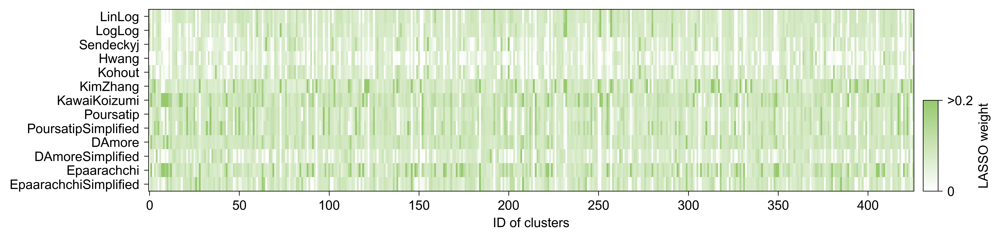

In [36]:
from matplotlib.gridspec import GridSpec
from matplotlib.colors import LinearSegmentedColormap

fig = plt.figure(figsize=(11, 2.5),dpi=500)
gs = GridSpec(100, 100, figure=fig)
ax = fig.add_subplot(gs[:, 0:95])
weights = np.array(cluster_lasso_weights).T
weights[weights>0.2] = 0.2
weights = weights[names_sort_args, :]
im = ax.imshow(weights, cmap=LinearSegmentedColormap.from_list("greens", [[1, 1, 1], [150/255, 201/255, 109/255]]))
ax.set_aspect("auto")
ax.set_yticks(list(range(len(emp_names))))
ax.set_yticklabels(order)
set_linewidth(ax)
cax = fig.add_subplot(gs[50:, 96:98])
cbar = plt.colorbar(cax=cax, mappable=im)
cax.set_yticks(cax.get_ylim())
cax.set_yticklabels(["0", ">0.2"])
set_linewidth(cax)
ax.set_xlabel(f"ID of clusters")
cax.set_ylabel(f"LASSO weight")
plt.savefig(os.path.join(trainer.project_root, "phys_cluster_weight.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

### Compare LASSO weight

The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


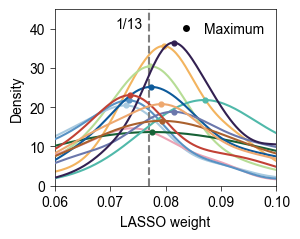

In [116]:
import seaborn as sns
from matplotlib.lines import Line2D

plt.figure(figsize=(3.1,2.5))
ax = plt.subplot(111)
weights = (np.array(cluster_lasso_weights).T)[names_sort_args, :]
for idx, name in enumerate(order):
    sns.kdeplot(weights[idx], label=name, ax=ax, color=tabensemb.utils.global_palette[idx], gridsize=1000, bw_adjust=0.4, zorder=idx)
ax.legend()
handles, labels = ax.get_legend().legendHandles, [x.get_text() for x in ax.get_legend().texts]

is_higher = {}
for child in ax.get_children():
    if isinstance(child, Line2D):
        x, y = child.get_data()
        c = child.get_c()
        l = child.get_label()
        ax.scatter([x[np.argmax(y)]], y[np.argmax(y)], c=c, s=12, zorder=order.index(l))
        is_higher[l] = True if x[np.argmax(y)]>1/len(emp_names) else False
labels = [f"{x}({'>' if is_higher[x] else '<'})" for x in labels]
for handle in handles:
    handle.set(markeredgewidth=0, markersize=4, marker="o", markerfacecolor=handle.get_c())

ax.set_xlim([0.06, 0.1])
# ax.set_ylim([0, 7])
ax.set_xlabel(f"LASSO weight")

ax.plot([1/len(emp_names)]*2, [0, 45], color="grey", linestyle="--")
ax.text(1/len(emp_names)-0.001, 43, f"1/{len(emp_names)}", ha="right", va="top")
ax.set_ylim([0, 45])
set_linewidth(ax)

ax.get_legend().remove()
ax.legend(handles=[Line2D([], [], marker="o", markerfacecolor="k", markersize=5, markeredgecolor=None, markeredgewidth=0, linewidth=0)], labels=["Maximum"], handlelength=1, frameon=False, loc="upper right")

plt.savefig(os.path.join(trainer.project_root, "phys_resp_weight_kde.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.


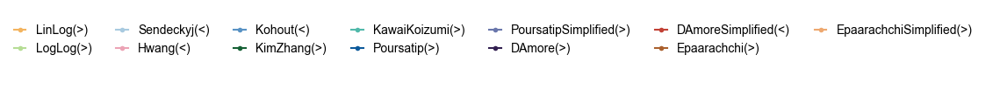

In [117]:
plt.figure(figsize=(6,1))
ax = plt.subplot(111)

ax.legend(handles, labels, ncols=7, handlelength=1, frameon=False)

ax.set_frame_on(False)
ax.tick_params(
    labelcolor="none",
    which="both",
    top=False,
    bottom=False,
    left=False,
    right=False,
)
plt.savefig(os.path.join(trainer.project_root, "empirical_models_legend.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

### LASSO weights in 2nd and 3rd subspaces

In [37]:
scaler = trainer_analysis.datamodule.dataprocessors[-1].transformer
r_centers = (np.array(cluster_feature_center)[:, -1])*scaler.scale_[trainer_analysis.cont_feature_names.index("R-value")]+scaler.mean_[trainer_analysis.cont_feature_names.index("R-value")]
f_centers = (np.array(cluster_feature_center)[:, -2])*scaler.scale_[trainer_analysis.cont_feature_names.index("Frequency")]+scaler.mean_[trainer_analysis.cont_feature_names.index("Frequency")]
np.unique(r_centers), np.unique(f_centers)

(array([-2.499909  , -2.        , -0.99999976, -0.49999976, -0.39999986,
         0.09914899,  0.4903003 ,  0.7375685 ,  1.1001287 ,  2.        ,
        10.00485   ], dtype=float32),
 array([  5.4020996, 109.67823  ], dtype=float32))

In [38]:
cluster_centers = np.array([[float(k) for k in j.split(", ")] for j in np.unique([f"{x}, {y}" for x, y in zip(f_centers, r_centers)])])

In [33]:
trainer_analysis.get_modelbase("ThisWork").model_params["PHYSICS_NoPCA_3L_KMeans"], 426/16

({'n_clusters_1': 256,
  'n_clusters_2': 2,
  'n_clusters_3': 12,
  'l1_penalty': 1e-08,
  'batch_size': 2048,
  'original_batch_size': 2048},
 26.625)

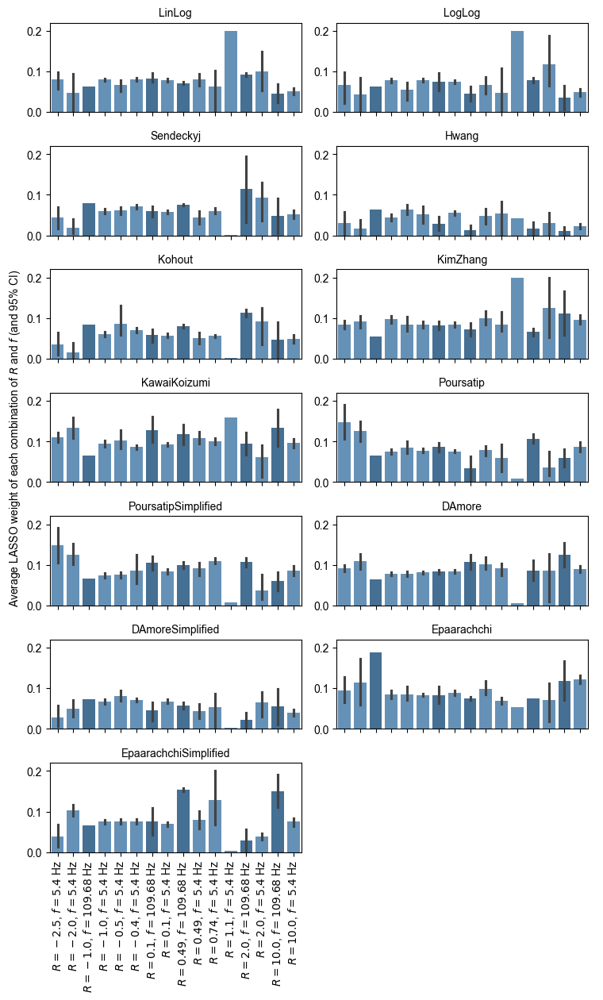

In [47]:
import seaborn as sns

rf_string = [f"$R={str(round(x, 2))}$, $f={str(round(y, 2))}$ Hz" for x, y in zip(r_centers, f_centers)]

plt.figure(figsize=(8, 13))
for idx, name in enumerate(order):
    ax = plt.subplot(len(emp_names)//2+1, 2, idx+1)
    r_order = sorted(np.unique(rf_string), key=lambda x: float(x.split("$, ")[0].split("R=")[-1]))
    sns.barplot(pd.DataFrame({"weight": weights[idx], "rf":rf_string, "hue":["109.68" in x for x in rf_string]}), x="rf", y="weight", ax=ax, hue="hue", order=r_order, palette=[tabensemb.utils.global_palette[4], lighten_color(tabensemb.utils.global_palette[4], 1.3)])
    
    ax.set_xlabel(None)
    if idx!=len(order)-1:
        ax.set_xticklabels([])
    else:
        plt.setp(
            ax.get_xticklabels(),
            rotation=90,
            va="center",
            ha="right",
            rotation_mode="anchor",
        )
    ax.set_title(name, fontsize=plt.rcParams["font.size"])
    ax.set_ylabel(None)
    ax.set_ylim([0, 0.22])
    ax.get_legend().remove()

ax = plt.subplot(111)
ax.set_frame_on(False)
ax.tick_params(
    labelcolor="none",
    which="both",
    top=False,
    bottom=False,
    left=False,
    right=False,
)
ax.set_ylabel(r"Average LASSO weight of each combination of $R$ and $f$ (and 95% CI)")
plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "empirical_models_usage_distribution_bar.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

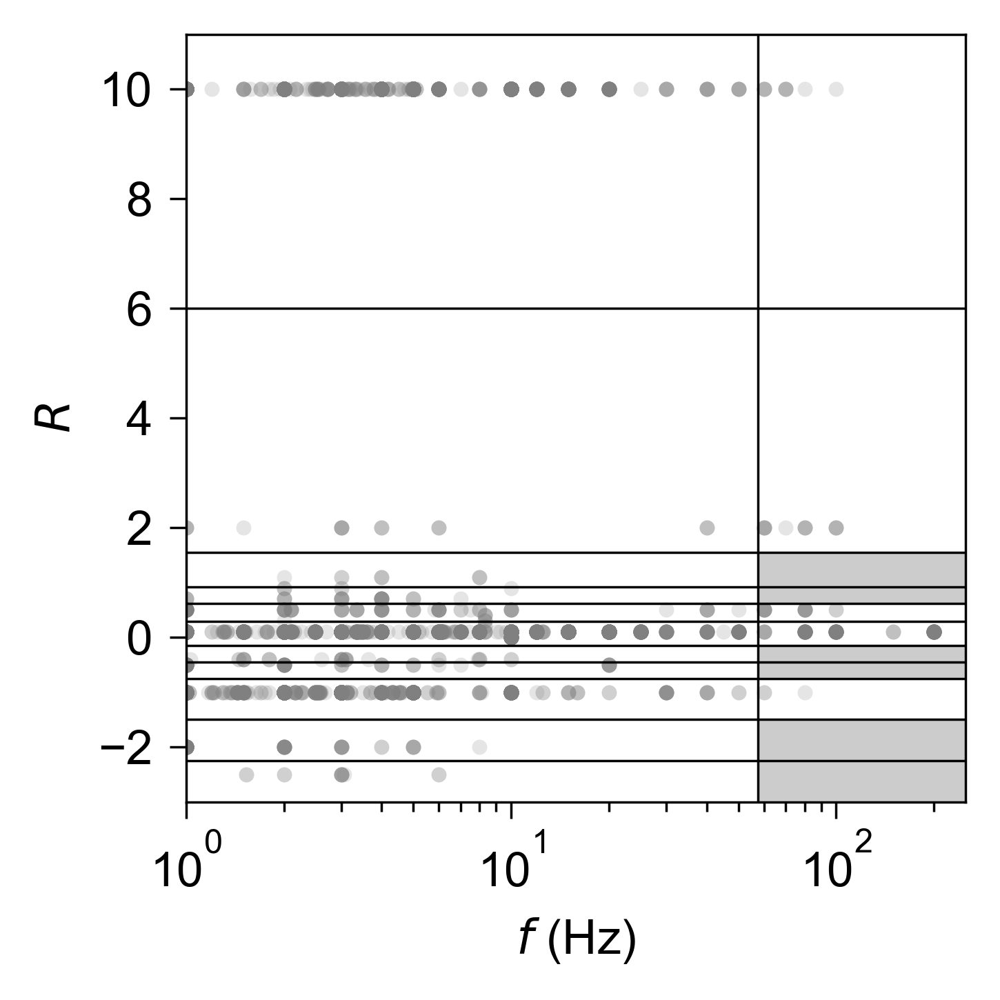

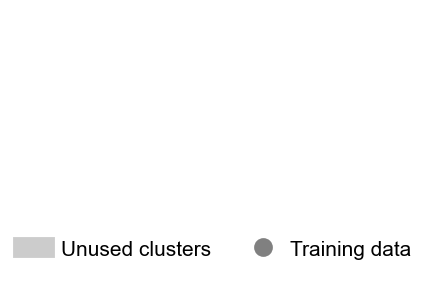

In [121]:
from scipy.spatial import Voronoi, voronoi_plot_2d
from itertools import product
from matplotlib.collections import PatchCollection
from matplotlib.patches import Polygon

redundant_cluster_centers = np.array([[f, r] for f, r in product(np.unique(f_centers), np.unique(r_centers))])
vor = Voronoi(points=np.vstack([redundant_cluster_centers, np.array([[9999, 9999], [-9999, 9999], [9999, -9999], [-9999, -9999]])]))
rf_string = [f"{x}, {y}" for x, y in zip(redundant_cluster_centers[:, 0], redundant_cluster_centers[:, 1])]

plt.figure(figsize=(3, 3), dpi=500)
ax = plt.subplot(111)
trainer_analysis.plot_scatter(x_col="Frequency", y_col="R-value", ax=ax, clr=["grey"], scatter_kwargs=dict(alpha=0.2, s=10, linewidth=0, rasterized=True), select_by_value_kwargs=dict(partition="train"))
voronoi_plot_2d(vor=vor, ax=ax, show_vertices=False, show_points=False, line_width=0.5)

weight_df = pd.DataFrame({"weight": weights[idx], "rf": [f"{x}, {y}" for x, y in zip(f_centers, r_centers)]})
avg_weights = [weight_df[weight_df["rf"]==rf]["weight"].mean() for rf in rf_string]
colors = [None if not np.isnan(x) else [0.8, 0.8, 0.8] for x in avg_weights]

for j, c in zip(range(redundant_cluster_centers.shape[0]), colors,):
    region = vor.regions[vor.point_region[j]]
    if not -1 in region and c is not None:
        polygon = Polygon([vor.vertices[i] for i in region], facecolor=c, linewidth=0)
        ax.add_patch(polygon)

ax.set_xlim([1, 250])
ax.set_ylim(-3, 11)
ax.set_xscale("log")

ax.set_ylabel("R-value")
ax.set_xlabel("Frequency (Hz)")
set_linewidth(ax)
replace_feature_names(ax)
plt.savefig(os.path.join(trainer.project_root, "f_r_voronoi.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

plt.figure(figsize=(2,2), dpi=150)
ax = plt.subplot(111)
ax.set_frame_on(False)
ax.tick_params(
    labelcolor="none",
    which="both",
    top=False,
    bottom=False,
    left=False,
    right=False,
)

from matplotlib.lines import Line2D
ax.legend(handles=[Line2D([], [], linewidth=10, color=[0.8, 0.8, 0.8]), Line2D([], [], linewidth=0, marker="o", markersize=8, markerfacecolor="grey", markeredgecolor="grey")], labels=["Unused clusters", "Training data"], frameon=False, handlelength=1, ncols=2, bbox_to_anchor=(1.25, -0.05))


plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "f_r_voronoi_legend.jpg"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

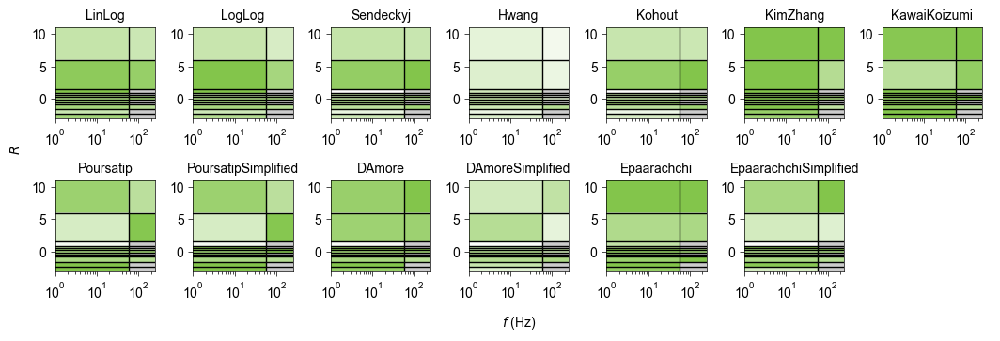

In [125]:
from scipy.spatial import Voronoi, voronoi_plot_2d
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.collections import PatchCollection
from matplotlib.patches import Polygon
from PIL import ImageColor
from itertools import product
redundant_cluster_centers = np.array([[f, r] for f, r in product(np.unique(f_centers), np.unique(r_centers))])
vor = Voronoi(points=np.vstack([redundant_cluster_centers, np.array([[9999, 9999], [-9999, 9999], [9999, -9999], [-9999, -9999]])]))

rf_string = [f"{x}, {y}" for x, y in zip(redundant_cluster_centers[:, 0], redundant_cluster_centers[:, 1])]

plt.figure(figsize=(11, 4.1))

for idx, name in enumerate(order):
    
    ax = plt.subplot(2, 7, idx+1)
    weight_df = pd.DataFrame({"weight": weights[idx], "rf": [f"{x}, {y}" for x, y in zip(f_centers, r_centers)]})
    avg_weights = [weight_df[weight_df["rf"]==rf]["weight"].mean() for rf in rf_string]
    cmap = LinearSegmentedColormap.from_list("greens", [[1, 1, 1], lighten_color(tabensemb.utils.global_palette[1], 1.7)])
    colors = [cmap(round(min([max([x-0., 0])/0.11, 1])*256)) if not np.isnan(x) else [0.8, 0.8, 0.8] for x in avg_weights]

    # used_trainer.plot_scatter(x_col="Frequency", y_col="R-value", ax=ax, clr=["grey"], scatter_kwargs=dict(alpha=0.1, s=5), select_by_value_kwargs=dict(partition="train"))

    voronoi_plot_2d(vor=vor, ax=ax, show_vertices=False, show_points=False, linewidth=0.5)

    for j, c in zip(range(redundant_cluster_centers.shape[0]), colors,):
        region = vor.regions[vor.point_region[j]]
        if not -1 in region:
            polygon = Polygon([vor.vertices[i] for i in region], facecolor=c, linewidth=0)
            ax.add_patch(polygon)
            # plt.fill(*zip(*polygon), "grey", alpha=0.2)
        else:
            print([vor.vertices[i] for i in region])

    ax.set_xlim([1, 250])
    ax.set_ylim(-3, 11)
    ax.set_title(name, fontsize=plt.rcParams["font.size"]*1.)
    ax.set_xscale("log")
    set_linewidth(ax)

ax = plt.subplot(111)
ax.set_frame_on(False)
ax.tick_params(
    labelcolor="none",
    which="both",
    top=False,
    bottom=False,
    left=False,
    right=False,
)
ax.set_ylabel("R-value")
ax.set_xlabel("\nFrequency (Hz)")
replace_feature_names(ax)
plt.savefig(os.path.join(trainer.project_root, "empirical_models_usage_distribution.pdf"), dpi=500, bbox_inches="tight")
plt.show()    
plt.close()

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


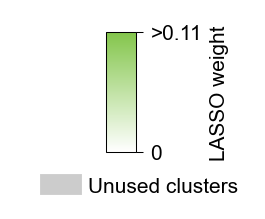

In [126]:
plt.figure(figsize=(2,2), dpi=150)
ax = plt.subplot(111)
ax.set_frame_on(False)
ax.tick_params(
    labelcolor="none",
    which="both",
    top=False,
    bottom=False,
    left=False,
    right=False,
)
a = np.array([[0,1]])
img = ax.imshow(a, cmap=cmap)
ax.set_xlim([-100, -99])
ax.set_ylim([-100, -99])
# ax.set_visible(False)

from matplotlib.lines import Line2D
ax.legend(handles=[Line2D([], [], linewidth=10, color=[0.8, 0.8, 0.8])], labels=["Unused clusters"], frameon=False, handlelength=1, bbox_to_anchor=(1.25, -0.05))

from mpl_toolkits.axes_grid1.inset_locator import inset_axes
inset_ax = inset_axes(ax, bbox_to_anchor=(0.4, 1.), width=0.2, height=0.8, bbox_transform=ax.transAxes)
plt.colorbar(mappable=img, orientation="vertical", cax=inset_ax)
set_linewidth(inset_ax)
inset_ax.set_yticks([0, 1])
inset_ax.set_yticklabels(["0", ">0.11"])
inset_ax.set_ylabel("LASSO weight")


plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "empirical_models_usage_distribution_legend.jpg"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

### Weight versus modulus

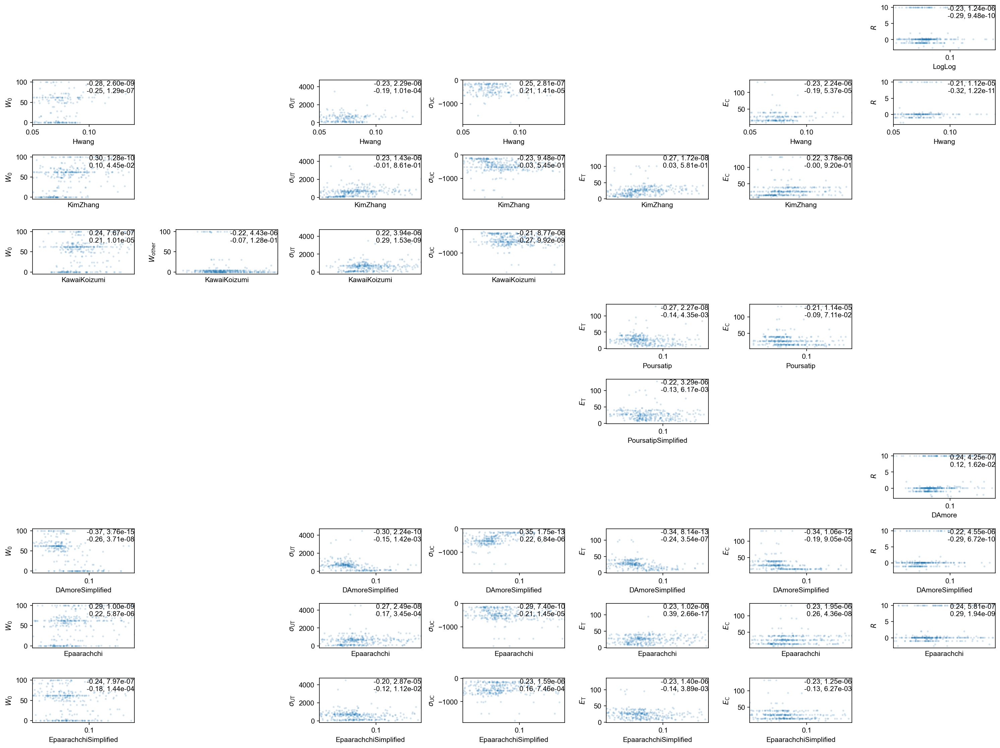

In [110]:
from itertools import product
from scipy.stats import spearmanr, pearsonr
from src.model._thiswork.clustering.base import AbstractPhyClustering

all_clustering_features_idx = AbstractPhyClustering.basic_clustering_features_idx(trainer_analysis.datamodule)
all_clustering_features = list(np.array(trainer_analysis.cont_feature_names)[all_clustering_features_idx])
weight_corr = pd.DataFrame(data=np.vstack([weights, np.array(cluster_feature_center).T]).T, columns=order+all_clustering_features).corr(method="spearman").loc[order, all_clustering_features]
weight_corred = weight_corr.loc[weight_corr.index[np.where((np.abs(weight_corr)>0.2).sum(axis=1))[0]], weight_corr.columns[np.where((np.abs(weight_corr)>0.2).sum(axis=0))[0]]]

scaler = trainer_analysis.datamodule.dataprocessors[-1].transformer

plt.figure(figsize=(20,15), dpi=150)
for i, (idx, col) in enumerate(product(weight_corred.index, weight_corred.columns)):
    x = weights[order.index(idx)]
    y = np.array(cluster_feature_center)[:, (all_clustering_features).index(col)]
    y = y*scaler.scale_[trainer_analysis.cont_feature_names.index(col)]+scaler.mean_[trainer_analysis.cont_feature_names.index(col)]
    r_sp = spearmanr(x, y)
    r_pr = pearsonr(x, y)
    if np.abs(r_sp.statistic)<0.2:
        continue
    ax = plt.subplot(len(weight_corred.index), len(weight_corred.columns), i+1)
    # ags_x = np.argsort(x)
    # ags_y = np.argsort(y)
    # rank_x = [list(ags_x).index(k) for k in range(len(x))]
    # rank_y = [list(ags_y).index(k) for k in range(len(x))]
    # ax.scatter(rank_x, rank_y, s=7, alpha=0.2, linewidth=0)
    ax.scatter(x, y, s=7, alpha=0.2, linewidth=0)

    ax.set_xlabel(idx)
    ax.set_ylabel(col)
    replace_feature_names(ax)
    ax.text(1,1,f"{r_sp.statistic:.2f}, {r_sp.pvalue:.2e}\n{r_pr.statistic:.2f}, {r_pr.pvalue:.2e}",ha="right", va="top", transform=ax.transAxes)
    ax.set_xlim([0.05, 0.14])

plt.show()
plt.close()

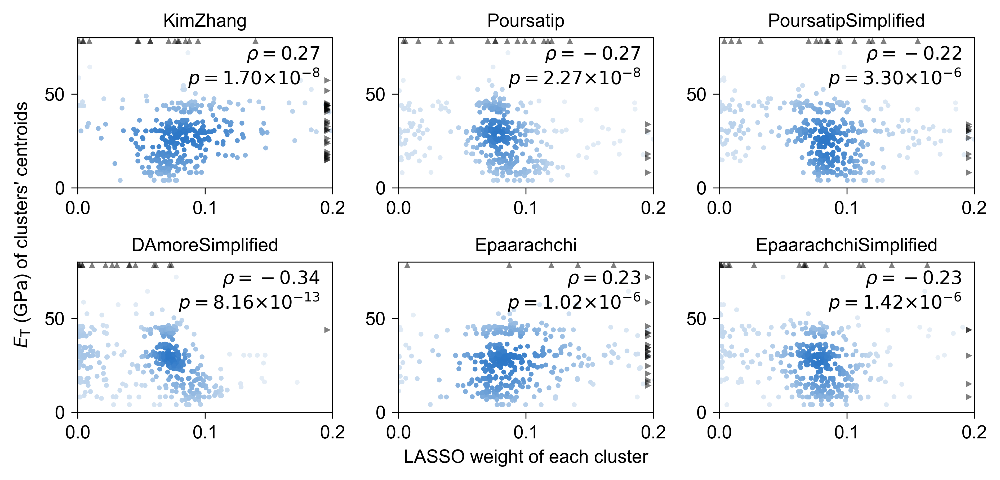

In [111]:
import scipy.stats as st
from matplotlib.colors import LinearSegmentedColormap

cm = LinearSegmentedColormap.from_list("kde", [[233/255, 240/255, 247/255],[44/255, 119/255, 199/255]])

scaler = trainer_rd_622.datamodule.dataprocessors[-1].transformer

plt.figure(figsize=(8,4), dpi=500)
for i, name in enumerate(["KimZhang", "Poursatip", "PoursatipSimplified", "DAmoreSimplified", "Epaarachchi", "EpaarachchiSimplified"]):
    x = weights[order.index(name)]
    y = np.array(cluster_feature_center)[:, (all_clustering_features).index("Tensile Modulus")]
    y = y*scaler.scale_[trainer_rd_622.cont_feature_names.index("Tensile Modulus")]+scaler.mean_[trainer_rd_622.cont_feature_names.index("Tensile Modulus")]
    r_sp = spearmanr(x, y)
    r_pr = pearsonr(x, y)

    xy = np.hstack([x.reshape(-1, 1), y.reshape(-1, 1)]).T
    z = st.gaussian_kde(xy)(xy)

    ax = plt.subplot(2, 3, i+1)
    ax.scatter(x, y, s=7, alpha=1, linewidth=0, c=z, cmap=cm, rasterized=True)

    ax.set_title(name, fontsize=plt.rcParams["font.size"])
    ax.set_xlabel(None)
    replace_feature_names(ax)
    set_linewidth(ax)
    plot_outliers(x, y, ax, left=0.0, right=0.2, top=80, scatter_kwargs=dict(color="k", alpha=0.5))
    ax.text(0.95,0.95,r"$\rho$"+f"$={r_sp.statistic:.2f}$\n$p=${to_scientific_notation(r_sp.pvalue)}",ha="right", va="top", transform=ax.transAxes)
    ax.set_xlim([0.0, 0.2])
    ax.set_ylim([0, 80])

    ax.set_xticks([0.0, 0.1, 0.2])
    ax.set_xticklabels([0.0, 0.1, 0.2])
ax = plt.subplot(111)
ax.set_frame_on(False)
ax.tick_params(
    labelcolor="none",
    which="both",
    top=False,
    bottom=False,
    left=False,
    right=False,
)
ax.set_ylabel("Tensile Modulus (GPa) of clusters' centroids")
ax.set_xlabel("LASSO weight of each cluster")
replace_feature_names(ax)
plt.savefig(os.path.join(trainer.project_root, "empirical_models_usage_trend.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

### Visualization of error per cluster per empirical model

Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


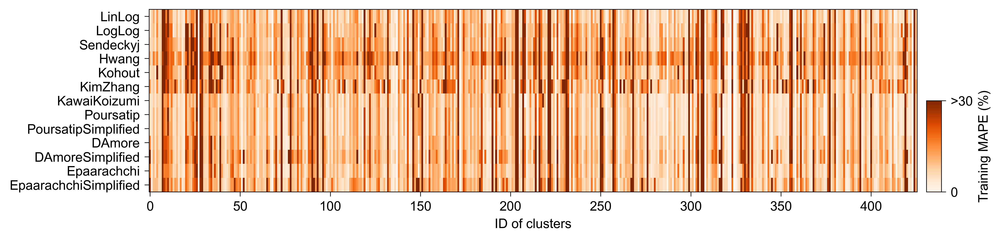

In [36]:
from matplotlib.gridspec import GridSpec

fig = plt.figure(figsize=(11, 2.5),dpi=500)
gs = GridSpec(100, 100, figure=fig)
ax = fig.add_subplot(gs[:, 0:95])
err = np.array(cluster_phy_resp_err).T
err[err>0.3]=0.3
err = err[names_sort_args, :]
im = ax.imshow(err, cmap="Oranges")
ax.set_aspect("auto")
ax.set_yticks(list(range(len(emp_names))))
ax.set_yticklabels(order)
set_linewidth(ax)
cax = fig.add_subplot(gs[50:, 96:98])
cbar = plt.colorbar(cax=cax, mappable=im)
cax.set_yticks(cax.get_ylim())
cax.set_yticklabels(["0", ">30"])
cax.set_ylabel("Training MAPE (%)")
set_linewidth(cax)
# plt.colorbar(im)
ax.set_xlabel(f"ID of clusters")
plt.savefig(os.path.join(trainer.project_root, "phys_cluster_err.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

### MAPE of each empirical model

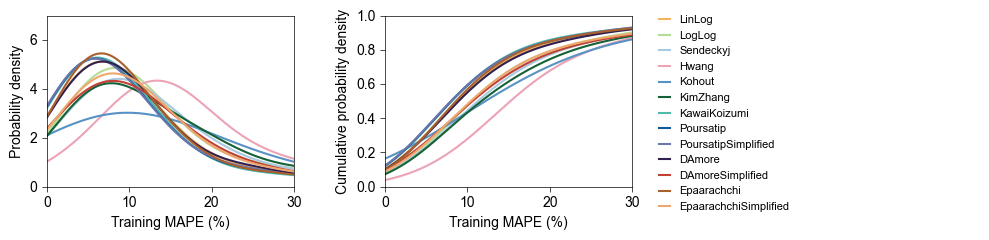

In [39]:
import seaborn as sns

order = ["LinLog", "LogLog", "Sendeckyj", "Hwang", "Kohout", "KimZhang", "KawaiKoizumi", "Poursatip", "PoursatipSimplified", "DAmore", "DAmoreSimplified", "Epaarachchi", "EpaarachchiSimplified"]
names_sort_args = np.array([emp_names.index(x) for x in order])

plt.figure(figsize=(10,2.5))
ax = plt.subplot(131)
err = (np.array(cluster_phy_resp_err).T)[names_sort_args, :]
for idx, name in enumerate(order):
    sns.kdeplot(err[idx], label=name, ax=ax, color=tabensemb.utils.global_palette[idx], gridsize=1000)
# ax.legend(frameon=False, loc="upper right", ncols=1, handlelength=1, fontsize=plt.rcParams["font.size"]*0.6)
handles, labels = ax.get_legend_handles_labels()
ax.set_xlim([0, 0.3])
multiply_xticklabels(ax)
ax.set_ylim([0, 7])
ax.set_xlabel(f"Training MAPE (%)")
ax.set_ylabel("Probability density")
set_linewidth(ax)


ax = plt.subplot(132)
for idx, name in enumerate(order):
    sns.kdeplot(err[idx], label=name, ax=ax, color=tabensemb.utils.global_palette[idx], gridsize=1000, cumulative=True)
ax.set_xlim([0, 0.3])
multiply_xticklabels(ax)
ax.set_ylim([0, 1])
ax.set_xlabel(f"Training MAPE (%)")
ax.set_ylabel(f"Cumulative probability density")
set_linewidth(ax)


ax = plt.subplot(133)
ax.set_frame_on(False)
ax.tick_params(
    labelcolor="none",
    which="both",
    top=False,
    bottom=False,
    left=False,
    right=False,
)
ax.legend(handles, labels, ncols=1, handlelength=1, frameon=False, loc="upper left", fontsize=plt.rcParams["font.size"]*0.8, bbox_to_anchor=(-0.3, 1.06))


plt.savefig(os.path.join(trainer.project_root, "phys_resp_err_kde.pdf"), dpi=500)
plt.show()
plt.close()

### Compare prediction errors of empirical models in three scenarios

Here, 6:2:2 is used instead of 8:1:1 because conclusions are derived from the testing set now.

In [18]:
sc_pred_inspects = inspect_all_models(trainer_sc_622, "PHYSICS_NoPCA_3L_KMeans", partition="test")
sc_cluster_phy_resp_err=sc_pred_inspects["cluster_phy_resp_err"]
et_pred_inspects = inspect_all_models(trainer_et_622, "PHYSICS_NoPCA_3L_KMeans", partition="test")
et_cluster_phy_resp_err=et_pred_inspects["cluster_phy_resp_err"]
rd_pred_inspects = inspect_all_models(trainer_rd_622, "PHYSICS_NoPCA_3L_KMeans", partition="test")
rd_cluster_phy_resp_err=rd_pred_inspects["cluster_phy_resp_err"]

  0%|          | 0/25 [00:00<?, ?it/s]

/home/xlluo/anaconda3/envs/tabular_ensemble/lib/python3.10/site-packages/pytorch_tabular/models/mixture_density/mdn.py:25: UserWarning: Wandb not installed. WandbLogger will not work.
  warnings.warn("Wandb not installed. WandbLogger will not work.")


Theoretical accuracy at PoF=50% (gaussian distribution):
	 Training MSE 0.03897, RMSE 0.19741
	 Validation MSE 0.04284, RMSE 0.20697
	 Testing MSE 0.06264, RMSE 0.25028
	 Overall MSE 0.04435, RMSE 0.21059


  0%|          | 0/25 [00:00<?, ?it/s]

Theoretical accuracy at PoF=50% (gaussian distribution):
	 Training MSE 0.04471, RMSE 0.21144
	 Validation MSE 0.03584, RMSE 0.18931
	 Testing MSE 0.05537, RMSE 0.23531
	 Overall MSE 0.04507, RMSE 0.21229


  0%|          | 0/25 [00:00<?, ?it/s]

Theoretical accuracy at PoF=50% (gaussian distribution):
	 Training MSE 0.04478, RMSE 0.21162
	 Validation MSE 0.04283, RMSE 0.20695
	 Testing MSE 0.04815, RMSE 0.21944
	 Overall MSE 0.04507, RMSE 0.21229


NameError: name 'Line2D' is not defined

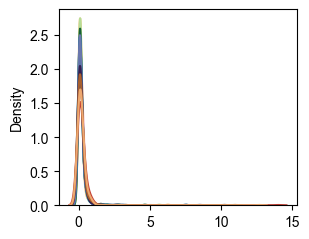

In [21]:
import seaborn as sns
from matplotlib.lines import Line2D

order = ["LinLog", "LogLog", "Sendeckyj", "Hwang", "Kohout", "KimZhang", "KawaiKoizumi", "Poursatip", "PoursatipSimplified", "DAmore", "DAmoreSimplified", "Epaarachchi", "EpaarachchiSimplified"]
names_sort_args = np.array([emp_names.index(x) for x in order])

plt.figure(figsize=(8.3,2.5))
ax = plt.subplot(131)
err = (np.array(rd_cluster_phy_resp_err).T)[names_sort_args, :]
for idx, name in enumerate(order):
    sns.kdeplot(err[idx], label=name, ax=ax, color=tabensemb.utils.global_palette[idx], gridsize=1000)
for child in ax.get_children():
    if isinstance(child, Line2D):
        x, y = child.get_data()
        c = child.get_c()
        l = child.get_label()
        ax.scatter([x[np.argmax(y)]], y[np.argmax(y)], color=c, s=12, zorder=order.index(l))
# ax.legend(frameon=False, loc="upper right", ncols=1, handlelength=1, fontsize=plt.rcParams["font.size"]*0.6)
ax.text(0.97, 0.97, "Scenario A\nInterpolation", transform=ax.transAxes, ha="right", va="top")
handles, labels = ax.get_legend_handles_labels()
ax.set_xlim([0, 0.4])
ax.set_ylim(bottom=0)
ax.set_xlabel(f"Testing MAPE (%)")
ax.set_ylabel(None)
set_linewidth(ax)
multiply_xticklabels(ax)

ax = plt.subplot(132)
err = (np.array(sc_cluster_phy_resp_err).T)[names_sort_args, :]
for idx, name in enumerate(order):
    sns.kdeplot(err[idx], label=name, ax=ax, color=tabensemb.utils.global_palette[idx], gridsize=1000)
for child in ax.get_children():
    if isinstance(child, Line2D):
        x, y = child.get_data()
        c = child.get_c()
        l = child.get_label()
        ax.scatter([x[np.argmax(y)]], y[np.argmax(y)], color=c, s=12, zorder=order.index(l))
# ax.legend(frameon=False, loc="upper right", ncols=1, handlelength=1, fontsize=plt.rcParams["font.size"]*0.6)
handles, labels = ax.get_legend_handles_labels()
ax.text(0.97, 0.97, "Scenario B\nExtrapolation", transform=ax.transAxes, ha="right", va="top")
ax.set_xlim([0, 0.4])
ax.set_ylim(bottom=0)
ax.set_xlabel(f"Testing MAPE (%)")
ax.set_ylabel(None)
set_linewidth(ax)
multiply_xticklabels(ax)

ax = plt.subplot(133)
err = (np.array(et_cluster_phy_resp_err).T)[names_sort_args, :]
for idx, name in enumerate(order):
    sns.kdeplot(err[idx], label=name, ax=ax, color=tabensemb.utils.global_palette[idx], gridsize=1000)
for child in ax.get_children():
    if isinstance(child, Line2D):
        x, y = child.get_data()
        c = child.get_c()
        l = child.get_label()
        ax.scatter([x[np.argmax(y)]], y[np.argmax(y)], color=c, s=12, zorder=order.index(l))
# ax.legend(frameon=False, loc="upper right", ncols=1, handlelength=1, fontsize=plt.rcParams["font.size"]*0.6)
handles, labels = ax.get_legend_handles_labels()
ax.text(0.97, 0.97, "Scenario C\nExtreme extrapolation", transform=ax.transAxes, ha="right", va="top")
ax.set_xlim([0, 0.4])
ax.set_ylim(bottom=0)
ax.set_xlabel(f"Testing MAPE (%)")
ax.set_ylabel(None)
set_linewidth(ax)
multiply_xticklabels(ax)

plt.savefig(os.path.join(trainer.project_root, "phys_resp_test_err_kde.pdf"), dpi=500)
plt.show()
plt.close()

## Explainable AI

### Feature importance

Feature importance values are calculated on the training set to evaluate what the model has learned. In this notebook values are loaded from a pickle file obtained by the `calculate_importance.py` script.

In [53]:
import seaborn as sns

def plot_importance_top10(importance, feature_names, ax, xlabel, orient="h"):
    importance_df = pd.concat([pd.DataFrame({"importance": impor, "features": feature_names, "type": trainer.datamodule.get_feature_types(feature_names)}) for impor in importance])
    order = np.array(feature_names)[np.argsort(np.median(np.array(importance), axis=0))]

    sns.boxplot(data=importance_df, x="importance" if orient=="h" else "features", y="features" if orient=="h" else "importance", orient=orient, hue="type", ax=ax, order=order[::-1], linewidth=0.5, saturation=1, palette=tabensemb.utils.global_palette[:5], fliersize=2, flierprops=dict(alpha=0.5), hue_order=trainer.datamodule.unique_feature_types_with_derived())
    ax.get_legend().set(title=False)
    ax.get_legend().set_frame_on(False)
    set_linewidth(ax)
    replace_feature_names(ax)
    ax.set_ylabel(None)
    ax.set_xlabel(xlabel)

In [30]:
leaderboard = trainer_analysis.leaderboard.sort_values(by="Testing MAPE")
program = "ThisWork"
model_names = leaderboard.loc[leaderboard["Program"] == program, "Model"][:10]
print(model_names)

perm_importance_train_ls = []

for model_name in model_names:
    print(model_name)
    perm_importance_train, feature_names = (
        trainer_analysis.cal_feature_importance(
            program=program,
            model_name=model_name,
            method="permutation",
            call_general_method=True,
            indices=trainer_analysis.train_indices,
            return_importance=False,
        )
    )
    perm_importance_train_ls.append(perm_importance_train)

0             AutoGluon_CatBoost_NoWrap_NoPCA_3L_KMeans
2              AutoGluon_XGBoost_NoWrap_NoPCA_3L_KMeans
5             AutoGluon_LightGBM_NoWrap_NoPCA_3L_KMeans
8     AutoGluon_Neural Network with PyTorch_NoWrap_N...
6           WideDeep_FTTransformer_Wrap_NoPCA_3L_KMeans
10       AutoGluon_Random Forest_NoWrap_NoPCA_3L_KMeans
9               WideDeep_TabResnet_Wrap_NoPCA_3L_KMeans
12           WideDeep_TabPerceiver_Wrap_NoPCA_3L_KMeans
11    AutoGluon_Extremely Randomized Trees_NoWrap_No...
15          WideDeep_TabFastFormer_Wrap_NoPCA_3L_KMeans
Name: Model, dtype: object
AutoGluon_CatBoost_NoWrap_NoPCA_3L_KMeans


numpy.ufunc size changed, may indicate binary incompatibility. Expected 216 from C header, got 232 from PyObject


AutoGluon_XGBoost_NoWrap_NoPCA_3L_KMeans
AutoGluon_LightGBM_NoWrap_NoPCA_3L_KMeans
AutoGluon_Neural Network with PyTorch_NoWrap_NoPCA_3L_KMeans
WideDeep_FTTransformer_Wrap_NoPCA_3L_KMeans
AutoGluon_Random Forest_NoWrap_NoPCA_3L_KMeans
WideDeep_TabResnet_Wrap_NoPCA_3L_KMeans
WideDeep_TabPerceiver_Wrap_NoPCA_3L_KMeans
AutoGluon_Extremely Randomized Trees_NoWrap_NoPCA_3L_KMeans
WideDeep_TabFastFormer_Wrap_NoPCA_3L_KMeans


TypeError: '_io.BufferedWriter' object cannot be interpreted as an integer

In [31]:
import pickle

with open(os.path.join(trainer.project_root, "perm_train.pkl"), "wb") as file:
    pickle.dump(
        (perm_importance_train_ls, feature_names), file
    )

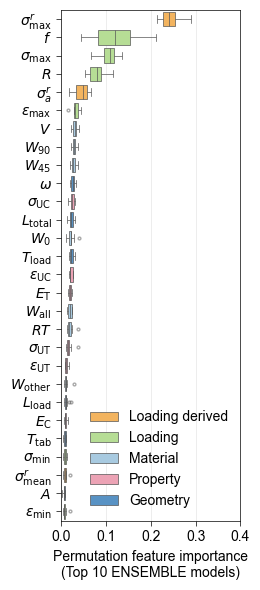

In [9]:
import pickle

with open(os.path.join(trainer.project_root, "perm_train.pkl"), "rb") as file:
    perm_importance_train_ls, feature_names = pickle.load(file)

plt.figure(figsize=(2.7,6))
ax = plt.subplot(111)
plot_importance_top10(importance=perm_importance_train_ls, feature_names=feature_names, ax=ax, xlabel="Permutation feature importance\n(Top 10 ENSEMBLE models)")
ax.set_xlim(0, 0.4)
for i in [0, 0.1, 0.2, 0.3, 0.4]:
    ax.plot([i, i], ax.get_ylim(), linewidth=0.5, color="grey", zorder=-1, alpha=0.2)

replace_legend_labels(ax, {"Derived": "Loading derived", "Specimen": "Geometry"}, dict(title=False, frameon=False))
plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "perm_importance.pdf"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

In [45]:
import pickle

with open(os.path.join(trainer.project_root, "shap_train_ensemble.pkl"), "rb") as file:
    explainers, explanations, shap_importance_train_ls, feature_names = pickle.load(file)
    # explainers, explanations, shap_importance_train_ls = explainers[:5], explanations[:5], shap_importance_train_ls[:5]

shap_matrix = np.array(shap_importance_train_ls)
predictions = np.array([shap.sum(-1)+exp.base_values for shap, exp in zip(shap_importance_train_ls, explanations)]).mean(0)

In [46]:
cont_imputed_mask = trainer_analysis.datamodule.cont_imputed_mask.loc[trainer_analysis.train_indices, :]
cat_imputed_mask = trainer_analysis.datamodule.cat_imputed_mask.loc[trainer_analysis.train_indices, :]
X_train_not_imputed = trainer_analysis.datamodule.categories_transform(trainer_analysis.datamodule.get_not_imputed_df().loc[trainer_analysis.train_indices, :])
shap_matrix_not_imputed = shap_matrix.copy()
for feature in trainer_analysis.all_feature_names:
    missing = np.where(cont_imputed_mask[feature]==1 if feature in trainer_analysis.cont_feature_names else cat_imputed_mask[feature]==1)[0]
    shap_matrix_not_imputed[:, missing, feature_names.index(feature)] = np.nan

In [9]:
X_train_not_imputed[feature_names]

,Fiber Volume Fraction,Fiber Weight Fraction,Fiber Weight Fraction (0-deg),Fiber Weight Fraction (45-deg),Fiber Weight Fraction (90-deg),Fiber Weight Fraction (Other Dir.),Thickness,Tab Thickness,Width,Length,...,Ultimate Tensile Stress,Ultimate Compressive Stress,Tensile Modulus,Compressive Modulus,Ultimate Tensile Strain,Ultimate Compressive Strain,Relative Maximum Stress,Relative Stress Amplitude,Relative Mean Stress,Resin Type
4637,61.0,NaN,100.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,...,1176.000000,NaN,NaN,NaN,NaN,NaN,0.661565,0.297704,0.363861,1
1366,52.0,NaN,64.0,35.0,0.0,1.0,3.960,NaN,NaN,NaN,...,552.000000,NaN,22.500000,NaN,2.410000,NaN,0.311594,0.140217,0.171377,0
6555,38.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,30.00,250.00,...,572.000000,-547.000000,25.400000,25.5000,2.250000,-2.140000,0.532867,0.532867,0.000000,0
4074,41.0,NaN,0.0,0.0,0.0,100.0,3.000,NaN,25.00,NaN,...,121.333333,-154.000000,10.466667,NaN,19.666667,NaN,0.568681,0.255907,0.312775,4
5738,NaN,67.5,NaN,NaN,NaN,NaN,4.495,NaN,19.79,145.19,...,NaN,NaN,38.287500,38.2875,NaN,NaN,0.470274,0.470274,0.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1928,39.0,NaN,48.0,70.0,30.0,0.0,6.580,NaN,25.00,NaN,...,572.818182,-372.666667,24.887500,NaN,2.253333,NaN,0.481828,0.216823,0.265006,1
2448,44.0,NaN,63.0,37.0,0.0,0.0,2.740,NaN,25.00,NaN,...,682.333333,-540.666667,26.266667,NaN,2.593333,NaN,0.303371,0.136517,0.166854,1
387,58.2,NaN,92.0,0.0,8.0,0.0,5.030,NaN,NaN,NaN,...,NaN,-634.833333,NaN,NaN,NaN,-1.496667,0.652140,0.293463,0.358677,0
136,55.7,NaN,50.0,0.0,50.0,0.0,4.550,NaN,NaN,NaN,...,NaN,-630.875000,NaN,61.6700,NaN,-1.110000,0.928869,0.417991,0.510878,0


In [10]:
shap_matrix_not_imputed[0, :, :]

array([[-0.09507958,         nan,  0.28854843, ..., -0.24961629,
        -0.03661744, -0.10815596],
       [-0.09175585,         nan, -0.05439833, ...,  0.29250629,
         0.05942204,  0.14664059],
       [ 0.21991881,         nan,         nan, ..., -0.52375079,
        -0.01305357,  0.09992631],
       ...,
       [ 0.09707463,         nan,  0.38606204, ..., -0.16061642,
        -0.02406938,  0.18840984],
       [ 0.38254953,         nan, -0.05369456, ..., -0.09285642,
         0.12461723,  0.14033355],
       [ 0.43034166,         nan,  0.2088122 , ..., -0.40013723,
        -0.0273924 ,  0.04586503]])

In [11]:
np.mean([explanation.base_values for explanation in explanations]), np.std([explanation.base_values for explanation in explanations])

(4.853550179460706, 0.019108740731843026)

In [47]:
shap_high_features = np.array(feature_names)[np.median(np.nanmean(np.abs(shap_matrix), axis=1), axis=0)>0.1]
shap_high_features

array(['Fiber Weight Fraction (0-deg)', 'Maximum Stress',
       'Maximum Strain', 'R-value', 'Frequency',
       'Ultimate Compressive Stress', 'Relative Maximum Stress',
       'Relative Stress Amplitude', 'Resin Type'], dtype='<U34')

In [44]:
low_correlation_features

,feature,correlation
13,Minimum Stress,0.039887
22,Ultimate Tensile Strain,0.031340
9,Length,0.012264
7,Tab Thickness,0.012100
19,Ultimate Compressive Stress,0.008035
5,Fiber Weight Fraction (Other Dir.),0.003148
10,Load Length,0.000225
1,Fiber Weight Fraction,-0.003756
11,Area,-0.004964
20,Tensile Modulus,-0.019612


In [46]:
[x for x in shap_high_features if x in list(low_correlation_features["feature"])]

['Maximum Stress', 'R-value', 'Ultimate Compressive Stress']

The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
Mean of empty slice


Processing Relative Maximum Stress
Processing Frequency
Processing Maximum Stress
Processing Relative Stress Amplitude
Processing Maximum Strain
Processing Fiber Weight Fraction (0-deg)
Processing Ultimate Compressive Stress
Processing R-value
Processing Fiber Weight Fraction (45-deg)
Processing Fiber Volume Fraction
Processing Width
Processing Tensile Modulus
Processing Ultimate Tensile Stress
Processing Thickness
Processing Ultimate Compressive Strain
Processing Fiber Weight Fraction (90-deg)
Processing Minimum Stress
Processing Relative Mean Stress
Processing Fiber Weight Fraction
Processing Area
Processing Compressive Modulus
Processing Length
Processing Ultimate Tensile Strain
Processing Fiber Weight Fraction (Other Dir.)
Processing Minimum Strain
Processing Load Length
Processing Tab Thickness


This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


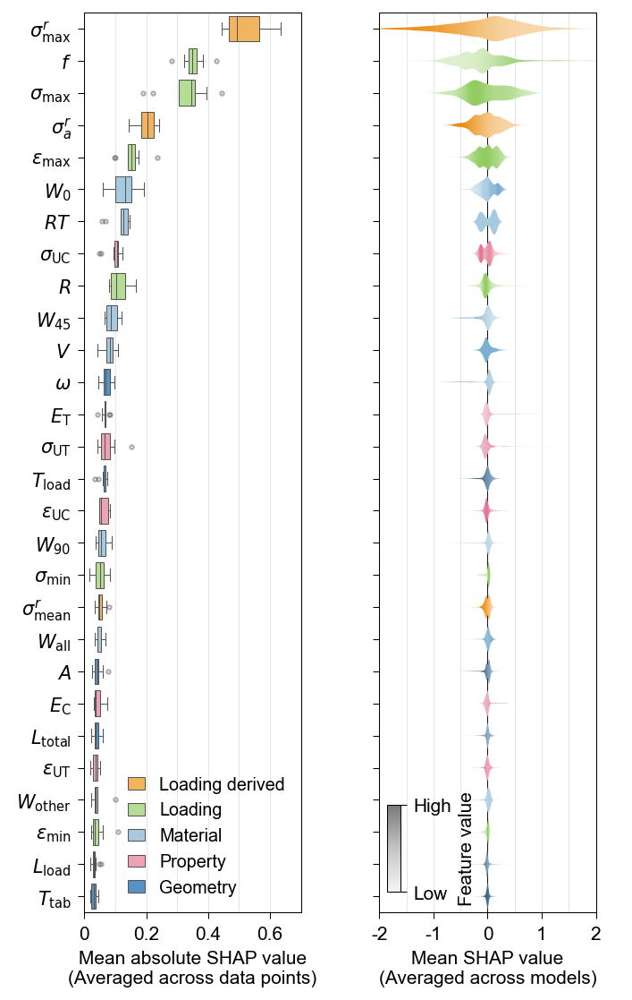

In [50]:
plt.figure(figsize=(5.5,7), dpi=150)
ax = plt.subplot(121)

plot_importance_top10(importance=[x.squeeze(0) for x in np.split(np.nanmean(np.abs(shap_matrix), axis=1), indices_or_sections=shap_matrix_not_imputed.shape[0], axis=0)], feature_names=feature_names, ax=ax, xlabel="Mean absolute SHAP value\n(Top 10 models)")

replace_legend_labels(ax, {"Derived": "Loading derived", "Specimen": "Geometry"}, dict(title=False, frameon=False, handlelength=1, fontsize=plt.rcParams["font.size"]*0.95, loc="lower right"))
ax.set_xlabel("Mean absolute SHAP value\n(Averaged across data points)")
ax.set_xlim(0, 0.7)
for i in [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7]:
    ax.plot([i, i], ax.get_ylim(), linewidth=0.5, color="grey", zorder=-1, alpha=0.2)
ax.set_xticks([0, 0.2, 0.4, 0.6])
ax.set_xticklabels([0, 0.2, 0.4, 0.6])

ax = plt.subplot(122)

importance = [x.squeeze(0) for x in np.split(np.nanmean(shap_matrix,axis=0), indices_or_sections=shap_matrix.shape[1], axis=0)]
importance_df = pd.concat([pd.DataFrame({"importance": impor, "features": feature_names, "type": trainer.datamodule.get_feature_types(feature_names)}) for impor in importance])
order = np.array(feature_names)[np.argsort(np.median(np.abs(np.array([x.squeeze(0) for x in np.split(np.nanmean(np.abs(shap_matrix), axis=1), indices_or_sections=shap_matrix_not_imputed.shape[0], axis=0)])), axis=0))]

# sns.stripplot(data=importance_df, x="importance", y="features", orient="h", hue="type", ax=ax, order=order[::-1], palette=tabensemb.utils.global_palette[:5], size=3, alpha=0.1, rasterized=True, jitter=0.5)
sns.violinplot(data=importance_df, x="importance", y="features", orient="h", hue="type", ax=ax, order=order[::-1], palette=tabensemb.utils.global_palette[:5], inner=None, width=0.8, density_norm="count", linewidth=0, saturation=1, hue_order=trainer.datamodule.unique_feature_types_with_derived())

from matplotlib.path import Path
from matplotlib.patches import PathPatch
from matplotlib.collections import PolyCollection
from matplotlib.colors import LinearSegmentedColormap
from scipy.stats import gaussian_kde
from PIL import ImageColor
Nx,Ny=1000,1000
cmap="hsv"

ymin, ymax = ax.get_ylim()
xmin, xmax = ax.get_xlim()
mean_shap_matrix_not_imputed = np.nanmean(shap_matrix_not_imputed, axis=0)

for child in ax.get_children():
    if isinstance(child, PolyCollection):
        path = Path(child.get_paths()[0].vertices)
        patch = PathPatch(path, facecolor='none', edgecolor='none')
        ax.add_patch(patch)
        datalim = child.get_datalim(ax.transData)
        current_c = child.get_facecolor()
        idx = len(order) - int(round(np.mean([datalim.ymin,datalim.ymax]))) - 1
        feature_name = order[idx]
        if feature_name in trainer.cat_feature_names:
            continue
        x = X_train_not_imputed[feature_name].values.copy()
        y = mean_shap_matrix_not_imputed[:, feature_names.index(feature_name)]
        x[x>np.nanpercentile(x, 95)] = np.nanpercentile(x, 95)
        x[x<np.nanpercentile(x, 5)] = np.nanpercentile(x, 5)
        where_valid = np.where(1-np.isnan(x))[0]

        print(f"Processing {feature_name}")

        not_weighted = gaussian_kde(y[where_valid])(y[where_valid])
        weights = 1/not_weighted*(x[where_valid])
        weights = (weights-np.min(weights))/(np.max(weights)-np.min(weights))
        kde = gaussian_kde(y[where_valid], weights=weights)(np.linspace(datalim.xmin,datalim.xmax, Ny))
        # kde = (kde-np.min(kde))/(np.max(kde)-np.min(kde))
        imgArr = np.tile(kde, (Nx,1))
        # imgArr = np.tile(np.linspace(0, 1, Ny), (Nx,1))
        cmap = LinearSegmentedColormap.from_list("violin_part", [lighten_color(current_c, 0.4), lighten_color(current_c, 1.5)])
        img = ax.imshow(imgArr, origin="lower", extent=[datalim.xmin,datalim.xmax,datalim.ymin,datalim.ymax], aspect="auto", cmap=cmap, clip_path=patch)
        child.remove()

ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
ax.get_legend().remove()

ax_hidden = plt.subplot(111)
ax_hidden.set_frame_on(False)
ax_hidden.tick_params(
    labelcolor="none",
    which="both",
    top=False,
    bottom=False,
    left=False,
    right=False,
)
a = np.array([[0,1]])
img = ax_hidden.imshow(a, cmap="Greys")
ax_hidden.set_xlim([-100, -99])
ax_hidden.set_ylim([-100, -99])
# ax.set_visible(False)

from mpl_toolkits.axes_grid1.inset_locator import inset_axes
inset_ax = inset_axes(ax, bbox_to_anchor=(0.14, 0.13), width=0.1, height=0.65, bbox_transform=ax.transAxes)
plt.colorbar(mappable=img, orientation="vertical", cax=inset_ax)
set_linewidth(inset_ax)
inset_ax.set_ylim([0.1, 0.6])

inset_ax.set_yticks([0.1, 0.6])
inset_ax.set_yticklabels(["Low", "High"])
inset_ax.set_ylabel("Feature value")

# ax.get_legend().set(title=False, loc="lower left")
# ax.get_legend().set_frame_on(False)
set_linewidth(ax)
replace_feature_names(ax)
ax.set_ylabel(None)
ax.plot([0, 0], [-0.5, len(feature_names)-0.5], linewidth=0.5, color="k", zorder=-1)
ax.set_xlabel("Mean SHAP value\n(Averaged across models)")
ax.set_yticklabels([])
ax.set_xlim([-2, 2])
ax.set_xticks([-2, -1, 0, 1, 2])
ax.set_xticklabels([-2, -1, 0, 1, 2])
for i in [-2, -1.5, -1, -0.5, 0, 0.5, 1, 1.5, 2]:
    ax.plot([i, i], ax.get_ylim(), linewidth=0.5, color="grey", zorder=-1, alpha=0.2)
# ax.text(0.98, 0.01, f"Base value\n{np.mean([explanation.base_values for explanation in explanations]):.2f}", ha="right", va="bottom", transform=ax.transAxes)
# ax.set_xscale("log")
plt.savefig(os.path.join(trainer.project_root, "shap_importance.jpg"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
Mean of empty slice


Processing Relative Maximum Stress
Processing Frequency
Processing Maximum Stress
Processing Relative Stress Amplitude
Processing Maximum Strain
Processing Fiber Weight Fraction (0-deg)
Processing Ultimate Compressive Stress
Processing R-value
Processing Fiber Weight Fraction (45-deg)
Processing Fiber Volume Fraction
Processing Width
Processing Tensile Modulus
Processing Ultimate Tensile Stress
Processing Thickness
Processing Ultimate Compressive Strain
Processing Fiber Weight Fraction (90-deg)
Processing Minimum Stress
Processing Relative Mean Stress
Processing Fiber Weight Fraction
Processing Area
Processing Compressive Modulus
Processing Length
Processing Ultimate Tensile Strain
Processing Fiber Weight Fraction (Other Dir.)
Processing Minimum Strain
Processing Load Length
Processing Tab Thickness


This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


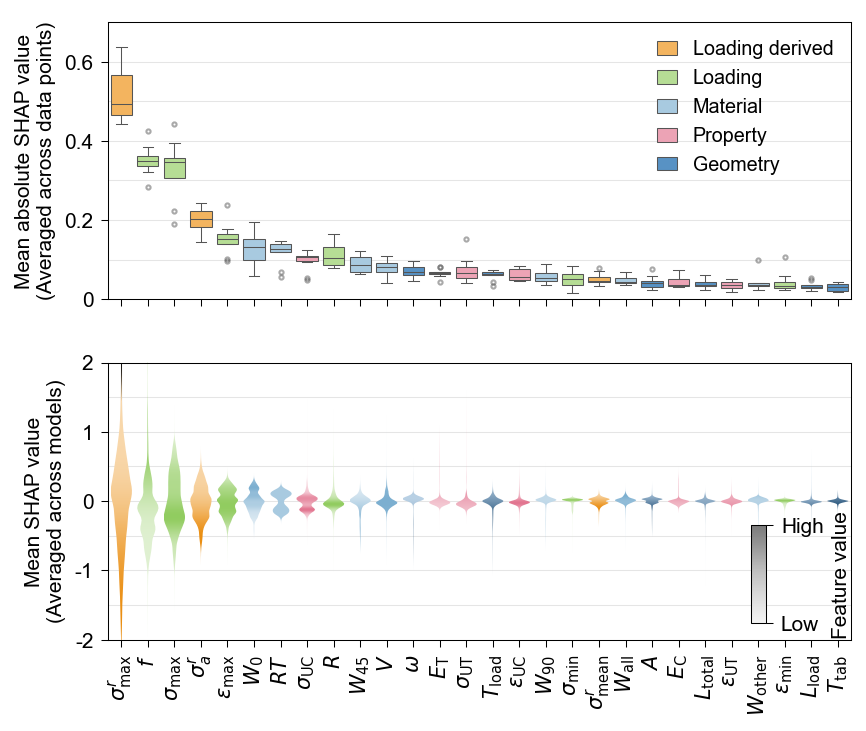

In [66]:
plt.figure(figsize=(6,5.2), dpi=150)
ax = plt.subplot(211)

plot_importance_top10(importance=[x.squeeze(0) for x in np.split(np.nanmean(np.abs(shap_matrix), axis=1), indices_or_sections=shap_matrix_not_imputed.shape[0], axis=0)], feature_names=feature_names, ax=ax, xlabel="Mean absolute SHAP value\n(Top 10 models)", orient="v")

replace_legend_labels(ax, {"Derived": "Loading derived", "Specimen": "Geometry"}, dict(title=False, frameon=False, handlelength=1, fontsize=plt.rcParams["font.size"]*0.95, loc="upper right"))
ax.set_ylabel("Mean absolute SHAP value\n(Averaged across data points)")
ax.set_ylim(0, 0.7)
for i in [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7]:
    ax.plot(ax.get_xlim(), [i, i], linewidth=0.5, color="grey", zorder=-1, alpha=0.2)
ax.set_yticks([0, 0.2, 0.4, 0.6])
ax.set_yticklabels([0, 0.2, 0.4, 0.6])
ax.set_xticklabels([])
ax.set_xlabel(None)


ax = plt.subplot(212)

importance = [x.squeeze(0) for x in np.split(np.nanmean(shap_matrix,axis=0), indices_or_sections=shap_matrix.shape[1], axis=0)]
importance_df = pd.concat([pd.DataFrame({"importance": impor, "features": feature_names, "type": trainer.datamodule.get_feature_types(feature_names)}) for impor in importance])
order = np.array(feature_names)[np.argsort(np.median(np.abs(np.array([x.squeeze(0) for x in np.split(np.nanmean(np.abs(shap_matrix), axis=1), indices_or_sections=shap_matrix_not_imputed.shape[0], axis=0)])), axis=0))]

# sns.stripplot(data=importance_df, x="importance", y="features", orient="h", hue="type", ax=ax, order=order[::-1], palette=tabensemb.utils.global_palette[:5], size=3, alpha=0.1, rasterized=True, jitter=0.5)
sns.violinplot(data=importance_df, y="importance", x="features", orient="v", hue="type", ax=ax, order=order[::-1], palette=tabensemb.utils.global_palette[:5], inner=None, width=0.8, density_norm="count", linewidth=0, saturation=1, hue_order=trainer.datamodule.unique_feature_types_with_derived())

from matplotlib.path import Path
from matplotlib.patches import PathPatch
from matplotlib.collections import PolyCollection
from matplotlib.colors import LinearSegmentedColormap
from scipy.stats import gaussian_kde
from PIL import ImageColor
Nx,Ny=1000,1000
cmap="hsv"

ymin, ymax = ax.get_ylim()
xmin, xmax = ax.get_xlim()
mean_shap_matrix_not_imputed = np.nanmean(shap_matrix_not_imputed, axis=0)

for child in ax.get_children():
    if isinstance(child, PolyCollection):
        path = Path(child.get_paths()[0].vertices)
        patch = PathPatch(path, facecolor='none', edgecolor='none')
        ax.add_patch(patch)
        datalim = child.get_datalim(ax.transData)
        current_c = child.get_facecolor()
        idx = len(order) - int(round(np.mean([datalim.xmin,datalim.xmax]))) - 1
        feature_name = order[idx]
        if feature_name in trainer.cat_feature_names:
            continue
        x = X_train_not_imputed[feature_name].values.copy()
        y = mean_shap_matrix_not_imputed[:, feature_names.index(feature_name)]
        x[x>np.nanpercentile(x, 95)] = np.nanpercentile(x, 95)
        x[x<np.nanpercentile(x, 5)] = np.nanpercentile(x, 5)
        where_valid = np.where(1-np.isnan(x))[0]

        print(f"Processing {feature_name}")

        not_weighted = gaussian_kde(y[where_valid])(y[where_valid])
        weights = 1/not_weighted*(x[where_valid])
        weights = (weights-np.min(weights))/(np.max(weights)-np.min(weights))
        kde = gaussian_kde(y[where_valid], weights=weights)(np.linspace(datalim.ymin,datalim.ymax, Ny))
        # kde = (kde-np.min(kde))/(np.max(kde)-np.min(kde))
        imgArr = np.tile(kde, (Nx,1)).transpose()
        # imgArr = np.tile(np.linspace(0, 1, Ny), (Nx,1))
        cmap = LinearSegmentedColormap.from_list("violin_part", [lighten_color(current_c, 0.4), lighten_color(current_c, 1.5)])
        img = ax.imshow(imgArr, origin="lower", extent=[datalim.xmin,datalim.xmax,datalim.ymin,datalim.ymax], aspect="auto", cmap=cmap, clip_path=patch)
        child.remove()

ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
ax.get_legend().remove()

ax_hidden = plt.subplot(111)
ax_hidden.set_frame_on(False)
ax_hidden.tick_params(
    labelcolor="none",
    which="both",
    top=False,
    bottom=False,
    left=False,
    right=False,
)
a = np.array([[0,1]])
img = ax_hidden.imshow(a, cmap="Greys")
ax_hidden.set_xlim([-100, -99])
ax_hidden.set_ylim([-100, -99])
# ax.set_visible(False)

from mpl_toolkits.axes_grid1.inset_locator import inset_axes
inset_ax = inset_axes(ax, bbox_to_anchor=(0.9, 0.45), width=0.1, height=0.65, bbox_transform=ax.transAxes)
plt.colorbar(mappable=img, orientation="vertical", cax=inset_ax)
set_linewidth(inset_ax)
inset_ax.set_ylim([0.1, 0.6])

inset_ax.set_yticks([0.1, 0.6])
inset_ax.set_yticklabels(["Low", "High"])
inset_ax.set_ylabel("Feature value")

# ax.get_legend().set(title=False, loc="lower left")
# ax.get_legend().set_frame_on(False)
set_linewidth(ax)
replace_feature_names(ax)
ax.set_ylabel(None)
ax.plot([0, 0], [-0.5, len(feature_names)-0.5], linewidth=0.5, color="k", zorder=-1)
ax.set_ylabel("Mean SHAP value\n(Averaged across models)")
# ax.set_yticklabels([])
ax.set_ylim([-2, 2])
ax.set_yticks([-2, -1, 0, 1, 2])
ax.set_yticklabels([-2, -1, 0, 1, 2])
for i in [-2, -1.5, -1, -0.5, 0, 0.5, 1, 1.5, 2]:
    ax.plot(ax.get_xlim(), [i, i], linewidth=0.5, color="grey", zorder=-1, alpha=0.2)
ax.set_xlabel(None)
plt.setp(
    ax.get_xticklabels(),
    rotation=90,
    va="center",
    ha="right",
    rotation_mode="anchor",
)
# ax.text(0.98, 0.01, f"Base value\n{np.mean([explanation.base_values for explanation in explanations]):.2f}", ha="right", va="bottom", transform=ax.transAxes)
# ax.set_xscale("log")
plt.savefig(os.path.join(trainer.project_root, "shap_importance_v.jpg"), dpi=500, bbox_inches="tight")
plt.show()
plt.close()

### Overview

Mean of empty slice
Mean of empty slice
Mean of empty slice
Mean of empty slice
Mean of empty slice
Mean of empty slice
Mean of empty slice
Mean of empty slice
Mean of empty slice
Mean of empty slice
Mean of empty slice
Mean of empty slice
Mean of empty slice
Mean of empty slice
Mean of empty slice
Mean of empty slice
Mean of empty slice
Mean of empty slice
Mean of empty slice
Mean of empty slice
Mean of empty slice
Mean of empty slice
Mean of empty slice
Mean of empty slice
Mean of empty slice
Mean of empty slice
Mean of empty slice
Mean of empty slice


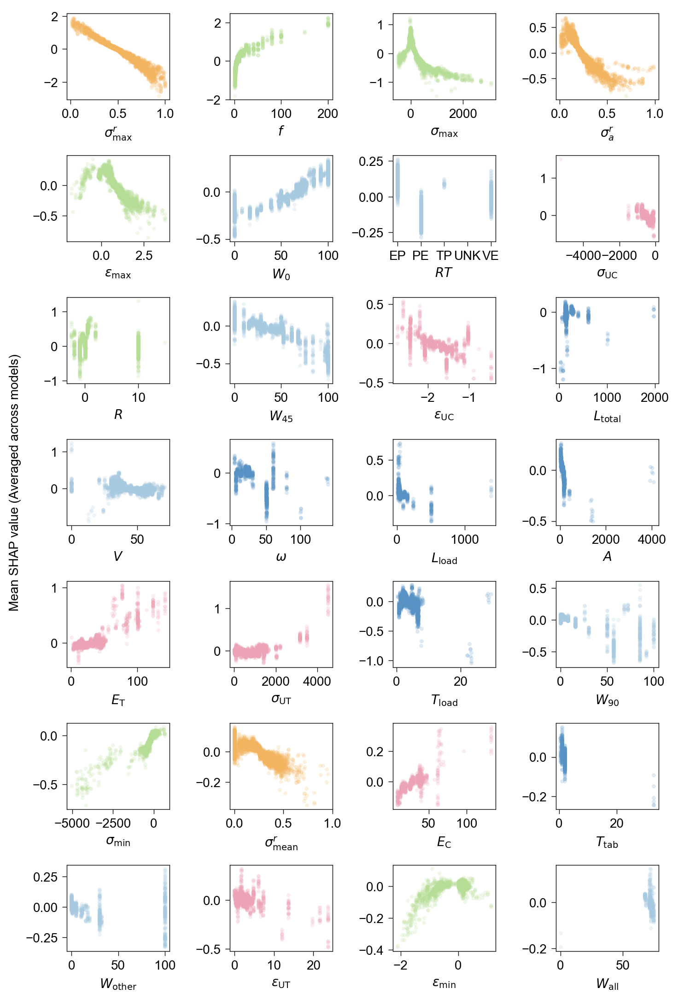

In [13]:
from scipy.stats import pearsonr
from tabensemb.utils import get_figsize

figsize, width, height = get_figsize(len(trainer_analysis.all_feature_names), max_col=4, width_per_item=1.8, height_per_item=1.6, max_width=8)

plt.figure(figsize=figsize, dpi=200)

order = np.array(feature_names)[np.argsort(np.median(np.abs(np.array([x.squeeze(0) for x in np.split(np.nanmean(np.abs(shap_matrix_not_imputed), axis=1), indices_or_sections=shap_matrix_not_imputed.shape[0], axis=0)])), axis=0))]

for idx, feature in enumerate(order[::-1]):
    ax = plt.subplot(height, width, idx+1)
    x = X_train_not_imputed[feature].values
    y = np.nanmean(shap_matrix_not_imputed, axis=0)[:, feature_names.index(feature)]
    ax.scatter(x, y, s=10, alpha=0.2, linewidth=0, rasterized=True, color=tabensemb.utils.global_palette[trainer.datamodule.unique_feature_types_with_derived().index(trainer.args["feature_types"][feature] if feature in trainer.args["feature_types"].keys() else "Derived")])
    set_linewidth(ax)
    ax.set_xlabel(feature)
    if feature in trainer_analysis.cat_feature_names:
        ax.set_xticks(range(len(trainer_analysis.cat_feature_mapping[feature])))
        ax.set_xticklabels(trainer_analysis.cat_feature_mapping[feature])
    # ax.set_ylabel("Mean SHAP value")
    # ax.set_ylim([])
    replace_feature_names(ax)

ax = plt.subplot(111)
ax.set_frame_on(False)
ax.tick_params(
    labelcolor="none",
    which="both",
    top=False,
    bottom=False,
    left=False,
    right=False,
)
ax.set_ylabel("Mean SHAP value (Averaged across models)\n")

plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "shap_overview.pdf"),dpi=500, bbox_inches="tight")
plt.show()
plt.close()

In [14]:
np.count_nonzero(1-np.isnan(X_train_not_imputed["Frequency"])), np.count_nonzero(1-np.isnan(X_train_not_imputed["Relative Maximum Stress"]))

(5402, 5165)

### Specific

Mean of empty slice
Mean of empty slice
Mean of empty slice
Mean of empty slice
Mean of empty slice
Mean of empty slice
Mean of empty slice
Mean of empty slice
Mean of empty slice
Mean of empty slice
Mean of empty slice
This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


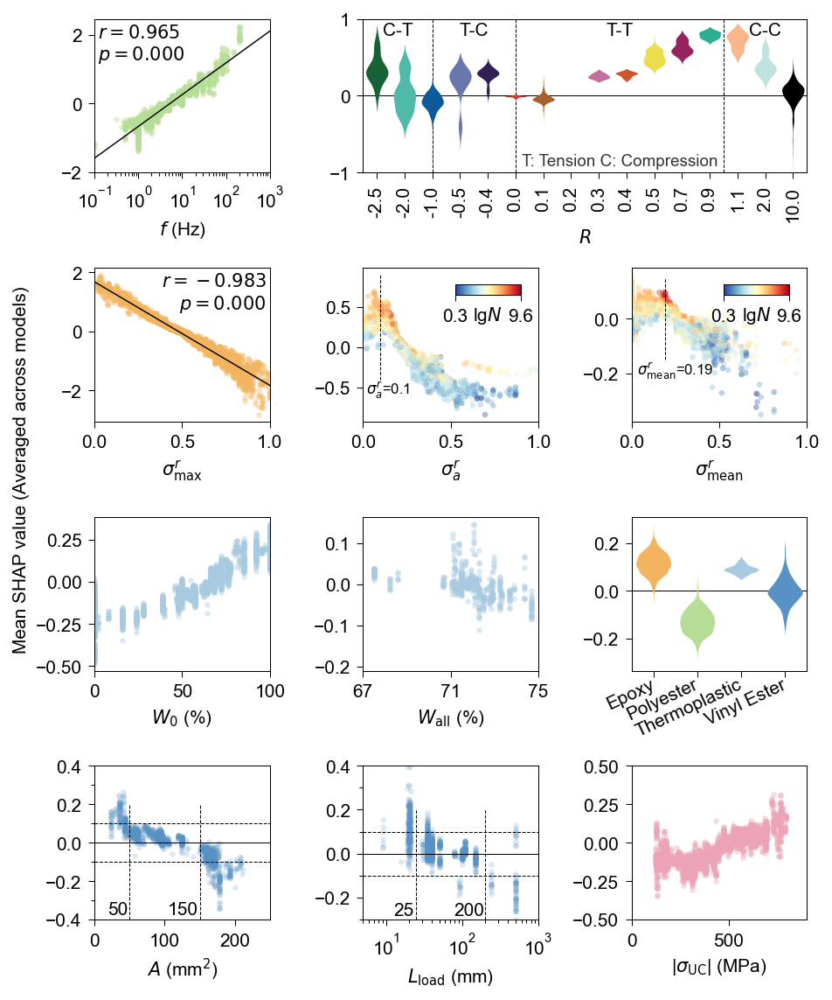

In [18]:
from scipy.stats import pearsonr
from matplotlib.gridspec import GridSpec

fig = plt.figure(figsize=(7, 8), dpi=150)
gs = GridSpec(4, 3, figure=fig)


ax = fig.add_subplot(gs[0, 0])

feature = "Frequency"
x = X_train_not_imputed[feature].values
y = np.nanmean(shap_matrix_not_imputed, axis=0)[:, feature_names.index(feature)]
ax.scatter(x, y, s=10, alpha=0.4, linewidth=0, rasterized=True, color=tabensemb.utils.global_palette[trainer.datamodule.unique_feature_types_with_derived().index(trainer.args["feature_types"][feature])])
ax.set_xscale("log")
set_linewidth(ax)
ax.set_xlabel("Frequency (Hz)")
# ax.set_ylabel("Mean SHAP value")
ax.set_xlim(right=1000, left=1e-1)
valid_points = np.union1d(np.where(1-np.isnan(x))[0], np.where(1-np.isnan(y))[0])
pfit = np.polyfit(np.log10(x)[valid_points], y[valid_points], 1)
p = np.poly1d(pfit)
x1, x2 = ax.get_xlim()
ax.plot(10**np.linspace(np.log10(x1), np.log10(x2), 10), p(np.linspace(np.log10(x1), np.log10(x2), 10)), alpha=1, color="k", linewidth=0.7)
r = pearsonr(np.log10(x)[valid_points], y[valid_points])
ax.text(0.02, 0.97, f"$r={r.statistic:.3f}$\n$p={r.pvalue:.3f}$", transform=ax.transAxes, ha="left", va="top")
replace_feature_names(ax)

ax = fig.add_subplot(gs[0, 1:])

x = X_train_not_imputed["R-value"].values
y = np.nanmean(shap_matrix_not_imputed, axis=0)[:, feature_names.index("R-value")]
order = np.sort(np.unique(x))

sns.violinplot(data=pd.DataFrame({"x": x, "y": y}), x="x", y="y", hue="x", inner=None, linewidth=0., palette=tabensemb.utils.global_palette[5:22], ax=ax, saturation=1, order=order, density_norm="area")
set_linewidth(ax)
ax.get_legend().remove()
ax.set_xlabel("R-value")
ax.set_ylabel(None)
ax.set_xticks(range(len(np.unique(x))))
ax.set_xticklabels(order)
# ax.set_xlim(-0.5, 3.5)
replace_feature_names(ax)
# replace_feature_names(ax, special_mapping={"EP": "Epoxy", "PE": "Polyester", "TP": "Thermoplastic", "UNK": "Unknown", "VE": "Vinyl Ester"})
ax.plot(ax.get_xlim(), [0, 0], linewidth=0.5, color="k", zorder=-1)
ax.set_ylim([-1, 1])
ax.set_xlim([-0.5, len(order)-2-0.5])

ax.plot([2, 2], [-1, 1], linewidth=0.5, color="k", zorder=-1, ls="--")
ax.plot([5, 5], [-1, 1], linewidth=0.5, color="k", zorder=-1, ls="--")
ax.plot([12.5, 12.5], [-1, 1], linewidth=0.5, color="k", zorder=-1, ls="--")
ax.text(0.75, 0.85, "C-T", ha="center", va="center")
ax.text(3.5, 0.85, "T-C", ha="center", va="center")
ax.text(8.75, 0.85, "T-T", ha="center", va="center")
ax.text(14, 0.85, "C-C", ha="center", va="center")
ax.text(8.75, -0.85, "T: Tension C: Compression", ha="center", va="center", fontsize=plt.rcParams["font.size"]*0.9, color=(0.2,0.2,0.2))

plt.setp(
    ax.get_xticklabels(),
    rotation=90,
    va="center",
    ha="right",
    rotation_mode="anchor",
)


ax = fig.add_subplot(gs[1, 0])
feature = "Relative Maximum Stress"
x = X_train_not_imputed[feature].values
y = np.nanmean(shap_matrix_not_imputed, axis=0)[:, feature_names.index(feature)]
ax.scatter(x, y, s=10, alpha=0.4, linewidth=0, rasterized=True, color=tabensemb.utils.global_palette[trainer.datamodule.unique_feature_types_with_derived().index(trainer.args["feature_types"][feature] if feature in trainer.args["feature_types"].keys() else "Derived")])
set_linewidth(ax)
ax.set_xlabel(feature)
# ax.set_ylabel("Mean SHAP value")
valid_points = np.union1d(np.where(1-np.isnan(x))[0], np.where(1-np.isnan(y))[0])
pfit = np.polyfit(x[valid_points], y[valid_points], 1)
p = np.poly1d(pfit)
x1, x2 = ax.get_xlim()
ax.plot(np.linspace(x1, x2, 10), p(np.linspace(x1, x2, 10)), alpha=1, color="k", linewidth=0.7)
r = pearsonr(x[valid_points], y[valid_points])
ax.text(0.98, 0.97, f"$r={r.statistic:.3f}$\n$p={r.pvalue:.3f}$", transform=ax.transAxes, ha="right", va="top")
replace_feature_names(ax)
ax.set_xlim([0, 1])

ax = fig.add_subplot(gs[1, 1])
feature = "Relative Stress Amplitude"
x = X_train_not_imputed[feature].values
y = np.nanmean(shap_matrix_not_imputed, axis=0)[:, feature_names.index(feature)]
ax.scatter(x, y, s=10, alpha=0.4, linewidth=0, rasterized=True, c=trainer_analysis.datamodule.y_train, cmap="RdYlBu_r")
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.cm import ScalarMappable
inset_ax = inset_axes(ax, bbox_to_anchor=(0.95, 0.95), width=0.5, height=0.08, bbox_transform=ax.transAxes)
plt.colorbar(cax=inset_ax, mappable=ScalarMappable(cmap="RdYlBu_r"), orientation="horizontal")
set_linewidth(inset_ax)
inset_ax.set_xticks(inset_ax.get_xlim())
inset_ax.set_xticklabels([round(x, 1) for x in [np.min(trainer_analysis.datamodule.y_train), np.max(trainer_analysis.datamodule.y_train)]])
inset_ax.set_xlabel("log10(Cycles to Failure)", labelpad=-11)
replace_feature_names(inset_ax)

ax.plot([0.1, 0.1], [-0.4, 0.9], linewidth=0.5, color="k", zorder=10, ls="--")
# ax.plot(ax.get_xlim(), [0, 0], linewidth=0.5, color="k", zorder=10, ls="--")
ax.text(0.02, -0.4, f"{feature_name_mapping[feature]}=0.1", ha="left", va="top", fontsize=plt.rcParams["font.size"]*0.8)

set_linewidth(ax)
ax.set_xlabel(feature)
# ax.set_ylabel("Mean SHAP value")
# pfit = np.polyfit(x, y, 1)
# p = np.poly1d(pfit)
# x1, x2 = ax.get_xlim()
# ax.plot(np.linspace(x1, x2, 10), p(np.linspace(x1, x2, 10)), alpha=1, color="k", linewidth=0.7)
# r = pearsonr(x, y)
# ax.text(0.98, 0.97, f"Pearson's $r={r.statistic:.3f}$\n$p$-value$={r.pvalue:.3f}$", transform=ax.transAxes, ha="right", va="top")
ax.set_xlim([0, 1])
replace_feature_names(ax)

ax = fig.add_subplot(gs[1, 2])
from matplotlib.colors import LinearSegmentedColormap
from PIL import ImageColor
from matplotlib.lines import Line2D

sc = ax.scatter(X_train_not_imputed["Relative Mean Stress"].values, np.nanmean(shap_matrix_not_imputed, axis=0)[:, feature_names.index("Relative Mean Stress")], s=10, alpha=0.4, linewidth=0, c=trainer_analysis.datamodule.y_train, cmap="RdYlBu_r", rasterized=True)
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.cm import ScalarMappable
inset_ax = inset_axes(ax, bbox_to_anchor=(0.95, 0.95), width=0.5, height=0.08, bbox_transform=ax.transAxes)
plt.colorbar(cax=inset_ax, mappable=ScalarMappable(cmap="RdYlBu_r"), orientation="horizontal")
set_linewidth(inset_ax)
inset_ax.set_xticks(inset_ax.get_xlim())
inset_ax.set_xticklabels([round(x, 1) for x in [np.min(trainer_analysis.datamodule.y_train), np.max(trainer_analysis.datamodule.y_train)]])
inset_ax.set_xlabel("log10(Cycles to Failure)", labelpad=-11)
replace_feature_names(inset_ax)
# ax.legend()
# handles, labels = ax.get_legend().legendHandles, [x.get_text() for x in ax.get_legend().texts]
# handles = [
#     Line2D([], [], linewidth=0, marker="o", markersize=4, markerfacecolor=colors[i], markeredgecolor=[1,1,1,0]) for i in range(3)
# ]
# labels = ["$R<-1$", r"$-1\leq R<1$", r"$R>1$"]
# ax.legend(handles, labels, title=False, frameon=False, markerscale=1, handlelength=1, loc="lower left", fontsize=plt.rcParams["font.size"]*0.8, bbox_to_anchor=(-0.05, -0.05))
ax.set_xlim([0, 1])
xlim = ax.get_xlim()
ylim = ax.get_ylim()
ax.plot([0.19, 0.19], [-0.15, 0.15], linewidth=0.5, color="k", zorder=10, ls="--")
# ax.plot(ax.get_xlim(), [0, 0], linewidth=0.5, color="k", zorder=10, ls="--")
ax.text(0.25, -0.15, f"{feature_name_mapping['Relative Mean Stress']}=0.19", ha="center", va="top", fontsize=plt.rcParams["font.size"]*0.8)
ax.set_xlim(xlim)
ax.set_ylim(ylim)
set_linewidth(ax)
ax.set_xlabel("Relative Mean Stress")
# ax.set_ylabel("Mean SHAP value")
replace_feature_names(ax)

ax = fig.add_subplot(gs[2, 0])
feature = "Fiber Weight Fraction (0-deg)"

x = X_train_not_imputed[feature].values
y = np.nanmean(shap_matrix_not_imputed, axis=0)[:, feature_names.index(feature)]
ax.scatter(x, y, s=10, alpha=0.4, linewidth=0, rasterized=True, color=tabensemb.utils.global_palette[trainer.datamodule.unique_feature_types_with_derived().index(trainer.args["feature_types"][feature])])
set_linewidth(ax)
ax.set_xlabel(feature)
# ax.set_ylabel("Mean SHAP value")
# r = pearsonr(np.log10(x), y)
# ax.text(0.02, 0.97, f"Pearson's $r={r.statistic:.3f}$\n$p$-value$={r.pvalue:.3f}$", transform=ax.transAxes, ha="left", va="top")
ax.set_xlim([0, 100])
replace_feature_names(ax)
ax.set_xlabel(ax.get_xlabel()+" (%)")


ax = fig.add_subplot(gs[2, 1])
feature = "Fiber Weight Fraction"

x = X_train_not_imputed[feature].values
y = np.nanmean(shap_matrix_not_imputed, axis=0)[:, feature_names.index(feature)]
sc = ax.scatter(x, y, s=10, alpha=0.4, linewidth=0, rasterized=True, color=tabensemb.utils.global_palette[trainer.datamodule.unique_feature_types_with_derived().index(trainer.args["feature_types"][feature])])
set_linewidth(ax)
ax.set_xlabel(feature)
# ax.set_ylabel("Mean SHAP value")
# r = pearsonr(np.log10(x), y)
# ax.text(0.02, 0.97, f"Pearson's $r={r.statistic:.3f}$\n$p$-value$={r.pvalue:.3f}$", transform=ax.transAxes, ha="left", va="top")
replace_feature_names(ax)
ax.set_xlim([67, 75])
ax.set_xticks([67, 71, 75])
ax.set_xticklabels([67, 71, 75])
ax.set_xlabel(ax.get_xlabel()+" (%)")

ax = fig.add_subplot(gs[2, 2])
order = [0, 1, 2, 4, 3]
x = X_train_not_imputed["Resin Type"].values
y = np.nanmean(shap_matrix_not_imputed, axis=0)[:, feature_names.index("Resin Type")]
sns.violinplot(data=pd.DataFrame({"x": x, "y": y}), x="x", y="y", hue="x", inner=None, linewidth=0., palette=tabensemb.utils.global_palette[:5], ax=ax, order=order, saturation=1)
set_linewidth(ax)
ax.get_legend().remove()
ax.set_xlabel(None)
ax.set_ylabel(None)
ax.set_xticks(range(len(trainer_analysis.cat_feature_mapping["Resin Type"])))
ax.set_xticklabels(np.array(trainer_analysis.cat_feature_mapping["Resin Type"])[order])
ax.set_xlim(-0.5, 3.5)
replace_feature_names(ax)
replace_feature_names(ax, special_mapping={"EP": "Epoxy", "PE": "Polyester", "TP": "Thermoplastic", "UNK": "Unknown", "VE": "Vinyl Ester"})
ax.plot(ax.get_xlim(), [0, 0], linewidth=0.5, color="k", zorder=-1)
plt.setp(
    ax.get_xticklabels(),
    rotation=25,
    va="center",
    ha="right",
    rotation_mode="anchor",
)

xlims = {
    "Area": [0, 250],
    "Tab Thickness": [0, 3],
    "Length": [0, 400],
    "Thickness": [0, 10],
    "Load Length": [5, 1000],
    "Width": [0, 100],
}
ax = fig.add_subplot(gs[3, 0])
feature = "Area"
x = X_train_not_imputed[feature].values
y = np.nanmean(shap_matrix_not_imputed, axis=0)[:, feature_names.index(feature)]
ax.scatter(x, y, s=10, alpha=0.2, linewidth=0, rasterized=True, color=tabensemb.utils.global_palette[trainer.datamodule.unique_feature_types_with_derived().index(trainer.args["feature_types"][feature] if feature in trainer.args["feature_types"].keys() else "Derived")])

ax.set_xlabel(feature)
ax.set_xlim(xlims[feature])
ax.set_ylim([-0.4, 0.4])
ax.plot(ax.get_xlim(), [0, 0], linewidth=0.5, color="k", zorder=10)
ax.plot(ax.get_xlim(), [0.1, 0.1], linewidth=0.5, color="k", zorder=10, ls="--")
ax.plot(ax.get_xlim(), [-0.1, -0.1], linewidth=0.5, color="k", zorder=10, ls="--")
ax.plot([50, 50], [-0.4, 0.2], linewidth=0.5, color="k", zorder=10, ls="--")
ax.plot([150, 150], [-0.4, 0.2], linewidth=0.5, color="k", zorder=10, ls="--")
# ax.text(ax.get_xlim()[1]*0.99, 0.11, "0.1", ha="right", va="bottom")
# ax.text(ax.get_xlim()[1]*0.99, -0.12, "-0.1", ha="right", va="top")
ax.text(48, ax.get_ylim()[0]+0.007, "50", ha="right", va="bottom")
ax.text(148, ax.get_ylim()[0]+0.007, "150", ha="right", va="bottom")
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)
ax.yaxis.set_minor_locator(MultipleLocator(0.1))
set_linewidth(ax)
# ax.set_yticks(np.linspace(-0.7, 0.5, 13))
# ax.set_yticklabels([None, -0.6, None, -0.4, None, -0.2, None, -0., None, 0.2, None, 0.4, None])
replace_feature_names(ax)
ax.set_xlabel(ax.get_xlabel()+" (mm$^2$)")

ax = fig.add_subplot(gs[3, 1])
feature = "Load Length"
x = X_train_not_imputed[feature].values
y = np.nanmean(shap_matrix_not_imputed, axis=0)[:, feature_names.index(feature)]
ax.scatter(x, y, s=10, alpha=0.2, linewidth=0, rasterized=True, color=tabensemb.utils.global_palette[trainer.datamodule.unique_feature_types_with_derived().index(trainer.args["feature_types"][feature] if feature in trainer.args["feature_types"].keys() else "Derived")])

ax.set_xlabel(feature)
ax.set_xlim(xlims[feature])
ax.set_ylim([-0.3, 0.4])
replace_feature_names(ax)
ax.plot(ax.get_xlim(), [0, 0], linewidth=0.5, color="k", zorder=10)
ax.plot(ax.get_xlim(), [0.1, 0.1], linewidth=0.5, color="k", zorder=10, ls="--")
ax.plot(ax.get_xlim(), [-0.1, -0.1], linewidth=0.5, color="k", zorder=10, ls="--")
ax.plot([25, 25], [-0.3, 0.2], linewidth=0.5, color="k", zorder=10, ls="--")
ax.plot([200, 200], [-0.3, 0.2], linewidth=0.5, color="k", zorder=10, ls="--")
# ax.set_yticks([-0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5])
# ax.set_yticklabels([-0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5])
# ax.text(ax.get_xlim()[0]-0.4, 0.101, "0.1", ha="right", va="center")
# ax.text(ax.get_xlim()[0]-0.4, -0.108, "-0.1", ha="right", va="center")
ax.text(23, ax.get_ylim()[0]+0.002, "25", ha="right", va="bottom")
ax.text(198, ax.get_ylim()[0]+0.002, "200", ha="right", va="bottom")
ax.yaxis.set_minor_locator(MultipleLocator(0.1))
set_linewidth(ax)
ax.set_xscale("log")
ax.set_xlabel(ax.get_xlabel()+" (mm)")

ax = fig.add_subplot(gs[3, 2])
feature = "Ultimate Compressive Stress"

x = X_train_not_imputed[feature].values
y = np.nanmean(shap_matrix_not_imputed, axis=0)[:, feature_names.index(feature)]
ax.scatter(np.abs(x), y, s=10, alpha=0.4, linewidth=0, rasterized=True, color=tabensemb.utils.global_palette[trainer.datamodule.unique_feature_types_with_derived().index(trainer.args["feature_types"][feature])])
set_linewidth(ax)
ax.set_xlabel("|Ultimate Compressive Stress|")
# ax.set_ylabel("Mean SHAP value")
# r = pearsonr(np.log10(x), y)
# ax.text(0.02, 0.97, f"Pearson's $r={r.statistic:.3f}$\n$p$-value$={r.pvalue:.3f}$", transform=ax.transAxes, ha="left", va="top")
ax.set_xlim([0, 900])
ax.set_ylim([-0.5, 0.5])
replace_feature_names(ax)
ax.set_xlabel(ax.get_xlabel()+" (MPa)")

ax = plt.subplot(111)
ax.set_frame_on(False)
ax.tick_params(
    labelcolor="none",
    which="both",
    top=False,
    bottom=False,
    left=False,
    right=False,
)
ax.set_ylabel("Mean SHAP value (Averaged across models)\n")
# ax = plt.subplot(3, 3, 5)
plt.savefig(os.path.join(trainer.project_root, "shap_specific.jpg"),dpi=1000, bbox_inches="tight")
plt.tight_layout()
plt.show()
plt.close()

In [16]:
np.unique(trainer_analysis.datamodule.X_train["Resin Type"], return_counts=True)

(array([0, 1, 2, 3, 4]), array([2598, 2290,   19,   57,  452]))

In [25]:
print(np.unique(X_train_not_imputed["R-value"].values, return_counts=True))

(array([-2.5, -2. , -1. , -0.5, -0.4,  0. ,  0.1,  0.2,  0.3,  0.4,  0.5,
        0.7,  0.9,  1.1,  2. , 10. , 15. ,  nan]), array([  15,   71,  897,   65,   39,   30, 3219,    2,    4,    4,  105,
         27,    6,    9,   33,  887,    1,    2]))


In [26]:
x = X_train_not_imputed["R-value"].values
y = np.nanmean(shap_matrix_not_imputed, axis=0)[:, feature_names.index("R-value")]
y[x==0.2]

Mean of empty slice


array([-0.05780943, -0.05736855])

In [17]:
trainer_analysis.cat_feature_mapping

{'Resin Type': array(['EP', 'PE', 'TP', 'UNK', 'VE'], dtype='<U3')}

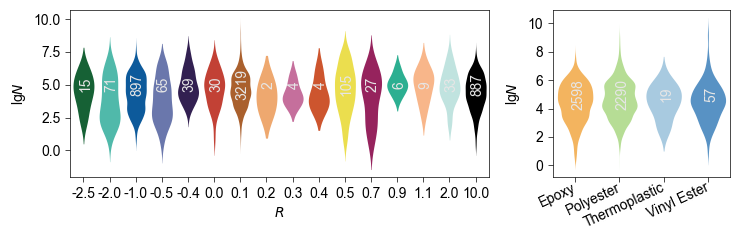

In [18]:
from matplotlib.gridspec import GridSpec

fig = plt.figure(figsize=(7.5, 2.5))

gs = GridSpec(1, 3, figure=fig)


ax = fig.add_subplot(gs[0, :-1])

x = X_train_not_imputed["R-value"].values
y = trainer_analysis.datamodule.y_train.flatten()
order = np.sort(np.unique(x))
sns.violinplot(data=pd.DataFrame({"x": x, "y": y}), x="x", y="y", hue="x", inner=None, linewidth=0., palette=tabensemb.utils.global_palette[5:22], ax=ax, saturation=1, order=order, density_norm="count")
set_linewidth(ax)
ax.get_legend().remove()
ax.set_xlabel("R-value")
ax.set_ylabel(None)
ax.set_xticks(range(len(np.unique(x))))
ax.set_xticklabels(order)

unique_values, counts = np.unique(x, return_counts=True)
for i, count in enumerate(counts[:-2]):
    ax.text(i+0.07, 5, f"{count}", rotation=90, ha="center", va="center", color=[0.9,0.9,0.9])

ax.set_xlim([-0.5, len(order)-2-0.5])
ax.set_ylabel("log10(Cycles to Failure)")
replace_feature_names(ax)
set_linewidth(ax)


ax = fig.add_subplot(gs[0, -1])

order = [0, 1, 2, 4, 3]
x = X_train_not_imputed["Resin Type"].values
y = trainer_analysis.datamodule.y_train.flatten()
sns.violinplot(data=pd.DataFrame({"x": x, "y": y}), x="x", y="y", hue="x", inner=None, linewidth=0., palette=tabensemb.utils.global_palette[:5], ax=ax, order=order, saturation=1)
set_linewidth(ax)
ax.get_legend().remove()
ax.set_xlabel(None)
ax.set_ylabel("log10(Cycles to Failure)")
ax.set_xticks(range(len(trainer_analysis.cat_feature_mapping["Resin Type"])))
ax.set_xticklabels(np.array(trainer_analysis.cat_feature_mapping["Resin Type"])[order])

unique_values, counts = np.unique(x, return_counts=True)
for i, count in enumerate(counts[:-1]):
    ax.text(i+0.07, 5, f"{count}", rotation=90, ha="center", va="center", color=[0.9,0.9,0.9])

ax.set_xlim(-0.5, 3.5)

replace_feature_names(ax)
replace_feature_names(ax, special_mapping={"EP": "Epoxy", "PE": "Polyester", "TP": "Thermoplastic", "UNK": "Unknown", "VE": "Vinyl Ester"})
plt.setp(
    ax.get_xticklabels(),
    rotation=25,
    va="center",
    ha="right",
    rotation_mode="anchor",
)

plt.savefig(os.path.join(trainer.project_root, "n_r_resin_violin.pdf"),dpi=500, bbox_inches="tight")
plt.show()
plt.close()


Mean of empty slice
Mean of empty slice
Mean of empty slice
Mean of empty slice
Mean of empty slice
Mean of empty slice


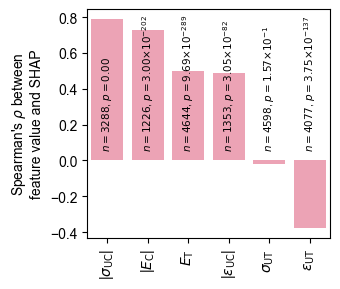

In [28]:
from scipy.stats import spearmanr
plt.figure(figsize=(3.5,3))
ax = plt.subplot(111)
property_features = trainer_analysis.datamodule.get_feature_names_by_type(typ="Property")
dfs = []
p_values = []
for feature in property_features:
    x = X_train_not_imputed[feature].values
    y = np.nanmean(shap_matrix_not_imputed, axis=0)[:, feature_names.index(feature)]
    valid_points = np.union1d(np.where(1-np.isnan(x))[0], np.where(1-np.isnan(y))[0])
    rho = spearmanr(np.abs(x[valid_points]), y[valid_points])
    dfs.append(pd.DataFrame({"Feature": [feature], "value": [rho.statistic], "pvalue": [rho.pvalue]}))
    p_values.append(rho.pvalue)
df = pd.concat(dfs).sort_values(by="value", ascending=False)
sns.barplot(data=df, x="Feature", y="value", ax=ax, color=tabensemb.utils.global_palette[trainer.datamodule.unique_feature_types_with_derived().index(trainer.args["feature_types"][feature] if feature in trainer.args["feature_types"].keys() else "Derived")], saturation=1)
replace_feature_names(ax)
xlabels = ax.get_xticklabels()
xlabels = [x.get_text() if "C" not in x.get_text() else "|"+x.get_text()+"|" for x in xlabels]
ax.set_xticklabels(xlabels)
ax.set_xlabel(None)
ax.set_ylabel(r"Spearman's $\rho$"+" between\nfeature value and SHAP")

for i, (feature, p) in enumerate(zip(df["Feature"], df["pvalue"])):
    ax.text(i, 0.05, f"$n={np.count_nonzero(1-np.isnan(X_train_not_imputed[feature]))}$, $p=${to_scientific_notation(p)}", rotation=90,ha="center", va="bottom", fontsize=plt.rcParams["font.size"]*0.75)
plt.setp(
    ax.get_xticklabels(),
    rotation=90,
    va="center",
    ha="right",
    rotation_mode="anchor",
)
plt.savefig(os.path.join(trainer.project_root, "property_shap_spearman.pdf"),dpi=500, bbox_inches="tight")
plt.show()
plt.close()

In [17]:
for name in property_features:
    print(name, np.count_nonzero(1-np.isnan(X_train_not_imputed[name])))

Ultimate Tensile Stress 4598
Ultimate Compressive Stress 3288
Tensile Modulus 4644
Compressive Modulus 1226
Ultimate Tensile Strain 4077
Ultimate Compressive Strain 1353


Mean of empty slice
Mean of empty slice
Mean of empty slice
Mean of empty slice
Mean of empty slice
Mean of empty slice


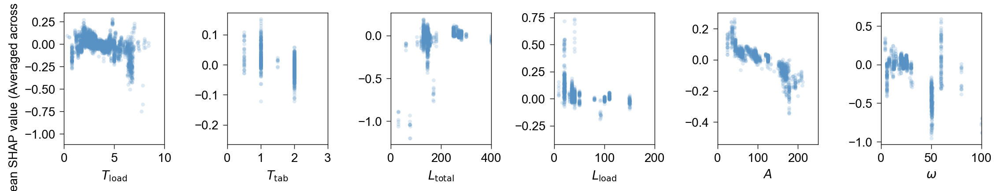

In [29]:
from scipy.stats import pearsonr
from tabensemb.utils import get_figsize

plt.figure(figsize=(12, 2.5), dpi=200)

specimen_feature_names = ["Thickness", "Tab Thickness", "Length", "Load Length", "Area", "Width"]
# specimen_feature_names = ["Load Length", "Area"]
xlims = {
    "Area": [0, 250],
    "Tab Thickness": [0, 3],
    "Length": [0, 400],
    "Thickness": [0, 10],
    "Load Length": [0, 200],
    "Width": [0, 100],
}
for idx, feature in enumerate(specimen_feature_names):
    ax = plt.subplot(1, len(specimen_feature_names), idx+1)
    x = X_train_not_imputed[feature].values
    y = np.nanmean(shap_matrix_not_imputed, axis=0)[:, feature_names.index(feature)]
    ax.scatter(x, y, s=10, alpha=0.2, linewidth=0, rasterized=True, color=tabensemb.utils.global_palette[trainer.datamodule.unique_feature_types_with_derived().index(trainer.args["feature_types"][feature] if feature in trainer.args["feature_types"].keys() else "Derived")])
    set_linewidth(ax)
    ax.set_xlabel(feature)
    ax.set_xlim(xlims[feature])
    replace_feature_names(ax)

ax = plt.subplot(111)
ax.set_frame_on(False)
ax.tick_params(
    labelcolor="none",
    which="both",
    top=False,
    bottom=False,
    left=False,
    right=False,
)
ax.set_ylabel("Mean SHAP value (Averaged across models)\n")

plt.tight_layout()
# plt.savefig(os.path.join(trainer.project_root, "shap_overview.pdf"),dpi=500, bbox_inches="tight")
plt.show()
plt.close()

## Clustering methods

In [6]:
trainer_cluster_a = load_trainer("output/composite_database_03222024/2024-04-16-22-25-12-0_composite clusters A622/trainer.pkl")
trainer_cluster_b = load_trainer("output/composite_database_03222024/2024-07-14-00-08-13-0_composite clusters B622/trainer.pkl")
trainer_cluster_c = load_trainer("output/composite_database_03222024/2024-04-16-22-37-18-0_composite-I1 clusters C622/trainer.pkl")

In [57]:
trainer_cluster_a.leaderboard.sort_values(by="Testing MAPE")

,Program,Model,Training RMSE,Training MSE,Training MAE,Training MAPE,Training R2,Training MEDIAN_ABSOLUTE_ERROR,Training EXPLAINED_VARIANCE_SCORE,Testing RMSE,...,Testing R2,Testing MEDIAN_ABSOLUTE_ERROR,Testing EXPLAINED_VARIANCE_SCORE,Validation RMSE,Validation MSE,Validation MAE,Validation MAPE,Validation R2,Validation MEDIAN_ABSOLUTE_ERROR,Validation EXPLAINED_VARIANCE_SCORE
2,ThisWork_KMeans_3L,PHYSICS_NoPCA_3L_KMeans,0.569137,0.323917,0.399478,0.108103,0.823002,0.275035,0.823213,0.780996,...,0.669145,0.352889,0.669162,0.713063,0.508459,0.496483,0.140363,0.724104,0.345566,0.724350
1,ThisWork_BMM_3L,PHYSICS_NoPCA_3L_BMM,0.621993,0.386875,0.440326,0.121805,0.788600,0.307562,0.788638,0.773950,...,0.675088,0.383418,0.675091,0.733682,0.538289,0.519644,0.149313,0.707917,0.365944,0.708002
0,ThisWork_KMeans_1L,PHYSICS_NoPCA_1L_KMeans,0.630925,0.398067,0.456117,0.126206,0.782485,0.329471,0.782510,0.763353,...,0.683924,0.388600,0.683937,0.734950,0.540152,0.523271,0.150607,0.706907,0.380009,0.707063
3,ThisWork_KMeans_3L_PCA,PHYSICS_PCA_3L_KMeans,0.577677,0.333710,0.411384,0.110870,0.817651,0.290259,0.817907,0.810997,...,0.643238,0.380772,0.643268,0.761062,0.579216,0.531510,0.149455,0.685710,0.373378,0.686034
7,ThisWork_GMM_3L,PHYSICS_NoPCA_3L_GMM,0.664299,0.441294,0.465353,0.127456,0.758864,0.316525,0.759036,0.830114,...,0.626221,0.428266,0.626221,0.795457,0.632751,0.572022,0.160565,0.656661,0.408481,0.656710
5,ThisWork_KMeans_1L_PCA,PHYSICS_PCA_1L_KMeans,0.717783,0.515213,0.532076,0.147296,0.718473,0.400096,0.718520,0.823091,...,0.632518,0.448171,0.632561,0.806514,0.650465,0.586789,0.168554,0.647050,0.440042,0.647313
4,ThisWork_BMM_1L,PHYSICS_NoPCA_1L_BMM,0.750522,0.563284,0.552979,0.153144,0.692205,0.408667,0.692257,0.819132,...,0.636045,0.453773,0.636154,0.808995,0.654473,0.599215,0.172093,0.644875,0.448942,0.645090
6,ThisWork_BMM_3L_PCA,PHYSICS_PCA_3L_BMM,0.726335,0.527562,0.531823,0.149089,0.711724,0.394069,0.711765,0.828502,...,0.627671,0.448234,0.627717,0.805630,0.649040,0.591213,0.169913,0.647823,0.444556,0.647877
8,ThisWork_GMM_3L_PCA,PHYSICS_PCA_3L_GMM,0.811660,0.658791,0.620835,0.173143,0.640017,0.494154,0.640037,0.894253,...,0.566229,0.538551,0.566250,0.872345,0.760986,0.662925,0.187897,0.587079,0.529309,0.587272
9,ThisWork_BMM_1L_PCA,PHYSICS_PCA_1L_BMM,0.910778,0.829516,0.702239,0.199118,0.546728,0.564350,0.546755,0.943174,...,0.517471,0.587898,0.517474,0.932656,0.869848,0.717481,0.210740,0.528009,0.579833,0.528168


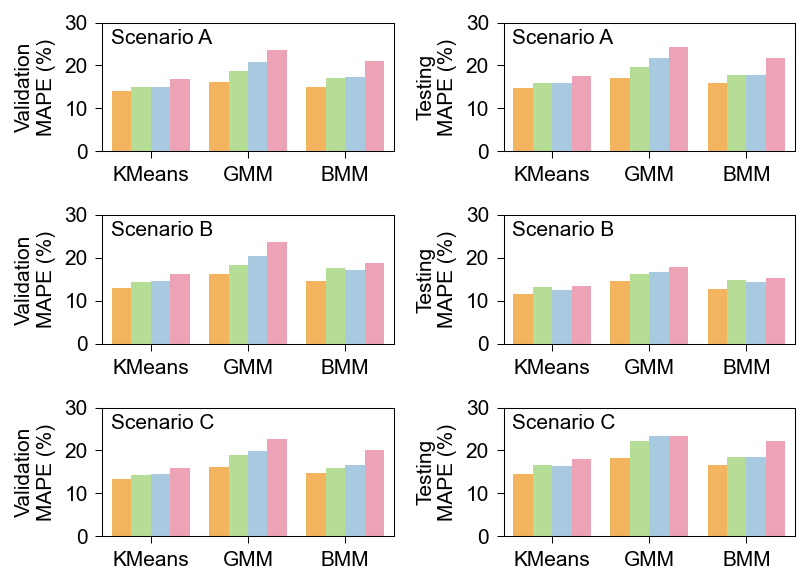

/home/xlluo/anaconda3/envs/tabular_ensemble/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  fig.canvas.print_figure(bytes_io, **kw)


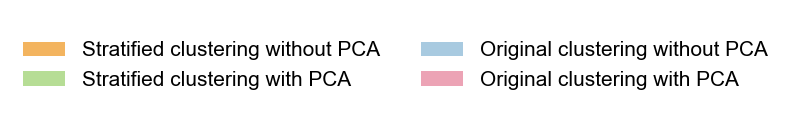

In [7]:

import seaborn as sns

mapping = {"NoPCA-1L": "Original clustering without PCA", "PCA-1L": "Original clustering with PCA", "NoPCA-3L": "Stratified clustering without PCA", "PCA-3L": "Stratified clustering with PCA"}

def plot_once(df, metric, ax):
    sns.barplot(df, x="clustering methods", y=metric, hue="layers_pca", ax=ax, hue_order=["PCA-1L", "NoPCA-1L", "PCA-3L", "NoPCA-3L"][::-1], palette=tabensemb.utils.global_palette[:4], linewidth=0.5, saturation=1, order=["KMeans", "GMM", "BMM"])
    # for idx_method, method in enumerate(["KMeans", "GMM", "BMM"]):
    #     for idx_pca, use_pca in enumerate(["NoPCA", "PCA"]):
    #         sub_df = df[(df['clustering methods']==method)&(df['pca']==use_pca)][['Model', metric]]

    ax.set_ylim([0, 0.3])
    ax.get_legend().remove()
    ax.set_xlabel(None)
    set_linewidth(ax)

plt.figure(figsize=(5.5,4), dpi=150)

df = trainer_cluster_a.leaderboard.copy()
df["clustering methods"] = [x.split("_")[-1] for x in df["Model"]]
df["layers"] = [x.split("_")[-2] for x in df["Model"]]
df["pca"] = [x.split("_")[-3] for x in df["Model"]]
df["layers_pca"] = ["-".join(x.split("_")[-3:-1]) for x in df["Model"]]

ax = plt.subplot(321)
plot_once(df, "Validation MAPE", ax)
ax.text(0.03, 0.95, "Scenario A", ha="left", va="top", transform=ax.transAxes)
multiply_yticklabels(ax)
ax.set_ylabel("Validation\nMAPE (%)")
ax = plt.subplot(322)
plot_once(df, "Testing MAPE", ax)
ax.text(0.03, 0.95, "Scenario A", ha="left", va="top", transform=ax.transAxes)
multiply_yticklabels(ax)
ax.set_ylabel("Testing\nMAPE (%)")

df = trainer_cluster_b.leaderboard.copy()
df["clustering methods"] = [x.split("_")[-1] for x in df["Model"]]
df["layers"] = [x.split("_")[-2] for x in df["Model"]]
df["pca"] = [x.split("_")[-3] for x in df["Model"]]
df["layers_pca"] = ["-".join(x.split("_")[-3:-1]) for x in df["Model"]]

ax = plt.subplot(323)
plot_once(df, "Validation MAPE", ax)
ax.text(0.03, 0.95, "Scenario B", ha="left", va="top", transform=ax.transAxes)
multiply_yticklabels(ax)
ax.set_ylabel("Validation\nMAPE (%)")
ax = plt.subplot(324)
plot_once(df, "Testing MAPE", ax)
ax.text(0.03, 0.95, "Scenario B", ha="left", va="top", transform=ax.transAxes)
multiply_yticklabels(ax)
ax.set_ylabel("Testing\nMAPE (%)")

df = trainer_cluster_c.leaderboard.copy()
df["clustering methods"] = [x.split("_")[-1] for x in df["Model"]]
df["layers"] = [x.split("_")[-2] for x in df["Model"]]
df["pca"] = [x.split("_")[-3] for x in df["Model"]]
df["layers_pca"] = ["-".join(x.split("_")[-3:-1]) for x in df["Model"]]

ax = plt.subplot(325)
plot_once(df, "Validation MAPE", ax)
ax.text(0.03, 0.95, "Scenario C", ha="left", va="top", transform=ax.transAxes)
multiply_yticklabels(ax)
ax.set_ylabel("Validation\nMAPE (%)")
ax = plt.subplot(326)
plot_once(df, "Testing MAPE", ax)
ax.text(0.03, 0.95, "Scenario C", ha="left", va="top", transform=ax.transAxes)
multiply_yticklabels(ax)
ax.set_ylabel("Testing\nMAPE (%)")

handles, labels = ax.get_legend_handles_labels()
plt.savefig(os.path.join(trainer.project_root, "clustering_compare_in_framework.pdf"),dpi=500, bbox_inches="tight")
plt.show()
plt.close()

plt.figure(figsize=(4,1), dpi=150)
ax = plt.subplot(111)
ax.set_frame_on(False)
ax.tick_params(
    labelcolor="none",
    which="both",
    top=False,
    bottom=False,
    left=False,
    right=False,
)
ax.legend(handles, labels, )
replace_legend_labels(ax, mapping, legend_kwargs=dict(frameon=False, ncols=2, title=False))
plt.savefig(os.path.join(trainer.project_root, "clustering_compare_in_framework_legend.pdf"),dpi=500, bbox_inches="tight")
plt.show()
plt.close()

0: 0.010244368618316735
1: 0.04863415550832215
2: 0.02277943904050811
0: 0.01054246339047682
1: 0.04630641925820703
2: 0.01934753673333317
0: 0.016942722961882928
1: 0.0418096497077908
2: 0.02477076080270066
0: 0.009774184634594285
1: 0.022030994436671364
2: 0.016206241344442623
0: 0.011730312009163468
1: 0.03727529050150388
2: 0.01856444720425665
0: 0.018564003869981943
1: 0.05111627935381571
2: 0.018782169482162797


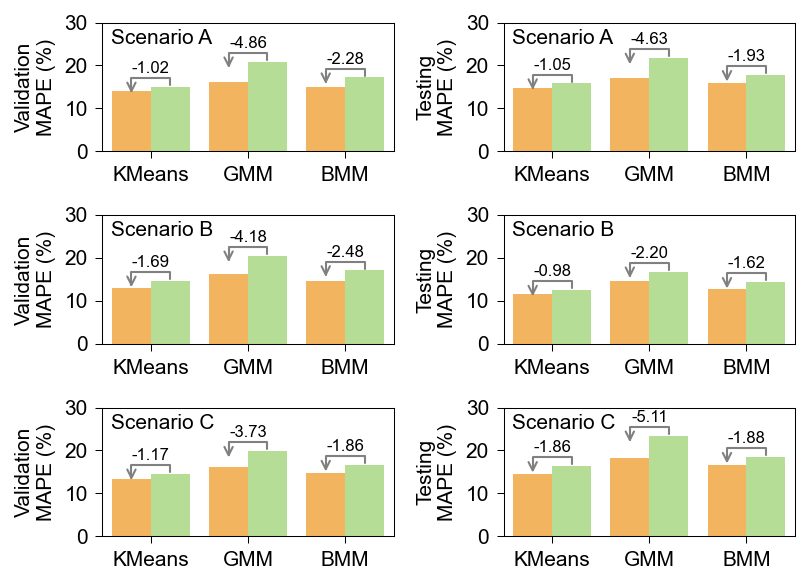

/home/xlluo/anaconda3/envs/tabular_ensemble/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  fig.canvas.print_figure(bytes_io, **kw)


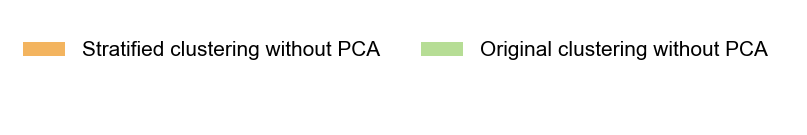

In [8]:

import seaborn as sns

mapping = {"NoPCA-1L": "Original clustering without PCA", "PCA-1L": "Original clustering with PCA", "NoPCA-3L": "Stratified clustering without PCA", "PCA-3L": "Stratified clustering with PCA"}

def plot_once(df, metric, ax):
    sns.barplot(df, x="clustering methods", y=metric, hue="layers_pca", ax=ax, hue_order=["NoPCA-1L", "NoPCA-3L"][::-1], palette=tabensemb.utils.global_palette[:2], linewidth=0.5, saturation=1, order=["KMeans", "GMM", "BMM"])
    for idx_method, method in enumerate(["KMeans", "GMM", "BMM"]):
        for idx_pca, use_pca in enumerate(["NoPCA"]):
            sub_df = df[(df['clustering methods']==method)&(df['pca']==use_pca)][['Model', 'layers', metric]]
            # print(sub_df)
            metric_1l = sub_df[sub_df["layers"]=="1L"][metric].values[0]
            metric_3l = sub_df[sub_df["layers"]=="3L"][metric].values[0]
            diff = metric_1l-metric_3l
            print(f"{idx_method}: {diff}")
            ax.annotate("",
                xy=(idx_method-0.2, max([metric_1l, metric_3l])-0.025), xycoords='data',
                xytext=(idx_method+0.2, max([metric_1l, metric_3l])-0.025), textcoords='data',
                arrowprops=dict(arrowstyle="->", color="0.5",
                                shrinkA=6, shrinkB=2,
                                patchA=None, patchB=None,
                                connectionstyle="bar,fraction=0.5",
                                ),
                )
            ax.text(idx_method, max([metric_1l, metric_3l])+0.025, f"-{diff*100:.2f}", transform=ax.transData, ha="center", va="bottom", fontsize=plt.rcParams["font.size"]*0.8)


    ax.set_ylim([0, 0.3])
    ax.get_legend().remove()
    ax.set_xlabel(None)
    set_linewidth(ax)

plt.figure(figsize=(5.5,4), dpi=150)

df = trainer_cluster_a.leaderboard.copy()
df["clustering methods"] = [x.split("_")[-1] for x in df["Model"]]
df["layers"] = [x.split("_")[-2] for x in df["Model"]]
df["pca"] = [x.split("_")[-3] for x in df["Model"]]
df["layers_pca"] = ["-".join(x.split("_")[-3:-1]) for x in df["Model"]]

ax = plt.subplot(321)
plot_once(df, "Validation MAPE", ax)
ax.text(0.03, 0.95, "Scenario A", ha="left", va="top", transform=ax.transAxes)
multiply_yticklabels(ax)
ax.set_ylabel("Validation\nMAPE (%)")
ax = plt.subplot(322)
plot_once(df, "Testing MAPE", ax)
ax.text(0.03, 0.95, "Scenario A", ha="left", va="top", transform=ax.transAxes)
multiply_yticklabels(ax)
ax.set_ylabel("Testing\nMAPE (%)")

df = trainer_cluster_b.leaderboard.copy()
df["clustering methods"] = [x.split("_")[-1] for x in df["Model"]]
df["layers"] = [x.split("_")[-2] for x in df["Model"]]
df["pca"] = [x.split("_")[-3] for x in df["Model"]]
df["layers_pca"] = ["-".join(x.split("_")[-3:-1]) for x in df["Model"]]

ax = plt.subplot(323)
plot_once(df, "Validation MAPE", ax)
ax.text(0.03, 0.95, "Scenario B", ha="left", va="top", transform=ax.transAxes)
multiply_yticklabels(ax)
ax.set_ylabel("Validation\nMAPE (%)")
ax = plt.subplot(324)
plot_once(df, "Testing MAPE", ax)
ax.text(0.03, 0.95, "Scenario B", ha="left", va="top", transform=ax.transAxes)
multiply_yticklabels(ax)
ax.set_ylabel("Testing\nMAPE (%)")

df = trainer_cluster_c.leaderboard.copy()
df["clustering methods"] = [x.split("_")[-1] for x in df["Model"]]
df["layers"] = [x.split("_")[-2] for x in df["Model"]]
df["pca"] = [x.split("_")[-3] for x in df["Model"]]
df["layers_pca"] = ["-".join(x.split("_")[-3:-1]) for x in df["Model"]]

ax = plt.subplot(325)
plot_once(df, "Validation MAPE", ax)
ax.text(0.03, 0.95, "Scenario C", ha="left", va="top", transform=ax.transAxes)
multiply_yticklabels(ax)
ax.set_ylabel("Validation\nMAPE (%)")
ax = plt.subplot(326)
plot_once(df, "Testing MAPE", ax)
ax.text(0.03, 0.95, "Scenario C", ha="left", va="top", transform=ax.transAxes)
multiply_yticklabels(ax)
ax.set_ylabel("Testing\nMAPE (%)")

handles, labels = ax.get_legend_handles_labels()
plt.savefig(os.path.join(trainer.project_root, "clustering_compare_in_framework_layers.pdf"),dpi=500, bbox_inches="tight")
plt.show()
plt.close()

plt.figure(figsize=(4,1), dpi=150)
ax = plt.subplot(111)
ax.set_frame_on(False)
ax.tick_params(
    labelcolor="none",
    which="both",
    top=False,
    bottom=False,
    left=False,
    right=False,
)
ax.legend(handles, labels, )
replace_legend_labels(ax, mapping, legend_kwargs=dict(frameon=False, ncols=2, title=False))
plt.savefig(os.path.join(trainer.project_root, "clustering_compare_in_framework_layers_legend.pdf"),dpi=500, bbox_inches="tight")
plt.show()
plt.close()

In [412]:
df

,Program,Model,Training RMSE,Training MSE,Training MAE,Training MAPE,Training R2,Training MEDIAN_ABSOLUTE_ERROR,Training EXPLAINED_VARIANCE_SCORE,Testing RMSE,...,Validation MSE,Validation MAE,Validation MAPE,Validation R2,Validation MEDIAN_ABSOLUTE_ERROR,Validation EXPLAINED_VARIANCE_SCORE,clustering methods,layers,pca,layers_pca
0,ThisWork_KMeans_3L,PHYSICS_NoPCA_3L_KMeans,0.501432,0.251434,0.351401,0.111613,0.785271,0.242895,0.785356,1.196819,...,0.376645,0.427862,0.134504,0.681825,0.305903,0.681838,KMeans,3L,NoPCA,NoPCA-3L
1,ThisWork_KMeans_1L,PHYSICS_NoPCA_1L_KMeans,0.560108,0.313721,0.402817,0.128761,0.732077,0.291792,0.732216,1.294489,...,0.415016,0.460343,0.146235,0.649410,0.339176,0.649421,KMeans,1L,NoPCA,NoPCA-1L
2,ThisWork_BMM_3L,PHYSICS_NoPCA_3L_BMM,0.580433,0.336902,0.414059,0.131994,0.712280,0.294020,0.712375,1.322638,...,0.419462,0.467371,0.147888,0.645654,0.343274,0.645655,BMM,3L,NoPCA,NoPCA-3L
3,ThisWork_KMeans_3L_PCA,PHYSICS_PCA_3L_KMeans,0.521635,0.272103,0.372063,0.116584,0.767620,0.264898,0.767864,1.371497,...,0.407447,0.457466,0.142624,0.655804,0.337427,0.655904,KMeans,3L,PCA,PCA-3L
4,ThisWork_KMeans_1L_PCA,PHYSICS_PCA_1L_KMeans,0.616239,0.379751,0.453519,0.145294,0.675687,0.338326,0.675763,1.377051,...,0.463882,0.497874,0.159002,0.608130,0.374399,0.608180,KMeans,1L,PCA,PCA-1L
5,ThisWork_GMM_3L,PHYSICS_NoPCA_3L_GMM,0.641553,0.411591,0.444373,0.142807,0.648495,0.299121,0.648574,1.398283,...,0.501835,0.505246,0.161488,0.576068,0.359223,0.576069,GMM,3L,NoPCA,NoPCA-3L
6,ThisWork_BMM_1L,PHYSICS_NoPCA_1L_BMM,0.661320,0.437345,0.491038,0.156572,0.626501,0.375003,0.626643,1.400295,...,0.498452,0.525400,0.166453,0.578927,0.401762,0.579012,BMM,1L,NoPCA,NoPCA-1L
7,ThisWork_BMM_1L_PCA,PHYSICS_PCA_1L_BMM,0.785614,0.617189,0.603348,0.196331,0.472911,0.487087,0.473036,1.583074,...,0.637164,0.615588,0.200961,0.461747,0.501689,0.461807,BMM,1L,PCA,PCA-1L
8,ThisWork_GMM_3L_PCA,PHYSICS_PCA_3L_GMM,0.744494,0.554271,0.575802,0.183906,0.526644,0.471062,0.526989,1.589198,...,0.591356,0.597429,0.188855,0.500445,0.492104,0.500671,GMM,3L,PCA,PCA-3L
9,ThisWork_GMM_1L_PCA,PHYSICS_PCA_1L_GMM,0.865652,0.749354,0.677606,0.226992,0.360040,0.571903,0.360073,1.611870,...,0.743993,0.677627,0.227185,0.371502,0.570542,0.371513,GMM,1L,PCA,PCA-1L


## Number of clusters sensitivity

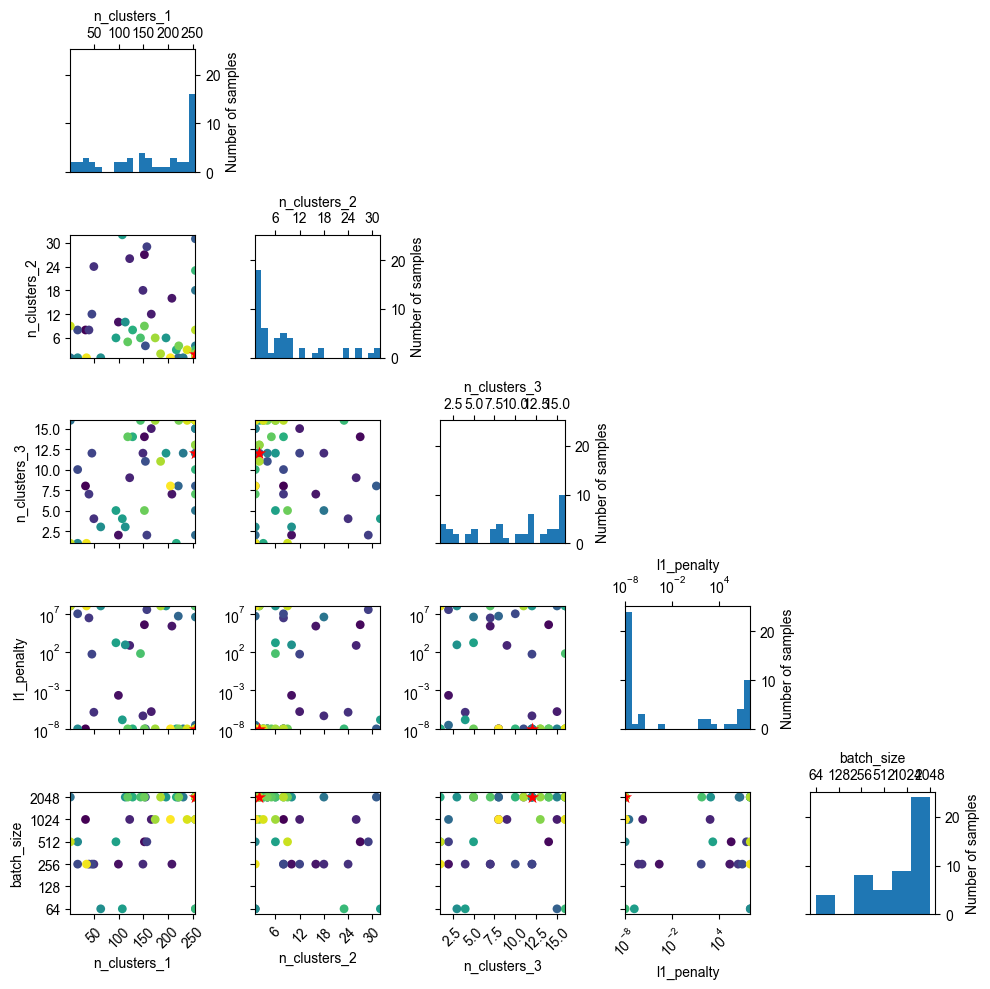

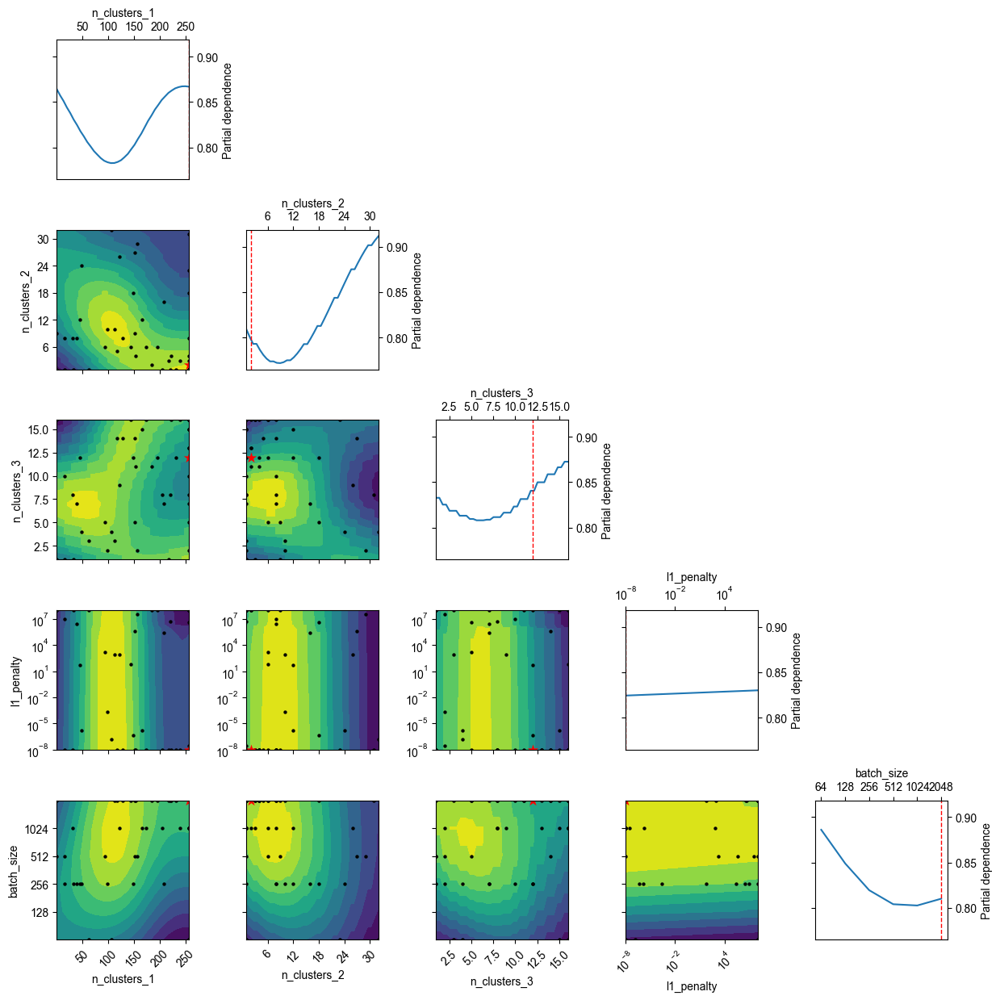

In [107]:
from skopt.plots import plot_evaluations, plot_objective
import skopt

path = "output/composite_database_03222024/2024-04-16-23-10-09-0_composite A811 mcd analysis/ThisWork/PHYSICS_NoPCA_3L_KMeans_skopt.pt"
res = skopt.load(path)
_=plot_evaluations(res)
_=plot_objective(res, size=2.5)

## Without derived relative features

In [21]:
trainer_rd_622_wo: FatigueTrainer = load_trainer("output/composite_database_03222024/2024-04-17-09-55-16-0_composite_no_relative_stress A622/trainer.pkl")
trainer_sc_622_wo: FatigueTrainer = load_trainer("output/composite_database_03222024/2024-07-16-04-07-45-0_composite_no_relative_stress B622/trainer.pkl")
trainer_et_622_wo: FatigueTrainer = load_trainer("output/composite_database_03222024/2024-04-20-16-02-23-0_composite_no_relative_stress C622/trainer.pkl")

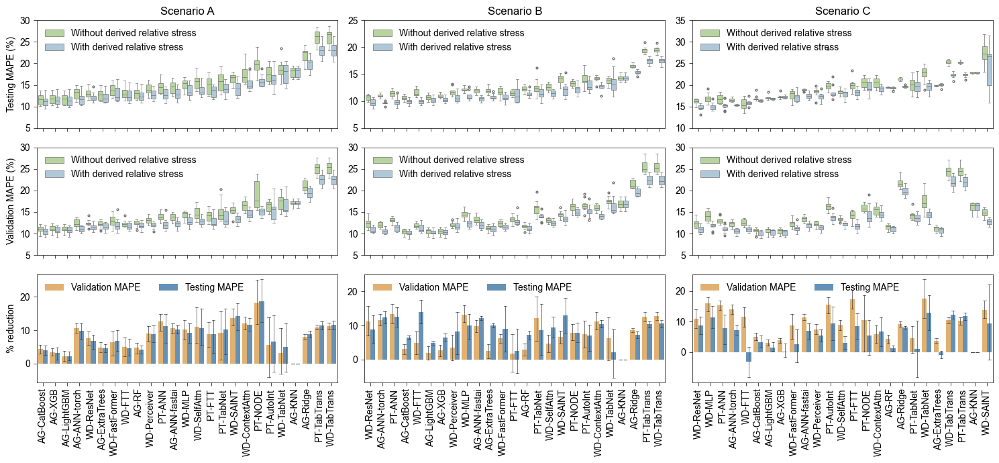

In [30]:
import seaborn as sns

def get_one_pair(trainer_w, trainer_wo):
    metrics = ["Validation MAPE", "Testing MAPE"]
    cv_path_w = os.path.join(trainer_w.project_root, "cv")
    cv_path_wo = os.path.join(trainer_wo.project_root, "cv")
    cv_names_w = [path for path in os.listdir(cv_path_w) if path.endswith(".csv")]
    cv_names_wo = [path for path in os.listdir(cv_path_wo) if path.endswith(".csv")]
    model_metrics = {}
    for cv_name_w, cv_name_wo in zip(cv_names_w, cv_names_wo):
        cv_w = pd.read_csv(os.path.join(cv_path_w, cv_name_w), index_col=0)
        cv_wo = pd.read_csv(os.path.join(cv_path_wo, cv_name_wo), index_col=0)
        cv_w.sort_values(by="Testing MAPE", inplace=True)
        cv_wo.sort_values(by="Testing MAPE", inplace=True)
        for program, model_name in zip(cv_wo["Program"], cv_wo["Model"]):
            metrics_wo = cv_wo[(cv_wo["Program"]==program) & (cv_wo["Model"]==model_name)][metrics]
            metrics_w = cv_w[(cv_w["Program"]==program) & (cv_w["Model"]==model_name)][metrics]
            metrics_wo["Category"] = "Without"
            metrics_w["Category"] = "With"
            if f"{program}-{model_name}" not in model_metrics.keys():
                model_metrics[f"{program}-{model_name}"] = []
            model_metrics[f"{program}-{model_name}"].append(pd.concat([metrics_wo, metrics_w]))
    for key in model_metrics.keys():
        model_metrics[key] = pd.concat(model_metrics[key])
        model_metrics[key]["Model"] = key
    df = pd.concat(list(model_metrics.values()))
    return df

def plot_one_compare_with_without(ax, metric, order=None):
    if order is None:
        df_ = df[df["Category"]=="With"][["Testing MAPE", "Model"]]
        names = np.unique(df_["Model"])
        vals = [np.median(df_.loc[df_["Model"]==x, "Testing MAPE"]) for x in names]
        order = names[np.argsort(vals)]
    sns.boxplot(data=df, x="Model", y=metric, hue="Category", ax=ax, palette=tabensemb.utils.global_palette[1:3], order=order, linewidth=0.5, flierprops=dict(linewidth=0.5), fliersize=2)
    replace_legend_labels(ax, {"With": "With derived relative stress", "Without": "Without derived relative stress"}, dict(loc="upper left", title=False, ncols=1, frameon=False))
    ax.set_xlabel(None)
    order = [x.get_text() for x in ax.get_xticklabels()]
    replace_feature_names(ax, special_mapping=modelbase_name_mapping)
    replace_feature_names(ax, special_mapping=model_name_mapping)
    ax.set_xlim([-0.5, 24.5])
    plt.setp(
        ax.get_xticklabels(),
        rotation=90,
        va="center",
        ha="right",
        rotation_mode="anchor",
    )
    multiply_yticklabels(ax)
    set_linewidth(ax)
    ax.set_ylabel(f"{metric} (%)")
    return order

def get_one_compare_improvement(metric):
    dfs_improv = []
    for model_name in np.unique(df["Model"]):
        metric_w = df[(df["Model"]==model_name) & (df["Category"]=="With")][metric].values.flatten()
        metric_wo = df[(df["Model"]==model_name) & (df["Category"]=="Without")][metric].values.flatten()
        improv = (metric_wo - metric_w)/metric_wo * 100
        _df = pd.DataFrame({f"% reduction": improv})
        _df["Model"] = model_name
        dfs_improv.append(_df)

    res = pd.concat(dfs_improv)
    res["Category"] = metric
    return res

def plot_one_compare_improvement(ax, res, order=None):
    sns.barplot(data=res, x="Model", y="% reduction", hue="Category", ax=ax, hue_order=["Validation MAPE", "Testing MAPE"], order=order, palette=[tabensemb.utils.global_palette[0], tabensemb.utils.global_palette[4]], linewidth=0, err_kws=dict(linewidth=0.5), capsize=0.5)
    ax.set_xlabel(None)
    replace_legend_labels(ax, {}, dict(loc="upper left", title=False, ncols=2, frameon=False))
    replace_feature_names(ax, special_mapping=modelbase_name_mapping)
    replace_feature_names(ax, special_mapping=model_name_mapping)
    plt.setp(
        ax.get_xticklabels(),
        rotation=90,
        va="center",
        ha="right",
        rotation_mode="anchor",
    )
    set_linewidth(ax)

plt.figure(figsize=(15, 7))
# plt.suptitle("Scenario A")
df = get_one_pair(trainer_w=trainer_rd_622, trainer_wo=trainer_rd_622_wo)
ax = plt.subplot(331)
ax.set_title("Scenario A")
order = plot_one_compare_with_without(ax, "Testing MAPE")
ax.set_xticklabels([])
ax = plt.subplot(334)
plot_one_compare_with_without(ax, "Validation MAPE", order=order)
ax.set_xticklabels([])
ax = plt.subplot(337)
plot_one_compare_improvement(ax, pd.concat([get_one_compare_improvement("Testing MAPE"), get_one_compare_improvement("Validation MAPE")]), order=order)

# plt.suptitle("Scenario B")
df = get_one_pair(trainer_w=trainer_sc_622, trainer_wo=trainer_sc_622_wo)
ax = plt.subplot(332)
ax.set_title("Scenario B")
order = plot_one_compare_with_without(ax, "Testing MAPE")
ax.set_xticklabels([])
ax.set_ylabel(None)
ax = plt.subplot(335)
plot_one_compare_with_without(ax, "Validation MAPE", order=order)
ax.set_xticklabels([])
ax.set_ylabel(None)
ax = plt.subplot(338)
plot_one_compare_improvement(ax, pd.concat([get_one_compare_improvement("Testing MAPE"), get_one_compare_improvement("Validation MAPE")]), order=order)
ax.set_ylabel(None)
ax.set_ylim(top=25)

# plt.suptitle("Scenario C")
df = get_one_pair(trainer_w=trainer_et_622, trainer_wo=trainer_et_622_wo)
ax = plt.subplot(333)
ax.set_title("Scenario C")
order = plot_one_compare_with_without(ax, "Testing MAPE")
ax.set_xticklabels([])
ax.set_ylabel(None)
ax = plt.subplot(336)
plot_one_compare_with_without(ax, "Validation MAPE", order=order)
ax.set_xticklabels([])
ax.set_ylabel(None)
ax = plt.subplot(339)
plot_one_compare_improvement(ax, pd.concat([get_one_compare_improvement("Testing MAPE"), get_one_compare_improvement("Validation MAPE")]), order=order)
ax.set_ylabel(None)
plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "relative_stress_effect.pdf"),dpi=500, bbox_inches="tight")
plt.show()
plt.close()

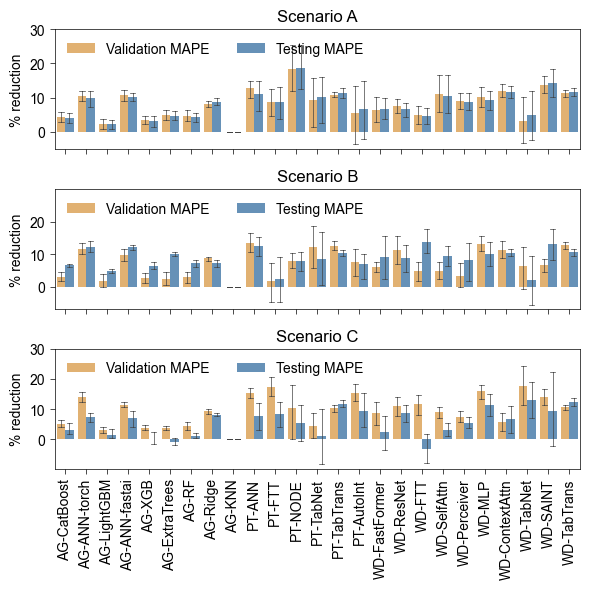

In [41]:
plt.figure(figsize=(6, 6))
from itertools import product
order = [f"{x}-{y}" for x,y in product(modelbase_name_mapping.keys(), model_name_mapping.keys())]
# plt.suptitle("Scenario A")
df = get_one_pair(trainer_w=trainer_rd_622, trainer_wo=trainer_rd_622_wo)
# print(order, df["Model"])
order = [x for x in order if x in list(df["Model"].values)]
ax = plt.subplot(311)
ax.set_title("Scenario A")
plot_one_compare_improvement(ax, pd.concat([get_one_compare_improvement("Testing MAPE"), get_one_compare_improvement("Validation MAPE")]), order=order)
ax.set_xticklabels([])
ax.set_ylim(top=30)
# plt.suptitle("Scenario B")
df = get_one_pair(trainer_w=trainer_sc_622, trainer_wo=trainer_sc_622_wo)
ax = plt.subplot(312)
ax.set_title("Scenario B")
plot_one_compare_improvement(ax, pd.concat([get_one_compare_improvement("Testing MAPE"), get_one_compare_improvement("Validation MAPE")]), order=order)
ax.set_ylim(top=30)
ax.set_xticklabels([])
# plt.suptitle("Scenario C")
df = get_one_pair(trainer_w=trainer_et_622, trainer_wo=trainer_et_622_wo)
ax = plt.subplot(313)
ax.set_title("Scenario C")
plot_one_compare_improvement(ax, pd.concat([get_one_compare_improvement("Testing MAPE"), get_one_compare_improvement("Validation MAPE")]), order=order)
ax.set_ylim(top=30)
# ax.set_xticklabels([])
plt.savefig(os.path.join(trainer.project_root, "relative_stress_effect_reduction_only.pdf"),dpi=500, bbox_inches="tight")
plt.show()
plt.close()

## Wrap or not (latent representation)

In [12]:
trainer_rd_622_nowrap: FatigueTrainer = load_trainer("output/composite_database_03222024/2024-04-29-21-01-40-0_composite-I2 nowrap A622/trainer.pkl")
trainer_sc_622_nowrap: FatigueTrainer = load_trainer("output/composite_database_03222024/2024-07-14-00-08-06-0_composite nowrap B622/trainer.pkl")
trainer_et_622_nowrap: FatigueTrainer = load_trainer("output/composite_database_03222024/2024-04-29-21-01-40-0_composite-I1 nowrap C622/trainer.pkl")

/tmp/ipykernel_8971/459123824.py:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=res, x="Model", y="% reduction", ax=ax, order=order, palette=tabensemb.utils.global_palette[2:3], linewidth=0, err_kws=dict(linewidth=0.5), capsize=0.5)
/tmp/ipykernel_8971/459123824.py:73: UserWarning: 
The palette list has fewer values (1) than needed (13) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=res, x="Model", y="% reduction", ax=ax, order=order, palette=tabensemb.utils.global_palette[2:3], linewidth=0, err_kws=dict(linewidth=0.5), capsize=0.5)
/tmp/ipykernel_8971/459123824.py:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=res, x="Model", y="% reduction",

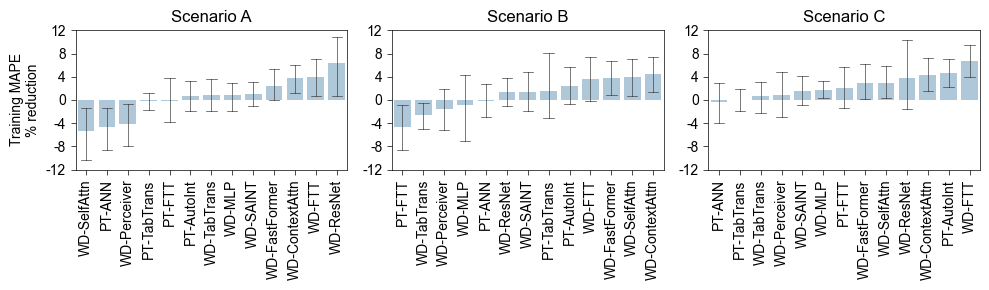

In [13]:
import seaborn as sns

def get_one_pair(trainer_w, trainer_wo):
    metrics = ["Training MAPE", "Validation MAPE", "Testing MAPE"]
    cv_path_w = os.path.join(trainer_w.project_root, "cv")
    cv_path_wo = os.path.join(trainer_wo.project_root, "cv")
    cv_names_w = [path for path in os.listdir(cv_path_w) if path.endswith(".csv")]
    cv_names_wo = [path for path in os.listdir(cv_path_wo) if path.endswith(".csv")]
    model_metrics = {}
    for cv_name_w, cv_name_wo in zip(cv_names_w, cv_names_wo):
        cv_w = pd.read_csv(os.path.join(cv_path_w, cv_name_w), index_col=0)
        cv_wo = pd.read_csv(os.path.join(cv_path_wo, cv_name_wo), index_col=0)
        cv_w.sort_values(by="Training MAPE", inplace=True)
        cv_wo.sort_values(by="Training MAPE", inplace=True)
        program = "ThisWork"
        for model_name in cv_w["Model"]:
            if "PHYSICS" in model_name:
                continue
            if "NoWrap" in model_name:
                continue
            metrics_wo = cv_wo[(cv_wo["Program"]==program) & (cv_wo["Model"]==model_name.replace("_Wrap", "_NoWrap"))][metrics]
            metrics_w = cv_w[(cv_w["Program"]==program) & (cv_w["Model"]==model_name)][metrics]
            metrics_wo["Category"] = "NoWrap"
            metrics_w["Category"] = "Wrap"
            key = "-".join(model_name.split("_")[:2])
            if key not in model_metrics.keys():
                model_metrics[key] = []
            model_metrics[key].append(pd.concat([metrics_wo, metrics_w]))
    for key in model_metrics.keys():
        model_metrics[key] = pd.concat(model_metrics[key])
        model_metrics[key]["Model"] = key
    df = pd.concat(list(model_metrics.values()))
    return df


def plot_one_compare_with_without(ax, metric, order=None, ylim=None):
    sns.boxplot(data=df, x="Model", y=metric, hue="Category", ax=ax, palette=tabensemb.utils.global_palette[0:2], order=order, linewidth=0.5, flierprops=dict(linewidth=0.5), fliersize=2)
    replace_legend_labels(ax, {"Wrap": "With latent representations", "NoWrap": "Without latent representations"}, dict(loc="upper left", title=False, ncols=1, frameon=False))
    ax.set_xlabel(None)
    order = [x.get_text() for x in ax.get_xticklabels()]
    replace_feature_names(ax, special_mapping=modelbase_name_mapping)
    replace_feature_names(ax, special_mapping=model_name_mapping)
    ax.set_xlim([-0.5, 12.5])
    if ylim is not None:
        ax.set_ylim(ylim)
    plt.setp(
        ax.get_xticklabels(),
        rotation=90,
        va="center",
        ha="right",
        rotation_mode="anchor",
    )
    set_linewidth(ax)
    ax.set_ylabel(f"{metric} (%)")
    multiply_yticklabels(ax)
    return order

def get_one_compare_improvement(metric):
    dfs_improv = []
    for model_name in np.unique(df["Model"]):
        metric_w = df[(df["Model"]==model_name) & (df["Category"]=="Wrap")][metric].values.flatten()
        metric_wo = df[(df["Model"]==model_name) & (df["Category"]=="NoWrap")][metric].values.flatten()
        improv = (metric_wo - metric_w)/metric_wo * 100
        _df = pd.DataFrame({f"% reduction": improv})
        _df["Model"] = model_name
        dfs_improv.append(_df)

    res = pd.concat(dfs_improv)
    res["Category"] = metric
    return res

def plot_one_compare_improvement(ax, res, order=None):
    sns.barplot(data=res, x="Model", y="% reduction", ax=ax, order=order, palette=tabensemb.utils.global_palette[2:3], linewidth=0, err_kws=dict(linewidth=0.5), capsize=0.5)
    ax.set_xlabel(None)
    # replace_legend_labels(ax, {}, dict(loc="upper left", title=False, ncols=2, frameon=False))
    replace_feature_names(ax, special_mapping=modelbase_name_mapping)
    replace_feature_names(ax, special_mapping=model_name_mapping)
    plt.setp(
        ax.get_xticklabels(),
        rotation=90,
        va="center",
        ha="right",
        rotation_mode="anchor",
    )
    set_linewidth(ax)

plt.figure(figsize=(10, 3.))
# plt.suptitle("Scenario A")
df = get_one_pair(trainer_w=trainer_rd_622, trainer_wo=trainer_rd_622_nowrap)
# ax = plt.subplot(431)
# ax.set_title("Scenario A")
# order = plot_one_compare_with_without(ax, "Training MAPE")
# ax.set_xticklabels([])
# ax = plt.subplot(434)
# plot_one_compare_with_without(ax, "Validation MAPE", order=order, ylim=[0.08, 0.17])
# ax.set_xticklabels([])
# ax = plt.subplot(437)
# plot_one_compare_with_without(ax, "Testing MAPE", order=order)
# ax.set_xticklabels([])
ax = plt.subplot(1,3,1)
ax.set_title("Scenario A")
improv = get_one_compare_improvement("Training MAPE")
plot_one_compare_improvement(ax, improv, order=improv.groupby(["Model"])['% reduction'].aggregate(np.mean).reset_index().sort_values('% reduction')["Model"])
ax.set_ylim([-12, 12])
ax.set_yticks(list(range(-12, 14, 4)))
ax.set_yticklabels(list(range(-12, 14, 4)))
ax.set_ylabel("Training MAPE\n% reduction")

# plt.suptitle("Scenario B")
df = get_one_pair(trainer_w=trainer_sc_622, trainer_wo=trainer_sc_622_nowrap)
# ax = plt.subplot(432)
# ax.set_title("Scenario B")
# order = plot_one_compare_with_without(ax, "Training MAPE", ylim=[0.04, 0.16])
# ax.set_xticklabels([])
# ax.set_ylabel(None)
# ax = plt.subplot(435)
# plot_one_compare_with_without(ax, "Validation MAPE", order=order)
# ax.set_xticklabels([])
# ax.set_ylabel(None)
# ax = plt.subplot(438)
# plot_one_compare_with_without(ax, "Testing MAPE", order=order, ylim=[0.08, 0.14])
# ax.set_xticklabels([])
# ax.set_ylabel(None)
ax = plt.subplot(1, 3, 2)
ax.set_title("Scenario B")
improv = get_one_compare_improvement("Training MAPE")
plot_one_compare_improvement(ax, improv, order=improv.groupby(["Model"])['% reduction'].aggregate(np.mean).reset_index().sort_values('% reduction')["Model"])
ax.set_ylim([-12, 12])
ax.set_yticks(list(range(-12, 14, 4)))
ax.set_yticklabels(list(range(-12, 14, 4)))
ax.set_ylabel(None)

# plt.suptitle("Scenario C")
df = get_one_pair(trainer_w=trainer_et_622, trainer_wo=trainer_et_622_nowrap)
# ax = plt.subplot(433)
# ax.set_title("Scenario C")
# order = plot_one_compare_with_without(ax, "Training MAPE")
# ax.set_xticklabels([])
# ax.set_ylabel(None)
# ax = plt.subplot(436)
# plot_one_compare_with_without(ax, "Validation MAPE", order=order)
# ax.set_xticklabels([])
# ax.set_ylabel(None)
# ax = plt.subplot(439)
# plot_one_compare_with_without(ax, "Testing MAPE", order=order)
# ax.set_xticklabels([])
# ax.set_ylabel(None)
ax = plt.subplot(1,3,3)
ax.set_title("Scenario C")
improv = get_one_compare_improvement("Training MAPE")
plot_one_compare_improvement(ax, improv, order=improv.groupby(["Model"])['% reduction'].aggregate(np.mean).reset_index().sort_values('% reduction')["Model"])
ax.set_ylim([-12, 12])
ax.set_yticks(list(range(-12, 14, 4)))
ax.set_yticklabels(list(range(-12, 14, 4)))
ax.set_ylabel(None)

plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "wrap_effect.pdf"),dpi=500, bbox_inches="tight")
plt.show()
plt.close()

In [229]:
get_one_compare_improvement("Training MAPE")

,% reduction,Model,Category
0,3.693390,PytorchTabular-AutoInt,Training MAPE
1,11.947191,PytorchTabular-AutoInt,Training MAPE
2,6.148497,PytorchTabular-AutoInt,Training MAPE
3,3.603174,PytorchTabular-AutoInt,Training MAPE
4,2.499862,PytorchTabular-AutoInt,Training MAPE
...,...,...,...
5,1.143892,WideDeep-TabTransformer,Training MAPE
6,-3.644692,WideDeep-TabTransformer,Training MAPE
7,-1.455948,WideDeep-TabTransformer,Training MAPE
8,3.838831,WideDeep-TabTransformer,Training MAPE


## Use raw feature instead of intermediate outcomes

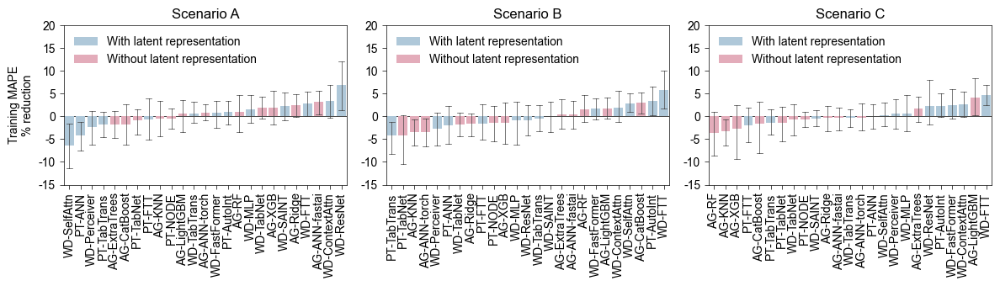

In [14]:
trainer_rd_622_use_raw: FatigueTrainer = load_trainer("output/composite_database_03222024/2024-06-25-23-49-03-0_composite-I1 A622 useraw/trainer.pkl")
trainer_sc_622_use_raw: FatigueTrainer = load_trainer("output/composite_database_03222024/2024-07-17-01-01-03-0_composite B622 useraw/trainer.pkl")
trainer_et_622_use_raw: FatigueTrainer = load_trainer("output/composite_database_03222024/2024-06-25-23-49-03-0_composite-I1-I1 C622 useraw/trainer.pkl")

import seaborn as sns

def get_one_pair(trainer_w, trainer_wo):
    metrics = ["Training MAPE", "Validation MAPE", "Testing MAPE"]
    cv_path_w = os.path.join(trainer_w.project_root, "cv")
    cv_path_wo = os.path.join(trainer_wo.project_root, "cv")
    cv_names_w = [path for path in os.listdir(cv_path_w) if path.endswith(".csv")]
    cv_names_wo = [path for path in os.listdir(cv_path_wo) if path.endswith(".csv")]
    model_metrics = {}
    for cv_name_w, cv_name_wo in zip(cv_names_w, cv_names_wo):
        cv_w = pd.read_csv(os.path.join(cv_path_w, cv_name_w), index_col=0)
        cv_wo = pd.read_csv(os.path.join(cv_path_wo, cv_name_wo), index_col=0)
        cv_w.sort_values(by="Training MAPE", inplace=True)
        cv_wo.sort_values(by="Training MAPE", inplace=True)
        program = "ThisWork"
        for model_name in cv_w["Model"]:
            if "PHYSICS" in model_name:
                continue
            # if "NoWrap" in model_name:
            #     continue
            metrics_wo = cv_wo[(cv_wo["Program"]==program) & (cv_wo["Model"]==model_name)][metrics]
            metrics_w = cv_w[(cv_w["Program"]==program) & (cv_w["Model"]==model_name)][metrics]
            metrics_wo["Category"] = "useraw"
            metrics_w["Category"] = "notuseraw"
            metrics_wo["Category_wrap"] = "With latent representation" if "_Wrap_" in model_name else "Without latent representation"
            metrics_w["Category_wrap"] = "With latent representation" if "_Wrap_" in model_name else "Without latent representation"
            key = "-".join(model_name.split("_")[:2])
            if key not in model_metrics.keys():
                model_metrics[key] = []
            model_metrics[key].append(pd.concat([metrics_wo, metrics_w]))
    for key in model_metrics.keys():
        model_metrics[key] = pd.concat(model_metrics[key])
        model_metrics[key]["Model"] = key
    df = pd.concat(list(model_metrics.values()))
    return df


# def plot_one_compare_with_without(ax, metric, order=None, ylim=None):
#     sns.barplot(data=df, x="Model", y=metric, hue="Category", ax=ax, palette=tabensemb.utils.global_palette[0:2], order=order, linewidth=0.5)
#     replace_legend_labels(ax, {"useraw": "Without intermediate outcomes", "notuseraw": "With intermediate outcomes"}, dict(loc="upper left", title=False, ncols=1, frameon=False))
#     ax.set_xlabel(None)
#     order = [x.get_text() for x in ax.get_xticklabels()]
#     replace_feature_names(ax, special_mapping=modelbase_name_mapping)
#     replace_feature_names(ax, special_mapping=model_name_mapping)
#     ax.set_xlim([-0.5, 12.5])
#     if ylim is not None:
#         ax.set_ylim(ylim)
#     plt.setp(
#         ax.get_xticklabels(),
#         rotation=90,
#         va="center",
#         ha="right",
#         rotation_mode="anchor",
#     )
#     set_linewidth(ax)
#     ax.set_ylabel(f"{metric} (%)")
#     # multiply_yticklabels(ax)
#     return order

def get_one_compare_improvement(metric):
    dfs_improv = []
    for model_name in np.unique(df["Model"]):
        metric_w = df[(df["Model"]==model_name) & (df["Category"]=="notuseraw")][metric].values.flatten()
        metric_wo = df[(df["Model"]==model_name) & (df["Category"]=="useraw")][metric].values.flatten()
        wrap = df[(df["Model"]==model_name) & (df["Category"]=="notuseraw")]["Category_wrap"].values.flatten()
        improv = (metric_wo - metric_w)/metric_wo * 100
        _df = pd.DataFrame({f"% reduction": improv, "wrap": wrap})
        _df["Model"] = model_name
        dfs_improv.append(_df)

    res = pd.concat(dfs_improv)
    res["Category"] = metric
    return res

def plot_one_compare_improvement(ax, res, order=None):
    sns.barplot(data=res, x="Model", y="% reduction", hue="wrap", ax=ax, order=order, hue_order=["With latent representation", "Without latent representation"], palette=tabensemb.utils.global_palette[2:4], linewidth=0, err_kws=dict(linewidth=0.5), capsize=0.5)
    ax.set_xlabel(None)
    xlim = ax.get_xlim()
    ax.plot(xlim, [0, 0], zorder=0, linewidth=0.5, color="k")
    ax.set_xlim(xlim)
    # ax.get_legend().remove()
    replace_legend_labels(ax, {}, dict(loc="upper left", title=False, ncols=1, frameon=False))
    replace_feature_names(ax, special_mapping=modelbase_name_mapping)
    replace_feature_names(ax, special_mapping=model_name_mapping)
    plt.setp(
        ax.get_xticklabels(),
        rotation=90,
        va="center",
        ha="right",
        rotation_mode="anchor",
    )
    set_linewidth(ax)


plt.figure(figsize=(12, 3.5))
# plt.suptitle("Scenario A")
df = get_one_pair(trainer_w=trainer_rd_622, trainer_wo=trainer_rd_622_use_raw)
# ax = plt.subplot(431)
# ax.set_title("Scenario A")
# order = plot_one_compare_with_without(ax, "Training MAPE", ylim=[0,0.15])
# ax.set_xticklabels([])
# ax = plt.subplot(434)
# plot_one_compare_with_without(ax, "Validation MAPE", order=order, ylim=[0, 0.2])
# ax.set_xticklabels([])
# ax = plt.subplot(437)
# plot_one_compare_with_without(ax, "Testing MAPE", order=order, ylim=[0, 0.2])
# ax.set_xticklabels([])
ax = plt.subplot(1,3,1)
ax.set_title("Scenario A")
improv = get_one_compare_improvement("Training MAPE")
plot_one_compare_improvement(ax, improv, order=improv.groupby(["Model"])['% reduction'].aggregate(np.mean).reset_index().sort_values('% reduction')["Model"])
ax.set_ylim([-15, 20])
ax.set_yticks([-15, -10, -5, 0, 5, 10, 15, 20])
ax.set_yticklabels([-15, -10, -5, 0, 5, 10, 15, 20])
ax.set_ylabel("Training MAPE\n% reduction")

df = get_one_pair(trainer_w=trainer_sc_622, trainer_wo=trainer_sc_622_use_raw)
# ax = plt.subplot(432)
# ax.set_title("Scenario B")
# order = plot_one_compare_with_without(ax, "Training MAPE", ylim=[0, 0.15])
# ax.set_xticklabels([])
# ax = plt.subplot(435)
# plot_one_compare_with_without(ax, "Validation MAPE", order=order, ylim=[0, 0.2])
# ax.set_xticklabels([])
# ax = plt.subplot(438)
# plot_one_compare_with_without(ax, "Testing MAPE", order=order, ylim=[0, 0.2])
# ax.set_xticklabels([])
ax = plt.subplot(1,3,2)
ax.set_title("Scenario B")
improv = get_one_compare_improvement("Training MAPE")
plot_one_compare_improvement(ax,improv, order=improv.groupby(["Model"])['% reduction'].aggregate(np.mean).reset_index().sort_values('% reduction')["Model"])
ax.set_ylim([-15, 20])
ax.set_yticks([-15, -10, -5, 0, 5, 10, 15, 20])
ax.set_yticklabels([-15, -10, -5, 0, 5, 10, 15, 20])
ax.set_ylabel(None)

df = get_one_pair(trainer_w=trainer_et_622, trainer_wo=trainer_et_622_use_raw)
# ax = plt.subplot(433)
# ax.set_title("Scenario C")
# order = plot_one_compare_with_without(ax, "Training MAPE", ylim=[0, 0.15])
# ax.set_xticklabels([])
# ax = plt.subplot(436)
# plot_one_compare_with_without(ax, "Validation MAPE", order=order, ylim=[0, 0.2])
# ax.set_xticklabels([])
# ax = plt.subplot(439)
# plot_one_compare_with_without(ax, "Testing MAPE", order=order, ylim=[0, 0.3])
# ax.set_xticklabels([])
ax = plt.subplot(1,3,3)
ax.set_title("Scenario C")
improv = get_one_compare_improvement("Training MAPE")
plot_one_compare_improvement(ax, improv, order=improv.groupby(["Model"])['% reduction'].aggregate(np.mean).reset_index().sort_values('% reduction')["Model"])
ax.set_ylim([-15, 20])
ax.set_yticks([-15, -10, -5, 0, 5, 10, 15, 20])
ax.set_yticklabels([-15, -10, -5, 0, 5, 10, 15, 20])
ax.set_ylabel(None)

plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "intermediate_effect.pdf"),dpi=500, bbox_inches="tight")
plt.show()
plt.close()

/tmp/ipykernel_8971/2315842156.py:80: UserWarning: The palette list has more values (3) than needed (2), which may not be intended.
  sns.barplot(data=res, x="Model", y="% reduction", hue="Category", ax=ax, order=order, hue_order=[ "Validation MAPE", "Testing MAPE"], palette=tabensemb.utils.global_palette[2:5], linewidth=0, err_kws=dict(linewidth=0.5), capsize=0.5)
/tmp/ipykernel_8971/2315842156.py:80: UserWarning: The palette list has more values (3) than needed (2), which may not be intended.
  sns.barplot(data=res, x="Model", y="% reduction", hue="Category", ax=ax, order=order, hue_order=[ "Validation MAPE", "Testing MAPE"], palette=tabensemb.utils.global_palette[2:5], linewidth=0, err_kws=dict(linewidth=0.5), capsize=0.5)
/tmp/ipykernel_8971/2315842156.py:80: UserWarning: The palette list has more values (3) than needed (2), which may not be intended.
  sns.barplot(data=res, x="Model", y="% reduction", hue="Category", ax=ax, order=order, hue_order=[ "Validation MAPE", "Testing MAPE

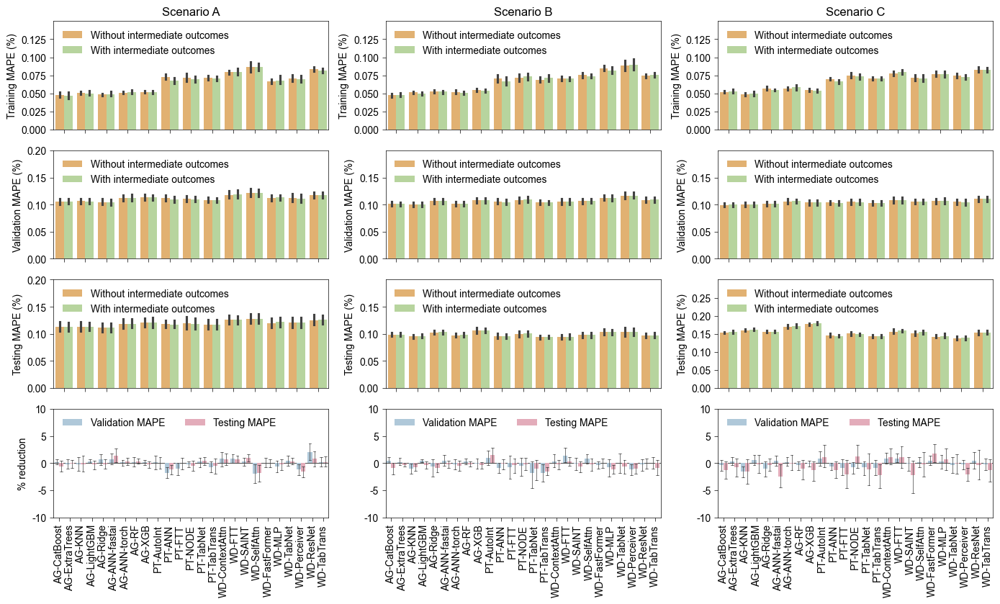

In [15]:
trainer_rd_622_use_raw: FatigueTrainer = load_trainer("output/composite_database_03222024/2024-06-25-23-49-03-0_composite-I1 A622 useraw/trainer.pkl")
trainer_sc_622_use_raw: FatigueTrainer = load_trainer("output/composite_database_03222024/2024-07-17-01-01-03-0_composite B622 useraw/trainer.pkl")
trainer_et_622_use_raw: FatigueTrainer = load_trainer("output/composite_database_03222024/2024-06-25-23-49-03-0_composite-I1-I1 C622 useraw/trainer.pkl")

import seaborn as sns

def get_one_pair(trainer_w, trainer_wo):
    metrics = ["Training MAPE", "Validation MAPE", "Testing MAPE"]
    cv_path_w = os.path.join(trainer_w.project_root, "cv")
    cv_path_wo = os.path.join(trainer_wo.project_root, "cv")
    cv_names_w = [path for path in os.listdir(cv_path_w) if path.endswith(".csv")]
    cv_names_wo = [path for path in os.listdir(cv_path_wo) if path.endswith(".csv")]
    model_metrics = {}
    for cv_name_w, cv_name_wo in zip(cv_names_w, cv_names_wo):
        cv_w = pd.read_csv(os.path.join(cv_path_w, cv_name_w), index_col=0)
        cv_wo = pd.read_csv(os.path.join(cv_path_wo, cv_name_wo), index_col=0)
        cv_w.sort_values(by="Training MAPE", inplace=True)
        cv_wo.sort_values(by="Training MAPE", inplace=True)
        program = "ThisWork"
        for model_name in cv_w["Model"]:
            if "PHYSICS" in model_name:
                continue
            # if "NoWrap" in model_name:
            #     continue
            metrics_wo = cv_wo[(cv_wo["Program"]==program) & (cv_wo["Model"]==model_name)][metrics]
            metrics_w = cv_w[(cv_w["Program"]==program) & (cv_w["Model"]==model_name)][metrics]
            metrics_wo["Category"] = "useraw"
            metrics_w["Category"] = "notuseraw"
            metrics_wo["Category_wrap"] = "With latent representation" if "_Wrap_" in model_name else "Without latent representation"
            metrics_w["Category_wrap"] = "With latent representation" if "_Wrap_" in model_name else "Without latent representation"
            key = "-".join(model_name.split("_")[:2])
            if key not in model_metrics.keys():
                model_metrics[key] = []
            model_metrics[key].append(pd.concat([metrics_wo, metrics_w]))
    for key in model_metrics.keys():
        model_metrics[key] = pd.concat(model_metrics[key])
        model_metrics[key]["Model"] = key
    df = pd.concat(list(model_metrics.values()))
    return df


def plot_one_compare_with_without(ax, metric, order=None, ylim=None):
    sns.barplot(data=df, x="Model", y=metric, hue="Category", ax=ax, palette=tabensemb.utils.global_palette[0:2], order=order, linewidth=0.5)
    replace_legend_labels(ax, {"useraw": "Without intermediate outcomes", "notuseraw": "With intermediate outcomes"}, dict(loc="upper left", title=False, ncols=1, frameon=False))
    ax.set_xlabel(None)
    order = [x.get_text() for x in ax.get_xticklabels()]
    replace_feature_names(ax, special_mapping=modelbase_name_mapping)
    replace_feature_names(ax, special_mapping=model_name_mapping)
    ax.set_xlim([-0.5, 12.5])
    if ylim is not None:
        ax.set_ylim(ylim)
    plt.setp(
        ax.get_xticklabels(),
        rotation=90,
        va="center",
        ha="right",
        rotation_mode="anchor",
    )
    set_linewidth(ax)
    ax.set_ylabel(f"{metric} (%)")
    # multiply_yticklabels(ax)
    return order

def get_one_compare_improvement(metric):
    dfs_improv = []
    for model_name in np.unique(df["Model"]):
        metric_w = df[(df["Model"]==model_name) & (df["Category"]=="notuseraw")][metric].values.flatten()
        metric_wo = df[(df["Model"]==model_name) & (df["Category"]=="useraw")][metric].values.flatten()
        wrap = df[(df["Model"]==model_name) & (df["Category"]=="notuseraw")]["Category_wrap"].values.flatten()
        improv = (metric_wo - metric_w)/metric_wo * 100
        _df = pd.DataFrame({f"% reduction": improv, "wrap": wrap})
        _df["Model"] = model_name
        dfs_improv.append(_df)

    res = pd.concat(dfs_improv)
    res["Category"] = metric
    return res

def plot_one_compare_improvement(ax, res, order=None):
    sns.barplot(data=res, x="Model", y="% reduction", hue="Category", ax=ax, order=order, hue_order=[ "Validation MAPE", "Testing MAPE"], palette=tabensemb.utils.global_palette[2:5], linewidth=0, err_kws=dict(linewidth=0.5), capsize=0.5)
    ax.set_xlabel(None)
    xlim = ax.get_xlim()
    ax.plot(xlim, [0, 0], zorder=0, linewidth=0.5, color="k")
    ax.set_xlim(xlim)
    # ax.get_legend().remove()
    replace_legend_labels(ax, {}, dict(loc="upper left", title=False, ncols=2, frameon=False))
    replace_feature_names(ax, special_mapping=modelbase_name_mapping)
    replace_feature_names(ax, special_mapping=model_name_mapping)
    plt.setp(
        ax.get_xticklabels(),
        rotation=90,
        va="center",
        ha="right",
        rotation_mode="anchor",
    )
    set_linewidth(ax)


plt.figure(figsize=(14, 8.5))
# plt.suptitle("Scenario A")
df = get_one_pair(trainer_w=trainer_rd_622, trainer_wo=trainer_rd_622_use_raw)
ax = plt.subplot(431)
ax.set_title("Scenario A")
order = plot_one_compare_with_without(ax, "Training MAPE", ylim=[0,0.15])
ax.set_xticklabels([])
ax = plt.subplot(434)
plot_one_compare_with_without(ax, "Validation MAPE", order=order, ylim=[0, 0.2])
ax.set_xticklabels([])
ax = plt.subplot(437)
plot_one_compare_with_without(ax, "Testing MAPE", order=order, ylim=[0, 0.2])
ax.set_xticklabels([])
ax = plt.subplot(4,3,10)
# ax.set_title("Scenario A")
plot_one_compare_improvement(ax, pd.concat([get_one_compare_improvement("Training MAPE"), get_one_compare_improvement("Validation MAPE"), get_one_compare_improvement("Testing MAPE")]))
ax.set_ylim([-10, 10])
ax.set_yticks([-10, -5, 0, 5, 10])
ax.set_yticklabels([-10, -5, 0, 5, 10])
ax.set_ylabel("% reduction")

df = get_one_pair(trainer_w=trainer_sc_622, trainer_wo=trainer_sc_622_use_raw)
ax = plt.subplot(432)
ax.set_title("Scenario B")
order = plot_one_compare_with_without(ax, "Training MAPE", ylim=[0, 0.15])
ax.set_xticklabels([])
ax = plt.subplot(435)
plot_one_compare_with_without(ax, "Validation MAPE", order=order, ylim=[0, 0.2])
ax.set_xticklabels([])
ax = plt.subplot(438)
plot_one_compare_with_without(ax, "Testing MAPE", order=order, ylim=[0, 0.2])
ax.set_xticklabels([])
ax = plt.subplot(4,3,11)
# ax.set_title("Scenario B")
plot_one_compare_improvement(ax, pd.concat([get_one_compare_improvement("Training MAPE"), get_one_compare_improvement("Validation MAPE"), get_one_compare_improvement("Testing MAPE")]))
ax.set_ylim([-10, 10])
ax.set_yticks([-10, -5, 0, 5, 10])
ax.set_yticklabels([-10, -5, 0, 5, 10])
ax.set_ylabel(None)

df = get_one_pair(trainer_w=trainer_et_622, trainer_wo=trainer_et_622_use_raw)
ax = plt.subplot(433)
ax.set_title("Scenario C")
order = plot_one_compare_with_without(ax, "Training MAPE", ylim=[0, 0.15])
ax.set_xticklabels([])
ax = plt.subplot(436)
plot_one_compare_with_without(ax, "Validation MAPE", order=order, ylim=[0, 0.2])
ax.set_xticklabels([])
ax = plt.subplot(439)
plot_one_compare_with_without(ax, "Testing MAPE", order=order, ylim=[0, 0.3])
ax.set_xticklabels([])
ax = plt.subplot(4,3,12)
# ax.set_title("Scenario C")
plot_one_compare_improvement(ax, pd.concat([get_one_compare_improvement("Training MAPE"), get_one_compare_improvement("Validation MAPE"), get_one_compare_improvement("Testing MAPE")]))
ax.set_ylim([-10, 10])
ax.set_yticks([-10, -5, 0, 5, 10])
ax.set_yticklabels([-10, -5, 0, 5, 10])
ax.set_ylabel(None)

plt.tight_layout()
plt.savefig(os.path.join(trainer.project_root, "intermediate_effect_all.pdf"),dpi=500, bbox_inches="tight")
plt.show()
plt.close()